# **Time Series Forecasting of Stock Prices using LSTM, CNN, and FNN Models**

**Authors**: Tyler Burguillos, Austin Nolte, Alan Lei, Nishan Majarjan  
**Course**: CSC 180 - Intelligent Systems (Fall 2024)  
**Assignment**: Project 4 - Time Series Forecasting  
**Due Date**: November 6, 2024  

## **Problem Statement**

In this project, the goal is to predict **stock prices** using historical time-series data. We focus on predicting the **next day's closing price** based on the previous 7 days of stock data, including features such as `Open`, `High`, `Low`, `Close`, and `Volume`.

Three different machine learning models will be developed:  
1. **Fully-Connected Neural Networks (FNN)**  
2. **Convolutional Neural Networks (CNN)**  
3. **Long Short-Term Memory Networks (LSTM)**  

The project will also include **hyperparameter tuning** and **performance evaluation** using metrics such as **Root Mean Square Error (RMSE)**.

This project aims to:
- Identify the model that achieves the **lowest RMSE** for stock price forecasting.
- Demonstrate the benefits of LSTM models in time-series forecasting by comparing them to CNN and FNN models.
- Explore the effect of feature engineering (e.g., rolling statistics) on the models' performance.

Optional enhancements may include multi-output forecasting to predict **multiple days ahead** or experimenting with **bidirectional LSTM models** for improved predictions.

## EDA - Key Insights

Exploratory Data Analysis (EDA) is a crucial first step in understanding our data before diving into modeling. It helps us identify patterns, spot outliers, and decide which features could be the most useful in predicting stock prices. Our interest in using EDA came from exploring different datasets for our final project, where we noticed that it could really improve our understanding of which features are likely to be valuable.

We learned a lot about EDA from resources like [Analytics Vidhya](https://www.analyticsvidhya.com/blog/2021/08/how-to-perform-exploratory-data-analysis-a-guide-for-beginners/#h-why-eda-is-important), which highlights the importance of EDA for feature selection. Additionally, guides like the [Handbook of Hidden Data Scientist](https://ondrej-kvasnovsky-2.gitbook.io/handbook-of-hidden-data-scientist-python/statistical-analysis/rolling-statistics) and [DelftStack](https://www.delftstack.com/howto/python-pandas/pandas-rolling-standard-deviation/) showed us how to calculate rolling statistics like mean and standard deviation. These resources were really helpful for guiding our EDA process and understanding how our features might impact stock price predictions.

**Loading the Data and Printing the Basic Statistics and Info**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import os

# Load the Google Stock Data
google_dataset = "/content/drive/My Drive/Project4/GOOG.csv"
names=['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume']
df_google = pd.read_csv(google_dataset)

# Drop Unnecessary Columns
df_google = df_google.drop(['Date', 'Adj Close'], axis=1)

# Basic Statistics for Entire Dataset
print("Google Stock Data - Overview\n")
print(f"{df_google.info()}\n")
print(df_google.describe())

# Tyler Burguillos 10/28/24

Google Stock Data - Overview

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3578 entries, 0 to 3577
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Open    3578 non-null   float64
 1   High    3578 non-null   float64
 2   Low     3578 non-null   float64
 3   Close   3578 non-null   float64
 4   Volume  3578 non-null   int64  
dtypes: float64(4), int64(1)
memory usage: 139.9 KB
None

              Open         High          Low        Close        Volume
count  3578.000000  3578.000000  3578.000000  3578.000000  3.578000e+03
mean    433.909542   437.777243   429.715984   433.812217  7.564488e+06
std     287.848381   289.973679   285.651057   287.907567  8.256777e+06
min      49.274517    50.541279    47.669952    49.681866  7.900000e+03
25%     231.627236   234.237755   229.272557   231.623513  2.082125e+06
50%     302.934692   305.733993   300.115524   303.014175  4.832400e+06
75%     579.004517   582.007279   573.42202

In [ ]:
# Checking for Missing Values
print("\nMissing Values in Google Stock Data:")
print(df_google.isnull().sum())

# Tyler Burguillos 10/28/24


Missing Values in Google Stock Data:
Open      0
High      0
Low       0
Close     0
Volume    0
dtype: int64


**Entire Google Stock Dataset Analysis**


- The data has **3,578 rows** and **5 columns**: `Open`, `High`, `Low`, `Close`, and `Volume`.
- **No missing values**—so we’re good to start modeling right away!

**Visualizing the Entire Dataset**

Here we plotted the entire `Close` price history to identify general trends and patterns.

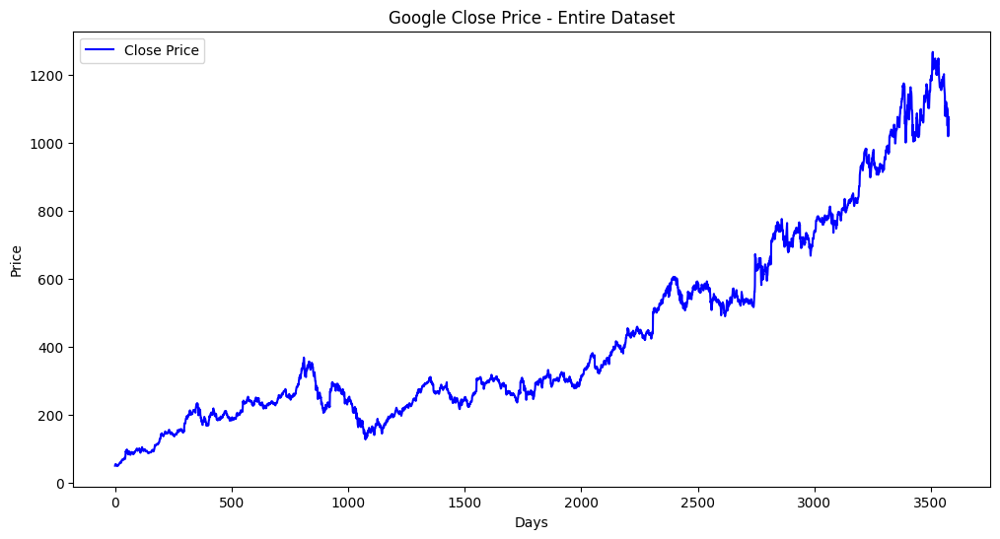

In [ ]:
import matplotlib.pyplot as plt

# Visualizing the Entire Dataset Trends
plt.figure(figsize=(12, 6))
plt.plot(df_google['Close'], label='Close Price', color='blue')
plt.title('Google Close Price - Entire Dataset')
plt.xlabel('Days')
plt.ylabel('Price')
plt.legend()
plt.show()

# Tyler Burguillos 10/28/24

**Close Price Trends Analysis**

The overall trend shows steady growth, with a few bumpy parts along the way. It's good to see that the stock price kept increasing over time, with the peak going above 1200. These patterns tell us it might help to add rolling averages and volatility stats as features for our models. That way, we can account for both smooth trends and sudden jumps.

**Calculating Rolling Statistics**

Here we calculated the 7-day rolling mean and standard deviation to track price trends and volatility over time.

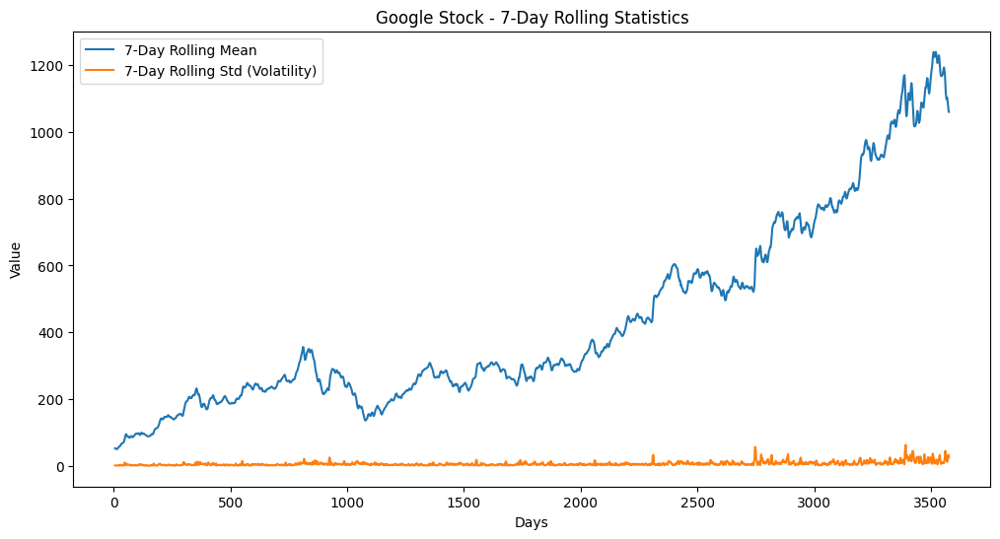

In [ ]:
# Rolling Statistics (Volatility)
df_google['Rolling_Mean'] = df_google['Close'].rolling(window=7).mean()
df_google['Rolling_Std'] = df_google['Close'].rolling(window=7).std()

# Plot Rolling Mean and Volatility
plt.figure(figsize=(12, 6))
plt.plot(df_google['Rolling_Mean'], label='7-Day Rolling Mean')
plt.plot(df_google['Rolling_Std'], label='7-Day Rolling Std (Volatility)')
plt.title('Google Stock - 7-Day Rolling Statistics')
plt.xlabel('Days')
plt.ylabel('Value')
plt.legend()
plt.show()

# Tyler Burguillos 10/28/24

**Analysis of 7-Day Rolling Statistics**

The 7-day rolling mean **(blue line)** shows that Google's stock price generally increases, with a few dips along the way. The rolling standard deviation **(orange line)** stays low most of the time, meaning the price doesn't fluctuate wildly, but there are occasional spikes. This consistent growth with some small jumps in volatility suggests that LSTM models could work well, especially since they handle time-series patterns and trends effectively.

**Last 7 Days Data**

Here we extracted the most recent 7 days of data for a more focused analysis.

In [ ]:
# Last 7 Days Data
df_google_last7 = df_google.tail(7)
print("\nLast 7 Days of Google Stock Data:")
print(df_google_last7)

# Tyler Burguillos 10/28/24


Last 7 Days of Google Stock Data:
             Open         High          Low        Close   Volume  \
3571  1104.250000  1106.119995  1048.739990  1050.709961  1982400   
3572  1071.790039  1110.979980  1069.550049  1095.569946  2545800   
3573  1037.030029  1106.530029  1034.089966  1071.469971  4187600   
3574  1082.469971  1097.040039   995.830017  1020.080017  3880700   
3575  1008.460022  1037.489990  1000.750000  1036.209961  3212700   
3576  1059.810059  1091.939941  1057.000000  1076.770020  2529800   
3577  1075.800049  1083.974976  1062.459961  1070.000000  1461600   

      Rolling_Mean  Rolling_Std  
3571   1096.708548    23.183691  
3572   1093.035679    20.526447  
3573   1086.718541    19.150851  
3574   1077.019976    31.573254  
3575   1068.412833    33.541482  
3576   1064.928545    30.720969  
3577   1060.115697    25.896580  


**Analysis of the Last 7 Days of Google Stock Data**

**Key Observations**:
- **Slight Downtrend**: The rolling mean dropped from 1096 to 1060, suggesting a small decline in recent days.
-**Volume Peaks and Drops**: Volume increased mid-week before dropping off. This pattern might relect changing market interests, which could help the models predict shifts.

**Box Plot for Last 7 Days**

Here we used box plots to visualize the distribution and spread of `Open`, `High`, `Low`, and `Close` prices over the last 7 days.

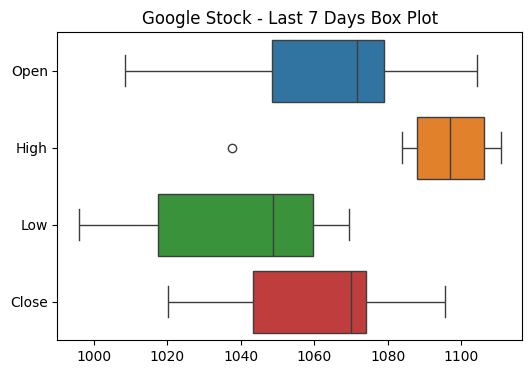

In [ ]:
import seaborn as sns

# Box Plot for Last 7 Days
plt.figure(figsize=(6, 4))
sns.boxplot(data=df_google_last7[['Open', 'High', 'Low', 'Close']], orient='h')
plt.title('Google Stock - Last 7 Days Box Plot')
plt.show()

# Tyler Burguillos 10/28/24

**Analysis of The Last 7 Days Box Plot**

This box plot gives a quick view of how Google’s stock prices moved over the last 7 days. The **Open** prices show more ups and downs compared to the **Close** prices, meaning there was more action in the mornings. The **High** prices stay pretty consistent, except for one outlier where the stock hit an unusually high peak on one day. The **Low** prices are more spread out, showing that intraday lows varied quite a bit. Since we’re using all 7 days in our analysis, we’ll keep the outlier in the dataset. This mix of trends and outliers is important for our models to learn from, so they can forecast more accurately.

**Correlation Matrix**

We use this to analyze the relationship between different features, which helps determine whether any features can be excluded or transformed.

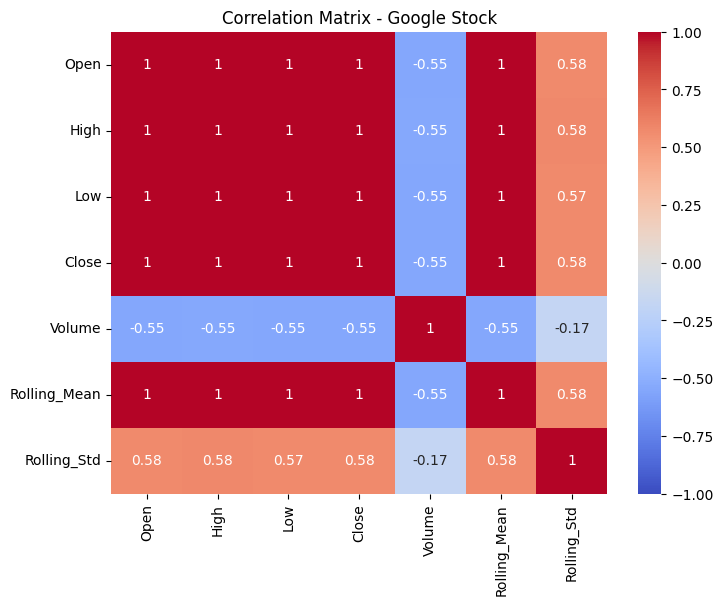

In [ ]:
# Correlation Matrix
correlation_matrix = df_google[['Open', 'High', 'Low', 'Close', 'Volume',
                                'Rolling_Mean', 'Rolling_Std']].corr()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix - Google Stock')
plt.show()

# Tyler Burguillos 10/28/24

**Correlation Matrix Analysis**

- **Strong correlations** between price-related columns like `Open`, `High`, and `Close`) mean we might not need all of them in the model.
- **Volume** is negatively correlated with prices (-0.55). Including it could give the model extra insight, especially during periods of high market activity.
- **Volatility (Rolling_Std)** has a small positive correlation with prices, so it might help capture sudden shifts.

**Volume Analysis**

Here we visualized the trading volume over the last 7 days to identify any unusual spikes or dips.

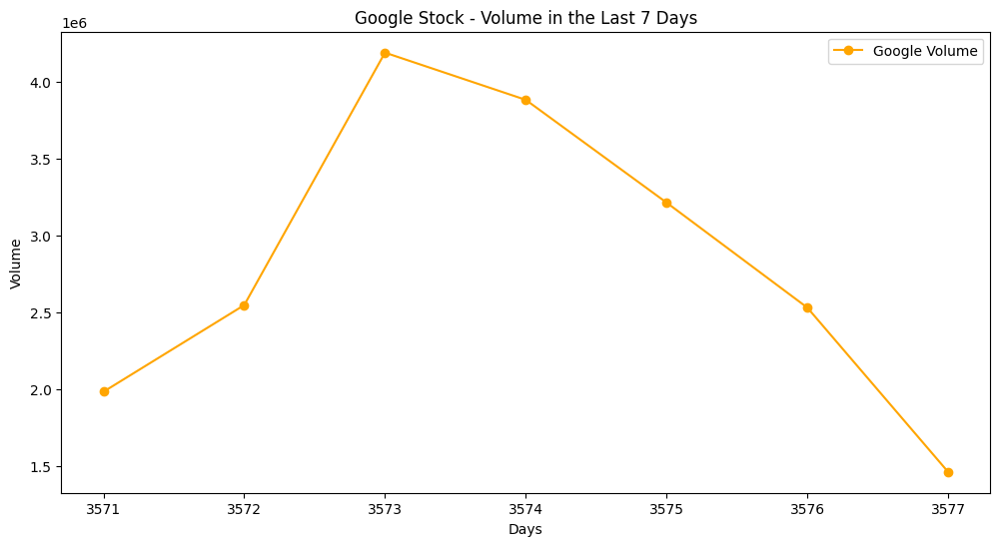

In [ ]:
# Volume Analysis for the Last 7 Days
plt.figure(figsize=(12, 6))
plt.plot(df_google_last7['Volume'], marker='o', color='orange', label='Google Volume')
plt.title('Google Stock - Volume in the Last 7 Days')
plt.xlabel('Days')
plt.ylabel('Volume')
plt.legend()
plt.show()

# Tyler Burguillos 10/28/24

**Analysis of Volume in the Last 7 Days**

- Volume started low, peaked mid-week, and then dropped towards the end.  
- This could reflect market reactions to events that happened during the week. Adding volume to the model might help it anticipate these kinds of patterns.


**How These Insights Help Model Building**

These observations guide our feature engineering decisions. Since the variability (as shown in the spread of data and outliers) seems more critical than trends, **rolling averages may not be necessary**. Instead, capturing **volatility** directly will likely provide better insights. We’ll include:

1. **Volatility (e.g., standard deviation)** to capture day-to-day variability.
2. **Volume** as a feature, since it offers unique insights apart from price changes.
3. Handle **outliers carefully** by keeping them to preserve data integrity but ensure they don’t skew model predictions.

With these insights, we’re ready to move on to **normalizing and preprocessing** the data, setting the stage for building and testing our FNN, CNN, and LSTM models!

## Data Preparation (7 Days)

We began by dropping the `Rolling_Mean` and `Rolling_Std` columns added in our EDA phase, as they were no longer needed in that form. We reintroduced `Rolling_Std` as `Volatility`, using `min_periods=1` to backfill NaN values within the first 7-day rolling standard deviation. For any remaining NaN values at index 0, we filled them with zero to ensure compatibility in downstream processing.

Next, we normalized the input features by applying the professor's provided `encode_numeric_range` function to perform Min-Max scaling within the range [0, 1]. This normalization step helps stabilize model training by keeping features within a consistent range. Finally, we split the dataset and generated sequences to match the input format required by the LSTM model, ensuring compatibility and optimizing training efficiency.

In [ ]:
import numpy as np

# Drop rolling columns added in EDA phase
df_google.drop(['Rolling_Mean', 'Rolling_Std'], axis=1, inplace=True)

# # Add a 7-day rolling standard deviation (Volatility) to the data
df_google['Volatility'] = df_google['Close'].rolling(window=7, min_periods=1).std()

# Fill NaN values with 0.0
df_google['Volatility'] = df_google['Volatility'].fillna(0.0)

# Confirm that the Volatility column is correctly calculated
print(df_google.head(10))

# Tyler Burguillos 10/29/24

        Open       High        Low      Close    Volume  Volatility
0  49.676899  51.693783  47.669952  49.845802  44994500    0.000000
1  50.178635  54.187561  49.925285  53.805050  23005800    2.799611
2  55.017166  56.373344  54.172661  54.346527  18393200    2.457145
3  55.260582  55.439419  51.450363  52.096165  15361800    2.026366
4  52.140873  53.651051  51.604362  52.657513   9257400    1.755909
5  52.135906  53.626213  51.991844  53.606342   7148200    1.628642
6  53.700729  53.959049  52.503513  52.732029   6258300    1.486742
7  52.299839  52.404160  50.675404  50.675404   5235700    1.229616
8  50.819469  51.519913  50.749920  50.854240   4954800    1.346147
9  51.018177  51.152302  49.512966  49.801090   9206800    1.360449


In [ ]:
# Normalize input features, including `Close` (this is part of the input data)
def encode_numeric_range(df, name, normalized_low=0, normalized_high=1,
                         data_low=None, data_high=None):
    if data_low is None:
        data_low = df[name].min()
        data_high = df[name].max()
    df[name] = ((df[name] - data_low) / (data_high - data_low)) * \
               (normalized_high - normalized_low) + normalized_low

# Create a separate, unnormalized copy of the 'Close' column for target use
df_google['Close_target'] = df_google['Close']  # Copy for unnormalized target

# List of columns to normalize (including 'Close')
columns_to_normalize = ['Open', 'High', 'Low', 'Volume', 'Volatility', 'Close']
for col in columns_to_normalize:
    encode_numeric_range(df_google, col)

# Verify the normalized values
print(df_google.head())

# Tyler Burguillos 10/29/24

       Open      High       Low     Close    Volume  Volatility  Close_target
0  0.000329  0.000942  0.000000  0.000135  0.543578    0.000000     49.845802
1  0.000740  0.002981  0.001877  0.003383  0.277886    0.044541     53.805050
2  0.004700  0.004767  0.005413  0.003828  0.222151    0.039092     54.346527
3  0.004900  0.004004  0.003147  0.001981  0.185523    0.032239     52.096165
4  0.002346  0.002542  0.003275  0.002442  0.111763    0.027936     52.657513


In [ ]:
# Split into training and test sets (70/30 split) - retain `Close` in input
split_index = int(len(df_google) * 0.7)
df_train_no_vol = df_google[['Open', 'High', 'Low', 'Volume', 'Close']][:split_index]
df_test_no_vol = df_google[['Open', 'High', 'Low', 'Volume', 'Close']][split_index:]

df_train_with_vol = df_google[['Open', 'High', 'Low', 'Volume', 'Volatility', 'Close']][:split_index]
df_test_with_vol = df_google[['Open', 'High', 'Low', 'Volume', 'Volatility', 'Close']][split_index:]

# Extract target variable `Close` (unnormalized)
y_train_no_vol = df_google['Close_target'][:split_index].values  # Use unnormalized values for target
y_test_no_vol = df_google['Close_target'][split_index:].values

y_train_with_vol = df_google['Close_target'][:split_index].values
y_test_with_vol = df_google['Close_target'][split_index:].values

# Drop 'Close_target' from the dataframe after splitting
df_google.drop(columns=['Close_target'], inplace=True)

# Print to confirm the original (target) 'Close' values haven't changed
print("\nSample of target Close values (as output, should be unnormalized):")
print(y_train_no_vol[:5])
print(y_train_with_vol[:5])

# Print the number of records to confirm
print(f"Training set (no vol) has {len(df_train_no_vol)} records.")
print(f"Test set (no vol) has {len(df_test_no_vol)} records.")
print(f"Training set (with vol) has {len(df_train_with_vol)} records.")
print(f"Test set (with vol) has {len(df_test_with_vol)} records.")

# Tyler Burguillos 10/29/24


Sample of target Close values (as output, should be unnormalized):
[49.845802 53.80505  54.346527 52.096165 52.657513]
[49.845802 53.80505  54.346527 52.096165 52.657513]
Training set (no vol) has 2504 records.
Test set (no vol) has 1074 records.
Training set (with vol) has 2504 records.
Test set (with vol) has 1074 records.


In [ ]:
# Generate sequences for LSTM input format
def to_sequences(seq_size, data, target):
    X, y = [], []
    for i in range(len(data) - seq_size):
        X.append(data[i:i + seq_size])
        y.append(target[i + seq_size])
    return np.array(X, dtype=np.float32), np.array(y, dtype=np.float32)

# Sequence size
SEQUENCE_SIZE = 7

# Generate sequences for the no-volatility dataset
X_train_no_vol, y_train_no_vol_seq = to_sequences(SEQUENCE_SIZE, df_train_no_vol.values, y_train_no_vol)
X_test_no_vol, y_test_no_vol_seq = to_sequences(SEQUENCE_SIZE, df_test_no_vol.values, y_test_no_vol)

# Generate sequences for the with-volatility dataset
X_train_with_vol, y_train_with_vol_seq = to_sequences(SEQUENCE_SIZE, df_train_with_vol.values, y_train_with_vol)
X_test_with_vol, y_test_with_vol_seq = to_sequences(SEQUENCE_SIZE, df_test_with_vol.values, y_test_with_vol)

# Print shapes to verify
print(f"No Volatility - X_train: {X_train_no_vol.shape}, X_test: {X_test_no_vol.shape}")
print(f"No Volatility - y_train: {y_train_no_vol_seq.shape}, y_test: {y_test_no_vol_seq.shape}")

print(f"With Volatility - X_train: {X_train_with_vol.shape}, X_test: {X_test_with_vol.shape}")
print(f"With Volatility - y_train: {y_train_with_vol_seq.shape}, y_test: {y_test_with_vol_seq.shape}")


No Volatility - X_train: (2497, 7, 5), X_test: (1067, 7, 5)
No Volatility - y_train: (2497,), y_test: (1067,)
With Volatility - X_train: (2497, 7, 6), X_test: (1067, 7, 6)
With Volatility - y_train: (2497,), y_test: (1067,)


## Data Preparation (10 Days)

We began by dropping the `Rolling_Mean` and `Rolling_Std` columns added in our EDA phase, as they were no longer needed in that form. We reintroduced `Rolling_Std` as `Volatility`, using `min_periods=1` to backfill NaN values within the first 10-day rolling standard deviation. For any remaining NaN values at index 0, we filled them with zero to ensure compatibility in downstream processing.

Next, we normalized the input features by applying the professor's provided `encode_numeric_range` function to perform Min-Max scaling within the range [0, 1]. This normalization step helps stabilize model training by keeping features within a consistent range. Finally, we split the dataset and generated sequences to match the input format required by the LSTM model, ensuring compatibility and optimizing training efficiency.

In [ ]:
import numpy as np

# Drop rolling columns added in EDA phase
df_google.drop(['Rolling_Mean', 'Rolling_Std'], axis=1, inplace=True)

# # Add a 7-day rolling standard deviation (Volatility) to the data
df_google['Volatility'] = df_google['Close'].rolling(window=7, min_periods=1).std()

# Fill NaN values with 0.0
df_google['Volatility'] = df_google['Volatility'].fillna(0.0)

# Confirm that the Volatility column is correctly calculated
print(df_google.head(10))

# Tyler Burguillos 10/29/24

        Open       High        Low      Close    Volume  Volatility
0  49.676899  51.693783  47.669952  49.845802  44994500    0.000000
1  50.178635  54.187561  49.925285  53.805050  23005800    2.799611
2  55.017166  56.373344  54.172661  54.346527  18393200    2.457145
3  55.260582  55.439419  51.450363  52.096165  15361800    2.026366
4  52.140873  53.651051  51.604362  52.657513   9257400    1.755909
5  52.135906  53.626213  51.991844  53.606342   7148200    1.628642
6  53.700729  53.959049  52.503513  52.732029   6258300    1.486742
7  52.299839  52.404160  50.675404  50.675404   5235700    1.229616
8  50.819469  51.519913  50.749920  50.854240   4954800    1.346147
9  51.018177  51.152302  49.512966  49.801090   9206800    1.360449


In [ ]:
# Normalize input features, including `Close` (this is part of the input data)
def encode_numeric_range(df, name, normalized_low=0, normalized_high=1,
                         data_low=None, data_high=None):
    if data_low is None:
        data_low = df[name].min()
        data_high = df[name].max()
    df[name] = ((df[name] - data_low) / (data_high - data_low)) * \
               (normalized_high - normalized_low) + normalized_low

# Create a separate, unnormalized copy of the 'Close' column for target use
df_google['Close_target'] = df_google['Close']  # Copy for unnormalized target

# List of columns to normalize (including 'Close')
columns_to_normalize = ['Open', 'High', 'Low', 'Volume', 'Volatility', 'Close']
for col in columns_to_normalize:
    encode_numeric_range(df_google, col)

# Verify the normalized values
print(df_google.head())

# Tyler Burguillos 10/29/24

       Open      High       Low     Close    Volume  Volatility  Close_target
0  0.000329  0.000942  0.000000  0.000135  0.543578    0.000000     49.845802
1  0.000740  0.002981  0.001877  0.003383  0.277886    0.044541     53.805050
2  0.004700  0.004767  0.005413  0.003828  0.222151    0.039092     54.346527
3  0.004900  0.004004  0.003147  0.001981  0.185523    0.032239     52.096165
4  0.002346  0.002542  0.003275  0.002442  0.111763    0.027936     52.657513


In [ ]:
# Split into training and test sets (70/30 split) - retain `Close` in input
split_index = int(len(df_google) * 0.7)
df_train_no_vol = df_google[['Open', 'High', 'Low', 'Volume', 'Close']][:split_index]
df_test_no_vol = df_google[['Open', 'High', 'Low', 'Volume', 'Close']][split_index:]

df_train_with_vol = df_google[['Open', 'High', 'Low', 'Volume', 'Volatility', 'Close']][:split_index]
df_test_with_vol = df_google[['Open', 'High', 'Low', 'Volume', 'Volatility', 'Close']][split_index:]

# Extract target variable `Close` (unnormalized)
y_train_no_vol = df_google['Close_target'][:split_index].values  # Use unnormalized values for target
y_test_no_vol = df_google['Close_target'][split_index:].values

y_train_with_vol = df_google['Close_target'][:split_index].values
y_test_with_vol = df_google['Close_target'][split_index:].values

# Drop 'Close_target' from the dataframe after splitting
df_google.drop(columns=['Close_target'], inplace=True)

# Print to confirm the original (target) 'Close' values haven't changed
print("\nSample of target Close values (as output, should be unnormalized):")
print(y_train_no_vol[:5])
print(y_train_with_vol[:5])

# Print the number of records to confirm
print(f"Training set (no vol) has {len(df_train_no_vol)} records.")
print(f"Test set (no vol) has {len(df_test_no_vol)} records.")
print(f"Training set (with vol) has {len(df_train_with_vol)} records.")
print(f"Test set (with vol) has {len(df_test_with_vol)} records.")

# Tyler Burguillos 10/29/24


Sample of target Close values (as output, should be unnormalized):
[49.845802 53.80505  54.346527 52.096165 52.657513]
[49.845802 53.80505  54.346527 52.096165 52.657513]
Training set (no vol) has 2504 records.
Test set (no vol) has 1074 records.
Training set (with vol) has 2504 records.
Test set (with vol) has 1074 records.


In [ ]:
# Generate sequences for LSTM input format
def to_sequences(seq_size, data, target):
    X, y = [], []
    for i in range(len(data) - seq_size):
        X.append(data[i:i + seq_size])
        y.append(target[i + seq_size])
    return np.array(X, dtype=np.float32), np.array(y, dtype=np.float32)

# Sequence size
SEQUENCE_SIZE = 10

# Generate sequences for the no-volatility dataset
X_train_no_vol, y_train_no_vol_seq = to_sequences(SEQUENCE_SIZE, df_train_no_vol.values, y_train_no_vol)
X_test_no_vol, y_test_no_vol_seq = to_sequences(SEQUENCE_SIZE, df_test_no_vol.values, y_test_no_vol)

# Generate sequences for the with-volatility dataset
X_train_with_vol, y_train_with_vol_seq = to_sequences(SEQUENCE_SIZE, df_train_with_vol.values, y_train_with_vol)
X_test_with_vol, y_test_with_vol_seq = to_sequences(SEQUENCE_SIZE, df_test_with_vol.values, y_test_with_vol)

# Print shapes to verify
print(f"No Volatility - X_train: {X_train_no_vol.shape}, X_test: {X_test_no_vol.shape}")
print(f"No Volatility - y_train: {y_train_no_vol_seq.shape}, y_test: {y_test_no_vol_seq.shape}")

print(f"With Volatility - X_train: {X_train_with_vol.shape}, X_test: {X_test_with_vol.shape}")
print(f"With Volatility - y_train: {y_train_with_vol_seq.shape}, y_test: {y_test_with_vol_seq.shape}")


No Volatility - X_train: (2497, 7, 5), X_test: (1067, 7, 5)
No Volatility - y_train: (2497,), y_test: (1067,)
With Volatility - X_train: (2497, 7, 6), X_test: (1067, 7, 6)
With Volatility - y_train: (2497,), y_test: (1067,)


## Data Preparation (30 Days)

We began by dropping the `Rolling_Mean` and `Rolling_Std` columns added in our EDA phase, as they were no longer needed in that form. We reintroduced `Rolling_Std` as `Volatility`, using `min_periods=1` to backfill NaN values within the first 30-day rolling standard deviation. For any remaining NaN values at index 0, we filled them with zero to ensure compatibility in downstream processing.

Next, we normalized the input features by applying the professor's provided `encode_numeric_range` function to perform Min-Max scaling within the range [0, 1]. This normalization step helps stabilize model training by keeping features within a consistent range. Finally, we split the dataset and generated sequences to match the input format required by the LSTM model, ensuring compatibility and optimizing training efficiency.

In [ ]:
import numpy as np

# Drop rolling columns added in EDA phase
df_google.drop(['Rolling_Mean', 'Rolling_Std'], axis=1, inplace=True)

# # Add a 7-day rolling standard deviation (Volatility) to the data
df_google['Volatility'] = df_google['Close'].rolling(window=7, min_periods=1).std()

# Fill NaN values with 0.0
df_google['Volatility'] = df_google['Volatility'].fillna(0.0)

# Confirm that the Volatility column is correctly calculated
print(df_google.head(10))

# Tyler Burguillos 10/29/24

        Open       High        Low      Close    Volume  Volatility
0  49.676899  51.693783  47.669952  49.845802  44994500    0.000000
1  50.178635  54.187561  49.925285  53.805050  23005800    2.799611
2  55.017166  56.373344  54.172661  54.346527  18393200    2.457145
3  55.260582  55.439419  51.450363  52.096165  15361800    2.026366
4  52.140873  53.651051  51.604362  52.657513   9257400    1.755909
5  52.135906  53.626213  51.991844  53.606342   7148200    1.628642
6  53.700729  53.959049  52.503513  52.732029   6258300    1.486742
7  52.299839  52.404160  50.675404  50.675404   5235700    1.229616
8  50.819469  51.519913  50.749920  50.854240   4954800    1.346147
9  51.018177  51.152302  49.512966  49.801090   9206800    1.360449


In [ ]:
# Normalize input features, including `Close` (this is part of the input data)
def encode_numeric_range(df, name, normalized_low=0, normalized_high=1,
                         data_low=None, data_high=None):
    if data_low is None:
        data_low = df[name].min()
        data_high = df[name].max()
    df[name] = ((df[name] - data_low) / (data_high - data_low)) * \
               (normalized_high - normalized_low) + normalized_low

# Create a separate, unnormalized copy of the 'Close' column for target use
df_google['Close_target'] = df_google['Close']  # Copy for unnormalized target

# List of columns to normalize (including 'Close')
columns_to_normalize = ['Open', 'High', 'Low', 'Volume', 'Volatility', 'Close']
for col in columns_to_normalize:
    encode_numeric_range(df_google, col)

# Verify the normalized values
print(df_google.head())

# Tyler Burguillos 10/29/24

       Open      High       Low     Close    Volume  Volatility  Close_target
0  0.000329  0.000942  0.000000  0.000135  0.543578    0.000000     49.845802
1  0.000740  0.002981  0.001877  0.003383  0.277886    0.044541     53.805050
2  0.004700  0.004767  0.005413  0.003828  0.222151    0.039092     54.346527
3  0.004900  0.004004  0.003147  0.001981  0.185523    0.032239     52.096165
4  0.002346  0.002542  0.003275  0.002442  0.111763    0.027936     52.657513


In [ ]:
# Split into training and test sets (70/30 split) - retain `Close` in input
split_index = int(len(df_google) * 0.7)
df_train_no_vol = df_google[['Open', 'High', 'Low', 'Volume', 'Close']][:split_index]
df_test_no_vol = df_google[['Open', 'High', 'Low', 'Volume', 'Close']][split_index:]

df_train_with_vol = df_google[['Open', 'High', 'Low', 'Volume', 'Volatility', 'Close']][:split_index]
df_test_with_vol = df_google[['Open', 'High', 'Low', 'Volume', 'Volatility', 'Close']][split_index:]

# Extract target variable `Close` (unnormalized)
y_train_no_vol = df_google['Close_target'][:split_index].values  # Use unnormalized values for target
y_test_no_vol = df_google['Close_target'][split_index:].values

y_train_with_vol = df_google['Close_target'][:split_index].values
y_test_with_vol = df_google['Close_target'][split_index:].values

# Drop 'Close_target' from the dataframe after splitting
df_google.drop(columns=['Close_target'], inplace=True)

# Print to confirm the original (target) 'Close' values haven't changed
print("\nSample of target Close values (as output, should be unnormalized):")
print(y_train_no_vol[:5])
print(y_train_with_vol[:5])

# Print the number of records to confirm
print(f"Training set (no vol) has {len(df_train_no_vol)} records.")
print(f"Test set (no vol) has {len(df_test_no_vol)} records.")
print(f"Training set (with vol) has {len(df_train_with_vol)} records.")
print(f"Test set (with vol) has {len(df_test_with_vol)} records.")

# Tyler Burguillos 10/29/24


Sample of target Close values (as output, should be unnormalized):
[49.845802 53.80505  54.346527 52.096165 52.657513]
[49.845802 53.80505  54.346527 52.096165 52.657513]
Training set (no vol) has 2504 records.
Test set (no vol) has 1074 records.
Training set (with vol) has 2504 records.
Test set (with vol) has 1074 records.


In [ ]:
# Generate sequences for LSTM input format
def to_sequences(seq_size, data, target):
    X, y = [], []
    for i in range(len(data) - seq_size):
        X.append(data[i:i + seq_size])
        y.append(target[i + seq_size])
    return np.array(X, dtype=np.float32), np.array(y, dtype=np.float32)

# Sequence size
SEQUENCE_SIZE = 30

# Generate sequences for the no-volatility dataset
X_train_no_vol, y_train_no_vol_seq = to_sequences(SEQUENCE_SIZE, df_train_no_vol.values, y_train_no_vol)
X_test_no_vol, y_test_no_vol_seq = to_sequences(SEQUENCE_SIZE, df_test_no_vol.values, y_test_no_vol)

# Generate sequences for the with-volatility dataset
X_train_with_vol, y_train_with_vol_seq = to_sequences(SEQUENCE_SIZE, df_train_with_vol.values, y_train_with_vol)
X_test_with_vol, y_test_with_vol_seq = to_sequences(SEQUENCE_SIZE, df_test_with_vol.values, y_test_with_vol)

# Print shapes to verify
print(f"No Volatility - X_train: {X_train_no_vol.shape}, X_test: {X_test_no_vol.shape}")
print(f"No Volatility - y_train: {y_train_no_vol_seq.shape}, y_test: {y_test_no_vol_seq.shape}")

print(f"With Volatility - X_train: {X_train_with_vol.shape}, X_test: {X_test_with_vol.shape}")
print(f"With Volatility - y_train: {y_train_with_vol_seq.shape}, y_test: {y_test_with_vol_seq.shape}")


No Volatility - X_train: (2474, 30, 5), X_test: (1044, 30, 5)
No Volatility - y_train: (2474,), y_test: (1044,)
With Volatility - X_train: (2474, 30, 6), X_test: (1044, 30, 6)
With Volatility - y_train: (2474,), y_test: (1044,)


## Data Preparation (50 Days)

We began by dropping the `Rolling_Mean` and `Rolling_Std` columns added in our EDA phase, as they were no longer needed in that form. We reintroduced `Rolling_Std` as `Volatility`, using `min_periods=1` to backfill NaN values within the first 50-day rolling standard deviation. For any remaining NaN values at index 0, we filled them with zero to ensure compatibility in downstream processing.

Next, we normalized the input features by applying the professor's provided `encode_numeric_range` function to perform Min-Max scaling within the range [0, 1]. This normalization step helps stabilize model training by keeping features within a consistent range. Finally, we split the dataset and generated sequences to match the input format required by the LSTM model, ensuring compatibility and optimizing training efficiency.

In [ ]:
import numpy as np

# Drop rolling columns added in EDA phase
df_google.drop(['Rolling_Mean', 'Rolling_Std'], axis=1, inplace=True)

# # Add a 7-day rolling standard deviation (Volatility) to the data
df_google['Volatility'] = df_google['Close'].rolling(window=7, min_periods=1).std()

# Fill NaN values with 0.0
df_google['Volatility'] = df_google['Volatility'].fillna(0.0)

# Confirm that the Volatility column is correctly calculated
print(df_google.head(10))

# Tyler Burguillos 10/29/24

        Open       High        Low      Close    Volume  Volatility
0  49.676899  51.693783  47.669952  49.845802  44994500    0.000000
1  50.178635  54.187561  49.925285  53.805050  23005800    2.799611
2  55.017166  56.373344  54.172661  54.346527  18393200    2.457145
3  55.260582  55.439419  51.450363  52.096165  15361800    2.026366
4  52.140873  53.651051  51.604362  52.657513   9257400    1.755909
5  52.135906  53.626213  51.991844  53.606342   7148200    1.628642
6  53.700729  53.959049  52.503513  52.732029   6258300    1.486742
7  52.299839  52.404160  50.675404  50.675404   5235700    1.229616
8  50.819469  51.519913  50.749920  50.854240   4954800    1.346147
9  51.018177  51.152302  49.512966  49.801090   9206800    1.360449


In [ ]:
# Normalize input features, including `Close` (this is part of the input data)
def encode_numeric_range(df, name, normalized_low=0, normalized_high=1,
                         data_low=None, data_high=None):
    if data_low is None:
        data_low = df[name].min()
        data_high = df[name].max()
    df[name] = ((df[name] - data_low) / (data_high - data_low)) * \
               (normalized_high - normalized_low) + normalized_low

# Create a separate, unnormalized copy of the 'Close' column for target use
df_google['Close_target'] = df_google['Close']  # Copy for unnormalized target

# List of columns to normalize (including 'Close')
columns_to_normalize = ['Open', 'High', 'Low', 'Volume', 'Volatility', 'Close']
for col in columns_to_normalize:
    encode_numeric_range(df_google, col)

# Verify the normalized values
print(df_google.head())

# Tyler Burguillos 10/29/24

       Open      High       Low     Close    Volume  Volatility  Close_target
0  0.000329  0.000942  0.000000  0.000135  0.543578    0.000000     49.845802
1  0.000740  0.002981  0.001877  0.003383  0.277886    0.044541     53.805050
2  0.004700  0.004767  0.005413  0.003828  0.222151    0.039092     54.346527
3  0.004900  0.004004  0.003147  0.001981  0.185523    0.032239     52.096165
4  0.002346  0.002542  0.003275  0.002442  0.111763    0.027936     52.657513


In [ ]:
# Split into training and test sets (70/30 split) - retain `Close` in input
split_index = int(len(df_google) * 0.7)
df_train_no_vol = df_google[['Open', 'High', 'Low', 'Volume', 'Close']][:split_index]
df_test_no_vol = df_google[['Open', 'High', 'Low', 'Volume', 'Close']][split_index:]

df_train_with_vol = df_google[['Open', 'High', 'Low', 'Volume', 'Volatility', 'Close']][:split_index]
df_test_with_vol = df_google[['Open', 'High', 'Low', 'Volume', 'Volatility', 'Close']][split_index:]

# Extract target variable `Close` (unnormalized)
y_train_no_vol = df_google['Close_target'][:split_index].values  # Use unnormalized values for target
y_test_no_vol = df_google['Close_target'][split_index:].values

y_train_with_vol = df_google['Close_target'][:split_index].values
y_test_with_vol = df_google['Close_target'][split_index:].values

# Drop 'Close_target' from the dataframe after splitting
df_google.drop(columns=['Close_target'], inplace=True)

# Print to confirm the original (target) 'Close' values haven't changed
print("\nSample of target Close values (as output, should be unnormalized):")
print(y_train_no_vol[:5])
print(y_train_with_vol[:5])

# Print the number of records to confirm
print(f"Training set (no vol) has {len(df_train_no_vol)} records.")
print(f"Test set (no vol) has {len(df_test_no_vol)} records.")
print(f"Training set (with vol) has {len(df_train_with_vol)} records.")
print(f"Test set (with vol) has {len(df_test_with_vol)} records.")

# Tyler Burguillos 10/29/24


Sample of target Close values (as output, should be unnormalized):
[49.845802 53.80505  54.346527 52.096165 52.657513]
[49.845802 53.80505  54.346527 52.096165 52.657513]
Training set (no vol) has 2504 records.
Test set (no vol) has 1074 records.
Training set (with vol) has 2504 records.
Test set (with vol) has 1074 records.


In [ ]:
# Generate sequences for LSTM input format
def to_sequences(seq_size, data, target):
    X, y = [], []
    for i in range(len(data) - seq_size):
        X.append(data[i:i + seq_size])
        y.append(target[i + seq_size])
    return np.array(X, dtype=np.float32), np.array(y, dtype=np.float32)

# Sequence size
SEQUENCE_SIZE = 50

# Generate sequences for the no-volatility dataset
X_train_no_vol, y_train_no_vol_seq = to_sequences(SEQUENCE_SIZE, df_train_no_vol.values, y_train_no_vol)
X_test_no_vol, y_test_no_vol_seq = to_sequences(SEQUENCE_SIZE, df_test_no_vol.values, y_test_no_vol)

# Generate sequences for the with-volatility dataset
X_train_with_vol, y_train_with_vol_seq = to_sequences(SEQUENCE_SIZE, df_train_with_vol.values, y_train_with_vol)
X_test_with_vol, y_test_with_vol_seq = to_sequences(SEQUENCE_SIZE, df_test_with_vol.values, y_test_with_vol)

# Print shapes to verify
print(f"No Volatility - X_train: {X_train_no_vol.shape}, X_test: {X_test_no_vol.shape}")
print(f"No Volatility - y_train: {y_train_no_vol_seq.shape}, y_test: {y_test_no_vol_seq.shape}")

print(f"With Volatility - X_train: {X_train_with_vol.shape}, X_test: {X_test_with_vol.shape}")
print(f"With Volatility - y_train: {y_train_with_vol_seq.shape}, y_test: {y_test_with_vol_seq.shape}")


No Volatility - X_train: (2454, 50, 5), X_test: (1024, 50, 5)
No Volatility - y_train: (2454,), y_test: (1024,)
With Volatility - X_train: (2454, 50, 6), X_test: (1024, 50, 6)
With Volatility - y_train: (2454,), y_test: (1024,)


## Data Preparation (100 Days)

We began by dropping the `Rolling_Mean` and `Rolling_Std` columns added in our EDA phase, as they were no longer needed in that form. We reintroduced `Rolling_Std` as `Volatility`, using `min_periods=1` to backfill NaN values within the first 100-day rolling standard deviation. For any remaining NaN values at index 0, we filled them with zero to ensure compatibility in downstream processing.

Next, we normalized the input features by applying the professor's provided `encode_numeric_range` function to perform Min-Max scaling within the range [0, 1]. This normalization step helps stabilize model training by keeping features within a consistent range. Finally, we split the dataset and generated sequences to match the input format required by the LSTM model, ensuring compatibility and optimizing training efficiency.

In [ ]:
import numpy as np

# Drop rolling columns added in EDA phase
df_google.drop(['Rolling_Mean', 'Rolling_Std'], axis=1, inplace=True)

# # Add a 7-day rolling standard deviation (Volatility) to the data
df_google['Volatility'] = df_google['Close'].rolling(window=7, min_periods=1).std()

# Fill NaN values with 0.0
df_google['Volatility'] = df_google['Volatility'].fillna(0.0)

# Confirm that the Volatility column is correctly calculated
print(df_google.head(10))

# Tyler Burguillos 10/29/24

        Open       High        Low      Close    Volume  Volatility
0  49.676899  51.693783  47.669952  49.845802  44994500    0.000000
1  50.178635  54.187561  49.925285  53.805050  23005800    2.799611
2  55.017166  56.373344  54.172661  54.346527  18393200    2.457145
3  55.260582  55.439419  51.450363  52.096165  15361800    2.026366
4  52.140873  53.651051  51.604362  52.657513   9257400    1.755909
5  52.135906  53.626213  51.991844  53.606342   7148200    1.628642
6  53.700729  53.959049  52.503513  52.732029   6258300    1.486742
7  52.299839  52.404160  50.675404  50.675404   5235700    1.229616
8  50.819469  51.519913  50.749920  50.854240   4954800    1.346147
9  51.018177  51.152302  49.512966  49.801090   9206800    1.360449


In [ ]:
# Normalize input features, including `Close` (this is part of the input data)
def encode_numeric_range(df, name, normalized_low=0, normalized_high=1,
                         data_low=None, data_high=None):
    if data_low is None:
        data_low = df[name].min()
        data_high = df[name].max()
    df[name] = ((df[name] - data_low) / (data_high - data_low)) * \
               (normalized_high - normalized_low) + normalized_low

# Create a separate, unnormalized copy of the 'Close' column for target use
df_google['Close_target'] = df_google['Close']  # Copy for unnormalized target

# List of columns to normalize (including 'Close')
columns_to_normalize = ['Open', 'High', 'Low', 'Volume', 'Volatility', 'Close']
for col in columns_to_normalize:
    encode_numeric_range(df_google, col)

# Verify the normalized values
print(df_google.head())

# Tyler Burguillos 10/29/24

       Open      High       Low     Close    Volume  Volatility  Close_target
0  0.000329  0.000942  0.000000  0.000135  0.543578    0.000000     49.845802
1  0.000740  0.002981  0.001877  0.003383  0.277886    0.044541     53.805050
2  0.004700  0.004767  0.005413  0.003828  0.222151    0.039092     54.346527
3  0.004900  0.004004  0.003147  0.001981  0.185523    0.032239     52.096165
4  0.002346  0.002542  0.003275  0.002442  0.111763    0.027936     52.657513


In [ ]:
# Split into training and test sets (70/30 split) - retain `Close` in input
split_index = int(len(df_google) * 0.7)
df_train_no_vol = df_google[['Open', 'High', 'Low', 'Volume', 'Close']][:split_index]
df_test_no_vol = df_google[['Open', 'High', 'Low', 'Volume', 'Close']][split_index:]

df_train_with_vol = df_google[['Open', 'High', 'Low', 'Volume', 'Volatility', 'Close']][:split_index]
df_test_with_vol = df_google[['Open', 'High', 'Low', 'Volume', 'Volatility', 'Close']][split_index:]

# Extract target variable `Close` (unnormalized)
y_train_no_vol = df_google['Close_target'][:split_index].values  # Use unnormalized values for target
y_test_no_vol = df_google['Close_target'][split_index:].values

y_train_with_vol = df_google['Close_target'][:split_index].values
y_test_with_vol = df_google['Close_target'][split_index:].values

# Drop 'Close_target' from the dataframe after splitting
df_google.drop(columns=['Close_target'], inplace=True)

# Print to confirm the original (target) 'Close' values haven't changed
print("\nSample of target Close values (as output, should be unnormalized):")
print(y_train_no_vol[:5])
print(y_train_with_vol[:5])

# Print the number of records to confirm
print(f"Training set (no vol) has {len(df_train_no_vol)} records.")
print(f"Test set (no vol) has {len(df_test_no_vol)} records.")
print(f"Training set (with vol) has {len(df_train_with_vol)} records.")
print(f"Test set (with vol) has {len(df_test_with_vol)} records.")

# Tyler Burguillos 10/29/24


Sample of target Close values (as output, should be unnormalized):
[49.845802 53.80505  54.346527 52.096165 52.657513]
[49.845802 53.80505  54.346527 52.096165 52.657513]
Training set (no vol) has 2504 records.
Test set (no vol) has 1074 records.
Training set (with vol) has 2504 records.
Test set (with vol) has 1074 records.


In [ ]:
# Generate sequences for LSTM input format
def to_sequences(seq_size, data, target):
    X, y = [], []
    for i in range(len(data) - seq_size):
        X.append(data[i:i + seq_size])
        y.append(target[i + seq_size])
    return np.array(X, dtype=np.float32), np.array(y, dtype=np.float32)

# Sequence size
SEQUENCE_SIZE = 100

# Generate sequences for the no-volatility dataset
X_train_no_vol, y_train_no_vol_seq = to_sequences(SEQUENCE_SIZE, df_train_no_vol.values, y_train_no_vol)
X_test_no_vol, y_test_no_vol_seq = to_sequences(SEQUENCE_SIZE, df_test_no_vol.values, y_test_no_vol)

# Generate sequences for the with-volatility dataset
X_train_with_vol, y_train_with_vol_seq = to_sequences(SEQUENCE_SIZE, df_train_with_vol.values, y_train_with_vol)
X_test_with_vol, y_test_with_vol_seq = to_sequences(SEQUENCE_SIZE, df_test_with_vol.values, y_test_with_vol)

# Print shapes to verify
print(f"No Volatility - X_train: {X_train_no_vol.shape}, X_test: {X_test_no_vol.shape}")
print(f"No Volatility - y_train: {y_train_no_vol_seq.shape}, y_test: {y_test_no_vol_seq.shape}")

print(f"With Volatility - X_train: {X_train_with_vol.shape}, X_test: {X_test_with_vol.shape}")
print(f"With Volatility - y_train: {y_train_with_vol_seq.shape}, y_test: {y_test_with_vol_seq.shape}")


No Volatility - X_train: (2404, 100, 5), X_test: (974, 100, 5)
No Volatility - y_train: (2404,), y_test: (974,)
With Volatility - X_train: (2404, 100, 6), X_test: (974, 100, 6)
With Volatility - y_train: (2404,), y_test: (974,)


## Building and Training the FNN Models

Here's the general setup for our two Fully-Connected Neural Network (FNN) models: one without volatility as a feature and one with it. Both models follow the same structure, but the version with volatility takes one extra input feature.

### **Model Structure**
- **Input Layer**:
  - **Without volatility**: Shape `(7 days, 5 features)`
  - **With volatility**: Shape `(7 days, 6 feature)` The input is flattened to make it easier to connect to the dense layers.
- **Hidden Layers**:
  - Any number of dense layers with decreasing number of neurons and varying activation functions (ReLU, Sigmoid, Tanh).
  - Example:
    - **Layer 1**: 64 neurons with the ReLU activation function.
    - **Layer 2**: 32 neurons with ReLU activation.
- **Output Layer**: Just one neuron without any activation since we are predicting a continuous value (regression).
- **Optimizer**: Either Adam or SGD, with varying learning rates.
  - Example: Adam with a learning rate of 0.001
- **Loss Function**: Mean Squared Error (MSE) to measure the accuracy of our predictions.

### Using Early Stopping and Model Checkpointing
To stop the model from overfitting, we’re using early stopping. It monitors the validation loss, and if it doesn’t improve for 5 consecutive epochs, training stops, restoring the best weights. We’re also using model checkpointing to save the model’s weights at every new minimum validation loss, making sure we have the best model version saved if training halts early.

### Training the Models
We train the models separately:
- **Model without volatility**: Input shape is `(7, 5)`.
- **Model with volatility**: Input shape is `(7, 6)`.

Both models use:
- **Batch Size**: 32
- **Epochs**: 500 (though it can stop early if needed).
- **Validation Data**: Helps monitor the model's progress.

### Evaluating the Models
After training the models, we evaluate their performance using the test datasets. We generate loss and lift charts for both models and print out RMSE, R², and MAPE metrics to assess accuracy and reliability.

### FNN Model Design and Testing (Tyler Burguillos)



#### Model 1: 1 Layer, ReLU Activation Function, Adam Optimizer

This Feedforward Neural Network (FNN) model includes a flattened input layer, one dense hidden layer with ReLU activation, and a final dense output layer for regression. The ReLU activation function helps capture non-linear relationships between features. We used the Adam optimizer with a learning rate of 0.001 to efficiently minimize the mean squared error, making this model suitable for continuous output prediction tasks.


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the FNN model
def build_fnn_model(input_shape):
  model = Sequential()
  model.add(Flatten(input_shape=input_shape))  # Flatten the input
  model.add(Dense(64, activation='relu'))      # Hidden layer 1
  model.add(Dense(1))                          # Output layer (no activation for regression)
  model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
  return model

# Build FNN models for both datasets
model_no_vol = build_fnn_model((7, 5))  # No-volatility model input: (7 days, 5 features)
model_with_vol = build_fnn_model((7, 6))  # With-volatility model input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("tyler_fnn_model_1_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("tyler_fnn_model_1_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the FNN model without volatility
history_no_vol = model_no_vol.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the FNN model with volatility
history_with_vol = model_with_vol.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")
print(f"Test Loss (With Volatility): {loss_with_vol}")

## Tyler Burguillos 10/29/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/500

Epoch 1: val_loss improved from inf to 681793.31250, saving model to tyler_fnn_model_1_no_vol.keras
79/79 - 4s - 48ms/step - loss: 87396.1953 - val_loss: 681793.3125
Epoch 2/500

Epoch 2: val_loss improved from 681793.31250 to 635915.81250, saving model to tyler_fnn_model_1_no_vol.keras
79/79 - 1s - 9ms/step - loss: 83074.8438 - val_loss: 635915.8125
Epoch 3/500

Epoch 3: val_loss improved from 635915.81250 to 560077.50000, saving model to tyler_fnn_model_1_no_vol.keras
79/79 - 1s - 15ms/step - loss: 74826.1953 - val_loss: 560077.5000
Epoch 4/500

Epoch 4: val_loss improved from 560077.50000 to 464510.90625, saving model to tyler_fnn_model_1_no_vol.keras
79/79 - 1s - 19ms/step - loss: 63246.1484 - val_loss: 464510.9062
Epoch 5/500

Epoch 5: val_loss improved from 464510.90625 to 361903.93750, saving model to tyler_fnn_model_1_no_vol.keras
79/79 - 1s - 14ms/step - loss: 49901.0625 - val_loss: 361903.9375
Epoch 6/500

Epoch 6: val_loss improved from 361903.93750 to 262730.84

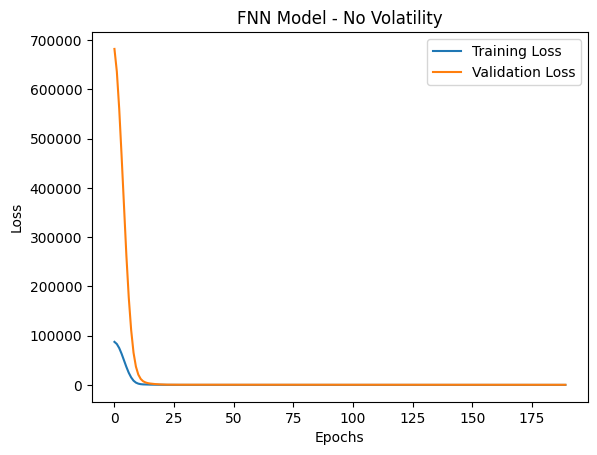

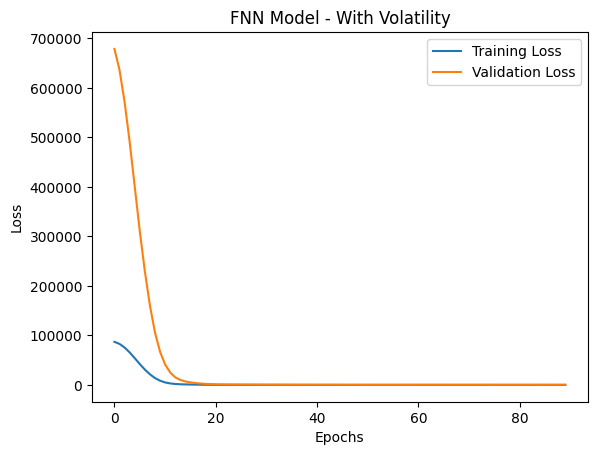

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")

# Tyler Burguillos 10/29/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Model Without Volatility - RMSE: 17.9023, R²: 0.9928, MAPE: 1.5491%
Model With Volatility - RMSE: 20.8550, R²: 0.9902, MAPE: 1.8237%
Lift Chart - No Volatility:


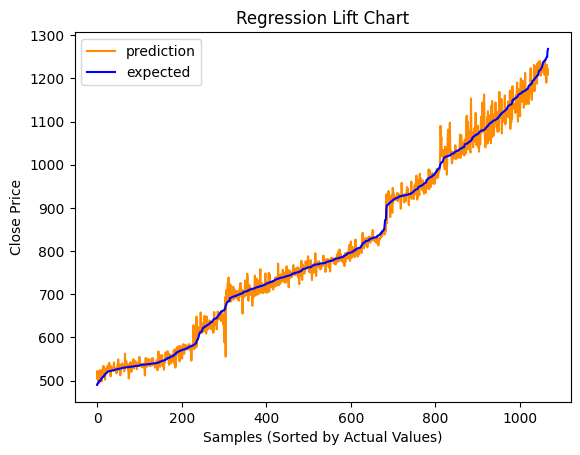

Lift Chart - With Volatility:


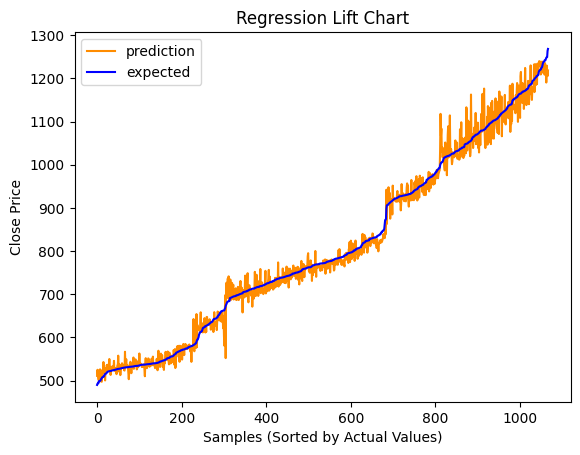

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility - RMSE: {rmse_no_vol:.4f}, R²: {r2_no_vol:.4f}, MAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility - RMSE: {rmse_with_vol:.4f}, R²: {r2_with_vol:.4f}, MAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Tyler Burguillos 10/29/24

#### Model 2: 2 Layers, ReLU Activation Function, Adam Optimizer

This Feedforward Neural Network (FNN) model includes a flattened input layer, two dense hidden layers with ReLU activation, and a final dense output layer for regression. The ReLU activation function helps capture non-linear relationships between features. We used the Adam optimizer with a learning rate of 0.001 to efficiently minimize the mean squared error, making this model suitable for continuous output prediction tasks.


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the FNN model
def build_fnn_model(input_shape):
  model = Sequential()
  model.add(Flatten(input_shape=input_shape))  # Flatten the input
  model.add(Dense(64, activation='relu'))      # Hidden layer 1
  model.add(Dense(32, activation='relu'))      # Hidden layer 2
  model.add(Dense(1))                          # Output layer (no activation for regression)
  model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
  return model

# Build FNN models for both datasets
model_no_vol = build_fnn_model((7, 5))  # No-volatility model input: (7 days, 5 features)
model_with_vol = build_fnn_model((7, 6))  # With-volatility model input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("tyler_fnn_model_2_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("tyler_fnn_model_2_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the FNN model without volatility
history_no_vol = model_no_vol.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the FNN model with volatility
history_with_vol = model_with_vol.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")
print(f"Test Loss (With Volatility): {loss_with_vol}")

## Tyler Burguillos 10/29/24

Epoch 1/500


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



Epoch 1: val_loss improved from inf to 646768.87500, saving model to tyler_fnn_model_2_no_vol.keras
79/79 - 2s - 26ms/step - loss: 86467.4766 - val_loss: 646768.8750
Epoch 2/500

Epoch 2: val_loss improved from 646768.87500 to 280630.68750, saving model to tyler_fnn_model_2_no_vol.keras
79/79 - 0s - 6ms/step - loss: 60717.3789 - val_loss: 280630.6875
Epoch 3/500

Epoch 3: val_loss improved from 280630.68750 to 11812.96484, saving model to tyler_fnn_model_2_no_vol.keras
79/79 - 1s - 7ms/step - loss: 11238.7012 - val_loss: 11812.9648
Epoch 4/500

Epoch 4: val_loss improved from 11812.96484 to 3214.09766, saving model to tyler_fnn_model_2_no_vol.keras
79/79 - 1s - 8ms/step - loss: 962.5945 - val_loss: 3214.0977
Epoch 5/500

Epoch 5: val_loss improved from 3214.09766 to 1695.51501, saving model to tyler_fnn_model_2_no_vol.keras
79/79 - 1s - 8ms/step - loss: 607.7786 - val_loss: 1695.5150
Epoch 6/500

Epoch 6: val_loss improved from 1695.51501 to 828.43848, saving model to tyler_fnn_model_

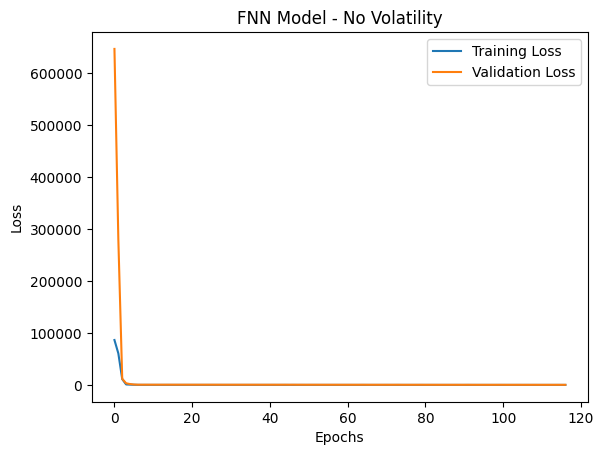

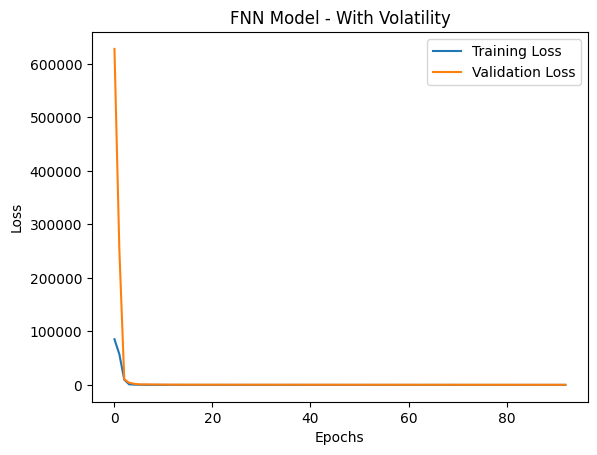

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")

# Tyler Burguillos 10/29/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Model Without Volatility - RMSE: 15.3752, R²: 0.9947, MAPE: 1.3282%
Model With Volatility - RMSE: 17.5482, R²: 0.9931, MAPE: 1.5197%
Lift Chart - No Volatility:


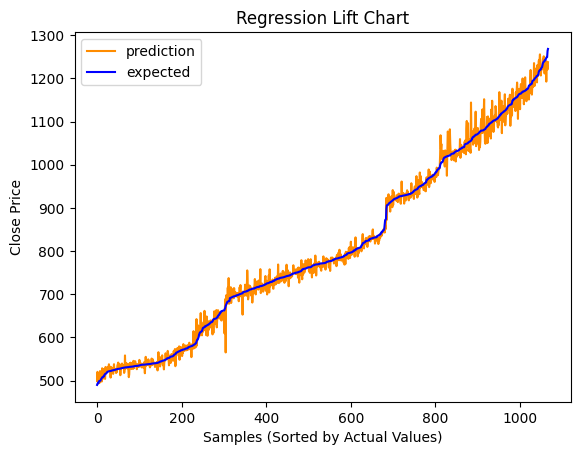

Lift Chart - With Volatility:


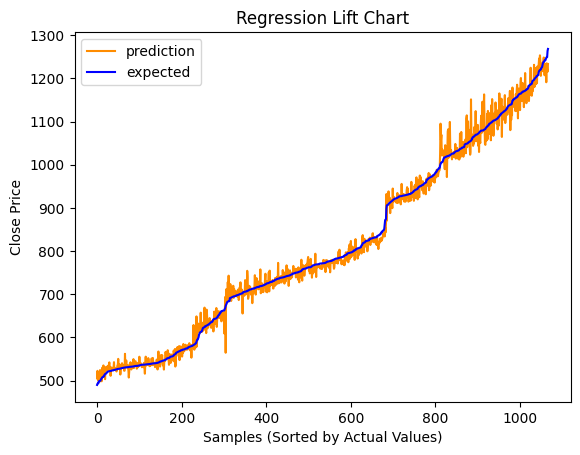

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility - RMSE: {rmse_no_vol:.4f}, R²: {r2_no_vol:.4f}, MAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility - RMSE: {rmse_with_vol:.4f}, R²: {r2_with_vol:.4f}, MAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Tyler Burguillos 10/29/24

#### Model 3: 4 Layers, ReLU Activation Function, Adam Optimizer

This Feedforward Neural Network (FNN) model includes a flattened input layer, four dense hidden layers with ReLU activation, and a final dense output layer for regression. The ReLU activation function helps capture non-linear relationships between features. We used the Adam optimizer with a learning rate of 0.001 to efficiently minimize the mean squared error, making this model suitable for continuous output prediction tasks.


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the FNN model
def build_fnn_model(input_shape):
  model = Sequential()
  model.add(Flatten(input_shape=input_shape))  # Flatten the input
  model.add(Dense(128, activation='relu'))      # Hidden layer 1
  model.add(Dense(64, activation='relu'))      # Hidden layer 2
  model.add(Dense(32, activation='relu'))      # Hidden layer 3
  model.add(Dense(16, activation='relu'))      # Hidden layer 4
  model.add(Dense(1))                          # Output layer (no activation for regression)
  model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
  return model

# Build FNN models for both datasets
model_no_vol = build_fnn_model((7, 5))  # No-volatility model input: (7 days, 5 features)
model_with_vol = build_fnn_model((7, 6))  # With-volatility model input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("tyler_fnn_model_3_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("tyler_fnn_model_3_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the FNN model without volatility
history_no_vol = model_no_vol.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the FNN model with volatility
history_with_vol = model_with_vol.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")
print(f"Test Loss (With Volatility): {loss_with_vol}")

## Tyler Burguillos 10/29/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/500

Epoch 1: val_loss improved from inf to 486490.03125, saving model to tyler_fnn_model_3_no_vol.keras
79/79 - 3s - 34ms/step - loss: 84220.3516 - val_loss: 486490.0312
Epoch 2/500

Epoch 2: val_loss improved from 486490.03125 to 1084.75464, saving model to tyler_fnn_model_3_no_vol.keras
79/79 - 1s - 11ms/step - loss: 10223.3359 - val_loss: 1084.7546
Epoch 3/500

Epoch 3: val_loss improved from 1084.75464 to 497.45865, saving model to tyler_fnn_model_3_no_vol.keras
79/79 - 0s - 4ms/step - loss: 380.7226 - val_loss: 497.4586
Epoch 4/500

Epoch 4: val_loss did not improve from 497.45865
79/79 - 0s - 3ms/step - loss: 118.9598 - val_loss: 548.8824
Epoch 5/500

Epoch 5: val_loss did not improve from 497.45865
79/79 - 0s - 4ms/step - loss: 96.4093 - val_loss: 527.7803
Epoch 6/500

Epoch 6: val_loss did not improve from 497.45865
79/79 - 0s - 4ms/step - loss: 92.0683 - val_loss: 538.5845
Epoch 7/500

Epoch 7: val_loss did not improve from 497.45865
79/79 - 0s - 4ms/step - loss: 89.0

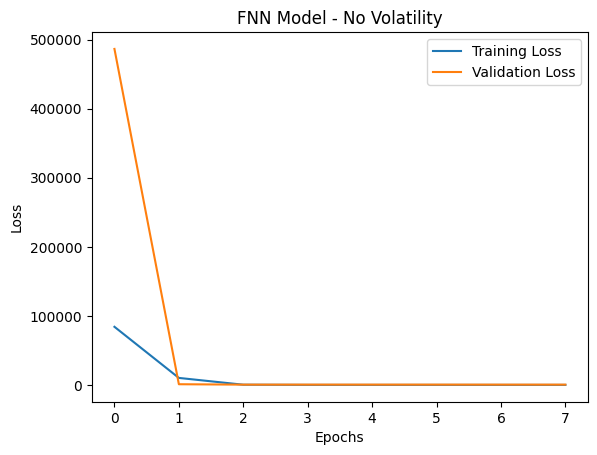

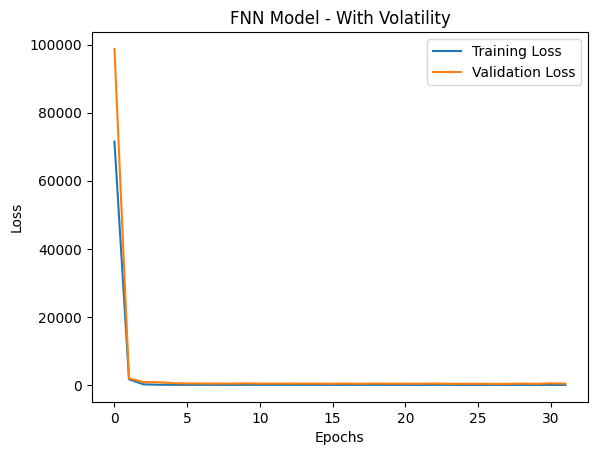

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")

# Tyler Burguillos 10/29/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Model Without Volatility - RMSE: 22.3038, R²: 0.9888, MAPE: 1.9791%
Model With Volatility - RMSE: 19.0431, R²: 0.9919, MAPE: 1.6629%
Lift Chart - No Volatility:


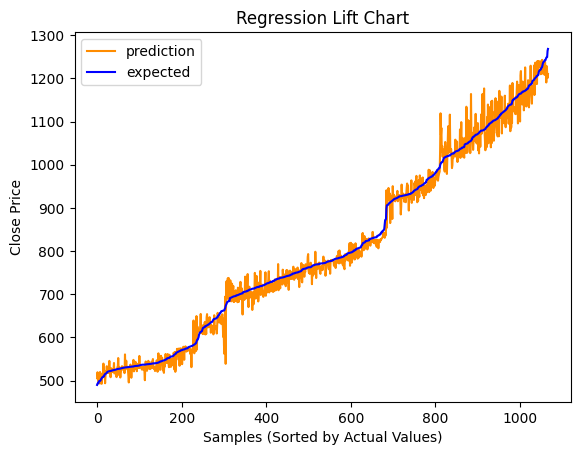

Lift Chart - With Volatility:


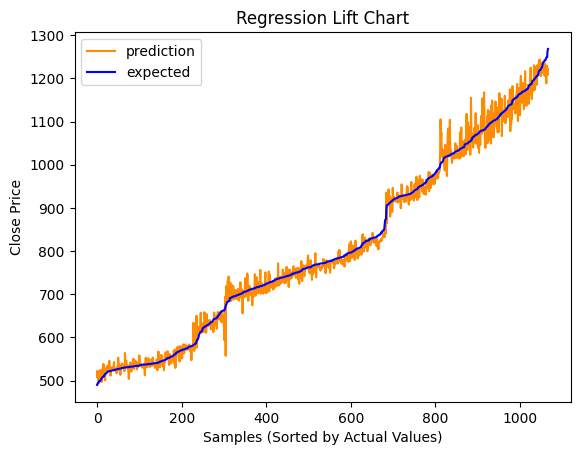

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility - RMSE: {rmse_no_vol:.4f}, R²: {r2_no_vol:.4f}, MAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility - RMSE: {rmse_with_vol:.4f}, R²: {r2_with_vol:.4f}, MAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Tyler Burguillos 10/29/24

#### Model 4: 5 Layers, ReLU Activation Function, Adam Optimizer

This Feedforward Neural Network (FNN) model includes a flattened input layer, five dense hidden layers with ReLU activation, and a final dense output layer for regression. The ReLU activation function helps capture non-linear relationships between features. We used the Adam optimizer with a learning rate of 0.001 to efficiently minimize the mean squared error, making this model suitable for continuous output prediction tasks.


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the FNN model
def build_fnn_model(input_shape):
  model = Sequential()
  model.add(Flatten(input_shape=input_shape))  # Flatten the input
  model.add(Dense(256, activation='relu'))      # Hidden layer 1
  model.add(Dense(128, activation='relu'))      # Hidden layer 2
  model.add(Dense(64, activation='relu'))      # Hidden layer 3
  model.add(Dense(32, activation='relu'))      # Hidden layer 4
  model.add(Dense(16, activation='relu'))      # Hidden layer 5
  model.add(Dense(1))                          # Output layer (no activation for regression)
  model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
  return model

# Build FNN models for both datasets
model_no_vol = build_fnn_model((7, 5))  # No-volatility model input: (7 days, 5 features)
model_with_vol = build_fnn_model((7, 6))  # With-volatility model input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("tyler_fnn_model_4_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("tyler_fnn_model_4_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the FNN model without volatility
history_no_vol = model_no_vol.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the FNN model with volatility
history_with_vol = model_with_vol.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")
print(f"Test Loss (With Volatility): {loss_with_vol}")

## Tyler Burguillos 10/29/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/500

Epoch 1: val_loss improved from inf to 3818.81226, saving model to tyler_fnn_model_4_no_vol.keras
79/79 - 3s - 34ms/step - loss: 43732.3906 - val_loss: 3818.8123
Epoch 2/500

Epoch 2: val_loss improved from 3818.81226 to 732.57837, saving model to tyler_fnn_model_4_no_vol.keras
79/79 - 0s - 5ms/step - loss: 294.9335 - val_loss: 732.5784
Epoch 3/500

Epoch 3: val_loss improved from 732.57837 to 600.81207, saving model to tyler_fnn_model_4_no_vol.keras
79/79 - 0s - 4ms/step - loss: 98.6579 - val_loss: 600.8121
Epoch 4/500

Epoch 4: val_loss improved from 600.81207 to 519.47937, saving model to tyler_fnn_model_4_no_vol.keras
79/79 - 0s - 4ms/step - loss: 92.8211 - val_loss: 519.4794
Epoch 5/500

Epoch 5: val_loss improved from 519.47937 to 478.58899, saving model to tyler_fnn_model_4_no_vol.keras
79/79 - 0s - 4ms/step - loss: 88.5126 - val_loss: 478.5890
Epoch 6/500

Epoch 6: val_loss improved from 478.58899 to 465.31796, saving model to tyler_fnn_model_4_no_vol.keras
79/79 -

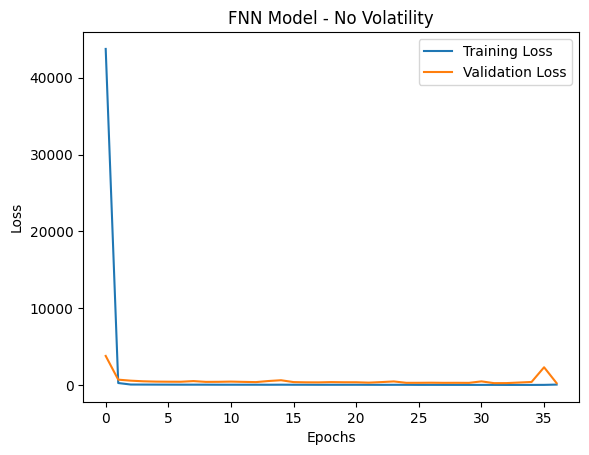

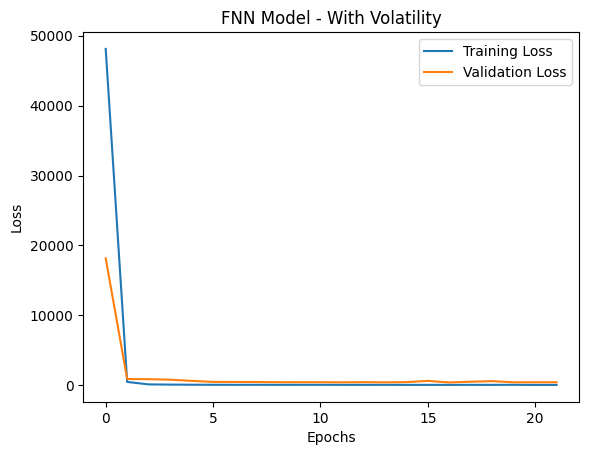

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")

# Tyler Burguillos 10/29/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Model Without Volatility - RMSE: 16.7262, R²: 0.9937, MAPE: 1.4445%
Model With Volatility - RMSE: 20.4592, R²: 0.9906, MAPE: 1.7605%
Lift Chart - No Volatility:


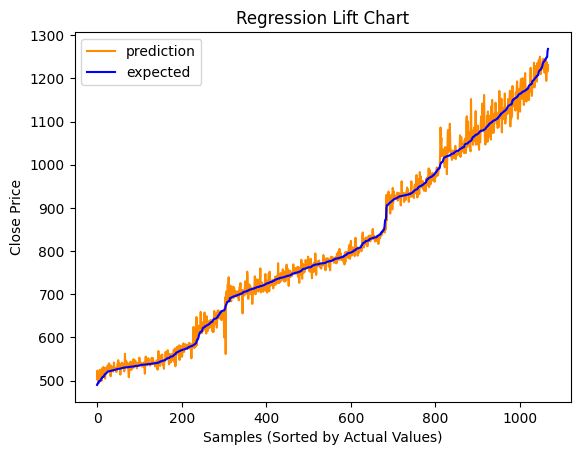

Lift Chart - With Volatility:


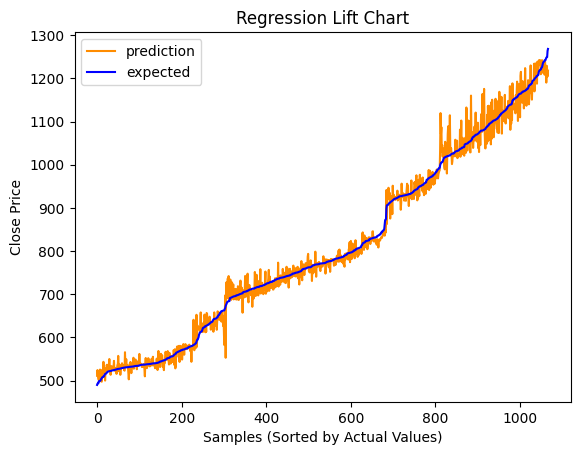

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility - RMSE: {rmse_no_vol:.4f}, R²: {r2_no_vol:.4f}, MAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility - RMSE: {rmse_with_vol:.4f}, R²: {r2_with_vol:.4f}, MAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Tyler Burguillos 10/29/24

#### Model 5: 7 Layers, ReLU Activation Function, Adam Optimizer

This Feedforward Neural Network (FNN) model includes a flattened input layer, seven dense hidden layers with ReLU activation, and a final dense output layer for regression. The ReLU activation function helps capture non-linear relationships between features. We used the Adam optimizer with a learning rate of 0.001 to efficiently minimize the mean squared error, making this model suitable for continuous output prediction tasks.


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the FNN model
def build_fnn_model(input_shape):
  model = Sequential()
  model.add(Flatten(input_shape=input_shape))  # Flatten the input
  model.add(Dense(1024, activation='relu'))      # Hidden layer 1
  model.add(Dense(512, activation='relu'))      # Hidden layer 1
  model.add(Dense(256, activation='relu'))      # Hidden layer 1
  model.add(Dense(128, activation='relu'))      # Hidden layer 1
  model.add(Dense(64, activation='relu'))      # Hidden layer 1
  model.add(Dense(32, activation='relu'))      # Hidden layer 1
  model.add(Dense(16, activation='relu'))      # Hidden layer 2
  model.add(Dense(1))                          # Output layer (no activation for regression)
  model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
  return model

# Build FNN models for both datasets
model_no_vol = build_fnn_model((7, 5))  # No-volatility model input: (7 days, 5 features)
model_with_vol = build_fnn_model((7, 6))  # With-volatility model input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("tyler_fnn_model_5_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("tyler_fnn_model_5_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the FNN model without volatility
history_no_vol = model_no_vol.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the FNN model with volatility
history_with_vol = model_with_vol.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")
print(f"Test Loss (With Volatility): {loss_with_vol}")

## Tyler Burguillos 10/29/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/500

Epoch 1: val_loss improved from inf to 1142.83020, saving model to tyler_fnn_model_5_no_vol.keras
79/79 - 4s - 48ms/step - loss: 21538.3613 - val_loss: 1142.8302
Epoch 2/500

Epoch 2: val_loss did not improve from 1142.83020
79/79 - 3s - 39ms/step - loss: 107.8353 - val_loss: 1862.5012
Epoch 3/500

Epoch 3: val_loss improved from 1142.83020 to 467.05197, saving model to tyler_fnn_model_5_no_vol.keras
79/79 - 2s - 26ms/step - loss: 112.2964 - val_loss: 467.0520
Epoch 4/500

Epoch 4: val_loss did not improve from 467.05197
79/79 - 1s - 17ms/step - loss: 83.9040 - val_loss: 523.6337
Epoch 5/500

Epoch 5: val_loss improved from 467.05197 to 442.15298, saving model to tyler_fnn_model_5_no_vol.keras
79/79 - 3s - 32ms/step - loss: 77.9325 - val_loss: 442.1530
Epoch 6/500

Epoch 6: val_loss improved from 442.15298 to 426.54276, saving model to tyler_fnn_model_5_no_vol.keras
79/79 - 2s - 31ms/step - loss: 79.6742 - val_loss: 426.5428
Epoch 7/500

Epoch 7: val_loss improved from 426

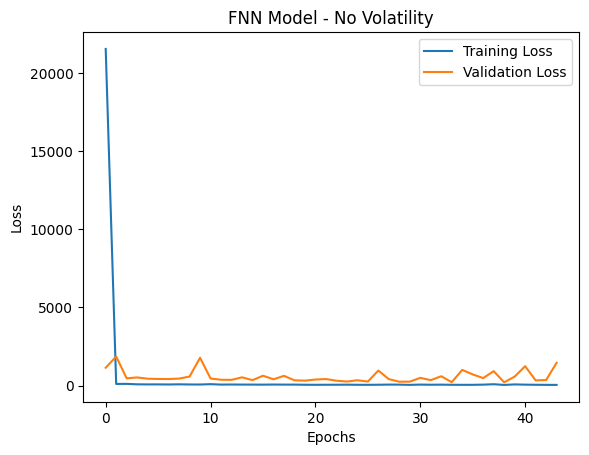

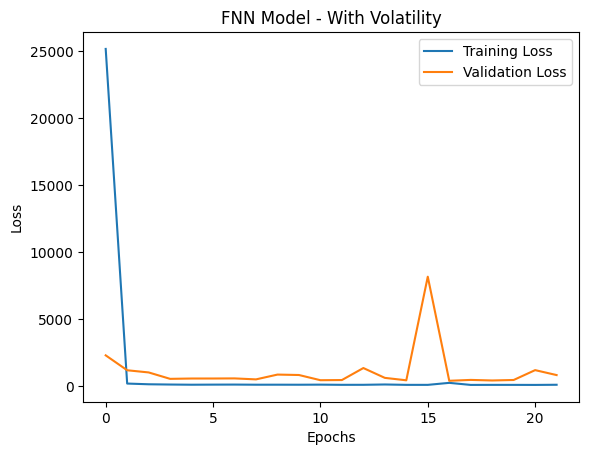

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")

# Tyler Burguillos 10/29/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Model Without Volatility - RMSE: 14.5074, R²: 0.9953, MAPE: 1.2428%
Model With Volatility - RMSE: 19.3465, R²: 0.9916, MAPE: 1.6830%
Lift Chart - No Volatility:


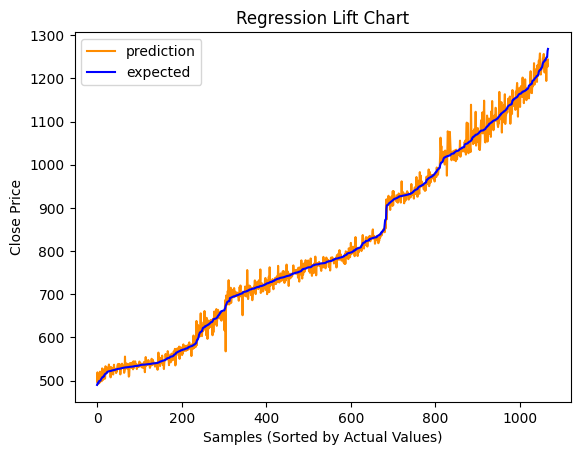

Lift Chart - With Volatility:


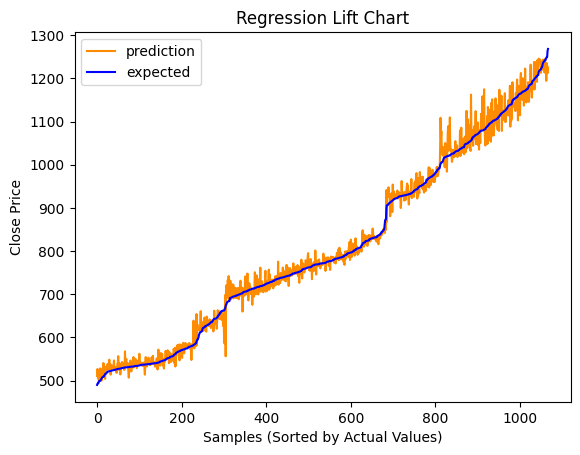

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility - RMSE: {rmse_no_vol:.4f}, R²: {r2_no_vol:.4f}, MAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility - RMSE: {rmse_with_vol:.4f}, R²: {r2_with_vol:.4f}, MAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Tyler Burguillos 10/29/24

#### Model 6: 1 Layer, ReLU Activation Function, SGD Optimizer

This Feedforward Neural Network (FNN) model includes a flattened input layer, one dense hidden layer with ReLU activation, and a final dense output layer for regression. The ReLU activation function helps capture non-linear relationships between features. We used the SGD optimizer with a learning rate of 0.001 to efficiently minimize the mean squared error, making this model suitable for continuous output prediction tasks.


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the FNN model
def build_fnn_model(input_shape):
  model = Sequential()
  model.add(Flatten(input_shape=input_shape))  # Flatten the input
  model.add(Dense(64, activation='relu'))      # Hidden layer 1
  model.add(Dense(1))                          # Output layer (no activation for regression)
  model.compile(optimizer=SGD(learning_rate=0.001), loss='mean_squared_error')
  return model

# Build FNN models for both datasets
model_no_vol = build_fnn_model((7, 5))  # No-volatility model input: (7 days, 5 features)
model_with_vol = build_fnn_model((7, 6))  # With-volatility model input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("tyler_fnn_model_6_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("tyler_fnn_model_6_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the FNN model without volatility
history_no_vol = model_no_vol.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the FNN model with volatility
history_with_vol = model_with_vol.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")
print(f"Test Loss (With Volatility): {loss_with_vol}")

## Tyler Burguillos 10/29/24

Epoch 1/500


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



Epoch 1: val_loss improved from inf to 548.15796, saving model to tyler_fnn_model_6_no_vol.keras
79/79 - 1s - 10ms/step - loss: 5462.9653 - val_loss: 548.1580
Epoch 2/500

Epoch 2: val_loss did not improve from 548.15796
79/79 - 0s - 4ms/step - loss: 99.1872 - val_loss: 2891.4434
Epoch 3/500

Epoch 3: val_loss did not improve from 548.15796
79/79 - 0s - 3ms/step - loss: 105.5479 - val_loss: 931.3975
Epoch 4/500

Epoch 4: val_loss did not improve from 548.15796
79/79 - 0s - 4ms/step - loss: 118.1445 - val_loss: 644.0281
Epoch 5/500

Epoch 5: val_loss improved from 548.15796 to 484.47424, saving model to tyler_fnn_model_6_no_vol.keras
79/79 - 0s - 4ms/step - loss: 96.5998 - val_loss: 484.4742
Epoch 6/500

Epoch 6: val_loss did not improve from 484.47424
79/79 - 0s - 4ms/step - loss: 93.1671 - val_loss: 1534.3347
Epoch 7/500

Epoch 7: val_loss did not improve from 484.47424
79/79 - 1s - 12ms/step - loss: 103.6318 - val_loss: 1444.2257
Epoch 8/500

Epoch 8: val_loss did not improve from 4

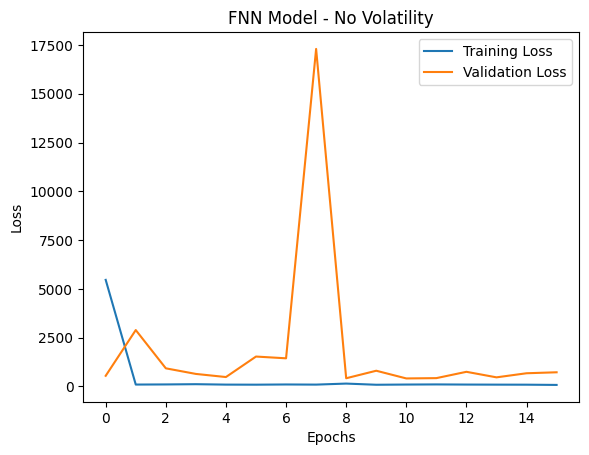

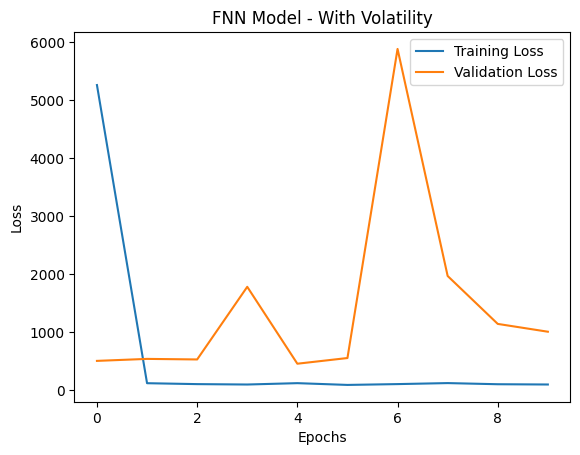

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")

# Tyler Burguillos 10/29/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Model Without Volatility - RMSE: 20.3211, R²: 0.9907, MAPE: 1.7610%
Model With Volatility - RMSE: 21.2943, R²: 0.9898, MAPE: 1.8520%
Lift Chart - No Volatility:


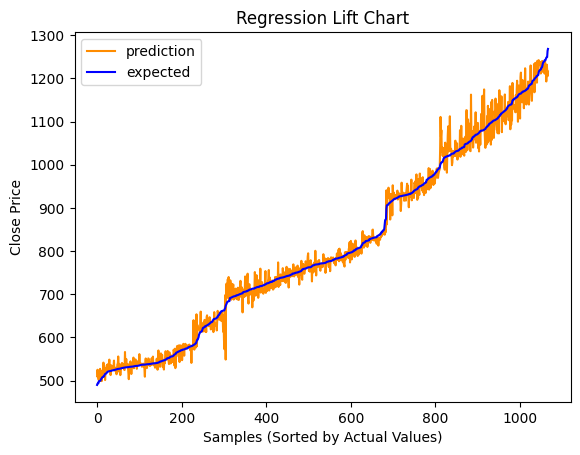

Lift Chart - With Volatility:


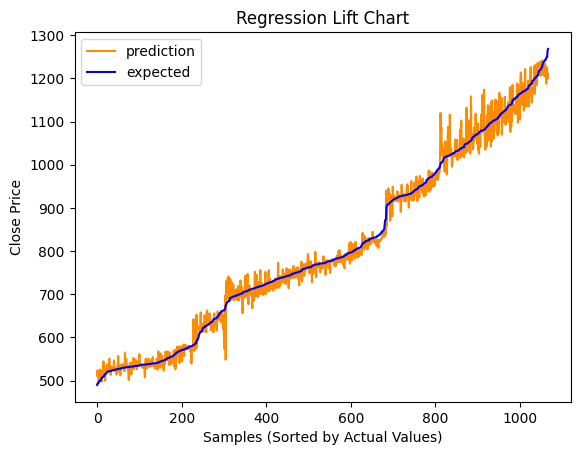

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility - RMSE: {rmse_no_vol:.4f}, R²: {r2_no_vol:.4f}, MAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility - RMSE: {rmse_with_vol:.4f}, R²: {r2_with_vol:.4f}, MAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Tyler Burguillos 10/29/24

#### Model 7: 2 Layers, ReLU Activation Function, SGD Optimizer

This Feedforward Neural Network (FNN) model includes a flattened input layer, two dense hidden layers with ReLU activation, and a final dense output layer for regression. The ReLU activation function helps capture non-linear relationships between features. We used the SGD optimizer with a learning rate of 0.001 to efficiently minimize the mean squared error, making this model suitable for continuous output prediction tasks.


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the FNN model
def build_fnn_model(input_shape):
  model = Sequential()
  model.add(Flatten(input_shape=input_shape))  # Flatten the input
  model.add(Dense(64, activation='relu'))      # Hidden layer 1
  model.add(Dense(32, activation='relu'))      # Hidden layer 2
  model.add(Dense(1))                          # Output layer (no activation for regression)
  model.compile(optimizer=SGD(learning_rate=0.001), loss='mean_squared_error')
  return model

# Build FNN models for both datasets
model_no_vol = build_fnn_model((7, 5))  # No-volatility model input: (7 days, 5 features)
model_with_vol = build_fnn_model((7, 6))  # With-volatility model input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("tyler_fnn_model_7_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("tyler_fnn_model_7_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the FNN model without volatility
history_no_vol = model_no_vol.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the FNN model with volatility
history_with_vol = model_with_vol.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")
print(f"Test Loss (With Volatility): {loss_with_vol}")

## Tyler Burguillos 10/29/24

Epoch 1/500


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



Epoch 1: val_loss improved from inf to 812240666624.00000, saving model to tyler_fnn_model_7_no_vol.keras
79/79 - 1s - 8ms/step - loss: 3120998115180544.0000 - val_loss: 812240666624.0000
Epoch 2/500

Epoch 2: val_loss improved from 812240666624.00000 to 591865053184.00000, saving model to tyler_fnn_model_7_no_vol.keras
79/79 - 0s - 4ms/step - loss: 699825913856.0000 - val_loss: 591865053184.0000
Epoch 3/500

Epoch 3: val_loss improved from 591865053184.00000 to 431265906688.00000, saving model to tyler_fnn_model_7_no_vol.keras
79/79 - 1s - 8ms/step - loss: 510054039552.0000 - val_loss: 431265906688.0000
Epoch 4/500

Epoch 4: val_loss improved from 431265906688.00000 to 314231554048.00000, saving model to tyler_fnn_model_7_no_vol.keras
79/79 - 0s - 4ms/step - loss: 371742769152.0000 - val_loss: 314231554048.0000
Epoch 5/500

Epoch 5: val_loss improved from 314231554048.00000 to 228946132992.00000, saving model to tyler_fnn_model_7_no_vol.keras
79/79 - 0s - 4ms/step - loss: 27093724364

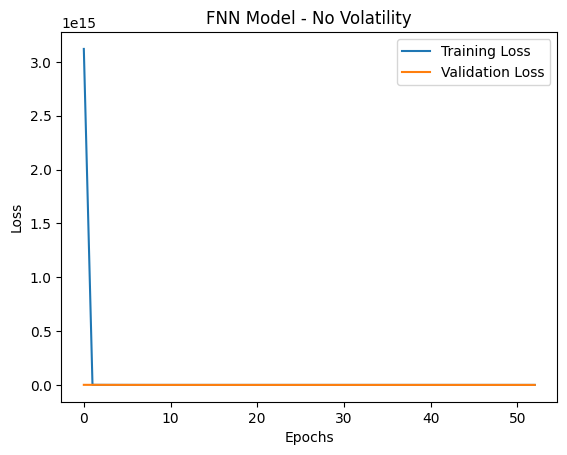

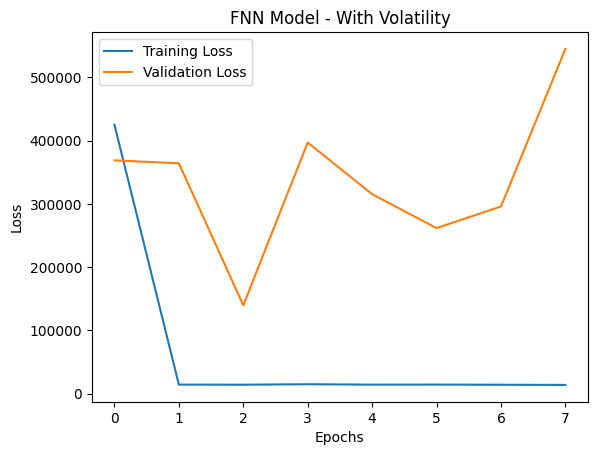

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")

# Tyler Burguillos 10/29/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Model Without Volatility - RMSE: 210.9951, R²: -0.0001, MAPE: 23.4951%
Model With Volatility - RMSE: 373.4835, R²: -2.1337, MAPE: 33.6884%
Lift Chart - No Volatility:


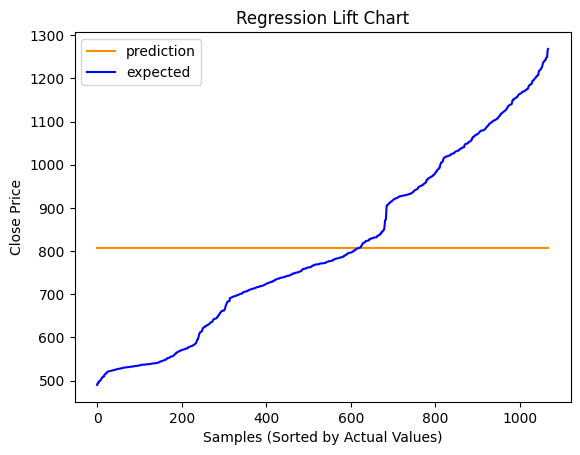

Lift Chart - With Volatility:


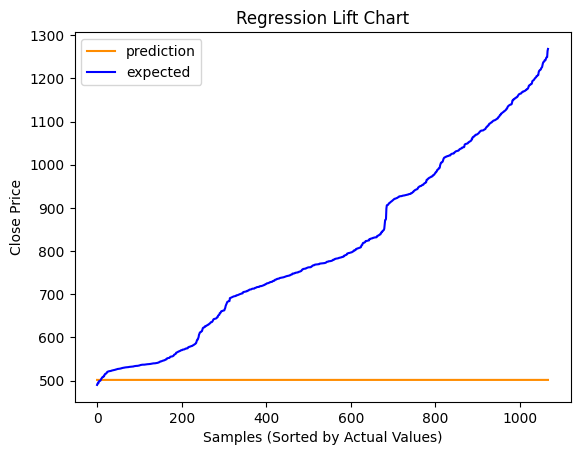

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility - RMSE: {rmse_no_vol:.4f}, R²: {r2_no_vol:.4f}, MAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility - RMSE: {rmse_with_vol:.4f}, R²: {r2_with_vol:.4f}, MAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Tyler Burguillos 10/29/24

#### Model 8: 4 Layers, ReLU Activation Function, SGD Optimizer

This Feedforward Neural Network (FNN) model includes a flattened input layer, four dense hidden layers with ReLU activation, and a final dense output layer for regression. The ReLU activation function helps capture non-linear relationships between features. We used the SGD optimizer with a learning rate of 0.001 to efficiently minimize the mean squared error, making this model suitable for continuous output prediction tasks.


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the FNN model
def build_fnn_model(input_shape):
  model = Sequential()
  model.add(Flatten(input_shape=input_shape))  # Flatten the input
  model.add(Dense(128, activation='relu'))      # Hidden layer 1
  model.add(Dense(64, activation='relu'))      # Hidden layer 2
  model.add(Dense(32, activation='relu'))      # Hidden layer 3
  model.add(Dense(16, activation='relu'))      # Hidden layer 4
  model.add(Dense(1))                          # Output layer (no activation for regression)
  model.compile(optimizer=SGD(learning_rate=0.001), loss='mean_squared_error')
  return model

# Build FNN models for both datasets
model_no_vol = build_fnn_model((7, 5))  # No-volatility model input: (7 days, 5 features)
model_with_vol = build_fnn_model((7, 6))  # With-volatility model input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("tyler_fnn_model_8_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("tyler_fnn_model_8_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the FNN model without volatility
history_no_vol = model_no_vol.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the FNN model with volatility
history_with_vol = model_with_vol.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")
print(f"Test Loss (With Volatility): {loss_with_vol}")

## Tyler Burguillos 10/29/24

Epoch 1/500


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



Epoch 1: val_loss did not improve from inf
79/79 - 1s - 10ms/step - loss: nan - val_loss: nan
Epoch 2/500

Epoch 2: val_loss did not improve from inf
79/79 - 0s - 5ms/step - loss: nan - val_loss: nan
Epoch 3/500

Epoch 3: val_loss did not improve from inf
79/79 - 0s - 4ms/step - loss: nan - val_loss: nan
Epoch 4/500

Epoch 4: val_loss did not improve from inf
79/79 - 0s - 5ms/step - loss: nan - val_loss: nan
Epoch 5/500

Epoch 5: val_loss did not improve from inf
79/79 - 1s - 7ms/step - loss: nan - val_loss: nan
Epoch 5: early stopping
Restoring model weights from the end of the best epoch: 1.
Epoch 1/500

Epoch 1: val_loss did not improve from inf
79/79 - 1s - 13ms/step - loss: nan - val_loss: nan
Epoch 2/500

Epoch 2: val_loss did not improve from inf
79/79 - 0s - 4ms/step - loss: nan - val_loss: nan
Epoch 3/500

Epoch 3: val_loss did not improve from inf
79/79 - 1s - 7ms/step - loss: nan - val_loss: nan
Epoch 4/500

Epoch 4: val_loss did not improve from inf
79/79 - 0s - 4ms/step -

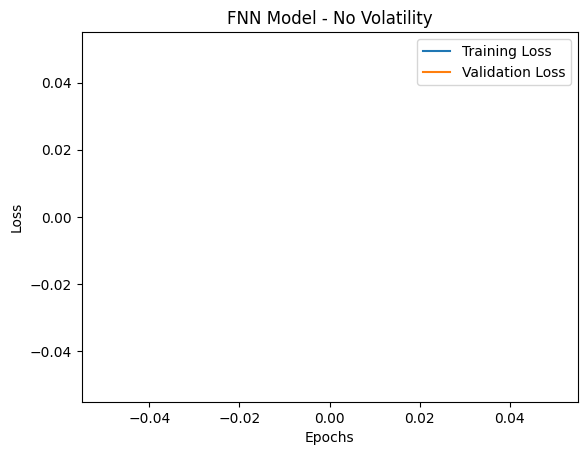

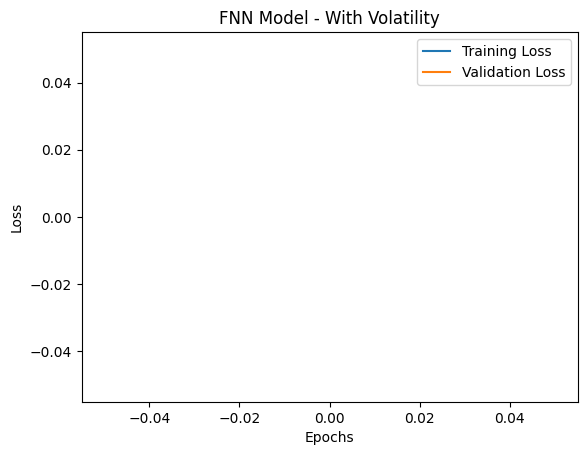

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")

# Tyler Burguillos 10/29/24

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility - RMSE: {rmse_no_vol:.4f}, R²: {r2_no_vol:.4f}, MAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility - RMSE: {rmse_with_vol:.4f}, R²: {r2_with_vol:.4f}, MAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Tyler Burguillos 10/29/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


ValueError: Input contains NaN.

#### Model 9: 5 Layers, ReLU Activation Function, SGD Optimizer

This Feedforward Neural Network (FNN) model includes a flattened input layer, five dense hidden layers with ReLU activation, and a final dense output layer for regression. The ReLU activation function helps capture non-linear relationships between features. We used the SGD optimizer with a learning rate of 0.001 to efficiently minimize the mean squared error, making this model suitable for continuous output prediction tasks.


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the FNN model
def build_fnn_model(input_shape):
  model = Sequential()
  model.add(Flatten(input_shape=input_shape))  # Flatten the input
  model.add(Dense(256, activation='relu'))      # Hidden layer 1
  model.add(Dense(128, activation='relu'))      # Hidden layer 2
  model.add(Dense(64, activation='relu'))      # Hidden layer 3
  model.add(Dense(32, activation='relu'))      # Hidden layer 4
  model.add(Dense(16, activation='relu'))      # Hidden layer 5
  model.add(Dense(1))                          # Output layer (no activation for regression)
  model.compile(optimizer=SGD(learning_rate=0.001), loss='mean_squared_error')
  return model

# Build FNN models for both datasets
model_no_vol = build_fnn_model((7, 5))  # No-volatility model input: (7 days, 5 features)
model_with_vol = build_fnn_model((7, 6))  # With-volatility model input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("tyler_fnn_model_9_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("tyler_fnn_model_9_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the FNN model without volatility
history_no_vol = model_no_vol.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the FNN model with volatility
history_with_vol = model_with_vol.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")
print(f"Test Loss (With Volatility): {loss_with_vol}")

## Tyler Burguillos 10/29/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/500

Epoch 1: val_loss did not improve from inf
79/79 - 1s - 13ms/step - loss: nan - val_loss: nan
Epoch 2/500

Epoch 2: val_loss did not improve from inf
79/79 - 0s - 5ms/step - loss: nan - val_loss: nan
Epoch 3/500

Epoch 3: val_loss did not improve from inf
79/79 - 1s - 8ms/step - loss: nan - val_loss: nan
Epoch 4/500

Epoch 4: val_loss did not improve from inf
79/79 - 1s - 10ms/step - loss: nan - val_loss: nan
Epoch 5/500

Epoch 5: val_loss did not improve from inf
79/79 - 1s - 7ms/step - loss: nan - val_loss: nan
Epoch 5: early stopping
Restoring model weights from the end of the best epoch: 1.
Epoch 1/500

Epoch 1: val_loss did not improve from inf
79/79 - 2s - 24ms/step - loss: nan - val_loss: nan
Epoch 2/500

Epoch 2: val_loss did not improve from inf
79/79 - 1s - 10ms/step - loss: nan - val_loss: nan
Epoch 3/500

Epoch 3: val_loss did not improve from inf
79/79 - 1s - 8ms/step - loss: nan - val_loss: nan
Epoch 4/500

Epoch 4: val_loss did not improve from inf
79/79 - 1

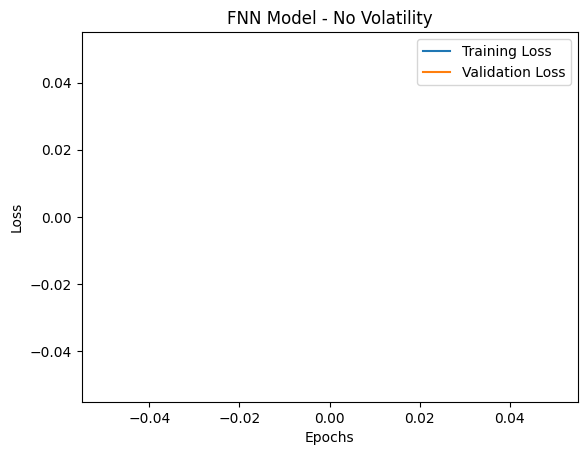

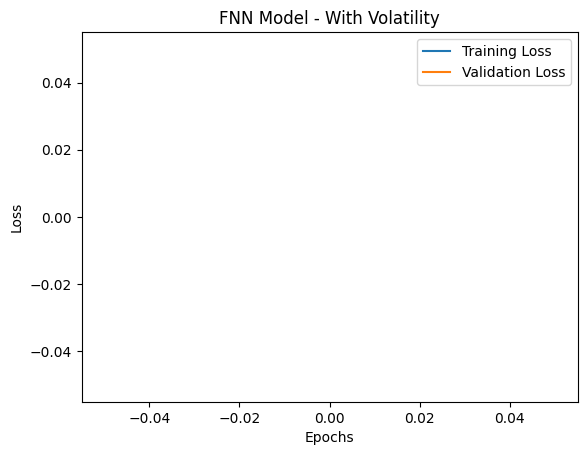

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")

# Tyler Burguillos 10/29/24

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility - RMSE: {rmse_no_vol:.4f}, R²: {r2_no_vol:.4f}, MAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility - RMSE: {rmse_with_vol:.4f}, R²: {r2_with_vol:.4f}, MAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Tyler Burguillos 10/29/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


ValueError: Input contains NaN.

#### Model 10: 7 Layers, ReLU Activation Function, SGD Optimizer

This Feedforward Neural Network (FNN) model includes a flattened input layer, seven dense hidden layers with ReLU activation, and a final dense output layer for regression. The ReLU activation function helps capture non-linear relationships between features. We used the SGD optimizer with a learning rate of 0.001 to efficiently minimize the mean squared error, making this model suitable for continuous output prediction tasks.


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the FNN model
def build_fnn_model(input_shape):
  model = Sequential()
  model.add(Flatten(input_shape=input_shape))  # Flatten the input
  model.add(Dense(1024, activation='relu'))      # Hidden layer 1
  model.add(Dense(512, activation='relu'))      # Hidden layer 2
  model.add(Dense(256, activation='relu'))      # Hidden layer 3
  model.add(Dense(128, activation='relu'))      # Hidden layer 4
  model.add(Dense(64, activation='relu'))      # Hidden layer 5
  model.add(Dense(32, activation='relu'))      # Hidden layer 6
  model.add(Dense(16, activation='relu'))      # Hidden layer 7
  model.add(Dense(1))                          # Output layer (no activation for regression)
  model.compile(optimizer=SGD(learning_rate=0.001), loss='mean_squared_error')
  return model

# Build FNN models for both datasets
model_no_vol = build_fnn_model((7, 5))  # No-volatility model input: (7 days, 5 features)
model_with_vol = build_fnn_model((7, 6))  # With-volatility model input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("tyler_fnn_model_10_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("tyler_fnn_model_10_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the FNN model without volatility
history_no_vol = model_no_vol.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the FNN model with volatility
history_with_vol = model_with_vol.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")
print(f"Test Loss (With Volatility): {loss_with_vol}")

## Tyler Burguillos 10/29/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/500

Epoch 1: val_loss did not improve from inf
79/79 - 3s - 33ms/step - loss: nan - val_loss: nan
Epoch 2/500

Epoch 2: val_loss did not improve from inf
79/79 - 1s - 19ms/step - loss: nan - val_loss: nan
Epoch 3/500

Epoch 3: val_loss did not improve from inf
79/79 - 1s - 15ms/step - loss: nan - val_loss: nan
Epoch 4/500

Epoch 4: val_loss did not improve from inf
79/79 - 1s - 16ms/step - loss: nan - val_loss: nan
Epoch 5/500

Epoch 5: val_loss did not improve from inf
79/79 - 1s - 16ms/step - loss: nan - val_loss: nan
Epoch 5: early stopping
Restoring model weights from the end of the best epoch: 1.
Epoch 1/500

Epoch 1: val_loss did not improve from inf
79/79 - 1s - 19ms/step - loss: nan - val_loss: nan
Epoch 2/500

Epoch 2: val_loss did not improve from inf
79/79 - 1s - 11ms/step - loss: nan - val_loss: nan
Epoch 3/500

Epoch 3: val_loss did not improve from inf
79/79 - 1s - 16ms/step - loss: nan - val_loss: nan
Epoch 4/500

Epoch 4: val_loss did not improve from inf
79/79

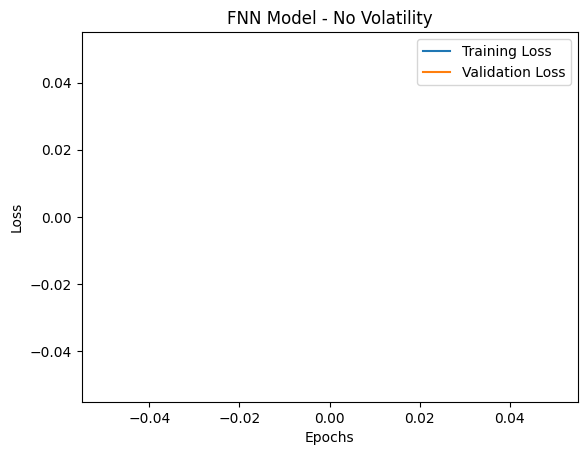

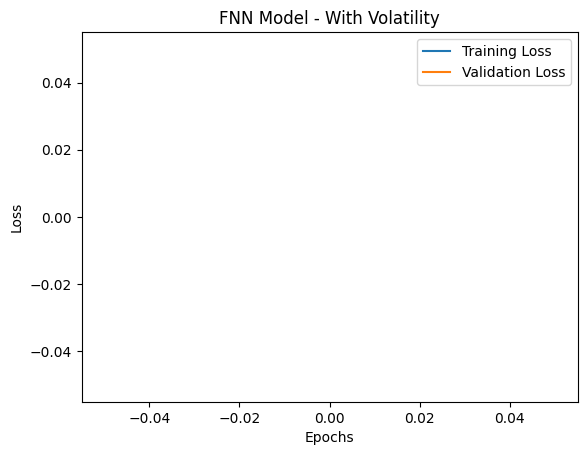

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")

# Tyler Burguillos 10/29/24

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility - RMSE: {rmse_no_vol:.4f}, R²: {r2_no_vol:.4f}, MAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility - RMSE: {rmse_with_vol:.4f}, R²: {r2_with_vol:.4f}, MAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Tyler Burguillos 10/29/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


ValueError: Input contains NaN.

### FNN Model Design and Testing (Austin Nolte)

#### Model 1: 1 Layer, Sigmoid Activation Function, Adam Optimizer


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Build model with no volatility (input = 7 days, 5 features)
model_no_vol = Sequential()
model_no_vol.add(Flatten(input_shape=(7,5)))
model_no_vol.add(Dense(64,activation='sigmoid'))
model_no_vol.add(Dense(1))
model_no_vol.compile(loss='mean_squared_error', optimizer='adam')

# Build model with volatility (input = 7 days, 6 features)
model_with_vol = Sequential()
model_with_vol.add(Flatten(input_shape=(7,6)))
model_with_vol.add(Dense(64,activation='sigmoid'))
model_with_vol.add(Dense(1))
model_with_vol.compile(loss='mean_squared_error', optimizer='adam')

# Early stopping and checkpointing for each model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Austin_fnn_model_1_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Austin_fnn_model_1_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
# Austin Nolte 11/3/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
# Train model without volatility
history_no_vol = model_no_vol.fit(X_train_no_vol, y_train_no_vol_seq,validation_data=(X_test_no_vol, y_test_no_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_no_vol, checkpoint_no_vol],verbose=2)

# Evaluate the model without volatility
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")

# Austin Nolte 11/3/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 692616.37500, saving model to Austin_fnn_model_1_no_vol.keras
79/79 - 2s - 21ms/step - loss: 87755.9219 - val_loss: 692616.3750
Epoch 2/500

Epoch 2: val_loss improved from 692616.37500 to 684681.56250, saving model to Austin_fnn_model_1_no_vol.keras
79/79 - 0s - 4ms/step - loss: 85480.0938 - val_loss: 684681.5625
Epoch 3/500

Epoch 3: val_loss improved from 684681.56250 to 677171.81250, saving model to Austin_fnn_model_1_no_vol.keras
79/79 - 0s - 4ms/step - loss: 83028.1484 - val_loss: 677171.8125
Epoch 4/500

Epoch 4: val_loss improved from 677171.81250 to 669436.81250, saving model to Austin_fnn_model_1_no_vol.keras
79/79 - 0s - 4ms/step - loss: 80450.0312 - val_loss: 669436.8125
Epoch 5/500

Epoch 5: val_loss improved from 669436.81250 to 661537.62500, saving model to Austin_fnn_model_1_no_vol.keras
79/79 - 0s - 3ms/step - loss: 77801.7812 - val_loss: 661537.6250
Epoch 6/500

Epoch 6: val_loss improved from 661537.62500 to 652911.

In [ ]:
# Train model with volatility
history_with_vol = model_with_vol.fit(X_train_with_vol, y_train_with_vol_seq,validation_data=(X_test_with_vol, y_test_with_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_with_vol, checkpoint_with_vol],verbose=2)

# Evaluate the model with volatility
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (With Volatility): {loss_with_vol}")
# Austin Nolte 11/3/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 691754.62500, saving model to Austin_fnn_model_1_with_vol.keras
79/79 - 1s - 14ms/step - loss: 87500.1562 - val_loss: 691754.6250
Epoch 2/500

Epoch 2: val_loss improved from 691754.62500 to 684064.50000, saving model to Austin_fnn_model_1_with_vol.keras
79/79 - 1s - 6ms/step - loss: 85239.0234 - val_loss: 684064.5000
Epoch 3/500

Epoch 3: val_loss improved from 684064.50000 to 676355.75000, saving model to Austin_fnn_model_1_with_vol.keras
79/79 - 0s - 4ms/step - loss: 82763.9219 - val_loss: 676355.7500
Epoch 4/500

Epoch 4: val_loss improved from 676355.75000 to 668321.87500, saving model to Austin_fnn_model_1_with_vol.keras
79/79 - 0s - 3ms/step - loss: 80106.5312 - val_loss: 668321.8750
Epoch 5/500

Epoch 5: val_loss improved from 668321.87500 to 659731.00000, saving model to Austin_fnn_model_1_with_vol.keras
79/79 - 0s - 3ms/step - loss: 77347.7891 - val_loss: 659731.0000
Epoch 6/500

Epoch 6: val_loss improved from 659731.00000 

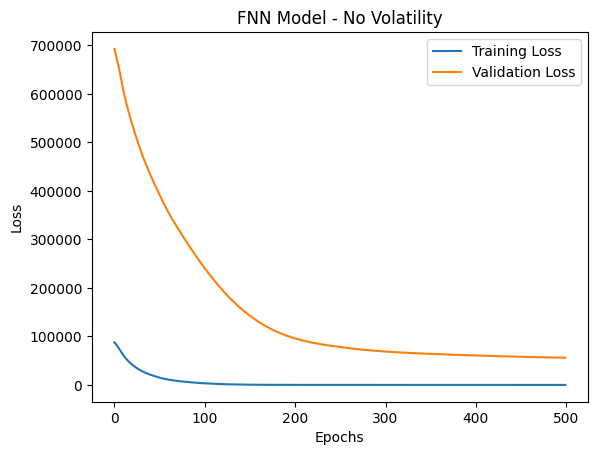

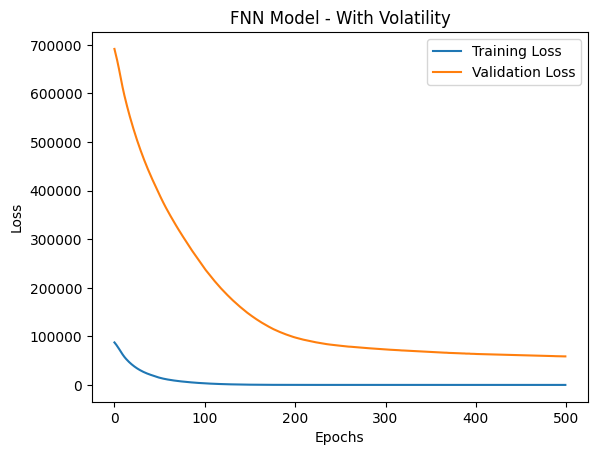

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")

# Austin Nolte 11/3/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Model Without Volatility stats: 
RMSE: 236.6827, 
R²: -0.2585, 
MAPE: 17.2966%
Model With Volatility stats: 
RMSE: 242.4165, 
R²: -0.3202, 
MAPE: 17.9028%
Lift Chart - No Volatility:


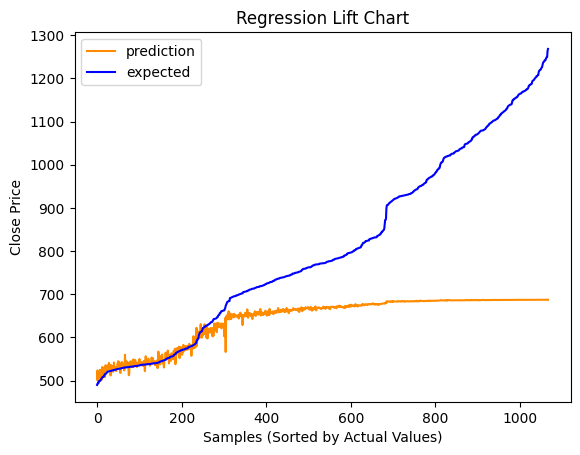

Lift Chart - With Volatility:


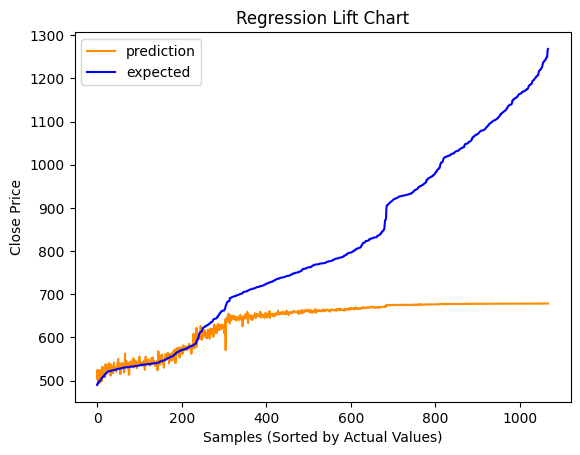

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility stats: \nRMSE: {rmse_no_vol:.4f}, \nR²: {r2_no_vol:.4f}, \nMAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility stats: \nRMSE: {rmse_with_vol:.4f}, \nR²: {r2_with_vol:.4f}, \nMAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Austin Nolte 11/3/24

#### Model 2: 3 Layers, Sigmoid Activation Function, Adam Optimizer


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Build model with no volatility (input = 7 days, 5 features)
model_no_vol = Sequential()
model_no_vol.add(Flatten(input_shape=(7,5)))
model_no_vol.add(Dense(64,activation='sigmoid'))
model_no_vol.add(Dense(32,activation='relu'))
model_no_vol.add(Dense(16,activation='sigmoid'))
model_no_vol.add(Dense(1))
model_no_vol.compile(loss='mean_squared_error', optimizer='adam')

# Build model with volatility (input = 7 days, 6 features)
model_with_vol = Sequential()
model_with_vol.add(Flatten(input_shape=(7,6)))
model_with_vol.add(Dense(64,activation='sigmoid'))
model_with_vol.add(Dense(32,activation='relu'))
model_with_vol.add(Dense(16,activation='sigmoid'))
model_with_vol.add(Dense(1))
model_with_vol.compile(loss='mean_squared_error', optimizer='adam')

# Early stopping and checkpointing for each model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Austin_fnn_model_2_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Austin_fnn_model_2_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
# Austin Nolte 11/3/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
# Train model without volatility
history_no_vol = model_no_vol.fit(X_train_no_vol, y_train_no_vol_seq,validation_data=(X_test_no_vol, y_test_no_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_no_vol, checkpoint_no_vol],verbose=2)

# Evaluate the model without volatility
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")

# Austin Nolte 11/3/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 694715.37500, saving model to Austin_fnn_model_2_no_vol.keras
79/79 - 3s - 32ms/step - loss: 87340.2031 - val_loss: 694715.3750
Epoch 2/500

Epoch 2: val_loss improved from 694715.37500 to 692883.93750, saving model to Austin_fnn_model_2_no_vol.keras
79/79 - 0s - 4ms/step - loss: 86243.5469 - val_loss: 692883.9375
Epoch 3/500

Epoch 3: val_loss improved from 692883.93750 to 691346.25000, saving model to Austin_fnn_model_2_no_vol.keras
79/79 - 1s - 6ms/step - loss: 85686.8906 - val_loss: 691346.2500
Epoch 4/500

Epoch 4: val_loss improved from 691346.25000 to 689878.68750, saving model to Austin_fnn_model_2_no_vol.keras
79/79 - 0s - 4ms/step - loss: 85185.6719 - val_loss: 689878.6875
Epoch 5/500

Epoch 5: val_loss improved from 689878.68750 to 688422.56250, saving model to Austin_fnn_model_2_no_vol.keras
79/79 - 0s - 4ms/step - loss: 84693.7031 - val_loss: 688422.5625
Epoch 6/500

Epoch 6: val_loss improved from 688422.56250 to 686995.

In [ ]:
# Train model with volatility
history_with_vol = model_with_vol.fit(X_train_with_vol, y_train_with_vol_seq,validation_data=(X_test_with_vol, y_test_with_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_with_vol, checkpoint_with_vol],verbose=2)

# Evaluate the model with volatility
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (With Volatility): {loss_with_vol}")
# Austin Nolte 11/3/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 695568.93750, saving model to Austin_fnn_model_2_with_vol.keras
79/79 - 2s - 20ms/step - loss: 87701.1016 - val_loss: 695568.9375
Epoch 2/500

Epoch 2: val_loss improved from 695568.93750 to 693974.31250, saving model to Austin_fnn_model_2_with_vol.keras
79/79 - 1s - 6ms/step - loss: 86574.7578 - val_loss: 693974.3125
Epoch 3/500

Epoch 3: val_loss improved from 693974.31250 to 692712.25000, saving model to Austin_fnn_model_2_with_vol.keras
79/79 - 0s - 4ms/step - loss: 86099.9531 - val_loss: 692712.2500
Epoch 4/500

Epoch 4: val_loss improved from 692712.25000 to 691497.37500, saving model to Austin_fnn_model_2_with_vol.keras
79/79 - 0s - 4ms/step - loss: 85683.9766 - val_loss: 691497.3750
Epoch 5/500

Epoch 5: val_loss improved from 691497.37500 to 690308.06250, saving model to Austin_fnn_model_2_with_vol.keras
79/79 - 0s - 3ms/step - loss: 85281.7344 - val_loss: 690308.0625
Epoch 6/500

Epoch 6: val_loss improved from 690308.06250 

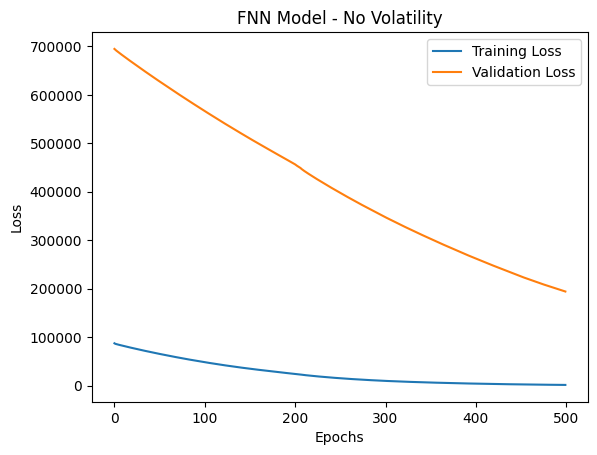

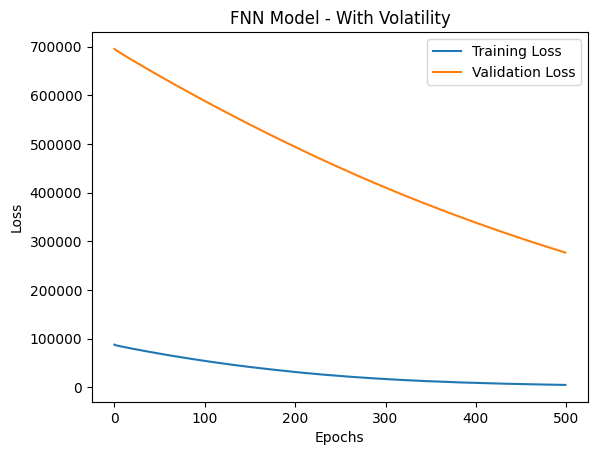

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")

# Austin Nolte 11/3/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Model Without Volatility stats: 
RMSE: 440.6661, 
R²: -3.3625, 
MAPE: 44.0784%
Model With Volatility stats: 
RMSE: 526.2214, 
R²: -5.2208, 
MAPE: 56.6700%
Lift Chart - No Volatility:


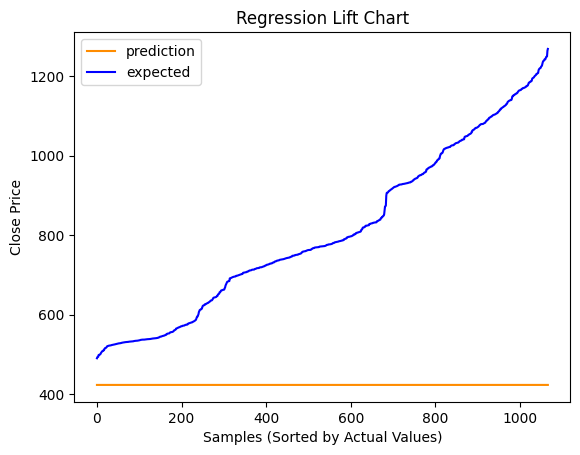

Lift Chart - With Volatility:


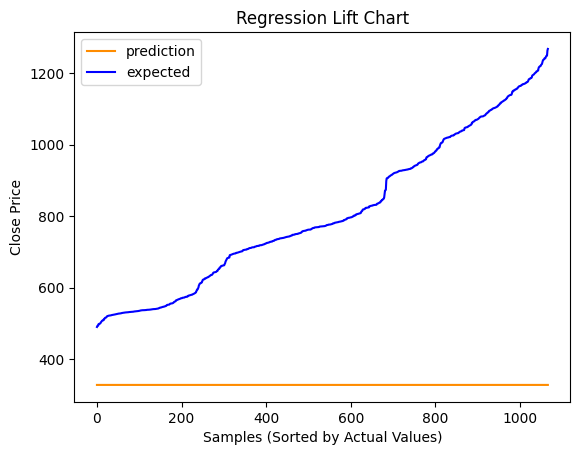

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility stats: \nRMSE: {rmse_no_vol:.4f}, \nR²: {r2_no_vol:.4f}, \nMAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility stats: \nRMSE: {rmse_with_vol:.4f}, \nR²: {r2_with_vol:.4f}, \nMAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Austin Nolte 11/3/24

#### Model 3: 5 Layers, Sigmoid Activation Function, Adam Optimizer


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Build model with no volatility (input = 7 days, 5 features)
model_no_vol = Sequential()
model_no_vol.add(Flatten(input_shape=(7,5)))
model_no_vol.add(Dense(128,activation='sigmoid'))
model_no_vol.add(Dense(64))
model_no_vol.add(Dense(32,activation='relu'))
model_no_vol.add(Dense(16))
model_no_vol.add(Dense(8,activation='sigmoid'))
model_no_vol.add(Dense(1))
model_no_vol.compile(loss='mean_squared_error', optimizer='adam')

# Build model with volatility (input = 7 days, 6 features)
model_with_vol = Sequential()
model_with_vol.add(Flatten(input_shape=(7,6)))
model_with_vol.add(Dense(128,activation='sigmoid'))
model_with_vol.add(Dense(64))
model_with_vol.add(Dense(32,activation='relu'))
model_with_vol.add(Dense(16))
model_with_vol.add(Dense(8,activation='sigmoid'))
model_with_vol.add(Dense(1))
model_with_vol.compile(loss='mean_squared_error', optimizer='adam')

# Early stopping and checkpointing for each model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Austin_fnn_model_3_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Austin_fnn_model_3_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
# Austin Nolte 11/3/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
# Train model without volatility
history_no_vol = model_no_vol.fit(X_train_no_vol, y_train_no_vol_seq,validation_data=(X_test_no_vol, y_test_no_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_no_vol, checkpoint_no_vol],verbose=2)

# Evaluate the model without volatility
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")

# Austin Nolte 11/3/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 695153.43750, saving model to Austin_fnn_model_3_no_vol.keras
79/79 - 2s - 27ms/step - loss: 87012.4531 - val_loss: 695153.4375
Epoch 2/500

Epoch 2: val_loss improved from 695153.43750 to 694175.37500, saving model to Austin_fnn_model_3_no_vol.keras
79/79 - 0s - 6ms/step - loss: 86534.8281 - val_loss: 694175.3750
Epoch 3/500

Epoch 3: val_loss improved from 694175.37500 to 693243.62500, saving model to Austin_fnn_model_3_no_vol.keras
79/79 - 0s - 4ms/step - loss: 86215.2734 - val_loss: 693243.6250
Epoch 4/500

Epoch 4: val_loss improved from 693243.62500 to 692332.25000, saving model to Austin_fnn_model_3_no_vol.keras
79/79 - 0s - 4ms/step - loss: 85908.3047 - val_loss: 692332.2500
Epoch 5/500

Epoch 5: val_loss improved from 692332.25000 to 691430.31250, saving model to Austin_fnn_model_3_no_vol.keras
79/79 - 0s - 3ms/step - loss: 85604.8594 - val_loss: 691430.3125
Epoch 6/500

Epoch 6: val_loss improved from 691430.31250 to 690533.

In [ ]:
# Train model with volatility
history_with_vol = model_with_vol.fit(X_train_with_vol, y_train_with_vol_seq,validation_data=(X_test_with_vol, y_test_with_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_with_vol, checkpoint_with_vol],verbose=2)

# Evaluate the model with volatility
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (With Volatility): {loss_with_vol}")
# Austin Nolte 11/3/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 698587.93750, saving model to Austin_fnn_model_3_with_vol.keras
79/79 - 2s - 31ms/step - loss: 88083.7891 - val_loss: 698587.9375
Epoch 2/500

Epoch 2: val_loss improved from 698587.93750 to 698063.25000, saving model to Austin_fnn_model_3_with_vol.keras
79/79 - 0s - 5ms/step - loss: 87766.1953 - val_loss: 698063.2500
Epoch 3/500

Epoch 3: val_loss improved from 698063.25000 to 697548.62500, saving model to Austin_fnn_model_3_with_vol.keras
79/79 - 1s - 9ms/step - loss: 87591.3047 - val_loss: 697548.6250
Epoch 4/500

Epoch 4: val_loss improved from 697548.62500 to 697035.62500, saving model to Austin_fnn_model_3_with_vol.keras
79/79 - 1s - 8ms/step - loss: 87417.8984 - val_loss: 697035.6250
Epoch 5/500

Epoch 5: val_loss improved from 697035.62500 to 696521.56250, saving model to Austin_fnn_model_3_with_vol.keras
79/79 - 1s - 7ms/step - loss: 87244.9141 - val_loss: 696521.5625
Epoch 6/500

Epoch 6: val_loss improved from 696521.56250 

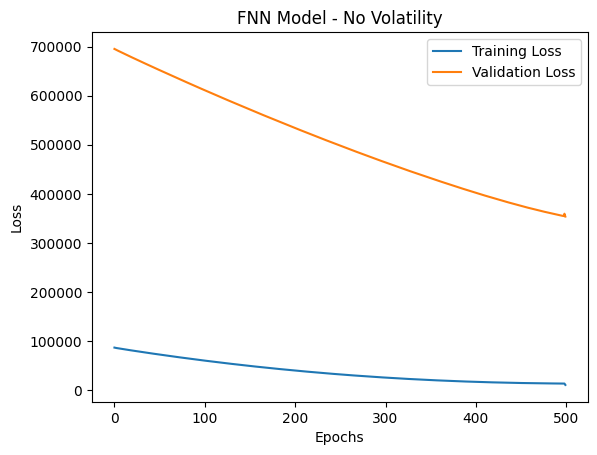

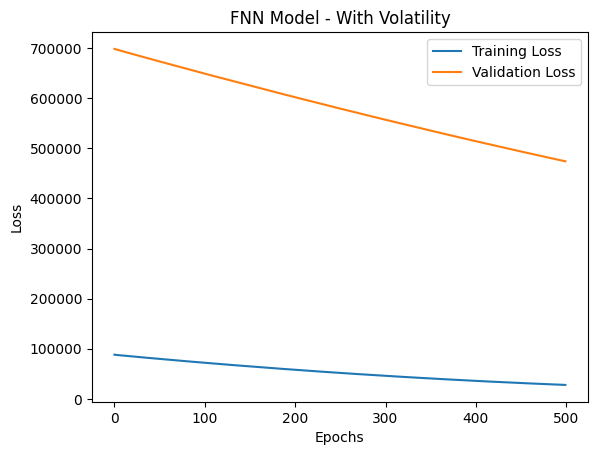

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")

# Austin Nolte 11/3/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Model Without Volatility stats: 
RMSE: 594.7991, 
R²: -6.9479, 
MAPE: 66.4642%
Model With Volatility stats: 
RMSE: 688.5982, 
R²: -9.6523, 
MAPE: 79.6060%
Lift Chart - No Volatility:


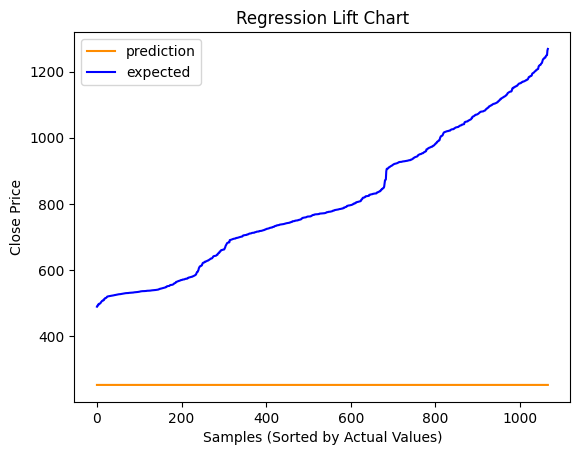

Lift Chart - With Volatility:


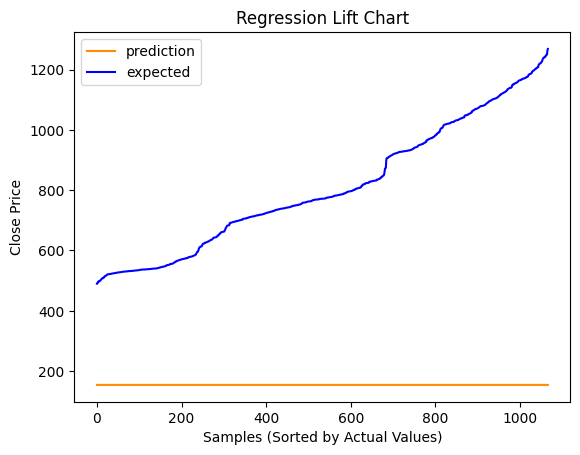

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility stats: \nRMSE: {rmse_no_vol:.4f}, \nR²: {r2_no_vol:.4f}, \nMAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility stats: \nRMSE: {rmse_with_vol:.4f}, \nR²: {r2_with_vol:.4f}, \nMAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Austin Nolte 11/3/24

#### Model 4: 7 Layers, Sigmoid Activation Function, Adam Optimizer


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Build model with no volatility (input = 7 days, 5 features)
model_no_vol = Sequential()
model_no_vol.add(Flatten(input_shape=(7,5)))
model_no_vol.add(Dense(256,activation='sigmoid'))
model_no_vol.add(Dense(128))
model_no_vol.add(Dense(64,activation='relu'))
model_no_vol.add(Dense(32))
model_no_vol.add(Dense(16,activation='relu'))
model_no_vol.add(Dense(8))
model_no_vol.add(Dense(4,activation='sigmoid'))
model_no_vol.add(Dense(1))
model_no_vol.compile(loss='mean_squared_error', optimizer='adam')

# Build model with volatility (input = 7 days, 6 features)
model_with_vol = Sequential()
model_with_vol.add(Flatten(input_shape=(7,6)))
model_with_vol.add(Dense(256,activation='sigmoid'))
model_with_vol.add(Dense(128))
model_with_vol.add(Dense(64,activation='sigmoid'))
model_with_vol.add(Dense(32))
model_with_vol.add(Dense(16,activation='sigmoid'))
model_with_vol.add(Dense(8))
model_with_vol.add(Dense(4,activation='sigmoid'))
model_with_vol.add(Dense(1))
model_with_vol.compile(loss='mean_squared_error', optimizer='adam')

# Early stopping and checkpointing for each model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Austin_fnn_model_4_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Austin_fnn_model_4_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
# Austin Nolte 11/3/24

In [ ]:
# Train model without volatility
history_no_vol = model_no_vol.fit(X_train_no_vol, y_train_no_vol_seq,validation_data=(X_test_no_vol, y_test_no_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_no_vol, checkpoint_no_vol],verbose=2)

# Evaluate the model without volatility
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")

# Austin Nolte 11/3/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 698636.37500, saving model to Austin_fnn_model_4_no_vol.keras
79/79 - 4s - 51ms/step - loss: 87977.2734 - val_loss: 698636.3750
Epoch 2/500

Epoch 2: val_loss improved from 698636.37500 to 698378.50000, saving model to Austin_fnn_model_4_no_vol.keras
79/79 - 1s - 11ms/step - loss: 87826.6016 - val_loss: 698378.5000
Epoch 3/500

Epoch 3: val_loss improved from 698378.50000 to 698124.18750, saving model to Austin_fnn_model_4_no_vol.keras
79/79 - 1s - 8ms/step - loss: 87740.4297 - val_loss: 698124.1875
Epoch 4/500

Epoch 4: val_loss improved from 698124.18750 to 697867.75000, saving model to Austin_fnn_model_4_no_vol.keras
79/79 - 1s - 7ms/step - loss: 87654.1797 - val_loss: 697867.7500
Epoch 5/500

Epoch 5: val_loss improved from 697867.75000 to 697612.81250, saving model to Austin_fnn_model_4_no_vol.keras
79/79 - 0s - 4ms/step - loss: 87567.9141 - val_loss: 697612.8125
Epoch 6/500

Epoch 6: val_loss improved from 697612.81250 to 697357

In [ ]:
# Train model with volatility
history_with_vol = model_with_vol.fit(X_train_with_vol, y_train_with_vol_seq,validation_data=(X_test_with_vol, y_test_with_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_with_vol, checkpoint_with_vol],verbose=2)

# Evaluate the model with volatility
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (With Volatility): {loss_with_vol}")
# Austin Nolte 11/3/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 698683.56250, saving model to Austin_fnn_model_4_with_vol.keras
79/79 - 4s - 56ms/step - loss: 88084.0859 - val_loss: 698683.5625
Epoch 2/500

Epoch 2: val_loss improved from 698683.56250 to 698254.43750, saving model to Austin_fnn_model_4_with_vol.keras
79/79 - 0s - 6ms/step - loss: 87805.5234 - val_loss: 698254.4375
Epoch 3/500

Epoch 3: val_loss improved from 698254.43750 to 697965.75000, saving model to Austin_fnn_model_4_with_vol.keras
79/79 - 1s - 7ms/step - loss: 87691.5078 - val_loss: 697965.7500
Epoch 4/500

Epoch 4: val_loss improved from 697965.75000 to 697696.43750, saving model to Austin_fnn_model_4_with_vol.keras
79/79 - 1s - 8ms/step - loss: 87597.8828 - val_loss: 697696.4375
Epoch 5/500

Epoch 5: val_loss improved from 697696.43750 to 697437.62500, saving model to Austin_fnn_model_4_with_vol.keras
79/79 - 0s - 4ms/step - loss: 87509.6250 - val_loss: 697437.6250
Epoch 6/500

Epoch 6: val_loss improved from 697437.62500 

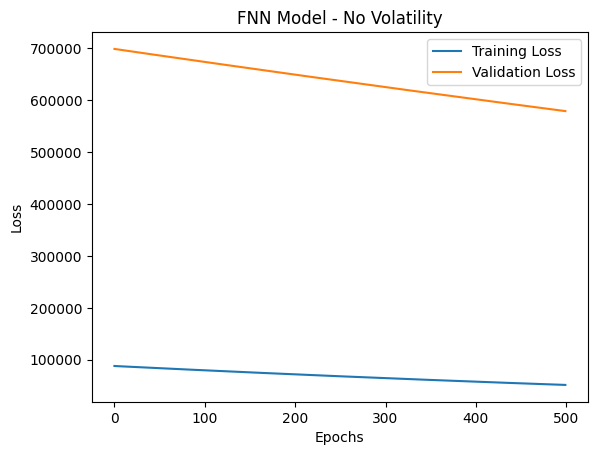

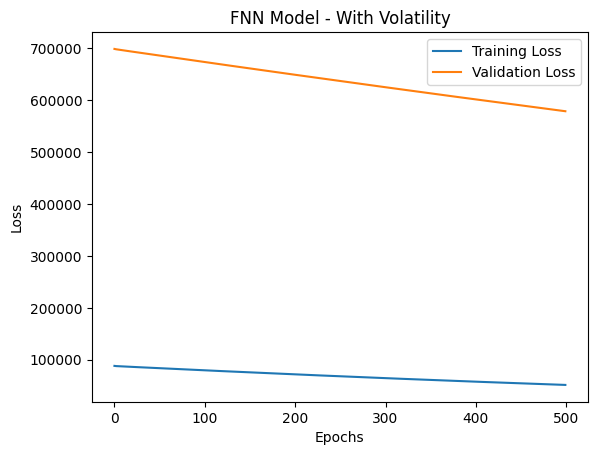

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")

# Austin Nolte 11/3/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Model Without Volatility stats: 
RMSE: 760.8391, 
R²: -12.0046, 
MAPE: 89.5950%
Model With Volatility stats: 
RMSE: 760.6953, 
R²: -11.9997, 
MAPE: 89.5752%
Lift Chart - No Volatility:


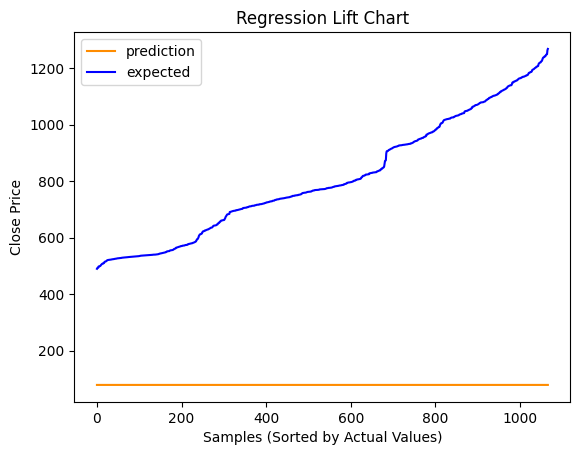

Lift Chart - With Volatility:


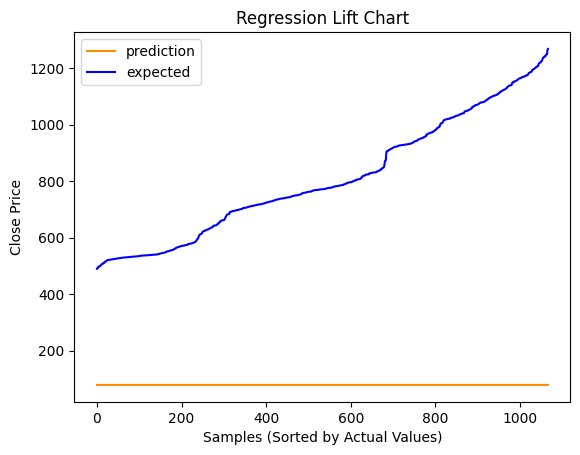

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility stats: \nRMSE: {rmse_no_vol:.4f}, \nR²: {r2_no_vol:.4f}, \nMAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility stats: \nRMSE: {rmse_with_vol:.4f}, \nR²: {r2_with_vol:.4f}, \nMAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Austin Nolte 11/3/24

#### Model 5: 10 Layers, Sigmoid Activation Function, Adam Optimizer


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Build model with no volatility (input = 7 days, 5 features)
model_no_vol = Sequential()
model_no_vol.add(Flatten(input_shape=(7,5)))
model_no_vol.add(Dense(250,activation='sigmoid'))
model_no_vol.add(Dense(225,activation='relu'))
model_no_vol.add(Dense(200,activation='sigmoid'))
model_no_vol.add(Dense(175,activation='relu'))
model_no_vol.add(Dense(150,activation='sigmoid'))
model_no_vol.add(Dense(125,activation='relu'))
model_no_vol.add(Dense(100,activation='sigmoid'))
model_no_vol.add(Dense(75,activation='relu'))
model_no_vol.add(Dense(50,activation='sigmoid'))
model_no_vol.add(Dense(25,activation='sigmoid'))
model_no_vol.add(Dense(1))
model_no_vol.compile(loss='mean_squared_error', optimizer='adam')

# Build model with volatility (input = 7 days, 6 features)
model_with_vol = Sequential()
model_with_vol.add(Flatten(input_shape=(7,6)))
model_with_vol.add(Dense(250,activation='sigmoid'))
model_with_vol.add(Dense(225,activation='relu'))
model_with_vol.add(Dense(200,activation='sigmoid'))
model_with_vol.add(Dense(175,activation='relu'))
model_with_vol.add(Dense(150,activation='sigmoid'))
model_with_vol.add(Dense(125,activation='relu'))
model_with_vol.add(Dense(100,activation='sigmoid'))
model_with_vol.add(Dense(75,activation='relu'))
model_with_vol.add(Dense(50,activation='sigmoid'))
model_with_vol.add(Dense(25,activation='sigmoid'))
model_with_vol.add(Dense(1))
model_with_vol.compile(loss='mean_squared_error', optimizer='adam')

# Early stopping and checkpointing for each model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Austin_fnn_model_5_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Austin_fnn_model_5_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
# Austin Nolte 11/3/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
# Train model without volatility
history_no_vol = model_no_vol.fit(X_train_no_vol, y_train_no_vol_seq,validation_data=(X_test_no_vol, y_test_no_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_no_vol, checkpoint_no_vol],verbose=2)

# Evaluate the model without volatility
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")

# Austin Nolte 11/3/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 694094.25000, saving model to Austin_fnn_model_5_no_vol.keras
79/79 - 4s - 49ms/step - loss: 87067.3359 - val_loss: 694094.2500
Epoch 2/500

Epoch 2: val_loss improved from 694094.25000 to 691188.62500, saving model to Austin_fnn_model_5_no_vol.keras
79/79 - 1s - 17ms/step - loss: 85858.1953 - val_loss: 691188.6250
Epoch 3/500

Epoch 3: val_loss improved from 691188.62500 to 688659.06250, saving model to Austin_fnn_model_5_no_vol.keras
79/79 - 1s - 17ms/step - loss: 84952.0625 - val_loss: 688659.0625
Epoch 4/500

Epoch 4: val_loss improved from 688659.06250 to 686312.31250, saving model to Austin_fnn_model_5_no_vol.keras
79/79 - 1s - 14ms/step - loss: 84146.0469 - val_loss: 686312.3125
Epoch 5/500

Epoch 5: val_loss improved from 686312.31250 to 684037.18750, saving model to Austin_fnn_model_5_no_vol.keras
79/79 - 1s - 8ms/step - loss: 83378.3047 - val_loss: 684037.1875
Epoch 6/500

Epoch 6: val_loss improved from 684037.18750 to 6817

In [ ]:
# Train model with volatility
history_with_vol = model_with_vol.fit(X_train_with_vol, y_train_with_vol_seq,validation_data=(X_test_with_vol, y_test_with_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_with_vol, checkpoint_with_vol],verbose=2)

# Evaluate the model with volatility
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (With Volatility): {loss_with_vol}")
# Austin Nolte 11/3/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 694754.75000, saving model to Austin_fnn_model_5_with_vol.keras
79/79 - 5s - 62ms/step - loss: 87271.2500 - val_loss: 694754.7500
Epoch 2/500

Epoch 2: val_loss improved from 694754.75000 to 692247.50000, saving model to Austin_fnn_model_5_with_vol.keras
79/79 - 1s - 13ms/step - loss: 86129.5859 - val_loss: 692247.5000
Epoch 3/500

Epoch 3: val_loss improved from 692247.50000 to 690097.00000, saving model to Austin_fnn_model_5_with_vol.keras
79/79 - 1s - 11ms/step - loss: 85372.1484 - val_loss: 690097.0000
Epoch 4/500

Epoch 4: val_loss improved from 690097.00000 to 687801.62500, saving model to Austin_fnn_model_5_with_vol.keras
79/79 - 1s - 7ms/step - loss: 84634.7422 - val_loss: 687801.6250
Epoch 5/500

Epoch 5: val_loss improved from 687801.62500 to 685595.87500, saving model to Austin_fnn_model_5_with_vol.keras
79/79 - 1s - 8ms/step - loss: 83884.3594 - val_loss: 685595.8750
Epoch 6/500

Epoch 6: val_loss improved from 685595.8750

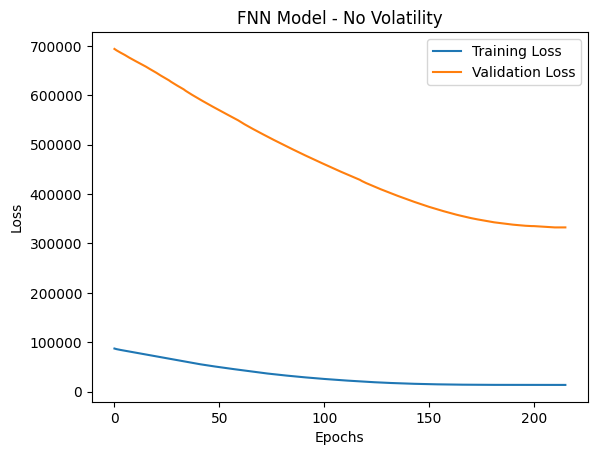

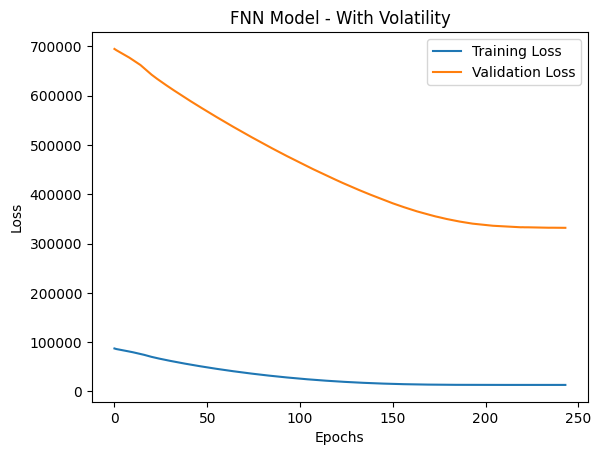

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")

# Austin Nolte 11/3/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Model Without Volatility stats: 
RMSE: 576.5770, 
R²: -6.4684, 
MAPE: 63.8805%
Model With Volatility stats: 
RMSE: 576.0965, 
R²: -6.4559, 
MAPE: 63.8122%
Lift Chart - No Volatility:


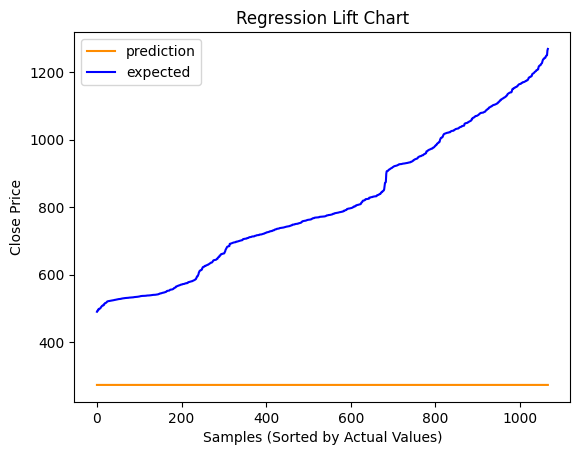

Lift Chart - With Volatility:


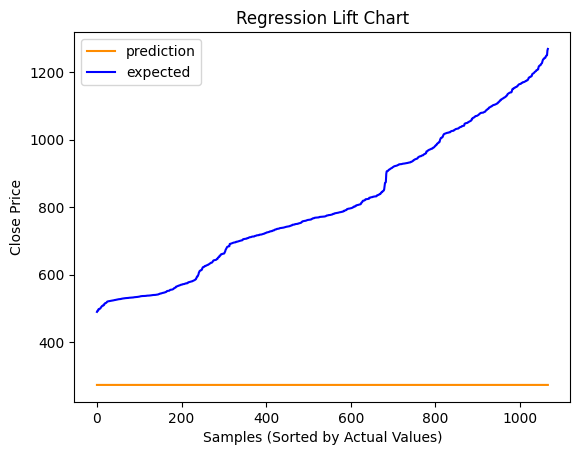

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility stats: \nRMSE: {rmse_no_vol:.4f}, \nR²: {r2_no_vol:.4f}, \nMAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility stats: \nRMSE: {rmse_with_vol:.4f}, \nR²: {r2_with_vol:.4f}, \nMAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Austin Nolte 11/3/24

#### Model 6: 5 Layers one dropout layer, Sigmoid Activation Function, Adam Optimizer


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Build model with no volatility (input = 7 days, 5 features)
model_no_vol = Sequential()
model_no_vol.add(Flatten(input_shape=(7,5)))
model_no_vol.add(Dense(128,activation='sigmoid'))
model_no_vol.add(Dense(64))
model_no_vol.add(Dense(32,activation='relu'))
model_no_vol.add(Dense(16))
model_no_vol.add(Dropout(0.01))
model_no_vol.add(Dense(8,activation='sigmoid'))
model_no_vol.add(Dense(1))
model_no_vol.compile(loss='mean_squared_error', optimizer='adam')

# Build model with volatility (input = 7 days, 6 features)
model_with_vol = Sequential()
model_with_vol.add(Flatten(input_shape=(7,6)))
model_with_vol.add(Dense(128,activation='sigmoid'))
model_with_vol.add(Dense(64))
model_with_vol.add(Dense(32,activation='relu'))
model_with_vol.add(Dense(16))
model_with_vol.add(Dropout(0.01))
model_with_vol.add(Dense(8,activation='sigmoid'))
model_with_vol.add(Dense(1))
model_with_vol.compile(loss='mean_squared_error', optimizer='adam')

# Early stopping and checkpointing for each model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Austin_fnn_model_6_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Austin_fnn_model_6_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
# Austin Nolte 11/3/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
# Train model without volatility
history_no_vol = model_no_vol.fit(X_train_no_vol, y_train_no_vol_seq,validation_data=(X_test_no_vol, y_test_no_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_no_vol, checkpoint_no_vol],verbose=2)

# Evaluate the model without volatility
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")

# Austin Nolte 11/3/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 695257.50000, saving model to Austin_fnn_model_6_no_vol.keras
79/79 - 3s - 42ms/step - loss: 87075.8984 - val_loss: 695257.5000
Epoch 2/500

Epoch 2: val_loss improved from 695257.50000 to 694319.25000, saving model to Austin_fnn_model_6_no_vol.keras
79/79 - 1s - 11ms/step - loss: 86577.0156 - val_loss: 694319.2500
Epoch 3/500

Epoch 3: val_loss improved from 694319.25000 to 693410.06250, saving model to Austin_fnn_model_6_no_vol.keras
79/79 - 1s - 7ms/step - loss: 86268.7734 - val_loss: 693410.0625
Epoch 4/500

Epoch 4: val_loss improved from 693410.06250 to 692504.56250, saving model to Austin_fnn_model_6_no_vol.keras
79/79 - 0s - 4ms/step - loss: 85963.7734 - val_loss: 692504.5625
Epoch 5/500

Epoch 5: val_loss improved from 692504.56250 to 691608.50000, saving model to Austin_fnn_model_6_no_vol.keras
79/79 - 0s - 4ms/step - loss: 85662.9062 - val_loss: 691608.5000
Epoch 6/500

Epoch 6: val_loss improved from 691608.50000 to 690711

In [ ]:
# Train model with volatility
history_with_vol = model_with_vol.fit(X_train_with_vol, y_train_with_vol_seq,validation_data=(X_test_with_vol, y_test_with_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_with_vol, checkpoint_with_vol],verbose=2)

# Evaluate the model with volatility
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (With Volatility): {loss_with_vol}")
# Austin Nolte 11/3/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 695886.06250, saving model to Austin_fnn_model_6_with_vol.keras
79/79 - 2s - 29ms/step - loss: 87209.6016 - val_loss: 695886.0625
Epoch 2/500

Epoch 2: val_loss improved from 695886.06250 to 694825.25000, saving model to Austin_fnn_model_6_with_vol.keras
79/79 - 0s - 6ms/step - loss: 86769.0469 - val_loss: 694825.2500
Epoch 3/500

Epoch 3: val_loss improved from 694825.25000 to 693793.12500, saving model to Austin_fnn_model_6_with_vol.keras
79/79 - 0s - 4ms/step - loss: 86418.0859 - val_loss: 693793.1250
Epoch 4/500

Epoch 4: val_loss improved from 693793.12500 to 692761.18750, saving model to Austin_fnn_model_6_with_vol.keras
79/79 - 0s - 4ms/step - loss: 86071.8281 - val_loss: 692761.1875
Epoch 5/500

Epoch 5: val_loss improved from 692761.18750 to 691740.25000, saving model to Austin_fnn_model_6_with_vol.keras
79/79 - 0s - 4ms/step - loss: 85728.8750 - val_loss: 691740.2500
Epoch 6/500

Epoch 6: val_loss improved from 691740.25000 

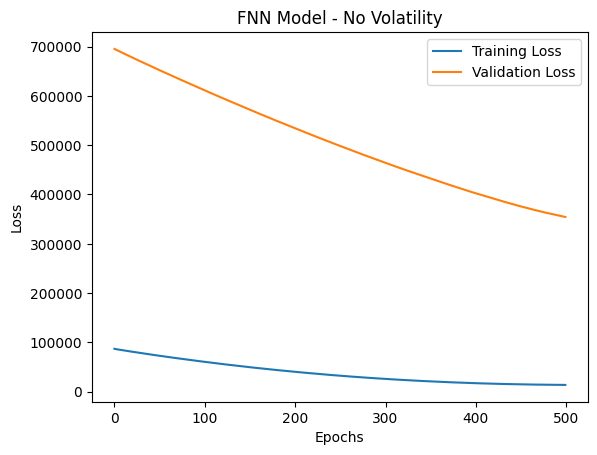

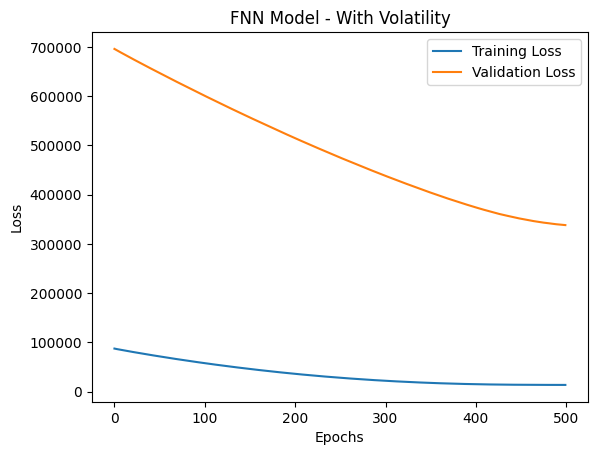

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")

# Austin Nolte 11/3/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Model Without Volatility stats: 
RMSE: 595.3152, 
R²: -6.9617, 
MAPE: 66.5372%
Model With Volatility stats: 
RMSE: 581.3981, 
R²: -6.5938, 
MAPE: 64.5653%
Lift Chart - No Volatility:


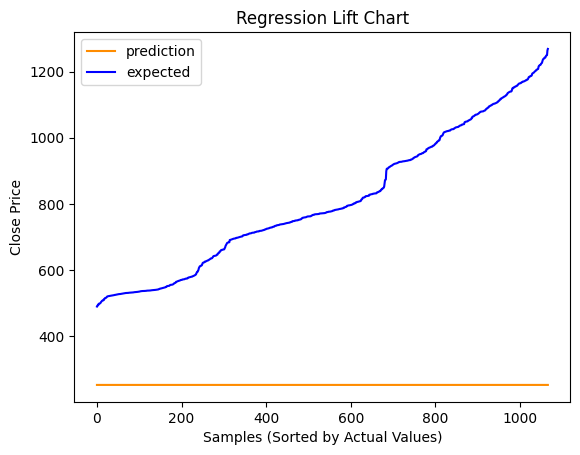

Lift Chart - With Volatility:


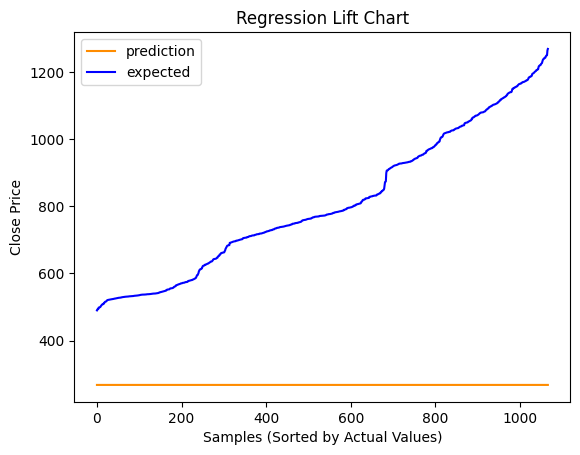

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility stats: \nRMSE: {rmse_no_vol:.4f}, \nR²: {r2_no_vol:.4f}, \nMAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility stats: \nRMSE: {rmse_with_vol:.4f}, \nR²: {r2_with_vol:.4f}, \nMAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Austin Nolte 11/3/24

#### Model 7: 1 Layer, Sigmoid Activation Function, SGD Optimizer


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Build model with no volatility (input = 7 days, 5 features)
model_no_vol = Sequential()
model_no_vol.add(Flatten(input_shape=(7,5)))
model_no_vol.add(Dense(64,activation='sigmoid'))
model_no_vol.add(Dense(1))
model_no_vol.compile(loss='mean_squared_error', optimizer='sgd')

# Build model with volatility (input = 7 days, 6 features)
model_with_vol = Sequential()
model_with_vol.add(Flatten(input_shape=(7,6)))
model_with_vol.add(Dense(64,activation='sigmoid'))
model_with_vol.add(Dense(1))
model_with_vol.compile(loss='mean_squared_error', optimizer='sgd')

# Early stopping and checkpointing for each model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Austin_fnn_model_7_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Austin_fnn_model_7_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
# Austin Nolte 11/3/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
# Train model without volatility
history_no_vol = model_no_vol.fit(X_train_no_vol, y_train_no_vol_seq,validation_data=(X_test_no_vol, y_test_no_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_no_vol, checkpoint_no_vol],verbose=2)

# Evaluate the model without volatility
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")

# Austin Nolte 11/3/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 103491.41406, saving model to Austin_fnn_model_7_no_vol.keras
79/79 - 1s - 18ms/step - loss: 5733.2007 - val_loss: 103491.4141
Epoch 2/500

Epoch 2: val_loss improved from 103491.41406 to 94057.89062, saving model to Austin_fnn_model_7_no_vol.keras
79/79 - 0s - 6ms/step - loss: 310.4477 - val_loss: 94057.8906
Epoch 3/500

Epoch 3: val_loss did not improve from 94057.89062
79/79 - 0s - 4ms/step - loss: 277.0016 - val_loss: 95272.2891
Epoch 4/500

Epoch 4: val_loss improved from 94057.89062 to 87680.91406, saving model to Austin_fnn_model_7_no_vol.keras
79/79 - 0s - 4ms/step - loss: 198.0974 - val_loss: 87680.9141
Epoch 5/500

Epoch 5: val_loss improved from 87680.91406 to 85656.49219, saving model to Austin_fnn_model_7_no_vol.keras
79/79 - 0s - 4ms/step - loss: 128.8949 - val_loss: 85656.4922
Epoch 6/500

Epoch 6: val_loss did not improve from 85656.49219
79/79 - 0s - 3ms/step - loss: 164.1272 - val_loss: 87285.0000
Epoch 7/500

Epoch 

In [ ]:
# Train model with volatility
history_with_vol = model_with_vol.fit(X_train_with_vol, y_train_with_vol_seq,validation_data=(X_test_with_vol, y_test_with_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_with_vol, checkpoint_with_vol],verbose=2)

# Evaluate the model with volatility
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (With Volatility): {loss_with_vol}")
# Austin Nolte 11/3/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 107543.76562, saving model to Austin_fnn_model_7_with_vol.keras
79/79 - 1s - 7ms/step - loss: 6293.9668 - val_loss: 107543.7656
Epoch 2/500

Epoch 2: val_loss improved from 107543.76562 to 97335.46094, saving model to Austin_fnn_model_7_with_vol.keras
79/79 - 0s - 6ms/step - loss: 309.0099 - val_loss: 97335.4609
Epoch 3/500

Epoch 3: val_loss improved from 97335.46094 to 91730.93750, saving model to Austin_fnn_model_7_with_vol.keras
79/79 - 0s - 6ms/step - loss: 245.1431 - val_loss: 91730.9375
Epoch 4/500

Epoch 4: val_loss improved from 91730.93750 to 91470.82812, saving model to Austin_fnn_model_7_with_vol.keras
79/79 - 1s - 7ms/step - loss: 150.3683 - val_loss: 91470.8281
Epoch 5/500

Epoch 5: val_loss improved from 91470.82812 to 86668.94531, saving model to Austin_fnn_model_7_with_vol.keras
79/79 - 0s - 4ms/step - loss: 150.2190 - val_loss: 86668.9453
Epoch 6/500

Epoch 6: val_loss improved from 86668.94531 to 84329.24219, saving

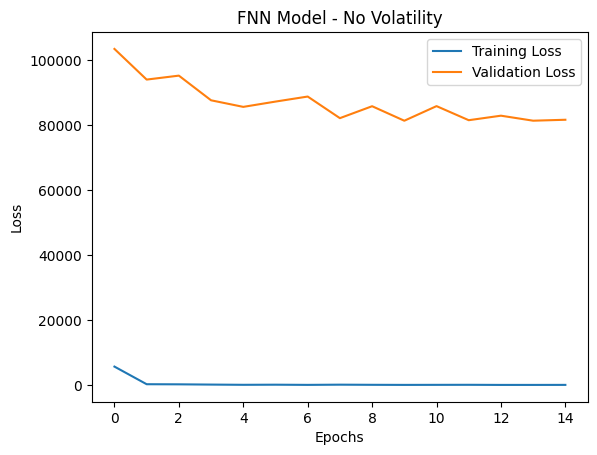

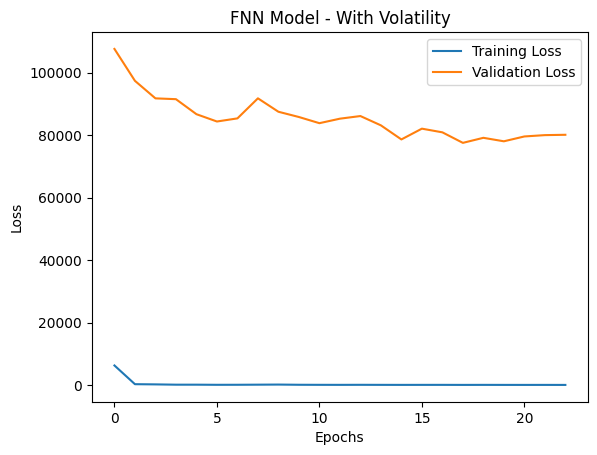

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")

# Austin Nolte 11/3/24

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility stats: \nRMSE: {rmse_no_vol:.4f}, \nR²: {r2_no_vol:.4f}, \nMAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility stats: \nRMSE: {rmse_with_vol:.4f}, \nR²: {r2_with_vol:.4f}, \nMAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Austin Nolte 11/3/24

#### Model 8: 3 Layers, Sigmoid Activation Function, SGD Optimizer


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Build model with no volatility (input = 7 days, 5 features)
model_no_vol = Sequential()
model_no_vol.add(Flatten(input_shape=(7,5)))
model_no_vol.add(Dense(64,activation='sigmoid'))
model_no_vol.add(Dense(32,activation='relu'))
model_no_vol.add(Dense(16,activation='sigmoid'))
model_no_vol.add(Dense(1))
model_no_vol.compile(loss='mean_squared_error', optimizer='sgd')

# Build model with volatility (input = 7 days, 6 features)
model_with_vol = Sequential()
model_with_vol.add(Flatten(input_shape=(7,6)))
model_with_vol.add(Dense(64,activation='sigmoid'))
model_with_vol.add(Dense(32,activation='relu'))
model_with_vol.add(Dense(16,activation='sigmoid'))
model_with_vol.add(Dense(1))
model_with_vol.compile(loss='mean_squared_error', optimizer='sgd')

# Early stopping and checkpointing for each model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Austin_fnn_model_8_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Austin_fnn_model_8_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
# Austin Nolte 11/3/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
# Train model without volatility
history_no_vol = model_no_vol.fit(X_train_no_vol, y_train_no_vol_seq,validation_data=(X_test_no_vol, y_test_no_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_no_vol, checkpoint_no_vol],verbose=2)

# Evaluate the model without volatility
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")

# Austin Nolte 11/3/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 367278.25000, saving model to Austin_fnn_model_8_no_vol.keras
79/79 - 3s - 32ms/step - loss: 15957.9307 - val_loss: 367278.2500
Epoch 2/500

Epoch 2: val_loss improved from 367278.25000 to 361448.15625, saving model to Austin_fnn_model_8_no_vol.keras
79/79 - 2s - 20ms/step - loss: 13428.0488 - val_loss: 361448.1562
Epoch 3/500

Epoch 3: val_loss improved from 361448.15625 to 324479.43750, saving model to Austin_fnn_model_8_no_vol.keras
79/79 - 1s - 9ms/step - loss: 13374.5635 - val_loss: 324479.4375
Epoch 4/500

Epoch 4: val_loss did not improve from 324479.43750
79/79 - 1s - 7ms/step - loss: 13418.7158 - val_loss: 331910.9688
Epoch 5/500

Epoch 5: val_loss improved from 324479.43750 to 250540.56250, saving model to Austin_fnn_model_8_no_vol.keras
79/79 - 1s - 13ms/step - loss: 13413.9795 - val_loss: 250540.5625
Epoch 6/500

Epoch 6: val_loss did not improve from 250540.56250
79/79 - 1s - 10ms/step - loss: 13578.8672 - val_loss: 32151

In [ ]:
# Train model with volatility
history_with_vol = model_with_vol.fit(X_train_with_vol, y_train_with_vol_seq,validation_data=(X_test_with_vol, y_test_with_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_with_vol, checkpoint_with_vol],verbose=2)

# Evaluate the model with volatility
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (With Volatility): {loss_with_vol}")
# Austin Nolte 11/3/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 337191.68750, saving model to Austin_fnn_model_8_with_vol.keras
79/79 - 1s - 14ms/step - loss: 16620.3535 - val_loss: 337191.6875
Epoch 2/500

Epoch 2: val_loss improved from 337191.68750 to 327037.40625, saving model to Austin_fnn_model_8_with_vol.keras
79/79 - 1s - 9ms/step - loss: 13388.8477 - val_loss: 327037.4062
Epoch 3/500

Epoch 3: val_loss did not improve from 327037.40625
79/79 - 2s - 24ms/step - loss: 13366.1885 - val_loss: 338085.5938
Epoch 4/500

Epoch 4: val_loss did not improve from 327037.40625
79/79 - 2s - 27ms/step - loss: 13376.0674 - val_loss: 371440.6250
Epoch 5/500

Epoch 5: val_loss improved from 327037.40625 to 325239.00000, saving model to Austin_fnn_model_8_with_vol.keras
79/79 - 1s - 18ms/step - loss: 13436.2705 - val_loss: 325239.0000
Epoch 6/500

Epoch 6: val_loss did not improve from 325239.00000
79/79 - 1s - 13ms/step - loss: 13395.3936 - val_loss: 352209.3438
Epoch 7/500

Epoch 7: val_loss did not impro

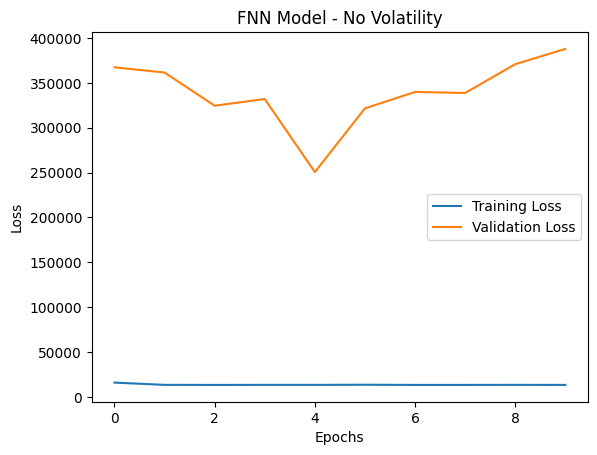

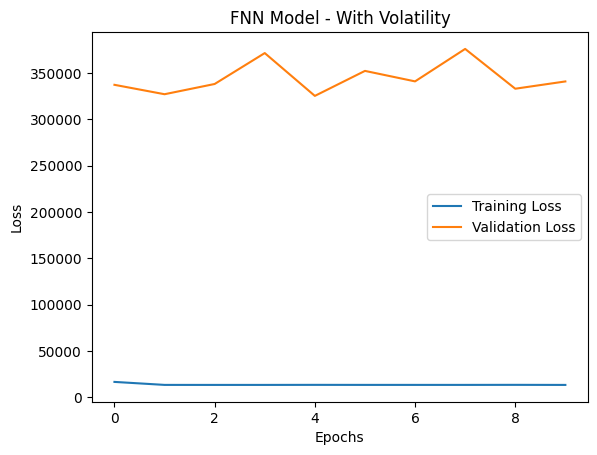

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")

# Austin Nolte 11/3/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Model Without Volatility stats: 
RMSE: 500.5403, 
R²: -4.6285, 
MAPE: 52.9437%
Model With Volatility stats: 
RMSE: 570.2973, 
R²: -6.3066, 
MAPE: 62.9873%
Lift Chart - No Volatility:


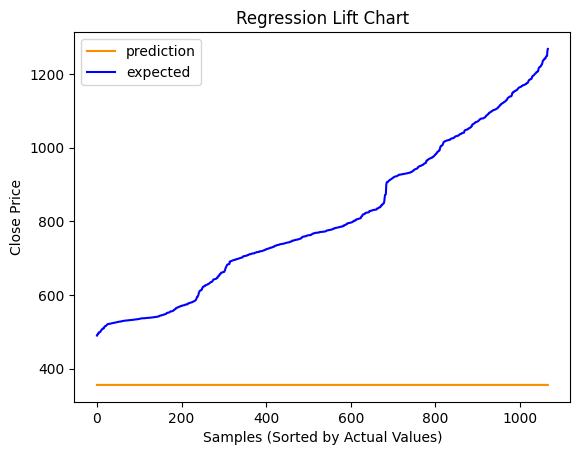

Lift Chart - With Volatility:


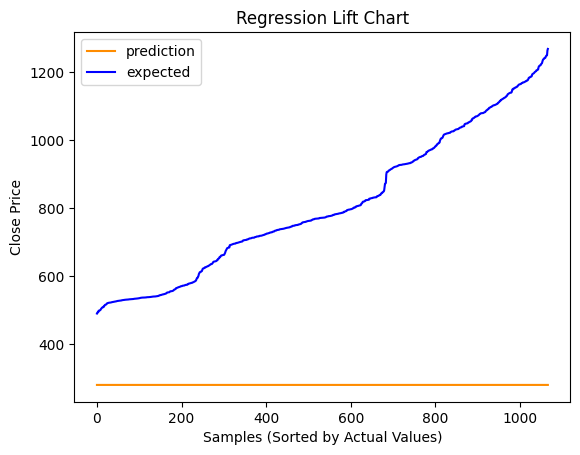

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility stats: \nRMSE: {rmse_no_vol:.4f}, \nR²: {r2_no_vol:.4f}, \nMAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility stats: \nRMSE: {rmse_with_vol:.4f}, \nR²: {r2_with_vol:.4f}, \nMAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Austin Nolte 11/3/24

#### Model 9: 5 Layers, Sigmoid Activation Function, SGD Optimizer


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Build model with no volatility (input = 7 days, 5 features)
model_no_vol = Sequential()
model_no_vol.add(Flatten(input_shape=(7,5)))
model_no_vol.add(Dense(128,activation='sigmoid'))
model_no_vol.add(Dense(64))
model_no_vol.add(Dense(32,activation='relu'))
model_no_vol.add(Dense(16))
model_no_vol.add(Dense(8,activation='sigmoid'))
model_no_vol.add(Dense(1))
model_no_vol.compile(loss='mean_squared_error', optimizer='sgd')

# Build model with volatility (input = 7 days, 6 features)
model_with_vol = Sequential()
model_with_vol.add(Flatten(input_shape=(7,6)))
model_with_vol.add(Dense(128,activation='sigmoid'))
model_with_vol.add(Dense(64))
model_with_vol.add(Dense(32,activation='relu'))
model_with_vol.add(Dense(16))
model_with_vol.add(Dense(8,activation='sigmoid'))
model_with_vol.add(Dense(1))
model_with_vol.compile(loss='mean_squared_error', optimizer='sgd')

# Early stopping and checkpointing for each model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Austin_fnn_model_9_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Austin_fnn_model_9_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
# Austin Nolte 11/3/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
# Train model without volatility
history_no_vol = model_no_vol.fit(X_train_no_vol, y_train_no_vol_seq,validation_data=(X_test_no_vol, y_test_no_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_no_vol, checkpoint_no_vol],verbose=2)

# Evaluate the model without volatility
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")

# Austin Nolte 11/3/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 322630.68750, saving model to Austin_fnn_model_9_no_vol.keras
79/79 - 2s - 31ms/step - loss: 19939.3574 - val_loss: 322630.6875
Epoch 2/500

Epoch 2: val_loss did not improve from 322630.68750
79/79 - 1s - 7ms/step - loss: 13365.0762 - val_loss: 338813.8125
Epoch 3/500

Epoch 3: val_loss did not improve from 322630.68750
79/79 - 1s - 7ms/step - loss: 13348.2744 - val_loss: 340427.3125
Epoch 4/500

Epoch 4: val_loss did not improve from 322630.68750
79/79 - 1s - 10ms/step - loss: 13367.7207 - val_loss: 336036.1562
Epoch 5/500

Epoch 5: val_loss did not improve from 322630.68750
79/79 - 1s - 17ms/step - loss: 13357.2412 - val_loss: 336465.6250
Epoch 6/500

Epoch 6: val_loss did not improve from 322630.68750
79/79 - 2s - 20ms/step - loss: 13333.8564 - val_loss: 327744.6875
Epoch 6: early stopping
Restoring model weights from the end of the best epoch: 1.
34/34 - 0s - 3ms/step - loss: 322630.6875

Test Loss (No Volatility): 322630.6875


In [ ]:
# Train model with volatility
history_with_vol = model_with_vol.fit(X_train_with_vol, y_train_with_vol_seq,validation_data=(X_test_with_vol, y_test_with_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_with_vol, checkpoint_with_vol],verbose=2)

# Evaluate the model with volatility
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (With Volatility): {loss_with_vol}")
# Austin Nolte 11/3/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 324086.68750, saving model to Austin_fnn_model_9_with_vol.keras
79/79 - 1s - 18ms/step - loss: 20894.1250 - val_loss: 324086.6875
Epoch 2/500

Epoch 2: val_loss did not improve from 324086.68750
79/79 - 0s - 4ms/step - loss: 13357.4570 - val_loss: 334298.1562
Epoch 3/500

Epoch 3: val_loss improved from 324086.68750 to 322781.87500, saving model to Austin_fnn_model_9_with_vol.keras
79/79 - 0s - 6ms/step - loss: 13352.2168 - val_loss: 322781.8750
Epoch 4/500

Epoch 4: val_loss did not improve from 322781.87500
79/79 - 0s - 5ms/step - loss: 13363.5664 - val_loss: 329788.3750
Epoch 5/500

Epoch 5: val_loss did not improve from 322781.87500
79/79 - 0s - 5ms/step - loss: 13351.3975 - val_loss: 336933.2188
Epoch 6/500

Epoch 6: val_loss did not improve from 322781.87500
79/79 - 1s - 8ms/step - loss: 13359.0625 - val_loss: 343253.4375
Epoch 7/500

Epoch 7: val_loss did not improve from 322781.87500
79/79 - 0s - 6ms/step - loss: 13369.0146 - 

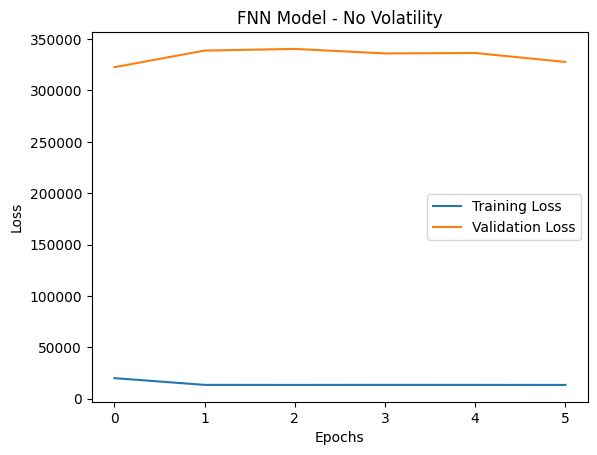

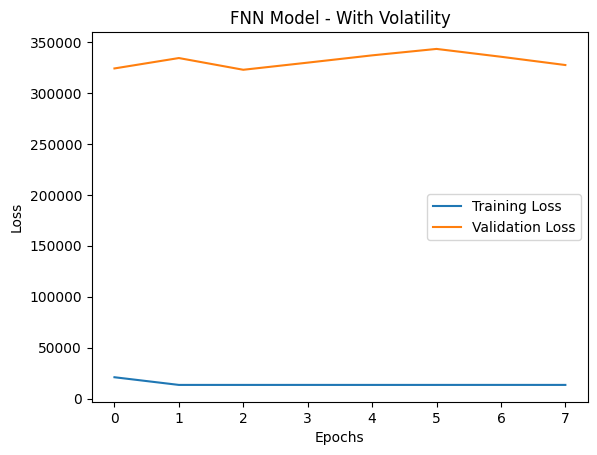

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")

# Austin Nolte 11/3/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Model Without Volatility stats: 
RMSE: 568.0059, 
R²: -6.2480, 
MAPE: 62.6609%
Model With Volatility stats: 
RMSE: 568.1390, 
R²: -6.2514, 
MAPE: 62.6799%
Lift Chart - No Volatility:


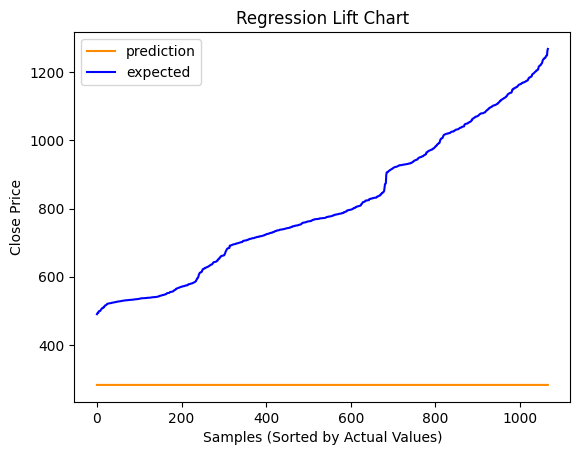

Lift Chart - With Volatility:


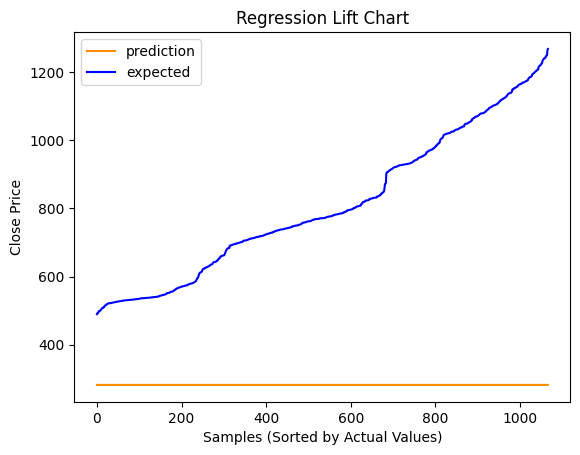

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility stats: \nRMSE: {rmse_no_vol:.4f}, \nR²: {r2_no_vol:.4f}, \nMAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility stats: \nRMSE: {rmse_with_vol:.4f}, \nR²: {r2_with_vol:.4f}, \nMAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Austin Nolte 11/3/24

#### Model 10: 7 Layers, Sigmoid Activation Function, SGD Optimizer


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Build model with no volatility (input = 7 days, 5 features)
model_no_vol = Sequential()
model_no_vol.add(Flatten(input_shape=(7,5)))
model_no_vol.add(Dense(256,activation='sigmoid'))
model_no_vol.add(Dense(128))
model_no_vol.add(Dense(64,activation='relu'))
model_no_vol.add(Dense(32))
model_no_vol.add(Dense(16,activation='relu'))
model_no_vol.add(Dense(8))
model_no_vol.add(Dense(4,activation='sigmoid'))
model_no_vol.add(Dense(1))
model_no_vol.compile(loss='mean_squared_error', optimizer='sgd')

# Build model with volatility (input = 7 days, 6 features)
model_with_vol = Sequential()
model_with_vol.add(Flatten(input_shape=(7,6)))
model_with_vol.add(Dense(256,activation='sigmoid'))
model_with_vol.add(Dense(128))
model_with_vol.add(Dense(64,activation='sigmoid'))
model_with_vol.add(Dense(32))
model_with_vol.add(Dense(16,activation='sigmoid'))
model_with_vol.add(Dense(8))
model_with_vol.add(Dense(4,activation='sigmoid'))
model_with_vol.add(Dense(1))
model_with_vol.compile(loss='mean_squared_error', optimizer='sgd')

# Early stopping and checkpointing for each model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Austin_fnn_model_10_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Austin_fnn_model_10_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
# Austin Nolte 11/3/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
# Train model without volatility
history_no_vol = model_no_vol.fit(X_train_no_vol, y_train_no_vol_seq,validation_data=(X_test_no_vol, y_test_no_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_no_vol, checkpoint_no_vol],verbose=2)

# Evaluate the model without volatility
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")

# Austin Nolte 11/3/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 326116.34375, saving model to Austin_fnn_model_10_no_vol.keras
79/79 - 1s - 18ms/step - loss: 18842.4277 - val_loss: 326116.3438
Epoch 2/500

Epoch 2: val_loss did not improve from 326116.34375
79/79 - 1s - 13ms/step - loss: 13357.6279 - val_loss: 329397.9062
Epoch 3/500

Epoch 3: val_loss did not improve from 326116.34375
79/79 - 1s - 8ms/step - loss: 13344.6084 - val_loss: 345188.8438
Epoch 4/500

Epoch 4: val_loss improved from 326116.34375 to 319573.62500, saving model to Austin_fnn_model_10_no_vol.keras
79/79 - 1s - 9ms/step - loss: 13352.1270 - val_loss: 319573.6250
Epoch 5/500

Epoch 5: val_loss did not improve from 319573.62500
79/79 - 1s - 7ms/step - loss: 13374.9404 - val_loss: 339107.2188
Epoch 6/500

Epoch 6: val_loss did not improve from 319573.62500
79/79 - 1s - 8ms/step - loss: 13338.7070 - val_loss: 338072.0000
Epoch 7/500

Epoch 7: val_loss did not improve from 319573.62500
79/79 - 1s - 8ms/step - loss: 13370.7656 - v

In [ ]:
# Train model with volatility
history_with_vol = model_with_vol.fit(X_train_with_vol, y_train_with_vol_seq,validation_data=(X_test_with_vol, y_test_with_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_with_vol, checkpoint_with_vol],verbose=2)

# Evaluate the model with volatility
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (With Volatility): {loss_with_vol}")
# Austin Nolte 11/3/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 329278.90625, saving model to Austin_fnn_model_10_with_vol.keras
79/79 - 1s - 18ms/step - loss: 19189.9395 - val_loss: 329278.9062
Epoch 2/500

Epoch 2: val_loss did not improve from 329278.90625
79/79 - 1s - 11ms/step - loss: 13345.5771 - val_loss: 357308.4688
Epoch 3/500

Epoch 3: val_loss did not improve from 329278.90625
79/79 - 1s - 8ms/step - loss: 13380.4150 - val_loss: 342645.5000
Epoch 4/500

Epoch 4: val_loss improved from 329278.90625 to 325131.31250, saving model to Austin_fnn_model_10_with_vol.keras
79/79 - 1s - 9ms/step - loss: 13357.8945 - val_loss: 325131.3125
Epoch 5/500

Epoch 5: val_loss improved from 325131.31250 to 314011.25000, saving model to Austin_fnn_model_10_with_vol.keras
79/79 - 1s - 8ms/step - loss: 13362.4531 - val_loss: 314011.2500
Epoch 6/500

Epoch 6: val_loss did not improve from 314011.25000
79/79 - 0s - 6ms/step - loss: 13335.1279 - val_loss: 334534.4375
Epoch 7/500

Epoch 7: val_loss did not impro

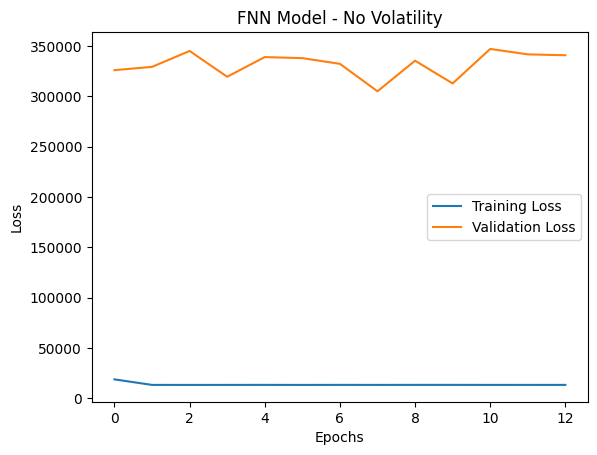

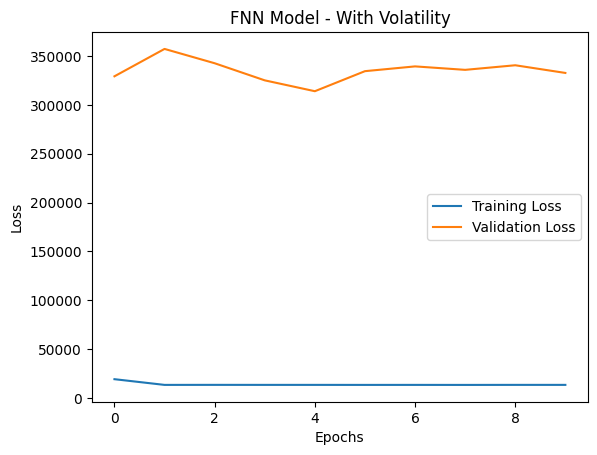

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")

# Austin Nolte 11/3/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step
Model Without Volatility stats: 
RMSE: 552.3937, 
R²: -5.8550, 
MAPE: 60.4318%
Model With Volatility stats: 
RMSE: 560.3671, 
R²: -6.0544, 
MAPE: 61.5715%
Lift Chart - No Volatility:


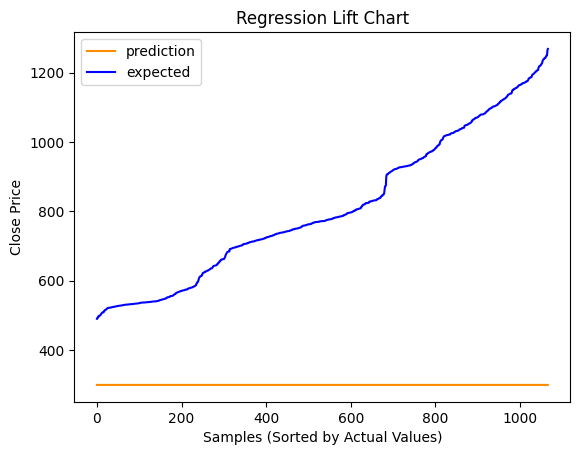

Lift Chart - With Volatility:


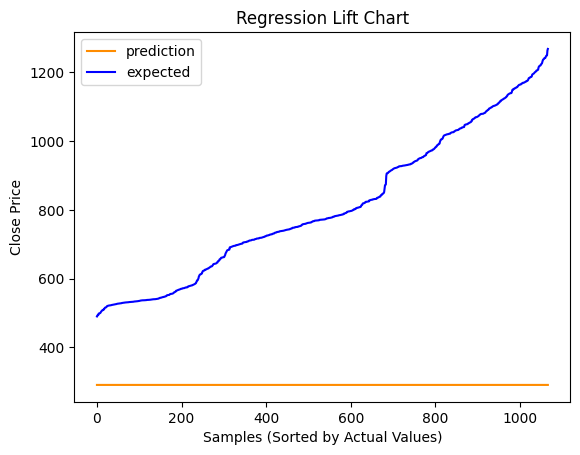

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility stats: \nRMSE: {rmse_no_vol:.4f}, \nR²: {r2_no_vol:.4f}, \nMAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility stats: \nRMSE: {rmse_with_vol:.4f}, \nR²: {r2_with_vol:.4f}, \nMAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Austin Nolte 11/3/24

#### Model 11: 10 Layers, Sigmoid Activation Function, sgd Optimizer


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Build model with no volatility (input = 7 days, 5 features)
model_no_vol = Sequential()
model_no_vol.add(Flatten(input_shape=(7,5)))
model_no_vol.add(Dense(250,activation='sigmoid'))
model_no_vol.add(Dense(225,activation='relu'))
model_no_vol.add(Dense(200,activation='sigmoid'))
model_no_vol.add(Dense(175,activation='relu'))
model_no_vol.add(Dense(150,activation='sigmoid'))
model_no_vol.add(Dense(125,activation='relu'))
model_no_vol.add(Dense(100,activation='sigmoid'))
model_no_vol.add(Dense(75,activation='relu'))
model_no_vol.add(Dense(50,activation='sigmoid'))
model_no_vol.add(Dense(25,activation='sigmoid'))
model_no_vol.add(Dense(1))
model_no_vol.compile(loss='mean_squared_error', optimizer='sgd')

# Build model with volatility (input = 7 days, 6 features)
model_with_vol = Sequential()
model_with_vol.add(Flatten(input_shape=(7,6)))
model_with_vol.add(Dense(250,activation='sigmoid'))
model_with_vol.add(Dense(225,activation='relu'))
model_with_vol.add(Dense(200,activation='sigmoid'))
model_with_vol.add(Dense(175,activation='relu'))
model_with_vol.add(Dense(150,activation='sigmoid'))
model_with_vol.add(Dense(125,activation='relu'))
model_with_vol.add(Dense(100,activation='sigmoid'))
model_with_vol.add(Dense(75,activation='relu'))
model_with_vol.add(Dense(50,activation='sigmoid'))
model_with_vol.add(Dense(25,activation='sigmoid'))
model_with_vol.add(Dense(1))
model_with_vol.compile(loss='mean_squared_error', optimizer='sgd')

# Early stopping and checkpointing for each model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Austin_fnn_model_11_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Austin_fnn_model_11_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
# Austin Nolte 11/3/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
# Train model without volatility
history_no_vol = model_no_vol.fit(X_train_no_vol, y_train_no_vol_seq,validation_data=(X_test_no_vol, y_test_no_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_no_vol, checkpoint_no_vol],verbose=2)

# Evaluate the model without volatility
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")

# Austin Nolte 11/3/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 261478.56250, saving model to Austin_fnn_model_11_no_vol.keras
79/79 - 2s - 25ms/step - loss: 15723.2666 - val_loss: 261478.5625
Epoch 2/500

Epoch 2: val_loss did not improve from 261478.56250
79/79 - 1s - 10ms/step - loss: 13561.6260 - val_loss: 351442.8125
Epoch 3/500

Epoch 3: val_loss did not improve from 261478.56250
79/79 - 1s - 8ms/step - loss: 13489.6387 - val_loss: 350450.5312
Epoch 4/500

Epoch 4: val_loss did not improve from 261478.56250
79/79 - 1s - 16ms/step - loss: 13432.9209 - val_loss: 337307.5000
Epoch 5/500

Epoch 5: val_loss did not improve from 261478.56250
79/79 - 1s - 16ms/step - loss: 13480.0957 - val_loss: 374963.0312
Epoch 6/500

Epoch 6: val_loss did not improve from 261478.56250
79/79 - 1s - 18ms/step - loss: 13443.4521 - val_loss: 429222.3438
Epoch 6: early stopping
Restoring model weights from the end of the best epoch: 1.
34/34 - 0s - 8ms/step - loss: 261478.5625

Test Loss (No Volatility): 261478.5625


In [ ]:
# Train model with volatility
history_with_vol = model_with_vol.fit(X_train_with_vol, y_train_with_vol_seq,validation_data=(X_test_with_vol, y_test_with_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_with_vol, checkpoint_with_vol],verbose=2)

# Evaluate the model with volatility
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (With Volatility): {loss_with_vol}")
# Austin Nolte 11/3/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 224661.84375, saving model to Austin_fnn_model_11_with_vol.keras
79/79 - 4s - 46ms/step - loss: 15613.0410 - val_loss: 224661.8438
Epoch 2/500

Epoch 2: val_loss did not improve from 224661.84375
79/79 - 4s - 52ms/step - loss: 13628.8730 - val_loss: 336438.1875
Epoch 3/500

Epoch 3: val_loss did not improve from 224661.84375
79/79 - 2s - 25ms/step - loss: 13459.3125 - val_loss: 329395.8125
Epoch 4/500

Epoch 4: val_loss did not improve from 224661.84375
79/79 - 1s - 17ms/step - loss: 13472.2178 - val_loss: 263248.7188
Epoch 5/500

Epoch 5: val_loss did not improve from 224661.84375
79/79 - 1s - 13ms/step - loss: 13571.5820 - val_loss: 308932.9375
Epoch 6/500

Epoch 6: val_loss did not improve from 224661.84375
79/79 - 1s - 16ms/step - loss: 13442.8867 - val_loss: 288128.0000
Epoch 6: early stopping
Restoring model weights from the end of the best epoch: 1.
34/34 - 0s - 9ms/step - loss: 224661.8438
Test Loss (With Volatility): 224661.8

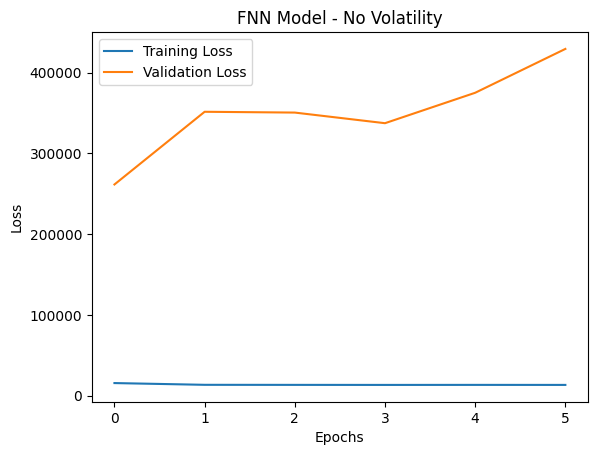

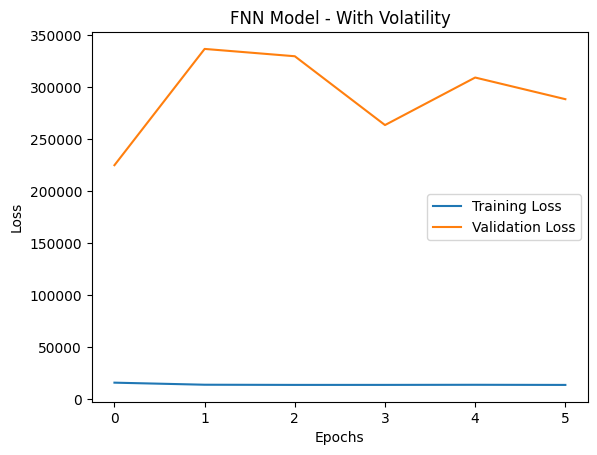

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")

# Austin Nolte 11/3/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
Model Without Volatility stats: 
RMSE: 511.3497, 
R²: -4.8742, 
MAPE: 54.5168%
Model With Volatility stats: 
RMSE: 473.9850, 
R²: -4.0471, 
MAPE: 49.0467%
Lift Chart - No Volatility:


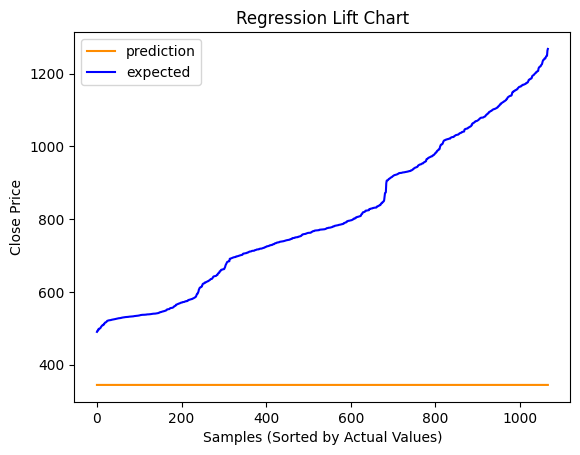

Lift Chart - With Volatility:


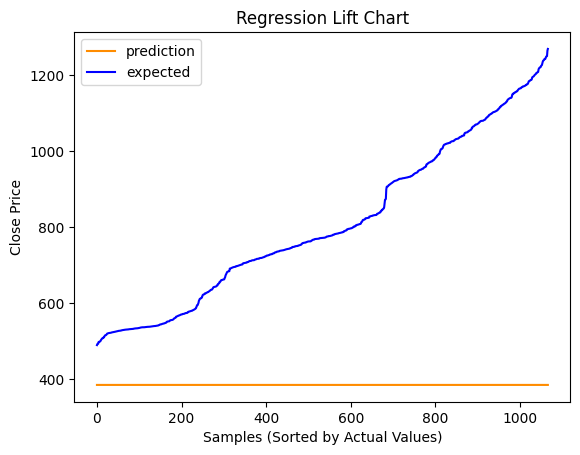

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility stats: \nRMSE: {rmse_no_vol:.4f}, \nR²: {r2_no_vol:.4f}, \nMAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility stats: \nRMSE: {rmse_with_vol:.4f}, \nR²: {r2_with_vol:.4f}, \nMAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Austin Nolte 11/3/24

#### Model 12: 5 Layers one dropout layer, Sigmoid Activation Function, sgd Optimizer


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Build model with no volatility (input = 7 days, 5 features)
model_no_vol = Sequential()
model_no_vol.add(Flatten(input_shape=(7,5)))
model_no_vol.add(Dense(128,activation='sigmoid'))
model_no_vol.add(Dense(64))
model_no_vol.add(Dense(32,activation='relu'))
model_no_vol.add(Dense(16))
model_no_vol.add(Dropout(0.01))
model_no_vol.add(Dense(8,activation='sigmoid'))
model_no_vol.add(Dense(1))
model_no_vol.compile(loss='mean_squared_error', optimizer='sgd')

# Build model with volatility (input = 7 days, 6 features)
model_with_vol = Sequential()
model_with_vol.add(Flatten(input_shape=(7,6)))
model_with_vol.add(Dense(128,activation='sigmoid'))
model_with_vol.add(Dense(64))
model_with_vol.add(Dense(32,activation='relu'))
model_with_vol.add(Dense(16))
model_with_vol.add(Dropout(0.01))
model_with_vol.add(Dense(8,activation='sigmoid'))
model_with_vol.add(Dense(1))
model_with_vol.compile(loss='mean_squared_error', optimizer='sgd')

# Early stopping and checkpointing for each model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Austin_fnn_model_12_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Austin_fnn_model_12_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
# Austin Nolte 11/3/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
# Train model without volatility
history_no_vol = model_no_vol.fit(X_train_no_vol, y_train_no_vol_seq,validation_data=(X_test_no_vol, y_test_no_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_no_vol, checkpoint_no_vol],verbose=2)

# Evaluate the model without volatility
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")

# Austin Nolte 11/3/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 329810.78125, saving model to Austin_fnn_model_12_no_vol.keras
79/79 - 3s - 42ms/step - loss: 17719.0938 - val_loss: 329810.7812
Epoch 2/500

Epoch 2: val_loss did not improve from 329810.78125
79/79 - 1s - 17ms/step - loss: 13384.6328 - val_loss: 349268.3438
Epoch 3/500

Epoch 3: val_loss did not improve from 329810.78125
79/79 - 1s - 8ms/step - loss: 13404.2637 - val_loss: 334855.6562
Epoch 4/500

Epoch 4: val_loss did not improve from 329810.78125
79/79 - 0s - 4ms/step - loss: 13376.0156 - val_loss: 342679.5000
Epoch 5/500

Epoch 5: val_loss did not improve from 329810.78125
79/79 - 1s - 8ms/step - loss: 13365.6143 - val_loss: 340983.7188
Epoch 6/500

Epoch 6: val_loss did not improve from 329810.78125
79/79 - 1s - 8ms/step - loss: 13363.3115 - val_loss: 345526.7188
Epoch 6: early stopping
Restoring model weights from the end of the best epoch: 1.
34/34 - 0s - 3ms/step - loss: 329810.7812

Test Loss (No Volatility): 329810.78125


In [ ]:
# Train model with volatility
history_with_vol = model_with_vol.fit(X_train_with_vol, y_train_with_vol_seq,validation_data=(X_test_with_vol, y_test_with_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_with_vol, checkpoint_with_vol],verbose=2)

# Evaluate the model with volatility
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (With Volatility): {loss_with_vol}")
# Austin Nolte 11/3/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 325698.12500, saving model to Austin_fnn_model_12_with_vol.keras
79/79 - 1s - 15ms/step - loss: 17962.4375 - val_loss: 325698.1250
Epoch 2/500

Epoch 2: val_loss improved from 325698.12500 to 312814.84375, saving model to Austin_fnn_model_12_with_vol.keras
79/79 - 0s - 5ms/step - loss: 13361.5059 - val_loss: 312814.8438
Epoch 3/500

Epoch 3: val_loss did not improve from 312814.84375
79/79 - 1s - 7ms/step - loss: 13381.9893 - val_loss: 340192.8125
Epoch 4/500

Epoch 4: val_loss did not improve from 312814.84375
79/79 - 1s - 7ms/step - loss: 13363.1455 - val_loss: 336840.6250
Epoch 5/500

Epoch 5: val_loss did not improve from 312814.84375
79/79 - 0s - 4ms/step - loss: 13376.2207 - val_loss: 342491.0312
Epoch 6/500

Epoch 6: val_loss did not improve from 312814.84375
79/79 - 0s - 4ms/step - loss: 13370.2676 - val_loss: 337464.9375
Epoch 7/500

Epoch 7: val_loss did not improve from 312814.84375
79/79 - 1s - 8ms/step - loss: 13372.6309 

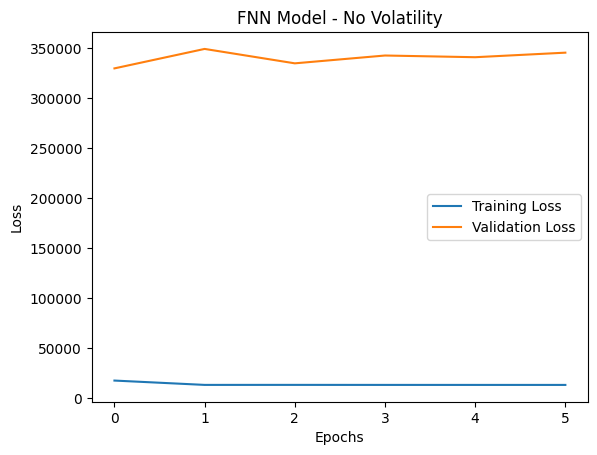

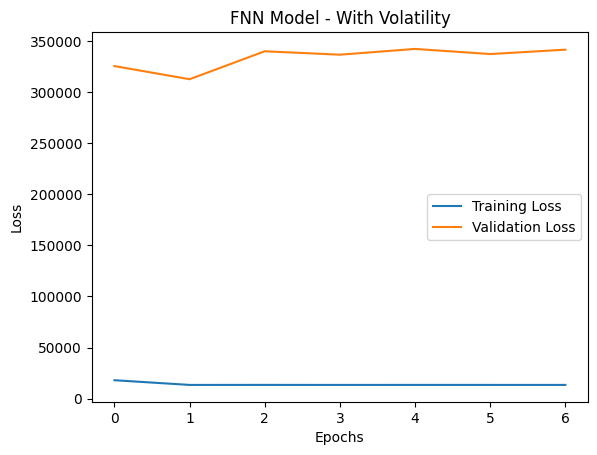

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")

# Austin Nolte 11/3/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Model Without Volatility stats: 
RMSE: 574.2915, 
R²: -6.4093, 
MAPE: 63.5556%
Model With Volatility stats: 
RMSE: 559.2986, 
R²: -6.0275, 
MAPE: 61.4189%
Lift Chart - No Volatility:


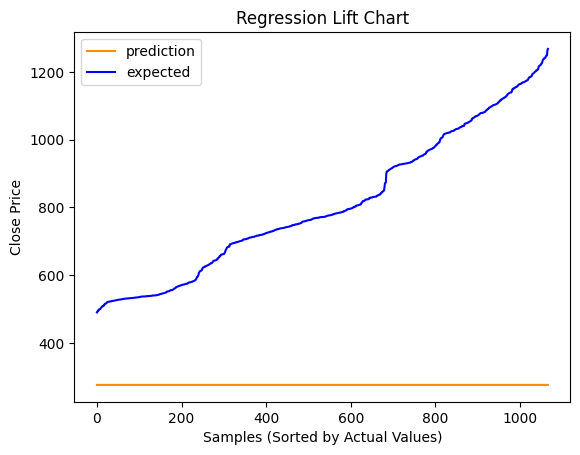

Lift Chart - With Volatility:


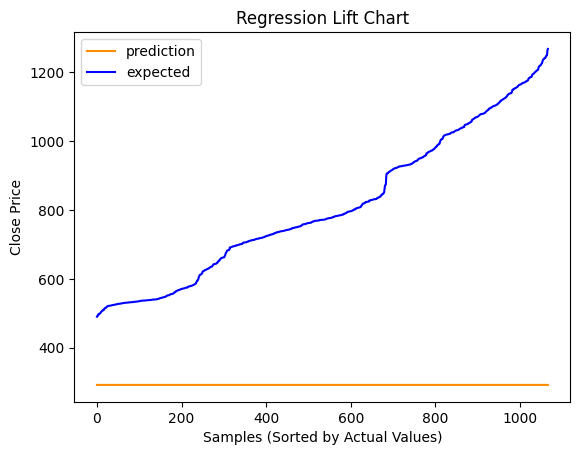

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility stats: \nRMSE: {rmse_no_vol:.4f}, \nR²: {r2_no_vol:.4f}, \nMAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility stats: \nRMSE: {rmse_with_vol:.4f}, \nR²: {r2_with_vol:.4f}, \nMAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Austin Nolte 11/3/24

### FNN Model Design and Testing (Alan Lei)

#### Model 1: tanh Activation Function, 6 layer, Adam Optimizer


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the FNN model
def build_fnn_model(input_shape):
  model = Sequential()
  model.add(Flatten(input_shape=input_shape))  # Flatten the input
  model.add(Dense(128, activation='relu'))      # Hidden layer 1
  model.add(Dense(64, activation='tanh'))      # Hidden layer 2
  model.add(Dense(32, activation='tanh'))      # Hidden layer 3
  model.add(Dense(16, activation='tanh'))      # Hidden layer 4
  model.add(Dense(8, activation='tanh'))       # Hidden layer 5
  model.add(Dense(4, activation='tanh'))       # Hidden layer 6
  model.add(Dense(1))                          # Output layer (no activation for regression)
  model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
  return model

# Build FNN models for both datasets
model_no_vol = build_fnn_model((7, 5))  # No-volatility model input: (7 days, 5 features)
model_with_vol = build_fnn_model((7, 6))  # With-volatility model input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Alan_fnn_model_1_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Alan_fnn_model_1_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the FNN model without volatility
history_no_vol = model_no_vol.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the FNN model with volatility
history_with_vol = model_with_vol.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")
print(f"Test Loss (With Volatility): {loss_with_vol}")

## Alan Lei

Epoch 1/500


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



Epoch 1: val_loss improved from inf to 695966.00000, saving model to Alan_fnn_model_1_no_vol.keras
79/79 - 7s - 89ms/step - loss: 87221.2891 - val_loss: 695966.0000
Epoch 2/500

Epoch 2: val_loss improved from 695966.00000 to 695186.81250, saving model to Alan_fnn_model_1_no_vol.keras
79/79 - 0s - 3ms/step - loss: 86839.2500 - val_loss: 695186.8125
Epoch 3/500

Epoch 3: val_loss improved from 695186.81250 to 694472.12500, saving model to Alan_fnn_model_1_no_vol.keras
79/79 - 0s - 4ms/step - loss: 86589.3516 - val_loss: 694472.1250
Epoch 4/500

Epoch 4: val_loss improved from 694472.12500 to 693784.75000, saving model to Alan_fnn_model_1_no_vol.keras
79/79 - 0s - 3ms/step - loss: 86353.8672 - val_loss: 693784.7500
Epoch 5/500

Epoch 5: val_loss improved from 693784.75000 to 693121.31250, saving model to Alan_fnn_model_1_no_vol.keras
79/79 - 0s - 3ms/step - loss: 86129.0859 - val_loss: 693121.3125
Epoch 6/500

Epoch 6: val_loss improved from 693121.31250 to 692466.68750, saving model to

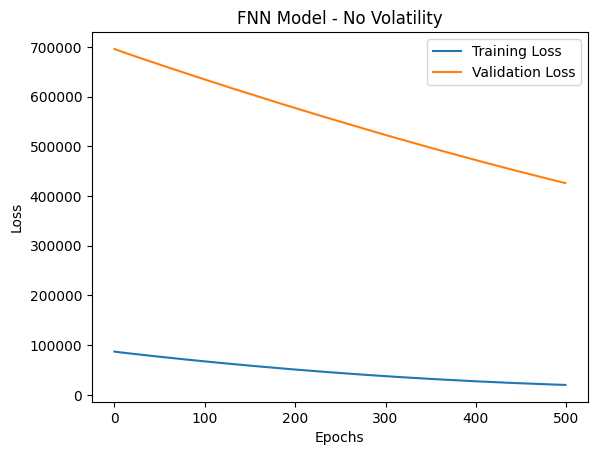

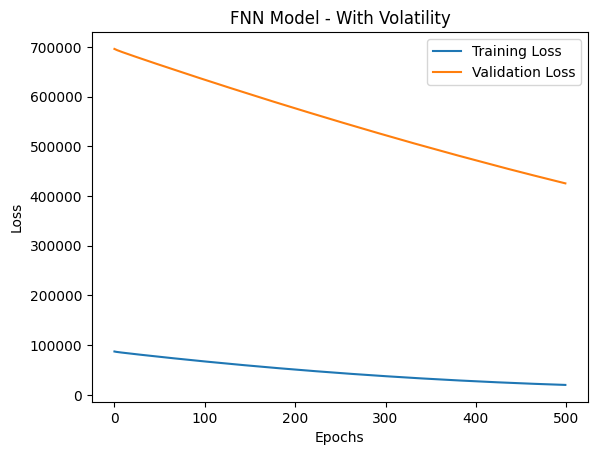

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")



34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Model Without Volatility - RMSE: 652.7150, R²: -8.5710, MAPE: 74.6057%
Model With Volatility - RMSE: 652.3434, R²: -8.5602, MAPE: 74.5538%
Lift Chart - No Volatility:


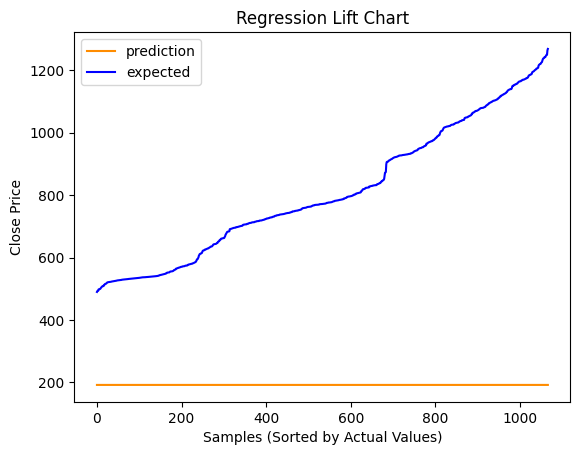

Lift Chart - With Volatility:


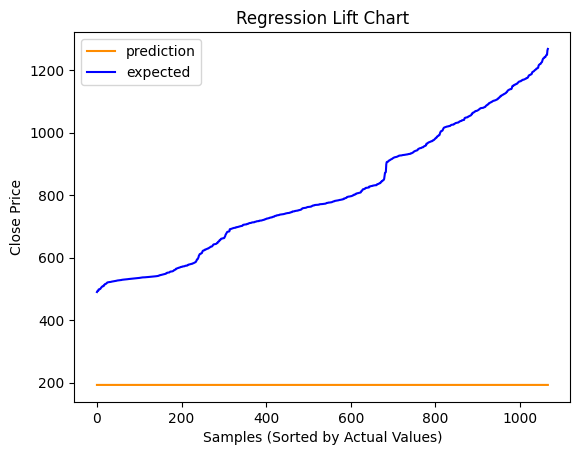

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility - RMSE: {rmse_no_vol:.4f}, R²: {r2_no_vol:.4f}, MAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility - RMSE: {rmse_with_vol:.4f}, R²: {r2_with_vol:.4f}, MAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)


#### Model 2: tanh Activation Function 3 layer, Adam Optimizer - alterered learning rate 0.005


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the FNN model
def build_fnn_model(input_shape):
  model = Sequential()
  model.add(Flatten(input_shape=input_shape))  # Flatten the input
  model.add(Dense(128, activation='tanh'))      # Hidden layer 1
  model.add(Dense(32, activation='tanh'))      # Hidden layer 2
  model.add(Dense(8, activation='tanh'))       # Hidden layer 3
  model.add(Dense(1))                          # Output layer (no activation for regression)
  model.compile(optimizer=Adam(learning_rate=0.005), loss='mean_squared_error')
  return model

# Build FNN models for both datasets
model_no_vol = build_fnn_model((7, 5))  # No-volatility model input: (7 days, 5 features)
model_with_vol = build_fnn_model((7, 6))  # With-volatility model input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Alan_fnn_model_2_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Alan_fnn_model_2_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the FNN model without volatility
history_no_vol = model_no_vol.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the FNN model with volatility
history_with_vol = model_with_vol.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")
print(f"Test Loss (With Volatility): {loss_with_vol}")

## Alan Lei

Epoch 1/500


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



Epoch 1: val_loss improved from inf to 687537.81250, saving model to Alan_fnn_model_2_no_vol.keras
79/79 - 3s - 39ms/step - loss: 85264.7266 - val_loss: 687537.8125
Epoch 2/500

Epoch 2: val_loss improved from 687537.81250 to 681779.00000, saving model to Alan_fnn_model_2_no_vol.keras
79/79 - 0s - 3ms/step - loss: 83219.3125 - val_loss: 681779.0000
Epoch 3/500

Epoch 3: val_loss improved from 681779.00000 to 676139.75000, saving model to Alan_fnn_model_2_no_vol.keras
79/79 - 0s - 3ms/step - loss: 81339.1016 - val_loss: 676139.7500
Epoch 4/500

Epoch 4: val_loss improved from 676139.75000 to 670626.37500, saving model to Alan_fnn_model_2_no_vol.keras
79/79 - 0s - 4ms/step - loss: 79528.5391 - val_loss: 670626.3750
Epoch 5/500

Epoch 5: val_loss improved from 670626.37500 to 665178.75000, saving model to Alan_fnn_model_2_no_vol.keras
79/79 - 0s - 3ms/step - loss: 77758.9766 - val_loss: 665178.7500
Epoch 6/500

Epoch 6: val_loss improved from 665178.75000 to 659758.37500, saving model to

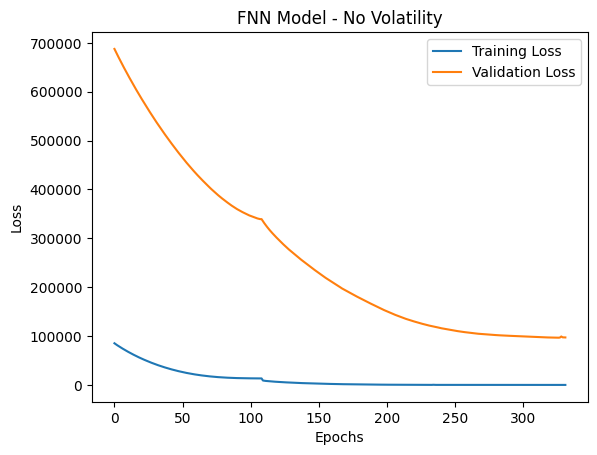

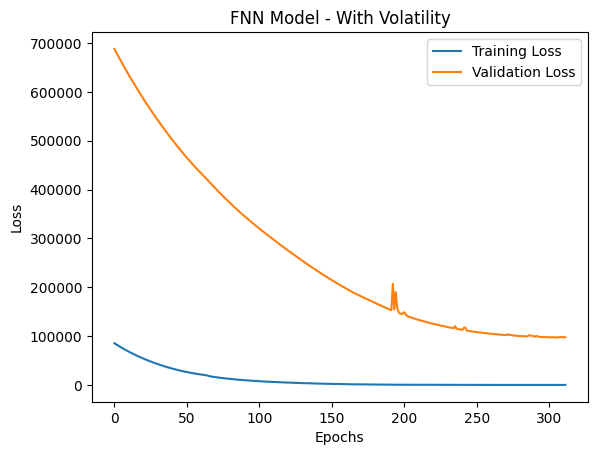

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")



34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Model Without Volatility - RMSE: 310.9152, R²: -1.1717, MAPE: 25.5032%
Model With Volatility - RMSE: 311.8022, R²: -1.1841, MAPE: 25.2196%
Lift Chart - No Volatility:


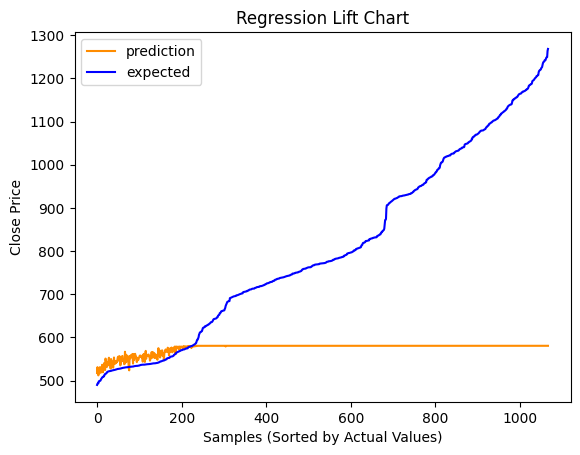

Lift Chart - With Volatility:


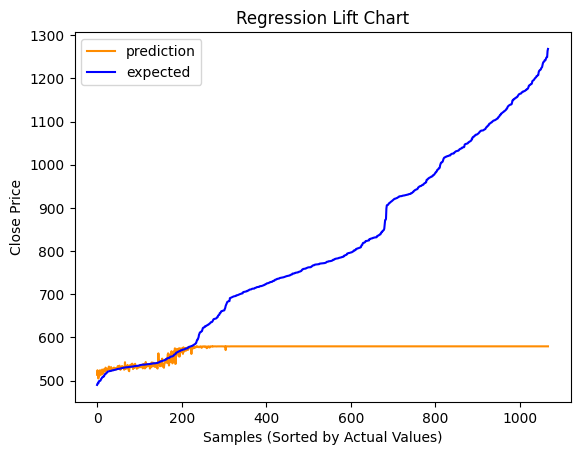

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility - RMSE: {rmse_no_vol:.4f}, R²: {r2_no_vol:.4f}, MAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility - RMSE: {rmse_with_vol:.4f}, R²: {r2_with_vol:.4f}, MAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)


#### Model 3: tanh Activation Function 5 layer, Adam Optimizer - learning rate 0.0005


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the FNN model
def build_fnn_model(input_shape):
  model = Sequential()
  model.add(Flatten(input_shape=input_shape))  # Flatten the input
  model.add(Dense(256, activation='tanh'))      # Hidden layer 1
  model.add(Dense(64, activation='tanh'))      # Hidden layer 2
  model.add(Dense(16, activation='tanh'))      # Hidden layer 3
  model.add(Dense(8, activation='tanh'))       # Hidden layer 4
  model.add(Dense(4, activation='tanh'))       # Hidden layer 5
  model.add(Dense(1))                          # Output layer (no activation for regression)
  model.compile(optimizer=Adam(learning_rate=0.0005), loss='mean_squared_error')
  return model

# Build FNN models for both datasets
model_no_vol = build_fnn_model((7, 5))  # No-volatility model input: (7 days, 5 features)
model_with_vol = build_fnn_model((7, 6))  # With-volatility model input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Alan_fnn_model_3_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Alan_fnn_model_3_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the FNN model without volatility
history_no_vol = model_no_vol.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the FNN model with volatility
history_with_vol = model_with_vol.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")
print(f"Test Loss (With Volatility): {loss_with_vol}")

## Alan Lei

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/500

Epoch 1: val_loss improved from inf to 696539.43750, saving model to Alan_fnn_model_3_no_vol.keras
79/79 - 10s - 120ms/step - loss: 87360.9844 - val_loss: 696539.4375
Epoch 2/500

Epoch 2: val_loss improved from 696539.43750 to 696063.68750, saving model to Alan_fnn_model_3_no_vol.keras
79/79 - 0s - 6ms/step - loss: 87085.6094 - val_loss: 696063.6875
Epoch 3/500

Epoch 3: val_loss improved from 696063.68750 to 695664.00000, saving model to Alan_fnn_model_3_no_vol.keras
79/79 - 0s - 4ms/step - loss: 86937.1641 - val_loss: 695664.0000
Epoch 4/500

Epoch 4: val_loss improved from 695664.00000 to 695296.50000, saving model to Alan_fnn_model_3_no_vol.keras
79/79 - 1s - 9ms/step - loss: 86808.4531 - val_loss: 695296.5000
Epoch 5/500

Epoch 5: val_loss improved from 695296.50000 to 694942.93750, saving model to Alan_fnn_model_3_no_vol.keras
79/79 - 0s - 4ms/step - loss: 86686.7109 - val_loss: 694942.9375
Epoch 6/500

Epoch 6: val_loss improved from 694942.93750 to 694599.50000, s

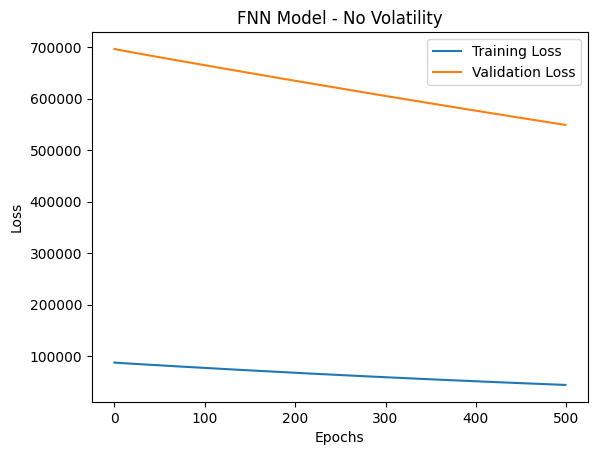

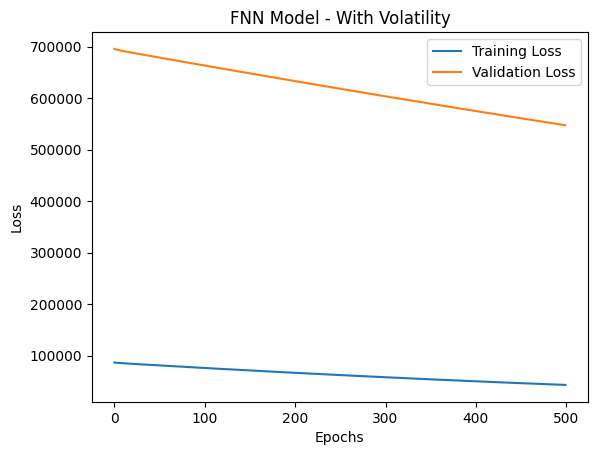

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")



34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step
Model Without Volatility - RMSE: 740.8950, R²: -11.3318, MAPE: 86.8463%
Model With Volatility - RMSE: 739.8190, R²: -11.2960, MAPE: 86.6978%
Lift Chart - No Volatility:


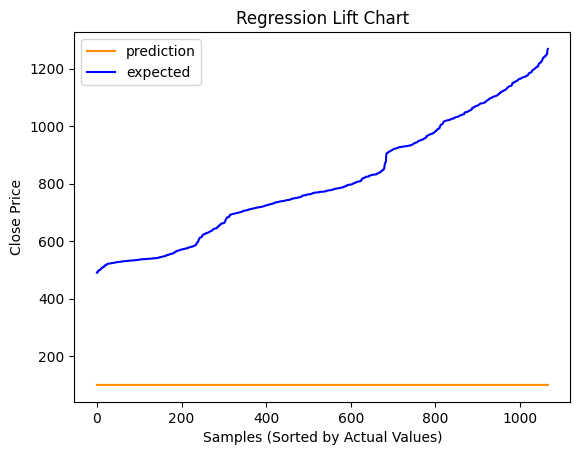

Lift Chart - With Volatility:


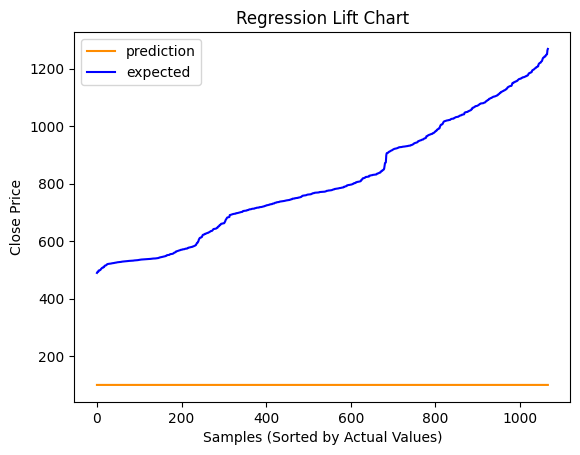

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility - RMSE: {rmse_no_vol:.4f}, R²: {r2_no_vol:.4f}, MAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility - RMSE: {rmse_with_vol:.4f}, R²: {r2_with_vol:.4f}, MAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)


#### Model 4: tanh Activation Function 7 layer, sgd Optimizer - default learning rate


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the FNN model
def build_fnn_model(input_shape):
  model = Sequential()
  model.add(Flatten(input_shape=input_shape))  # Flatten the input
  model.add(Dense(64, activation='tanh'))      # Hidden layer 2
  model.add(Dense(32, activation='tanh'))      # Hidden layer 3
  model.add(Dense(16, activation='tanh'))      # Hidden layer 4
  model.add(Dense(8, activation='tanh'))       # Hidden layer 5
  model.add(Dense(4, activation='tanh'))       # Hidden layer 6
  model.add(Dense(2, activation='tanh'))       # Hidden layer 7
  model.add(Dense(1))                          # Output layer (no activation for regression)
  model.compile(optimizer=SGD(learning_rate=0.01), loss='mean_squared_error')
  return model

# Build FNN models for both datasets
model_no_vol = build_fnn_model((7, 5))  # No-volatility model input: (7 days, 5 features)
model_with_vol = build_fnn_model((7, 6))  # With-volatility model input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Alan_fnn_model_4_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Alan_fnn_model_4_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the FNN model without volatility
history_no_vol = model_no_vol.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the FNN model with volatility
history_with_vol = model_with_vol.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")
print(f"Test Loss (With Volatility): {loss_with_vol}")

## Alan Lei

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/500

Epoch 1: val_loss improved from inf to 330864.46875, saving model to Alan_fnn_model_4_no_vol.keras
79/79 - 6s - 80ms/step - loss: 21918.7207 - val_loss: 330864.4688
Epoch 2/500

Epoch 2: val_loss improved from 330864.46875 to 330450.84375, saving model to Alan_fnn_model_4_no_vol.keras
79/79 - 6s - 70ms/step - loss: 13346.5146 - val_loss: 330450.8438
Epoch 3/500

Epoch 3: val_loss did not improve from 330450.84375
79/79 - 1s - 8ms/step - loss: 13344.6807 - val_loss: 341020.5938
Epoch 4/500

Epoch 4: val_loss improved from 330450.84375 to 329824.03125, saving model to Alan_fnn_model_4_no_vol.keras
79/79 - 1s - 8ms/step - loss: 13361.3828 - val_loss: 329824.0312
Epoch 5/500

Epoch 5: val_loss improved from 329824.03125 to 322662.71875, saving model to Alan_fnn_model_4_no_vol.keras
79/79 - 0s - 5ms/step - loss: 13355.2129 - val_loss: 322662.7188
Epoch 6/500

Epoch 6: val_loss did not improve from 322662.71875
79/79 - 1s - 8ms/step - loss: 13362.6914 - val_loss: 334882.7812
Epo

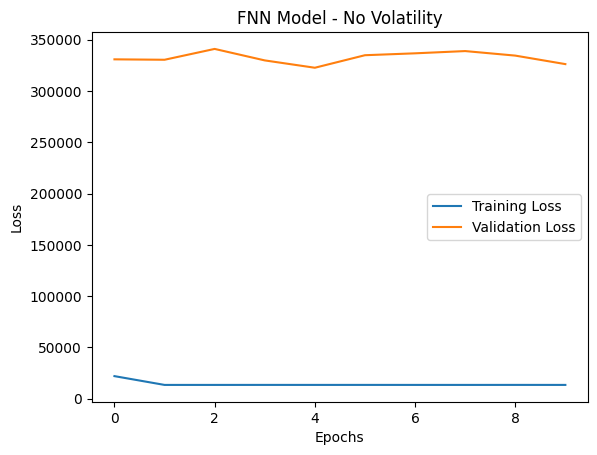

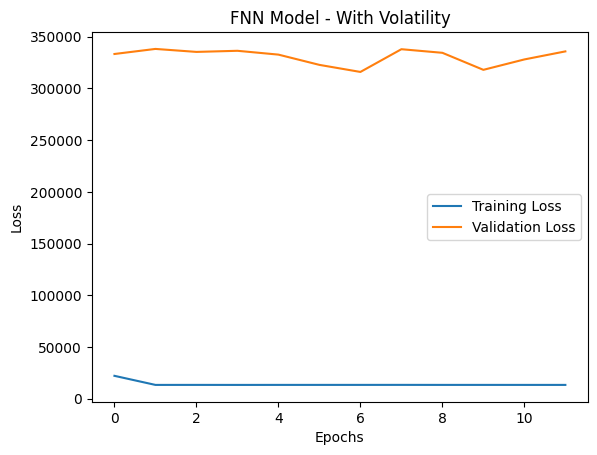

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")



34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step
Model Without Volatility - RMSE: 568.0341, R²: -6.2487, MAPE: 62.6649%
Model With Volatility - RMSE: 561.9995, R²: -6.0955, MAPE: 61.8045%
Lift Chart - No Volatility:


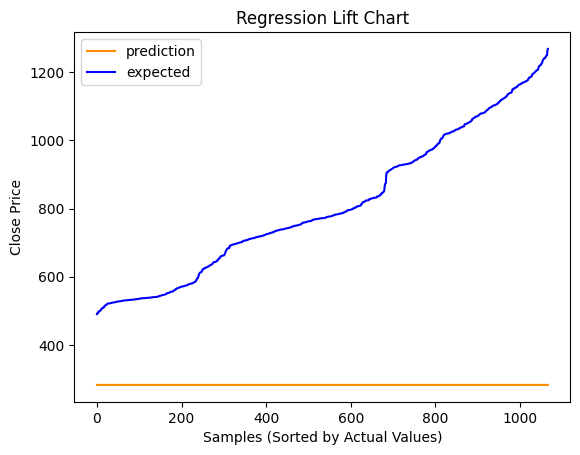

Lift Chart - With Volatility:


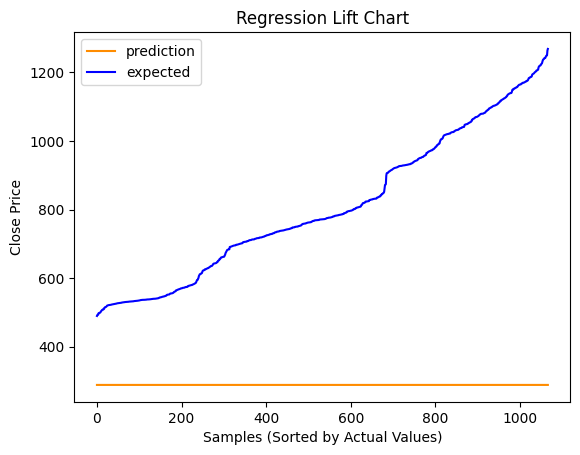

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility - RMSE: {rmse_no_vol:.4f}, R²: {r2_no_vol:.4f}, MAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility - RMSE: {rmse_with_vol:.4f}, R²: {r2_with_vol:.4f}, MAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)


#### Model 5: tanh Activation Function 9 layer with dropout layer, SGD Optimizer - learning rate 0.0001


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the FNN model
def build_fnn_model(input_shape):
  model = Sequential()
  model.add(Flatten(input_shape=input_shape))  # Flatten the input
  model.add(Dense(1024, activation='tanh'))      # Hidden layer 1
  model.add(Dense(512, activation='tanh'))      # Hidden layer 1
  model.add(Dense(256, activation='tanh'))      # Hidden layer 2
  model.add(Dense(128, activation='tanh'))      # Hidden layer 3
  model.add(Dropout(0.01))                      # Dropout layer
  model.add(Dense(64, activation='tanh'))      # Hidden layer 4
  model.add(Dense(32, activation='tanh'))      # Hidden layer 5
  model.add(Dense(16, activation='tanh'))      # Hidden layer 6
  model.add(Dense(8, activation='tanh'))       # Hidden layer 7
  model.add(Dense(4, activation='tanh'))       # Hidden layer 8
  model.add(Dense(2, activation='tanh'))       # Hidden layer 9
  model.add(Dense(1))                          # Output layer (no activation for regression)
  model.compile(optimizer=SGD(learning_rate=0.0001), loss='mean_squared_error')
  return model

# Build FNN models for both datasets
model_no_vol = build_fnn_model((7, 5))  # No-volatility model input: (7 days, 5 features)
model_with_vol = build_fnn_model((7, 6))  # With-volatility model input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Alan_fnn_model_5_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Alan_fnn_model_5_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the FNN model without volatility
history_no_vol = model_no_vol.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the FNN model with volatility
history_with_vol = model_with_vol.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")
print(f"Test Loss (With Volatility): {loss_with_vol}")

## Alan Lei

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/500

Epoch 1: val_loss improved from inf to 678504.56250, saving model to Alan_fnn_model_5_no_vol.keras
79/79 - 11s - 135ms/step - loss: 84589.9531 - val_loss: 678504.5625
Epoch 2/500

Epoch 2: val_loss improved from 678504.56250 to 659388.75000, saving model to Alan_fnn_model_5_no_vol.keras
79/79 - 1s - 10ms/step - loss: 78136.2500 - val_loss: 659388.7500
Epoch 3/500

Epoch 3: val_loss improved from 659388.75000 to 641269.50000, saving model to Alan_fnn_model_5_no_vol.keras
79/79 - 1s - 14ms/step - loss: 72256.8359 - val_loss: 641269.5000
Epoch 4/500

Epoch 4: val_loss improved from 641269.50000 to 624178.06250, saving model to Alan_fnn_model_5_no_vol.keras
79/79 - 1s - 7ms/step - loss: 66863.6250 - val_loss: 624178.0625
Epoch 5/500

Epoch 5: val_loss improved from 624178.06250 to 608431.18750, saving model to Alan_fnn_model_5_no_vol.keras
79/79 - 1s - 9ms/step - loss: 61943.1055 - val_loss: 608431.1875
Epoch 6/500

Epoch 6: val_loss improved from 608431.18750 to 593554.18750,

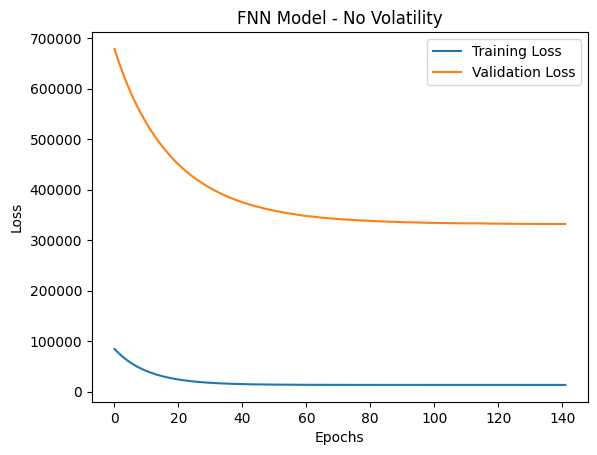

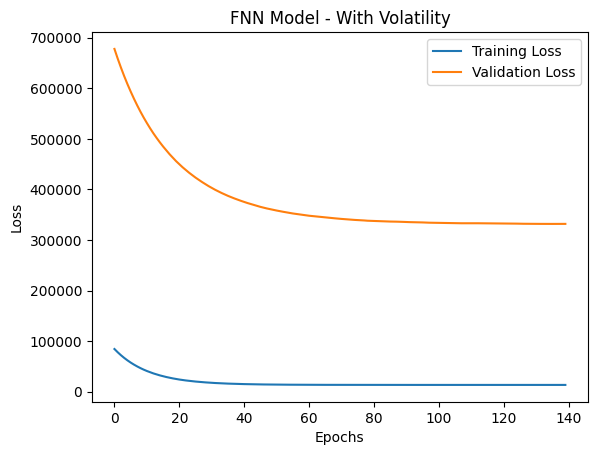

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")



34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step
Model Without Volatility - RMSE: 576.0634, R²: -6.4551, MAPE: 63.8075%
Model With Volatility - RMSE: 575.9800, R²: -6.4529, MAPE: 63.7957%
Lift Chart - No Volatility:


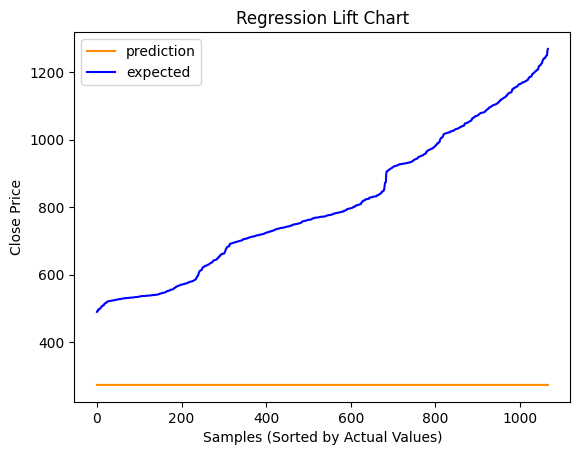

Lift Chart - With Volatility:


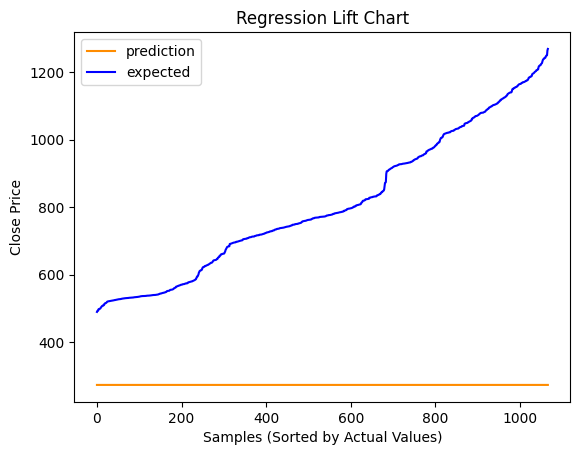

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility - RMSE: {rmse_no_vol:.4f}, R²: {r2_no_vol:.4f}, MAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility - RMSE: {rmse_with_vol:.4f}, R²: {r2_with_vol:.4f}, MAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)


#### Model 6: tanh Activation Function 4 layer with dropout layer, SGD Optimizer - learning rate 0.005


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the FNN model
def build_fnn_model(input_shape):
  model = Sequential()
  model.add(Flatten(input_shape=input_shape))  # Flatten the input
  model.add(Dense(256, activation='tanh'))      # Hidden layer 1
  model.add(Dense(64, activation='tanh'))      # Hidden layer 2
  model.add(Dropout(0.01))                      # Dropout layer
  model.add(Dense(16, activation='tanh'))      # Hidden layer 3
  model.add(Dense(4, activation='tanh'))       # Hidden layer 4
  model.add(Dense(1))                          # Output layer (no activation for regression)
  model.compile(optimizer=SGD(learning_rate=0.005), loss='mean_squared_error')
  return model

# Build FNN models for both datasets
model_no_vol = build_fnn_model((7, 5))  # No-volatility model input: (7 days, 5 features)
model_with_vol = build_fnn_model((7, 6))  # With-volatility model input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Alan_fnn_model_6_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Alan_fnn_model_6_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the FNN model without volatility
history_no_vol = model_no_vol.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the FNN model with volatility
history_with_vol = model_with_vol.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")
print(f"Test Loss (With Volatility): {loss_with_vol}")

## Alan Lei

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/500

Epoch 1: val_loss improved from inf to 333896.81250, saving model to Alan_fnn_model_6_no_vol.keras
79/79 - 5s - 69ms/step - loss: 24112.6016 - val_loss: 333896.8125
Epoch 2/500

Epoch 2: val_loss did not improve from 333896.81250
79/79 - 1s - 7ms/step - loss: 13340.5332 - val_loss: 339595.6250
Epoch 3/500

Epoch 3: val_loss improved from 333896.81250 to 329447.84375, saving model to Alan_fnn_model_6_no_vol.keras
79/79 - 1s - 7ms/step - loss: 13361.7803 - val_loss: 329447.8438
Epoch 4/500

Epoch 4: val_loss did not improve from 329447.84375
79/79 - 0s - 6ms/step - loss: 13344.5283 - val_loss: 339872.1875
Epoch 5/500

Epoch 5: val_loss did not improve from 329447.84375
79/79 - 1s - 6ms/step - loss: 13351.4414 - val_loss: 334397.5312
Epoch 6/500

Epoch 6: val_loss did not improve from 329447.84375
79/79 - 1s - 7ms/step - loss: 13350.2441 - val_loss: 338038.7500
Epoch 7/500

Epoch 7: val_loss did not improve from 329447.84375
79/79 - 0s - 3ms/step - loss: 13357.7949 - val_loss

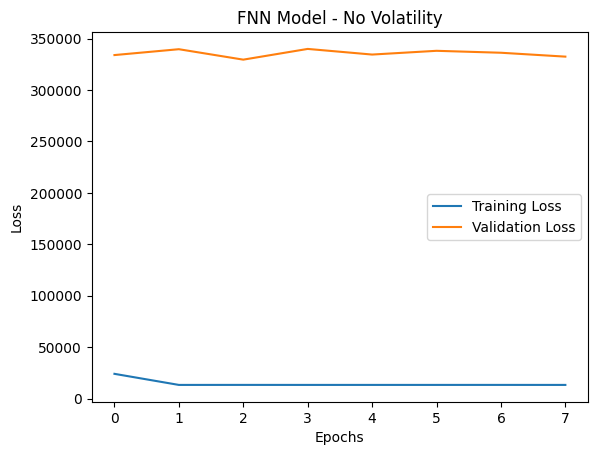

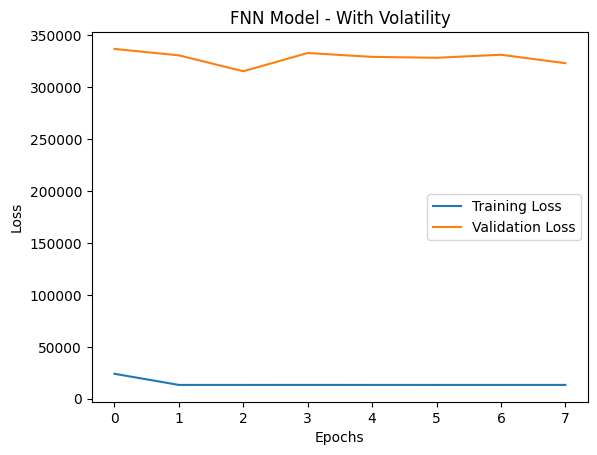

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")



34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
Model Without Volatility - RMSE: 573.9755, R²: -6.4011, MAPE: 63.5107%
Model With Volatility - RMSE: 561.6490, R²: -6.0867, MAPE: 61.7545%
Lift Chart - No Volatility:


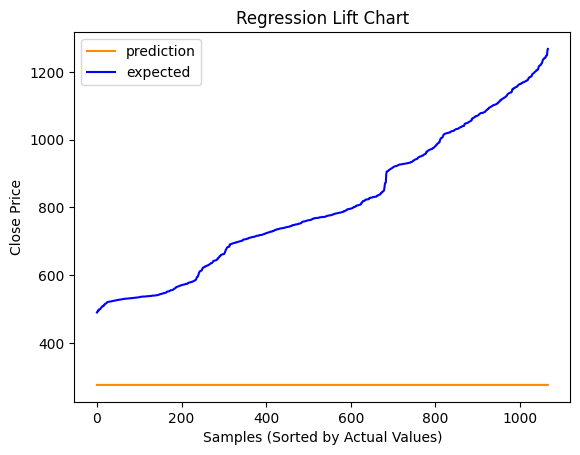

Lift Chart - With Volatility:


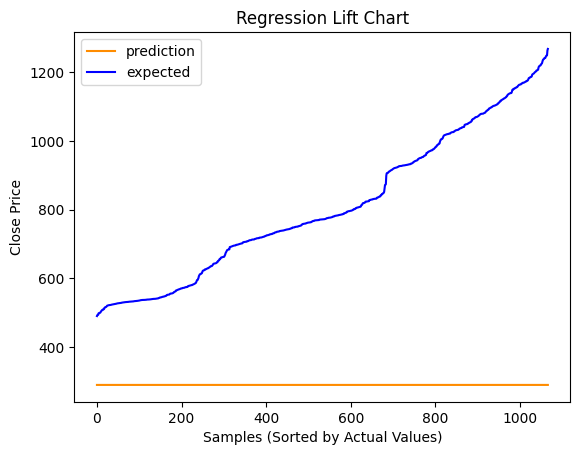

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility - RMSE: {rmse_no_vol:.4f}, R²: {r2_no_vol:.4f}, MAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility - RMSE: {rmse_with_vol:.4f}, R²: {r2_with_vol:.4f}, MAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)


#### Model 7: tanh Activation Function 4 layer with dropout layer, SGD Optimizer - learning rate 0.01


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the FNN model
def build_fnn_model(input_shape):
  model = Sequential()
  model.add(Flatten(input_shape=input_shape))  # Flatten the input
  model.add(Dense(128, activation='tanh'))      # Hidden layer 1
  model.add(Dense(32, activation='tanh'))      # Hidden layer 2
  model.add(Dense(8, activation='tanh'))       # Hidden layer 3
  model.add(Dense(2, activation='tanh'))       # Hidden layer 4
  model.add(Dropout(0.01))                      # Dropout layer
  model.add(Dense(1))                          # Output layer (no activation for regression)
  model.compile(optimizer=SGD(learning_rate=0.01), loss='mean_squared_error')
  return model

# Build FNN models for both datasets
model_no_vol = build_fnn_model((7, 5))  # No-volatility model input: (7 days, 5 features)
model_with_vol = build_fnn_model((7, 6))  # With-volatility model input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Alan_fnn_model_7_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Alan_fnn_model_7_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the FNN model without volatility
history_no_vol = model_no_vol.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the FNN model with volatility
history_with_vol = model_with_vol.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")
print(f"Test Loss (With Volatility): {loss_with_vol}")

## Alan Lei

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/500

Epoch 1: val_loss improved from inf to 322130.31250, saving model to Alan_fnn_model_7_no_vol.keras
79/79 - 5s - 61ms/step - loss: 22777.2617 - val_loss: 322130.3125
Epoch 2/500

Epoch 2: val_loss did not improve from 322130.31250
79/79 - 0s - 3ms/step - loss: 13430.7432 - val_loss: 339508.3125
Epoch 3/500

Epoch 3: val_loss did not improve from 322130.31250
79/79 - 0s - 4ms/step - loss: 13473.7080 - val_loss: 341068.5312
Epoch 4/500

Epoch 4: val_loss did not improve from 322130.31250
79/79 - 0s - 5ms/step - loss: 13482.0859 - val_loss: 333054.6562
Epoch 5/500

Epoch 5: val_loss did not improve from 322130.31250
79/79 - 0s - 5ms/step - loss: 13618.6191 - val_loss: 334567.0312
Epoch 6/500

Epoch 6: val_loss did not improve from 322130.31250
79/79 - 1s - 7ms/step - loss: 13547.5215 - val_loss: 335779.9688
Epoch 6: early stopping
Restoring model weights from the end of the best epoch: 1.
Epoch 1/500

Epoch 1: val_loss improved from inf to 345252.53125, saving model to Alan_fn

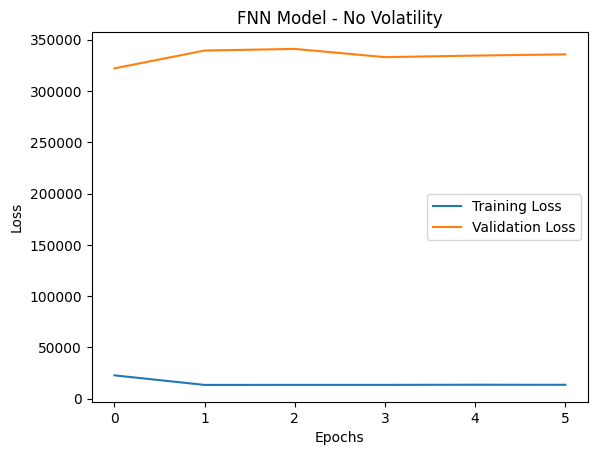

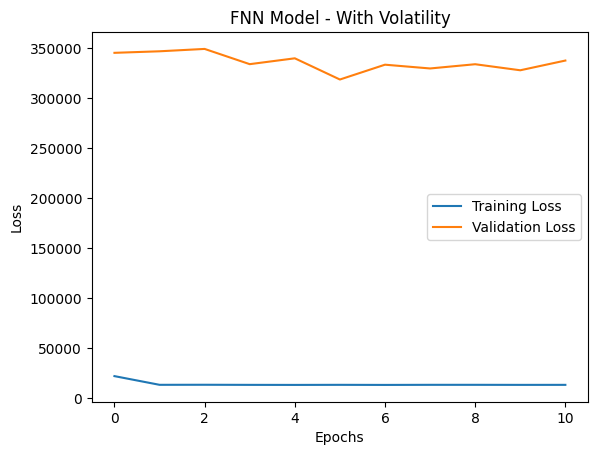

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")



34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
Model Without Volatility - RMSE: 567.5652, R²: -6.2368, MAPE: 62.5982%
Model With Volatility - RMSE: 564.4363, R²: -6.1572, MAPE: 62.1521%
Lift Chart - No Volatility:


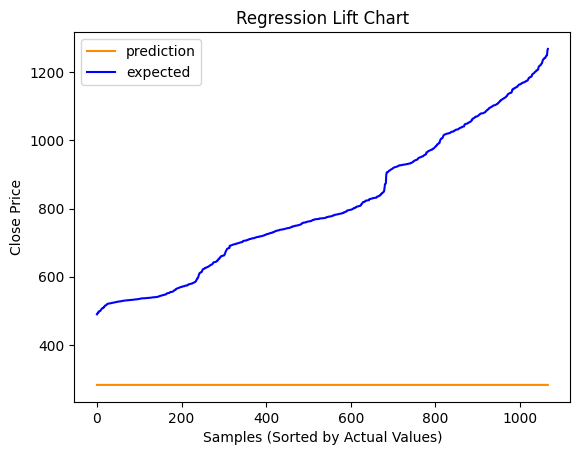

Lift Chart - With Volatility:


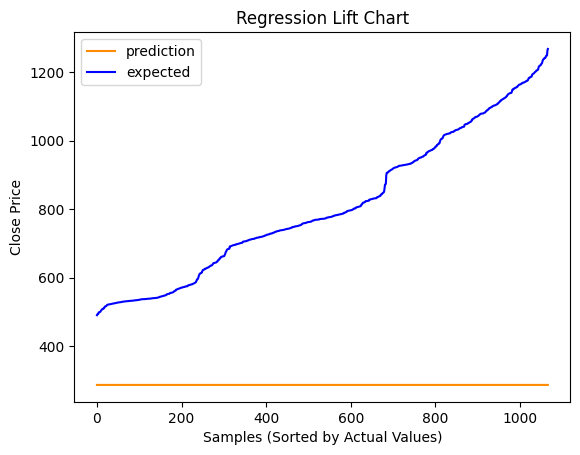

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility - RMSE: {rmse_no_vol:.4f}, R²: {r2_no_vol:.4f}, MAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility - RMSE: {rmse_with_vol:.4f}, R²: {r2_with_vol:.4f}, MAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)


#### Model 8: tanh Activation Function 11 layer with dropout layer, SGD Optimizer - learning rate 0.0005


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the FNN model
def build_fnn_model(input_shape):
  model = Sequential()
  model.add(Flatten(input_shape=input_shape))  # Flatten the input
  model.add(Dense(100, activation='tanh'))      # Hidden layer 1
  model.add(Dense(90, activation='tanh'))      # Hidden layer 2
  model.add(Dense(80, activation='tanh'))      # Hidden layer 3
  model.add(Dense(70, activation='tanh'))      # Hidden layer 4
  model.add(Dense(60, activation='tanh'))      # Hidden layer 5
  model.add(Dropout(0.01))                      # Dropout layer
  model.add(Dense(50, activation='tanh'))      # Hidden layer 6
  model.add(Dense(40, activation='tanh'))      # Hidden layer 7
  model.add(Dense(30, activation='tanh'))       # Hidden layer 8
  model.add(Dense(20, activation='tanh'))       # Hidden layer 9
  model.add(Dense(10, activation='tanh'))       # Hidden layer 10
  model.add(Dense(5, activation='tanh'))       # Hidden layer 11
  model.add(Dense(1))                          # Output layer (no activation for regression)
  model.compile(optimizer=SGD(learning_rate=0.0005), loss='mean_squared_error')
  return model

# Build FNN models for both datasets
model_no_vol = build_fnn_model((7, 5))  # No-volatility model input: (7 days, 5 features)
model_with_vol = build_fnn_model((7, 6))  # With-volatility model input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Alan_fnn_model_5_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Alan_fnn_model_5_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the FNN model without volatility
history_no_vol = model_no_vol.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the FNN model with volatility
history_with_vol = model_with_vol.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")
print(f"Test Loss (With Volatility): {loss_with_vol}")

## Alan Lei

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/500

Epoch 1: val_loss improved from inf to 543368.18750, saving model to Alan_fnn_model_5_no_vol.keras
79/79 - 10s - 124ms/step - loss: 62349.3711 - val_loss: 543368.1875
Epoch 2/500

Epoch 2: val_loss improved from 543368.18750 to 457236.62500, saving model to Alan_fnn_model_5_no_vol.keras
79/79 - 1s - 19ms/step - loss: 32347.1875 - val_loss: 457236.6250
Epoch 3/500

Epoch 3: val_loss improved from 457236.62500 to 407295.56250, saving model to Alan_fnn_model_5_no_vol.keras
79/79 - 0s - 5ms/step - loss: 20757.0020 - val_loss: 407295.5625
Epoch 4/500

Epoch 4: val_loss improved from 407295.56250 to 377480.96875, saving model to Alan_fnn_model_5_no_vol.keras
79/79 - 0s - 6ms/step - loss: 16224.1406 - val_loss: 377480.9688
Epoch 5/500

Epoch 5: val_loss improved from 377480.96875 to 359114.25000, saving model to Alan_fnn_model_5_no_vol.keras
79/79 - 1s - 7ms/step - loss: 14447.5645 - val_loss: 359114.2500
Epoch 6/500

Epoch 6: val_loss improved from 359114.25000 to 349110.50000, 

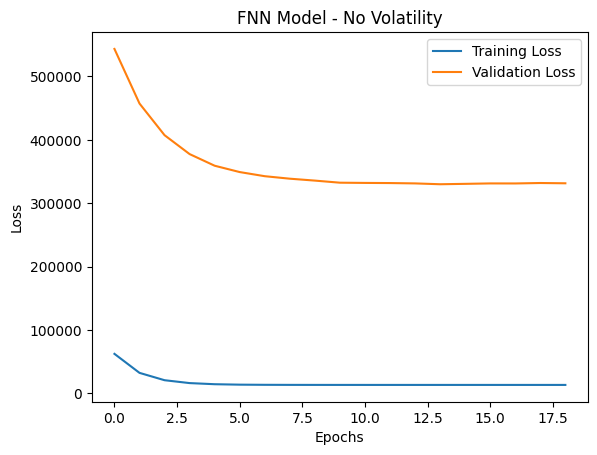

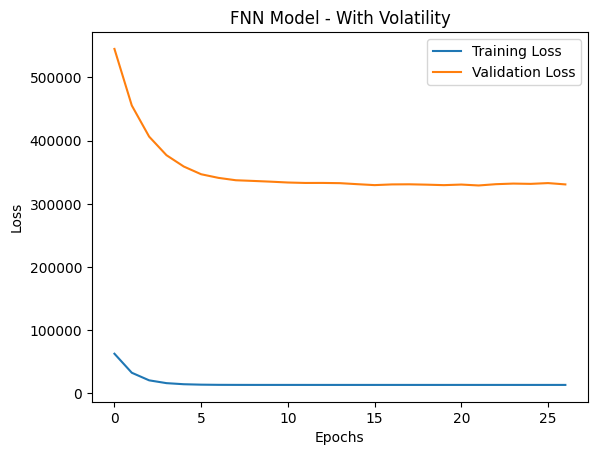

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")



34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
Model Without Volatility - RMSE: 574.3681, R²: -6.4113, MAPE: 63.5665%
Model With Volatility - RMSE: 573.6073, R²: -6.3917, MAPE: 63.4583%
Lift Chart - No Volatility:


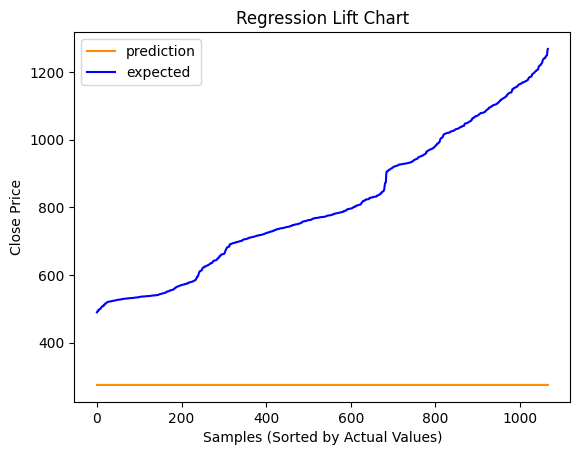

Lift Chart - With Volatility:


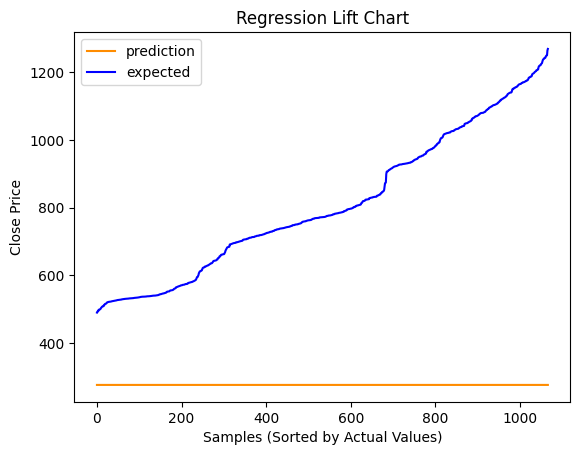

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility - RMSE: {rmse_no_vol:.4f}, R²: {r2_no_vol:.4f}, MAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility - RMSE: {rmse_with_vol:.4f}, R²: {r2_with_vol:.4f}, MAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)


#### Model 9: tanh Activation Function 9 layer with 5 dropout layers, SGD Optimizer - learning rate 0.0001


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the FNN model
def build_fnn_model(input_shape):
  model = Sequential()
  model.add(Flatten(input_shape=input_shape))  # Flatten the input
  model.add(Dense(1024, activation='tanh'))      # Hidden layer 1
  model.add(Dense(512, activation='tanh'))      # Hidden layer 1
  model.add(Dropout(0.01))                      # Dropout layer 1
  model.add(Dense(256, activation='tanh'))      # Hidden layer 2
  model.add(Dense(128, activation='tanh'))      # Hidden layer 3
  model.add(Dropout(0.01))                      # Dropout layer 2
  model.add(Dense(64, activation='tanh'))      # Hidden layer 4
  model.add(Dense(32, activation='tanh'))      # Hidden layer 5
  model.add(Dropout(0.01))                      # Dropout layer 3
  model.add(Dense(16, activation='tanh'))      # Hidden layer 6
  model.add(Dense(8, activation='tanh'))       # Hidden layer 7
  model.add(Dropout(0.01))                      # Dropout layer 4
  model.add(Dense(4, activation='tanh'))       # Hidden layer 8
  model.add(Dense(2, activation='tanh'))       # Hidden layer 9
  model.add(Dropout(0.01))                      # Dropout layer 5
  model.add(Dense(1))                          # Output layer (no activation for regression)
  model.compile(optimizer=SGD(learning_rate=0.0001), loss='mean_squared_error')
  return model

# Build FNN models for both datasets
model_no_vol = build_fnn_model((7, 5))  # No-volatility model input: (7 days, 5 features)
model_with_vol = build_fnn_model((7, 6))  # With-volatility model input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Alan_fnn_model_9_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Alan_fnn_model_9_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the FNN model without volatility
history_no_vol = model_no_vol.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the FNN model with volatility
history_with_vol = model_with_vol.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")
print(f"Test Loss (With Volatility): {loss_with_vol}")

## Alan Lei

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/500

Epoch 1: val_loss improved from inf to 677008.93750, saving model to Alan_fnn_model_9_no_vol.keras
79/79 - 9s - 112ms/step - loss: 84179.2031 - val_loss: 677008.9375
Epoch 2/500

Epoch 2: val_loss improved from 677008.93750 to 658063.75000, saving model to Alan_fnn_model_9_no_vol.keras
79/79 - 0s - 4ms/step - loss: 77663.6094 - val_loss: 658063.7500
Epoch 3/500

Epoch 3: val_loss improved from 658063.75000 to 640115.43750, saving model to Alan_fnn_model_9_no_vol.keras
79/79 - 1s - 8ms/step - loss: 71826.8281 - val_loss: 640115.4375
Epoch 4/500

Epoch 4: val_loss improved from 640115.43750 to 623408.00000, saving model to Alan_fnn_model_9_no_vol.keras
79/79 - 1s - 8ms/step - loss: 66535.7500 - val_loss: 623408.0000
Epoch 5/500

Epoch 5: val_loss improved from 623408.00000 to 607674.81250, saving model to Alan_fnn_model_9_no_vol.keras
79/79 - 0s - 4ms/step - loss: 61719.2617 - val_loss: 607674.8125
Epoch 6/500

Epoch 6: val_loss improved from 607674.81250 to 592810.93750, sa

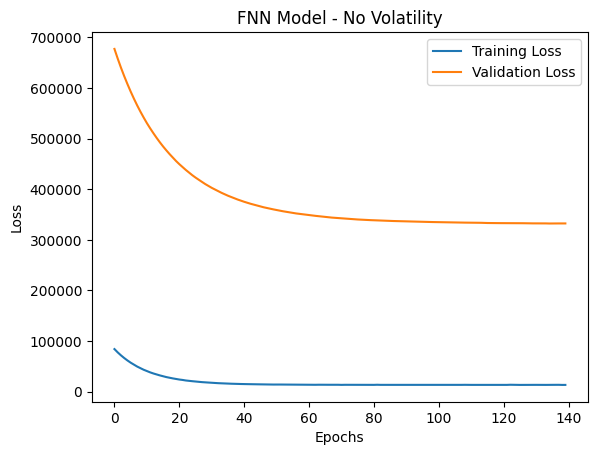

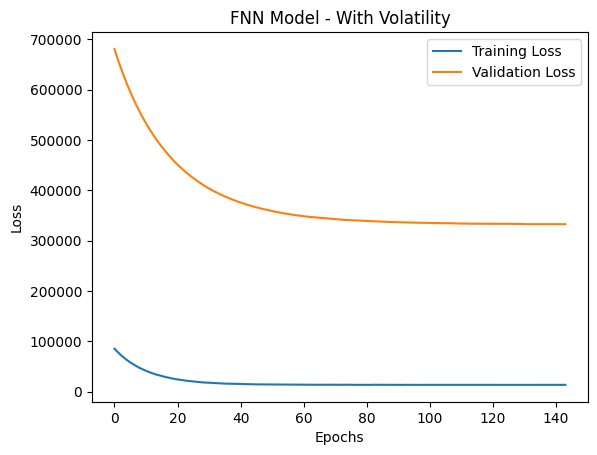

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")



34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step
Model Without Volatility - RMSE: 576.3656, R²: -6.4629, MAPE: 63.8505%
Model With Volatility - RMSE: 576.6028, R²: -6.4691, MAPE: 63.8842%
Lift Chart - No Volatility:


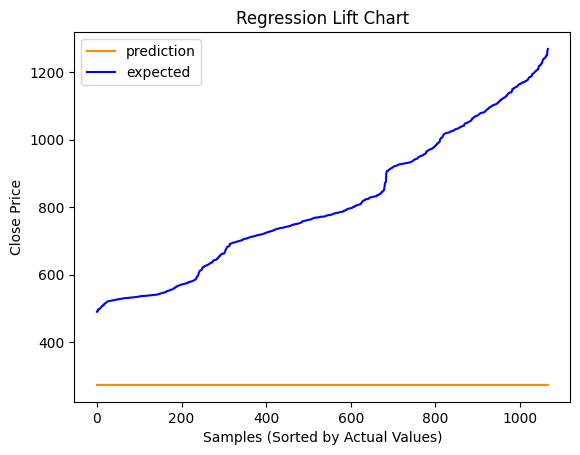

Lift Chart - With Volatility:


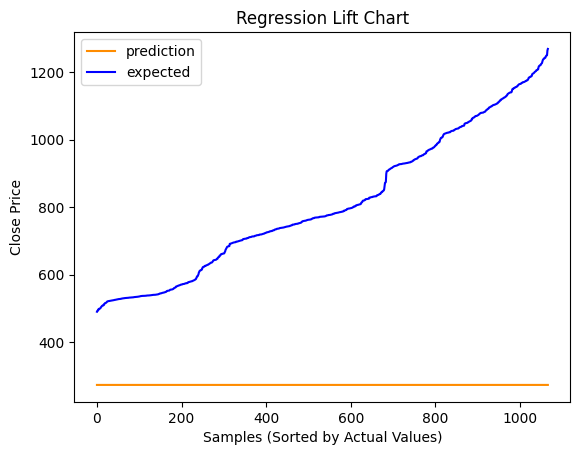

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility - RMSE: {rmse_no_vol:.4f}, R²: {r2_no_vol:.4f}, MAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility - RMSE: {rmse_with_vol:.4f}, R²: {r2_with_vol:.4f}, MAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)


#### Model 10: tanh Activation Function 5 layer with dropout layer, SGD Optimizer - learning rate 0.0011


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the FNN model
def build_fnn_model(input_shape):
  model = Sequential()
  model.add(Flatten(input_shape=input_shape))  # Flatten the input
  model.add(Dense(100, activation='tanh'))      # Hidden layer 1
  model.add(Dense(50, activation='tanh'))      # Hidden layer 2
  model.add(Dropout(0.01))                      # Dropout layer
  model.add(Dense(25, activation='tanh'))      # Hidden layer 3
  model.add(Dense(10, activation='tanh'))       # Hidden layer 4
  model.add(Dense(5, activation='tanh'))       # Hidden layer 5
  model.add(Dense(1))                          # Output layer (no activation for regression)
  model.compile(optimizer=SGD(learning_rate=0.0011), loss='mean_squared_error')
  return model

# Build FNN models for both datasets
model_no_vol = build_fnn_model((7, 5))  # No-volatility model input: (7 days, 5 features)
model_with_vol = build_fnn_model((7, 6))  # With-volatility model input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Alan_fnn_model_10_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Alan_fnn_model_10_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the FNN model without volatility
history_no_vol = model_no_vol.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the FNN model with volatility
history_with_vol = model_with_vol.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")
print(f"Test Loss (With Volatility): {loss_with_vol}")

## Alan Lei

Epoch 1/500


/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



Epoch 1: val_loss improved from inf to 440105.28125, saving model to Alan_fnn_model_10_no_vol.keras
79/79 - 3s - 43ms/step - loss: 46174.6680 - val_loss: 440105.2812
Epoch 2/500

Epoch 2: val_loss improved from 440105.28125 to 366351.06250, saving model to Alan_fnn_model_10_no_vol.keras
79/79 - 2s - 30ms/step - loss: 17091.7344 - val_loss: 366351.0625
Epoch 3/500

Epoch 3: val_loss improved from 366351.06250 to 344553.28125, saving model to Alan_fnn_model_10_no_vol.keras
79/79 - 1s - 7ms/step - loss: 13762.8965 - val_loss: 344553.2812
Epoch 4/500

Epoch 4: val_loss improved from 344553.28125 to 331786.96875, saving model to Alan_fnn_model_10_no_vol.keras
79/79 - 0s - 5ms/step - loss: 13398.0869 - val_loss: 331786.9688
Epoch 5/500

Epoch 5: val_loss did not improve from 331786.96875
79/79 - 0s - 6ms/step - loss: 13334.1318 - val_loss: 333063.4062
Epoch 6/500

Epoch 6: val_loss improved from 331786.96875 to 331328.93750, saving model to Alan_fnn_model_10_no_vol.keras
79/79 - 1s - 8ms/st

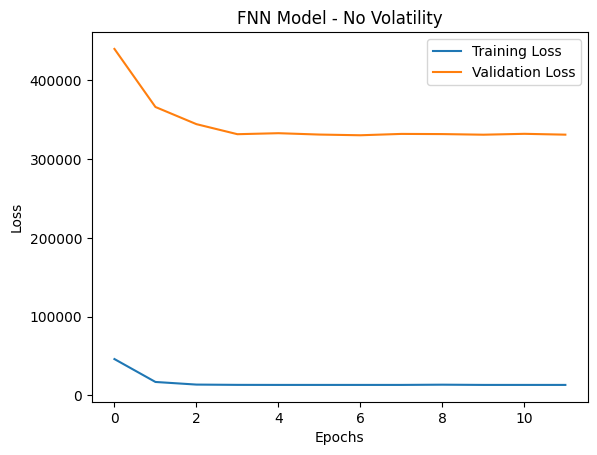

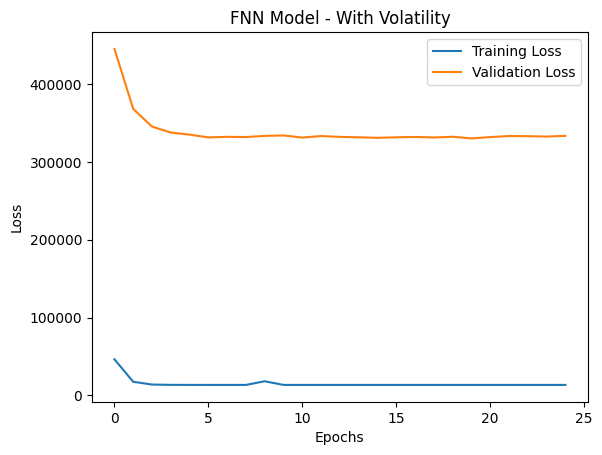

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")



34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
Model Without Volatility - RMSE: 574.8383, R²: -6.4234, MAPE: 63.6334%
Model With Volatility - RMSE: 574.7358, R²: -6.4208, MAPE: 63.6188%
Lift Chart - No Volatility:


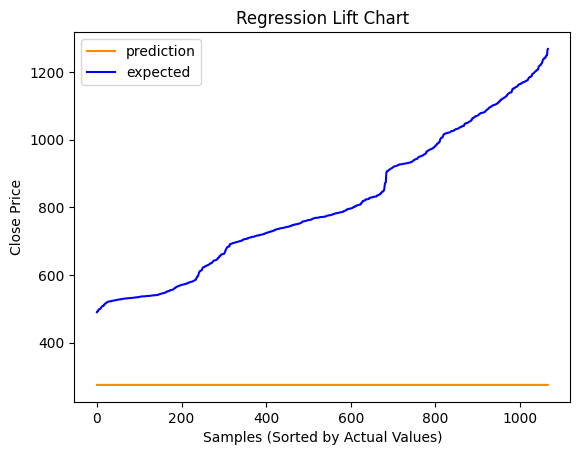

Lift Chart - With Volatility:


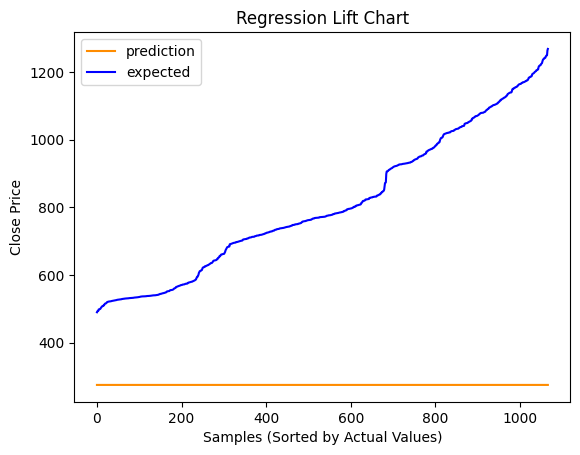

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility - RMSE: {rmse_no_vol:.4f}, R²: {r2_no_vol:.4f}, MAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility - RMSE: {rmse_with_vol:.4f}, R²: {r2_with_vol:.4f}, MAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)


### FNN Model Design and Testing (Nishan Majarjan)

**Evaluates the models with relu as the activation function and SGD as the optimizer.**

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Build model with no volatility (different activation and optimizer)
model_no_vol_alt = Sequential()
model_no_vol_alt.add(Flatten(input_shape=(7,5)))
model_no_vol_alt.add(Dense(64, activation='relu'))
model_no_vol_alt.add(Dense(1))
model_no_vol_alt.compile(loss='mean_squared_error', optimizer='sgd')

# Build model with volatility (different activation and optimizer)
model_with_vol_alt = Sequential()
model_with_vol_alt.add(Flatten(input_shape=(7,6)))
model_with_vol_alt.add(Dense(64, activation='relu'))
model_with_vol_alt.add(Dense(1))
model_with_vol_alt.compile(loss='mean_squared_error', optimizer='sgd')

# Early stopping and checkpointing for each model
early_stopping_no_vol_alt = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol_alt = ModelCheckpoint("Austin_fnn_model_2_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

early_stopping_with_vol_alt = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol_alt = ModelCheckpoint("Austin_fnn_model_2_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

#Nishan Maharjan 11/4/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
# Train model without volatility
history_no_vol_alt = model_no_vol_alt.fit(X_train_no_vol, y_train_no_vol_seq, validation_data=(X_test_no_vol, y_test_no_vol_seq),
                                          epochs=500, batch_size=32, callbacks=[early_stopping_no_vol_alt, checkpoint_no_vol_alt], verbose=2)

# Evaluate the model without volatility
loss_no_vol_alt = model_no_vol_alt.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
print(f"\nTest Loss (No Volatility - Alternate): {loss_no_vol_alt}")
#Nishan Maharjan 11/4/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 449095.25000, saving model to Austin_fnn_model_2_no_vol.keras
79/79 - 1s - 7ms/step - loss: 198158.5156 - val_loss: 449095.2500
Epoch 2/500

Epoch 2: val_loss improved from 449095.25000 to 339745.59375, saving model to Austin_fnn_model_2_no_vol.keras
79/79 - 0s - 6ms/step - loss: 15230.5361 - val_loss: 339745.5938
Epoch 3/500

Epoch 3: val_loss improved from 339745.59375 to 300216.03125, saving model to Austin_fnn_model_2_no_vol.keras
79/79 - 0s - 2ms/step - loss: 9127.4824 - val_loss: 300216.0312
Epoch 4/500

Epoch 4: val_loss did not improve from 300216.03125
79/79 - 0s - 4ms/step - loss: 12796.7285 - val_loss: 319500.4375
Epoch 5/500

Epoch 5: val_loss did not improve from 300216.03125
79/79 - 0s - 4ms/step - loss: 11285.4121 - val_loss: 311537.0625
Epoch 6/500

Epoch 6: val_loss did not improve from 300216.03125
79/79 - 0s - 4ms/step - loss: 10404.9863 - val_loss: 302076.6250
Epoch 7/500

Epoch 7: val_loss did not improve from 300

In [ ]:
# Train model with volatility
history_with_vol_alt = model_with_vol_alt.fit(X_train_with_vol, y_train_with_vol_seq, validation_data=(X_test_with_vol, y_test_with_vol_seq),
                                              epochs=500, batch_size=32, callbacks=[early_stopping_with_vol_alt, checkpoint_with_vol_alt], verbose=2)

# Evaluate the model with volatility
loss_with_vol_alt = model_with_vol_alt.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)
print(f"Test Loss (With Volatility - Alternate): {loss_with_vol_alt}")
#Nishan Maharjan 11/4/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 435477.96875, saving model to Austin_fnn_model_2_with_vol.keras
79/79 - 1s - 12ms/step - loss: 486455.0938 - val_loss: 435477.9688
Epoch 2/500

Epoch 2: val_loss improved from 435477.96875 to 330660.28125, saving model to Austin_fnn_model_2_with_vol.keras
79/79 - 0s - 5ms/step - loss: 13564.5654 - val_loss: 330660.2812
Epoch 3/500

Epoch 3: val_loss improved from 330660.28125 to 302601.71875, saving model to Austin_fnn_model_2_with_vol.keras
79/79 - 0s - 4ms/step - loss: 9426.9648 - val_loss: 302601.7188
Epoch 4/500

Epoch 4: val_loss did not improve from 302601.71875
79/79 - 1s - 7ms/step - loss: 12503.2607 - val_loss: 305039.9062
Epoch 5/500

Epoch 5: val_loss improved from 302601.71875 to 298530.68750, saving model to Austin_fnn_model_2_with_vol.keras
79/79 - 0s - 4ms/step - loss: 10620.3223 - val_loss: 298530.6875
Epoch 6/500

Epoch 6: val_loss did not improve from 298530.68750
79/79 - 1s - 9ms/step - loss: 12630.3447 - val_loss: 

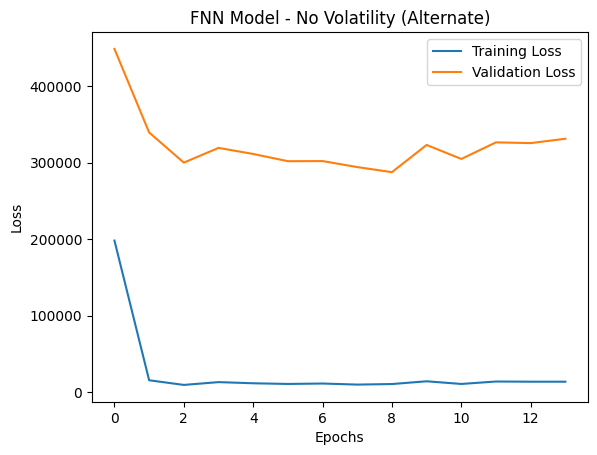

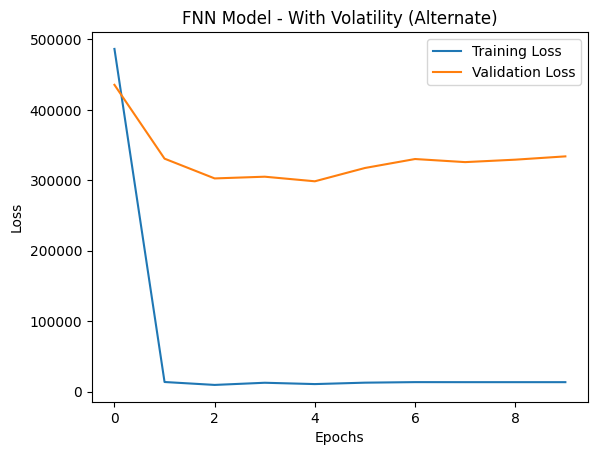

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()


# Plot the training and validation loss for the alternate models
plot_loss(history_no_vol_alt, "FNN Model - No Volatility (Alternate)")
plot_loss(history_with_vol_alt, "FNN Model - With Volatility (Alternate)")
#Nishan Maharjan 11/4/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Model Without Volatility (Alternate):
RMSE: 536.3885, R²: -5.4636, MAPE: 58.1353%
Model With Volatility (Alternate):
RMSE: 546.3796, R²: -5.7066, MAPE: 59.5702%
Lift Chart - No Volatility (Alternate):


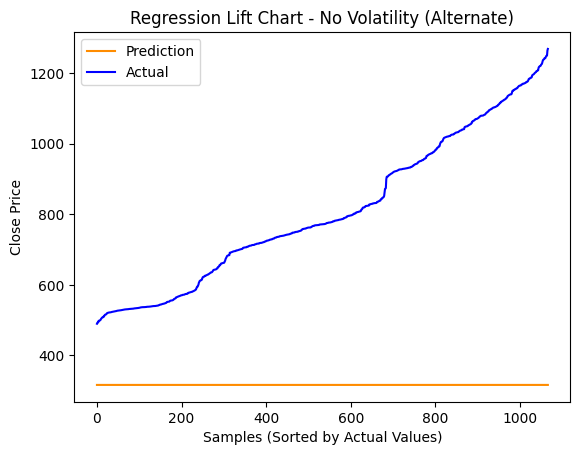

Lift Chart - With Volatility (Alternate):


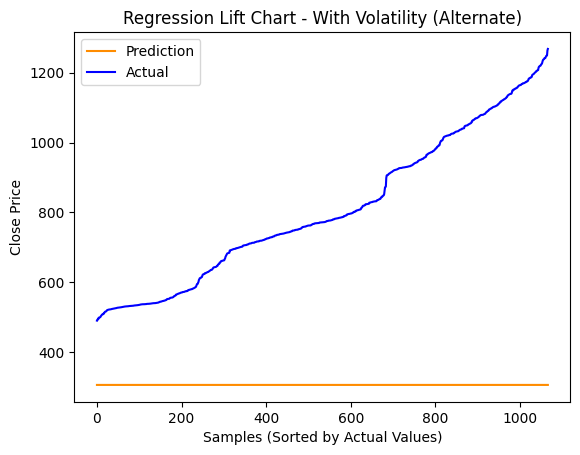

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE, R², and MAPE
def evaluate_model(model, X_test, y_test):
    # Predict using the trained model
    y_pred = model.predict(X_test)

    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))

    # Calculate R² score
    r2 = r2_score(y_test, y_pred)

    # Calculate MAPE
    mape = mean_absolute_percentage_error(y_test, y_pred)

    return y_pred, rmse, r2, mape

# Regression chart (sorted predictions vs. actual values)
def chart_regression(pred, y, title="Regression Lift Chart", sort=True):
    # Create a DataFrame for easier sorting and plotting
    data = pd.DataFrame({'Prediction': pred.flatten(), 'Actual': y.flatten()})

    # Sort by actual values if specified
    if sort:
        data = data.sort_values(by='Actual')

    # Plot predictions and actual values
    plt.plot(data['Prediction'].tolist(), label='Prediction', color='darkorange')
    plt.plot(data['Actual'].tolist(), label='Actual', color='blue')

    # Add labels, title, and legend
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.ylabel('Close Price')
    plt.title(title)
    plt.legend()
    plt.show()

# Evaluate the no-volatility model
y_pred_no_vol_alt, rmse_no_vol_alt, r2_no_vol_alt, mape_no_vol_alt = evaluate_model(model_no_vol_alt, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol_alt, rmse_with_vol_alt, r2_with_vol_alt, mape_with_vol_alt = evaluate_model(model_with_vol_alt, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility (Alternate):\nRMSE: {rmse_no_vol_alt:.4f}, R²: {r2_no_vol_alt:.4f}, MAPE: {mape_no_vol_alt:.4%}")
print(f"Model With Volatility (Alternate):\nRMSE: {rmse_with_vol_alt:.4f}, R²: {r2_with_vol_alt:.4f}, MAPE: {mape_with_vol_alt:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility (Alternate):")
chart_regression(y_pred_no_vol_alt, y_test_no_vol_seq, title="Regression Lift Chart - No Volatility (Alternate)")

print("Lift Chart - With Volatility (Alternate):")
chart_regression(y_pred_with_vol_alt, y_test_with_vol_seq, title="Regression Lift Chart - With Volatility (Alternate)")

#Nishan Maharjan 11/04/2024

## Building and Training the CNN Models

Here's the setup for our Convolutional Neural Network (CNN) models: one excluding volatility and one including it. Both models follow a similar structure, but the version with volatility takes an extra input feature.

### **Model Structure**
- **Input Layer**:
  - **Without volatility**: Shape `(7 days, 4 features)`
  - **With volatility**: Shape `(7 days, 5 features)`
- **Convolutional Layers**:
  - Any number of Conv1D layers with filters, different kernel sizes, and varying activation functions (ReLU, Sigmoid, Tanh).
  - Example:
    - **Conv Layer 1**: 64 filters, kernel size of 2, ReLU activation.
  - Max Pooling layers may follow each Conv layer to reduce dimensionality.
- **Hidden Layers**:
  - **Flatten Layer**: Converts pooled data for dense layer input.
  - Any number of Dense layers with decreasing neurons and varying activation functions (ReLU, Sigmoid, Tanh).
  - Example:
    - **Dense Layer**: 32 neurons with ReLU activation.
- **Output Layer**: One neuron with no activation (for regression).
- **Optimizer**: Either Adam or SGD, with various learning rates.
  - Example: Adam with a learning rate of 0.001.
- **Loss Function**: Mean Squared Error (MSE).

### Using Early Stopping and Model Checkpointing
To control overfitting, we use early stopping, monitoring validation loss and stopping if it doesn’t improve for 5 epochs, restoring the best weights. Model checkpointing saves the model’s weights with each new minimum validation loss, retaining the best version if training halts early.

### Training the Models
We train the models separately:
- **Model without volatility**: Input shape `(7, 4)`.
- **Model with volatility**: Input shape `(7, 5)`.

Both models are trained with:
- **Batch Size**: 32
- **Epochs**: 500 (or until early stopping).
- **Validation Data**: For monitoring model performance.

### Evaluating the Models
After training, we evaluate model performance on test data. We generate loss and lift charts and calculate RMSE, R², and MAPE to gauge accuracy.


### CNN Model Design and Testing (Tyler Burguillos)



#### Model 1: 1 Layer, ReLU avtivation, Adam Optimizer (1 Dense Layer)

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# Define a function to build the CNN model
def build_cnn_model(input_shape):
    model = Sequential()
    model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=input_shape))  # Convolutional layer
    model.add(MaxPooling1D(pool_size=2))
    model.add(Flatten())
    model.add(Dense(32, activation='relu'))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
    return model

# Build CNN models for both datasets
model_no_vol_cnn = build_cnn_model((7, 5))  # No-volatility CNN input: (7 days, 5 features)
model_with_vol_cnn = build_cnn_model((7, 6))  # With-volatility CNN input: (7 days, 6 features)

# Early stopping for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)

# Early stopping for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)

# Train the CNN model without volatility
history_no_vol_cnn = model_no_vol_cnn.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol],
    verbose=2
)

# Train the CNN model with volatility
history_with_vol_cnn = model_with_vol_cnn.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol],
    verbose=2
)

# Evaluate the CNN models
loss_no_vol_cnn = model_no_vol_cnn.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_cnn = model_with_vol_cnn.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (No Volatility - CNN): {loss_no_vol_cnn}")
print(f"Test Loss (With Volatility - CNN): {loss_with_vol_cnn}")

Epoch 1/500


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


79/79 - 1s - 19ms/step - loss: 85731.9922 - val_loss: 634863.7500
Epoch 2/500
79/79 - 0s - 6ms/step - loss: 54576.4805 - val_loss: 264729.6562
Epoch 3/500
79/79 - 0s - 3ms/step - loss: 8293.8975 - val_loss: 35432.9648
Epoch 4/500
79/79 - 0s - 4ms/step - loss: 2122.0840 - val_loss: 23954.7500
Epoch 5/500
79/79 - 0s - 4ms/step - loss: 1358.6161 - val_loss: 14922.2861
Epoch 6/500
79/79 - 0s - 4ms/step - loss: 812.0625 - val_loss: 9531.6133
Epoch 7/500
79/79 - 0s - 4ms/step - loss: 454.2527 - val_loss: 5244.6357
Epoch 8/500
79/79 - 0s - 4ms/step - loss: 248.6176 - val_loss: 2929.4043
Epoch 9/500
79/79 - 0s - 3ms/step - loss: 148.9440 - val_loss: 2111.3491
Epoch 10/500
79/79 - 0s - 3ms/step - loss: 106.5593 - val_loss: 1260.6486
Epoch 11/500
79/79 - 0s - 4ms/step - loss: 91.6693 - val_loss: 1030.2611
Epoch 12/500
79/79 - 0s - 3ms/step - loss: 87.2480 - val_loss: 893.9414
Epoch 13/500
79/79 - 0s - 3ms/step - loss: 84.9835 - val_loss: 910.1723
Epoch 14/500
79/79 - 0s - 3ms/step - loss: 84.213

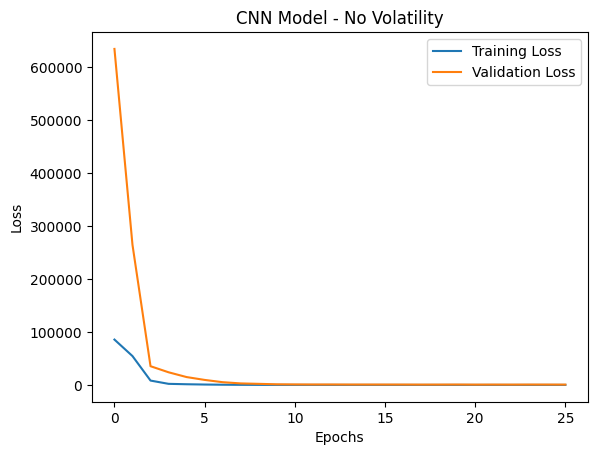

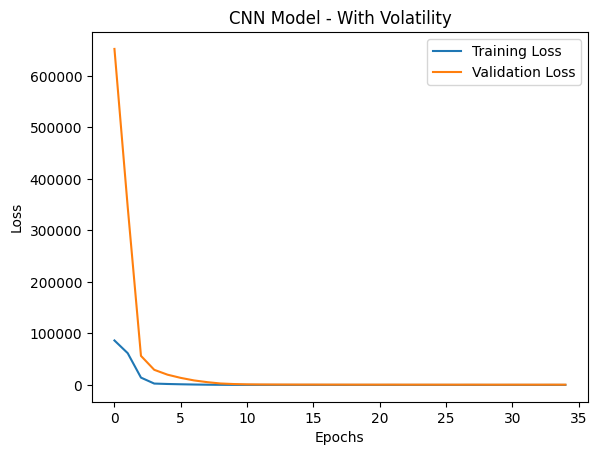

In [ ]:
# Plot the training and validation loss for both CNN models
def plot_loss(history, title):
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

# Plot loss for both CNN models
plot_loss(history_no_vol_cnn, "CNN Model - No Volatility")
plot_loss(history_with_vol_cnn, "CNN Model - With Volatility")

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Model Without Volatility (CNN) - RMSE: 25.7916, R²: 0.9851, MAPE: 2.3039%
Model With Volatility (CNN) - RMSE: 23.4872, R²: 0.9876, MAPE: 2.0903%
Lift Chart - No Volatility (CNN):


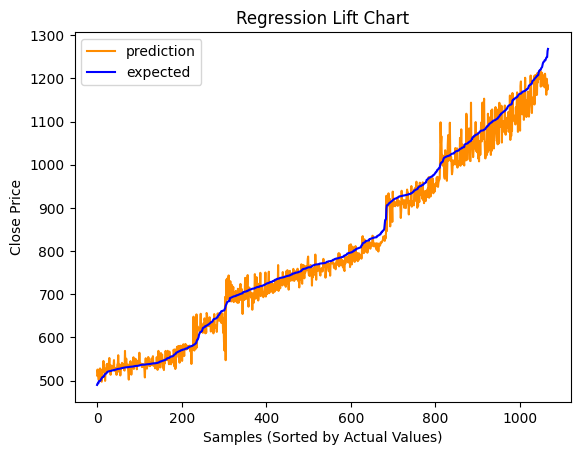

Lift Chart - With Volatility (CNN):


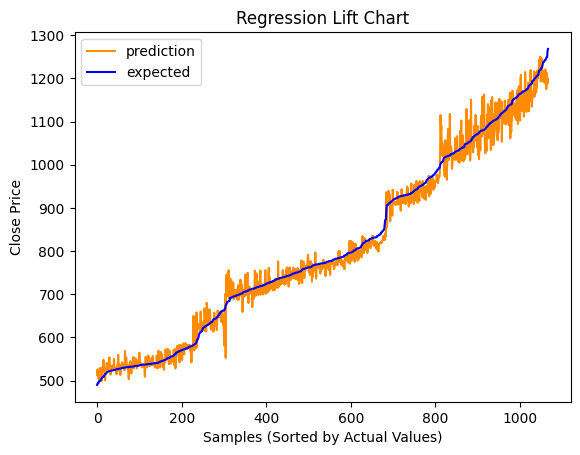

In [ ]:
# Evaluate your CNN models with RMSE, R², and MAPE
y_pred_no_vol_cnn, rmse_no_vol_cnn, r2_no_vol_cnn, mape_no_vol_cnn = evaluate_model(
    model_no_vol_cnn, X_test_no_vol, y_test_no_vol_seq
)

y_pred_with_vol_cnn, rmse_with_vol_cnn, r2_with_vol_cnn, mape_with_vol_cnn = evaluate_model(
    model_with_vol_cnn, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics for both CNN models
print(f"Model Without Volatility (CNN) - RMSE: {rmse_no_vol_cnn:.4f}, R²: {r2_no_vol_cnn:.4f}, MAPE: {mape_no_vol_cnn:.4%}")
print(f"Model With Volatility (CNN) - RMSE: {rmse_with_vol_cnn:.4f}, R²: {r2_with_vol_cnn:.4f}, MAPE: {mape_with_vol_cnn:.4%}")

# Plot lift charts for CNN models
print("Lift Chart - No Volatility (CNN):")
chart_regression(y_pred_no_vol_cnn, y_test_no_vol_seq)

print("Lift Chart - With Volatility (CNN):")
chart_regression(y_pred_with_vol_cnn, y_test_with_vol_seq)


#### Model 2: 1 Layer, ReLU avtivation, Adam Optimizer (2 Dense Layers)

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# Define a function to build the CNN model
def build_cnn_model(input_shape):
    model = Sequential()
    model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=input_shape))  # Convolutional layer
    model.add(MaxPooling1D(pool_size=2))  # Max pooling to reduce dimensionality
    model.add(Flatten())  # Flatten for dense layer compatibility
    model.add(Dense(64, activation='relu'))  # Dense hidden layer
    model.add(Dense(32, activation='relu'))  # Dense hidden layer
    model.add(Dense(1))  # Output layer (no activation for regression)
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
    return model

# Build CNN models for both datasets
model_no_vol_cnn = build_cnn_model((7, 5))  # No-volatility CNN input: (7 days, 5 features)
model_with_vol_cnn = build_cnn_model((7, 6))  # With-volatility CNN input: (7 days, 6 features)

# Early stopping for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)

# Early stopping for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)

# Train the CNN model without volatility
history_no_vol_cnn = model_no_vol_cnn.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol],
    verbose=2
)

# Train the CNN model with volatility
history_with_vol_cnn = model_with_vol_cnn.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol],
    verbose=2
)

# Evaluate the CNN models
loss_no_vol_cnn = model_no_vol_cnn.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_cnn = model_with_vol_cnn.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (No Volatility - CNN): {loss_no_vol_cnn}")
print(f"Test Loss (With Volatility - CNN): {loss_with_vol_cnn}")

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/500
79/79 - 3s - 32ms/step - loss: 77099.0859 - val_loss: 362483.9375
Epoch 2/500
79/79 - 1s - 10ms/step - loss: 6728.8745 - val_loss: 23944.2188
Epoch 3/500
79/79 - 0s - 3ms/step - loss: 1257.5178 - val_loss: 10502.0039
Epoch 4/500
79/79 - 0s - 3ms/step - loss: 452.4513 - val_loss: 2928.7671
Epoch 5/500
79/79 - 0s - 3ms/step - loss: 177.1467 - val_loss: 1415.5632
Epoch 6/500
79/79 - 0s - 4ms/step - loss: 104.2117 - val_loss: 869.5922
Epoch 7/500
79/79 - 0s - 4ms/step - loss: 90.1447 - val_loss: 623.3351
Epoch 8/500
79/79 - 0s - 3ms/step - loss: 87.5050 - val_loss: 577.9432
Epoch 9/500
79/79 - 0s - 4ms/step - loss: 86.1349 - val_loss: 559.2996
Epoch 10/500
79/79 - 0s - 4ms/step - loss: 85.8754 - val_loss: 552.7324
Epoch 11/500
79/79 - 0s - 3ms/step - loss: 84.7780 - val_loss: 552.8579
Epoch 12/500
79/79 - 0s - 4ms/step - loss: 84.8960 - val_loss: 560.2475
Epoch 13/500
79/79 - 0s - 3ms/step - loss: 84.4774 - val_loss: 503.6351
Epoch 14/500
79/79 - 0s - 4ms/step - loss: 83.8966 -

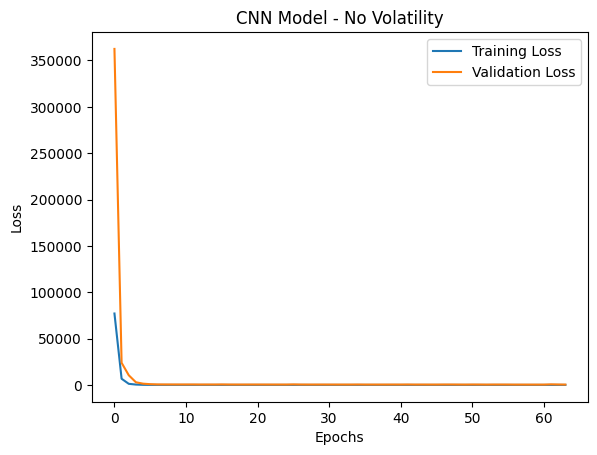

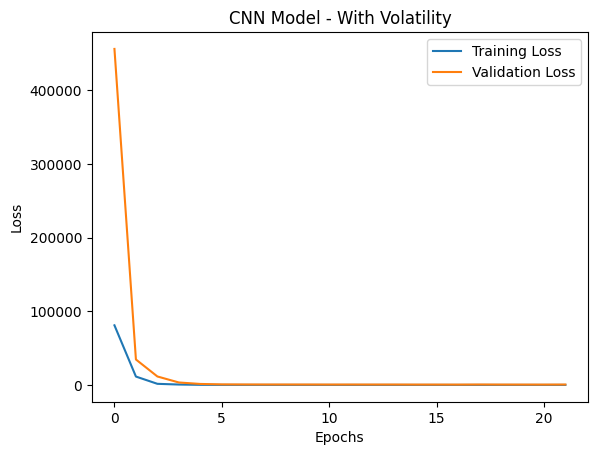

In [ ]:
# Plot the training and validation loss for both CNN models
def plot_loss(history, title):
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

# Plot loss for both CNN models
plot_loss(history_no_vol_cnn, "CNN Model - No Volatility")
plot_loss(history_with_vol_cnn, "CNN Model - With Volatility")

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Model Without Volatility (CNN) - RMSE: 20.3077, R²: 0.9907, MAPE: 1.7512%
Model With Volatility (CNN) - RMSE: 22.9167, R²: 0.9882, MAPE: 2.0228%
Lift Chart - No Volatility (CNN):


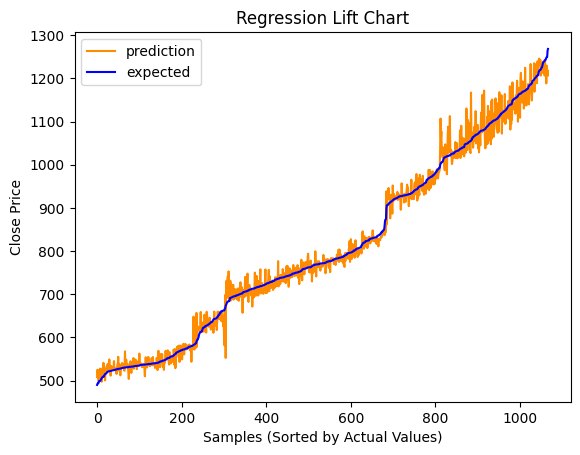

Lift Chart - With Volatility (CNN):


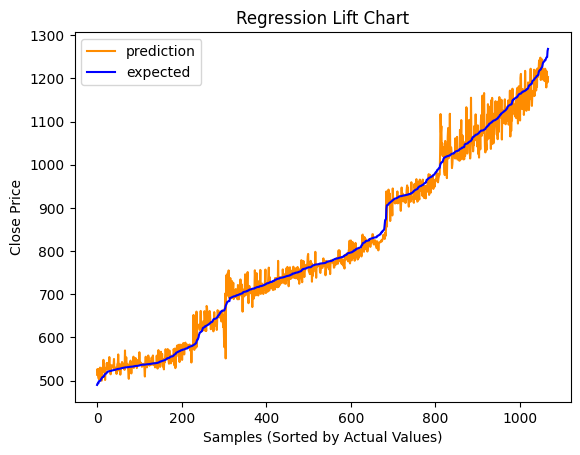

In [ ]:
# Evaluate your CNN models with RMSE, R², and MAPE
y_pred_no_vol_cnn, rmse_no_vol_cnn, r2_no_vol_cnn, mape_no_vol_cnn = evaluate_model(
    model_no_vol_cnn, X_test_no_vol, y_test_no_vol_seq
)

y_pred_with_vol_cnn, rmse_with_vol_cnn, r2_with_vol_cnn, mape_with_vol_cnn = evaluate_model(
    model_with_vol_cnn, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics for both CNN models
print(f"Model Without Volatility (CNN) - RMSE: {rmse_no_vol_cnn:.4f}, R²: {r2_no_vol_cnn:.4f}, MAPE: {mape_no_vol_cnn:.4%}")
print(f"Model With Volatility (CNN) - RMSE: {rmse_with_vol_cnn:.4f}, R²: {r2_with_vol_cnn:.4f}, MAPE: {mape_with_vol_cnn:.4%}")

# Plot lift charts for CNN models
print("Lift Chart - No Volatility (CNN):")
chart_regression(y_pred_no_vol_cnn, y_test_no_vol_seq)

print("Lift Chart - With Volatility (CNN):")
chart_regression(y_pred_with_vol_cnn, y_test_with_vol_seq)


#### Model 3: 2 Layer, ReLU avtivation, Adam Optimizer (1 Dense Layer)

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# Define a function to build the CNN model
def build_cnn_model(input_shape):
    model = Sequential()
    model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=input_shape))  # Convolutional layer
    model.add(MaxPooling1D(pool_size=2))  # Max pooling to reduce dimensionality
    model.add(Conv1D(filters=128, kernel_size=2, activation='relu', input_shape=input_shape))  # Convolutional layer
    model.add(MaxPooling1D(pool_size=2))  # Max pooling to reduce dimensionality
    model.add(Flatten())  # Flatten for dense layer compatibility
    model.add(Dense(32, activation='relu'))  # Dense hidden layer
    model.add(Dense(1))  # Output layer (no activation for regression)
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
    return model

# Build CNN models for both datasets
model_no_vol_cnn = build_cnn_model((7, 5))  # No-volatility CNN input: (7 days, 5 features)
model_with_vol_cnn = build_cnn_model((7, 6))  # With-volatility CNN input: (7 days, 6 features)

# Early stopping for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)

# Early stopping for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)

# Train the CNN model without volatility
history_no_vol_cnn = model_no_vol_cnn.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol],
    verbose=2
)

# Train the CNN model with volatility
history_with_vol_cnn = model_with_vol_cnn.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol],
    verbose=2
)

# Evaluate the CNN models
loss_no_vol_cnn = model_no_vol_cnn.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_cnn = model_with_vol_cnn.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (No Volatility - CNN): {loss_no_vol_cnn}")
print(f"Test Loss (With Volatility - CNN): {loss_with_vol_cnn}")

Epoch 1/500


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


79/79 - 2s - 23ms/step - loss: 70934.3438 - val_loss: 197462.3906
Epoch 2/500
79/79 - 0s - 4ms/step - loss: 3305.3896 - val_loss: 14234.5693
Epoch 3/500
79/79 - 0s - 4ms/step - loss: 940.4373 - val_loss: 5189.6567
Epoch 4/500
79/79 - 1s - 8ms/step - loss: 308.5968 - val_loss: 1758.3822
Epoch 5/500
79/79 - 0s - 4ms/step - loss: 134.3716 - val_loss: 709.2004
Epoch 6/500
79/79 - 0s - 4ms/step - loss: 97.3218 - val_loss: 636.8113
Epoch 7/500
79/79 - 0s - 4ms/step - loss: 89.8313 - val_loss: 601.1955
Epoch 8/500
79/79 - 1s - 9ms/step - loss: 89.1923 - val_loss: 541.6135
Epoch 9/500
79/79 - 1s - 10ms/step - loss: 88.9323 - val_loss: 544.3187
Epoch 10/500
79/79 - 1s - 7ms/step - loss: 88.5907 - val_loss: 554.0669
Epoch 11/500
79/79 - 1s - 8ms/step - loss: 88.7160 - val_loss: 552.1984
Epoch 12/500
79/79 - 1s - 7ms/step - loss: 88.5764 - val_loss: 538.8470
Epoch 13/500
79/79 - 1s - 9ms/step - loss: 88.4649 - val_loss: 567.5753
Epoch 14/500
79/79 - 1s - 7ms/step - loss: 90.1210 - val_loss: 540.7

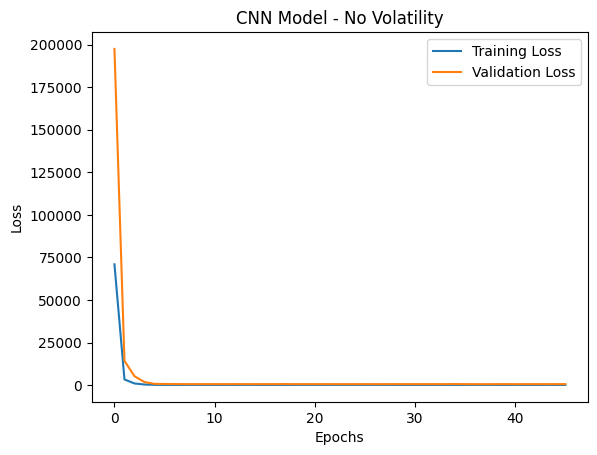

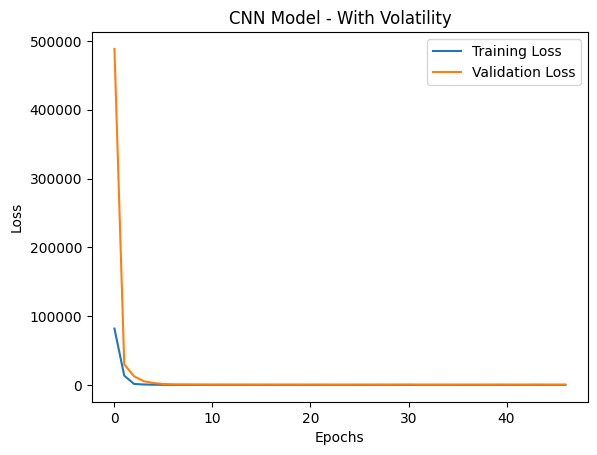

In [ ]:
# Plot the training and validation loss for both CNN models
def plot_loss(history, title):
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

# Plot loss for both CNN models
plot_loss(history_no_vol_cnn, "CNN Model - No Volatility")
plot_loss(history_with_vol_cnn, "CNN Model - With Volatility")

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Model Without Volatility (CNN) - RMSE: 22.8346, R²: 0.9883, MAPE: 1.9345%
Model With Volatility (CNN) - RMSE: 22.6591, R²: 0.9885, MAPE: 1.9279%
Lift Chart - No Volatility (CNN):


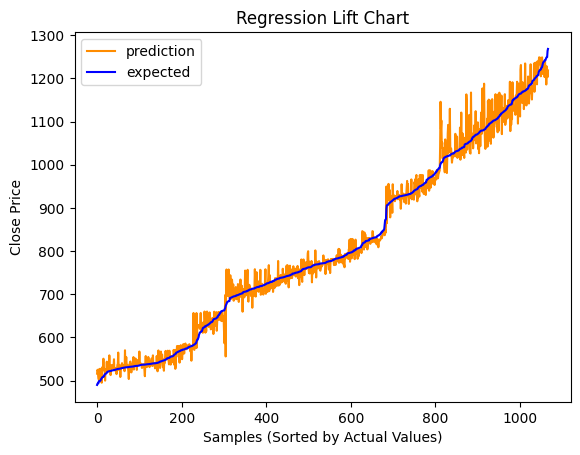

Lift Chart - With Volatility (CNN):


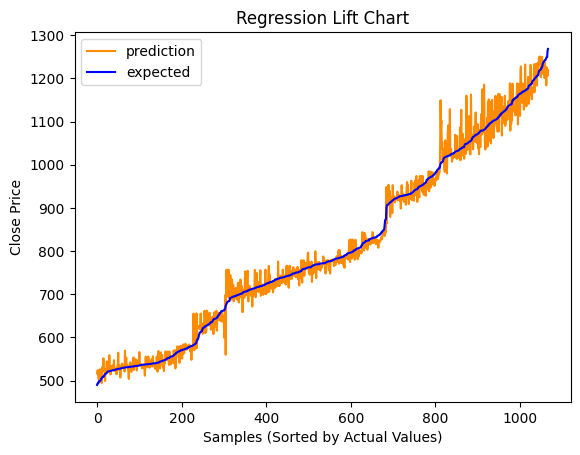

In [ ]:
# Evaluate your CNN models with RMSE, R², and MAPE
y_pred_no_vol_cnn, rmse_no_vol_cnn, r2_no_vol_cnn, mape_no_vol_cnn = evaluate_model(
    model_no_vol_cnn, X_test_no_vol, y_test_no_vol_seq
)

y_pred_with_vol_cnn, rmse_with_vol_cnn, r2_with_vol_cnn, mape_with_vol_cnn = evaluate_model(
    model_with_vol_cnn, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics for both CNN models
print(f"Model Without Volatility (CNN) - RMSE: {rmse_no_vol_cnn:.4f}, R²: {r2_no_vol_cnn:.4f}, MAPE: {mape_no_vol_cnn:.4%}")
print(f"Model With Volatility (CNN) - RMSE: {rmse_with_vol_cnn:.4f}, R²: {r2_with_vol_cnn:.4f}, MAPE: {mape_with_vol_cnn:.4%}")

# Plot lift charts for CNN models
print("Lift Chart - No Volatility (CNN):")
chart_regression(y_pred_no_vol_cnn, y_test_no_vol_seq)

print("Lift Chart - With Volatility (CNN):")
chart_regression(y_pred_with_vol_cnn, y_test_with_vol_seq)


#### Model 4: 2 Layer, ReLU avtivation, Adam Optimizer (2 Dense Layers)

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# Define a function to build the CNN model
def build_cnn_model(input_shape):
    model = Sequential()
    model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=input_shape))  # Convolutional layer
    model.add(MaxPooling1D(pool_size=2))  # Max pooling to reduce dimensionality
    model.add(Conv1D(filters=128, kernel_size=2, activation='relu', input_shape=input_shape))  # Convolutional layer
    model.add(MaxPooling1D(pool_size=2))  # Max pooling to reduce dimensionality
    model.add(Flatten())  # Flatten for dense layer compatibility
    model.add(Dense(64, activation='relu'))  # Dense hidden layer
    model.add(Dense(32, activation='relu'))  # Dense hidden layer
    model.add(Dense(1))  # Output layer (no activation for regression)
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
    return model

# Build CNN models for both datasets
model_no_vol_cnn = build_cnn_model((7, 5))  # No-volatility CNN input: (7 days, 5 features)
model_with_vol_cnn = build_cnn_model((7, 6))  # With-volatility CNN input: (7 days, 6 features)

# Early stopping for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)

# Early stopping for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)

# Train the CNN model without volatility
history_no_vol_cnn = model_no_vol_cnn.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol],
    verbose=2
)

# Train the CNN model with volatility
history_with_vol_cnn = model_with_vol_cnn.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol],
    verbose=2
)

# Evaluate the CNN models
loss_no_vol_cnn = model_no_vol_cnn.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_cnn = model_with_vol_cnn.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (No Volatility - CNN): {loss_no_vol_cnn}")
print(f"Test Loss (With Volatility - CNN): {loss_with_vol_cnn}")

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/500
79/79 - 3s - 42ms/step - loss: 62860.6172 - val_loss: 4389.5073
Epoch 2/500
79/79 - 1s - 7ms/step - loss: 1899.7314 - val_loss: 7267.7861
Epoch 3/500
79/79 - 0s - 5ms/step - loss: 361.9057 - val_loss: 2101.3809
Epoch 4/500
79/79 - 1s - 8ms/step - loss: 122.8078 - val_loss: 636.2593
Epoch 5/500
79/79 - 1s - 8ms/step - loss: 92.2214 - val_loss: 536.0107
Epoch 6/500
79/79 - 1s - 8ms/step - loss: 90.9381 - val_loss: 571.3524
Epoch 7/500
79/79 - 0s - 4ms/step - loss: 90.7836 - val_loss: 553.1174
Epoch 8/500
79/79 - 1s - 7ms/step - loss: 91.0932 - val_loss: 541.6164
Epoch 9/500
79/79 - 0s - 4ms/step - loss: 94.2326 - val_loss: 696.7419
Epoch 10/500
79/79 - 0s - 4ms/step - loss: 90.0419 - val_loss: 744.0938
Epoch 10: early stopping
Restoring model weights from the end of the best epoch: 5.
Epoch 1/500
79/79 - 2s - 28ms/step - loss: 64559.8828 - val_loss: 9268.6367
Epoch 2/500
79/79 - 0s - 5ms/step - loss: 2330.3423 - val_loss: 9217.5947
Epoch 3/500
79/79 - 1s - 7ms/step - loss: 52

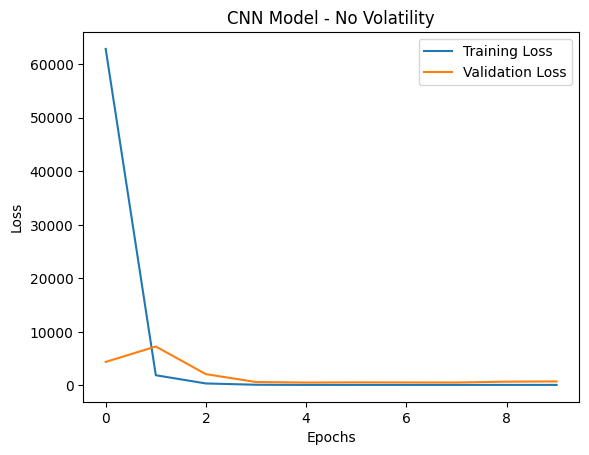

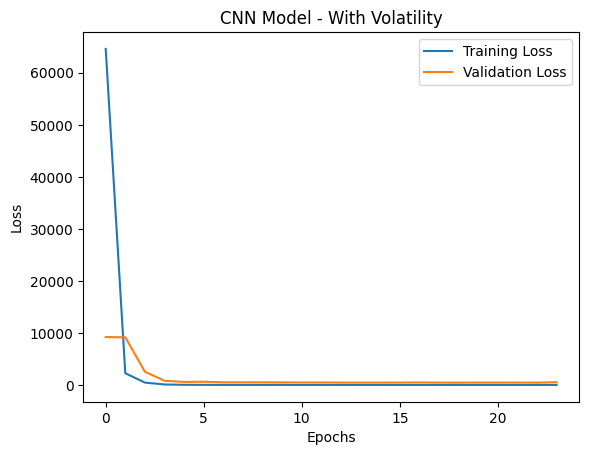

In [ ]:
# Plot the training and validation loss for both CNN models
def plot_loss(history, title):
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

# Plot loss for both CNN models
plot_loss(history_no_vol_cnn, "CNN Model - No Volatility")
plot_loss(history_with_vol_cnn, "CNN Model - With Volatility")

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Model Without Volatility (CNN) - RMSE: 23.1519, R²: 0.9880, MAPE: 2.0049%
Model With Volatility (CNN) - RMSE: 22.8691, R²: 0.9883, MAPE: 1.9633%
Lift Chart - No Volatility (CNN):


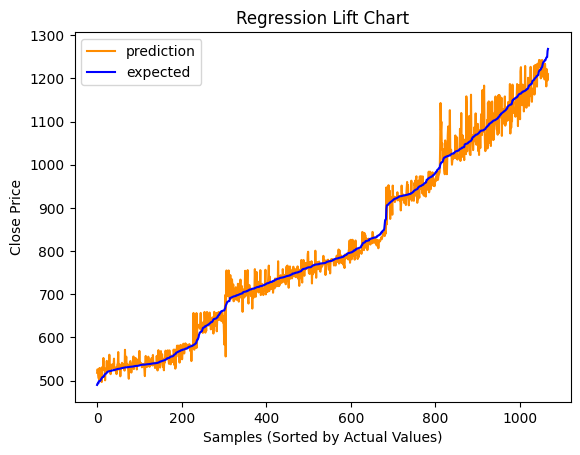

Lift Chart - With Volatility (CNN):


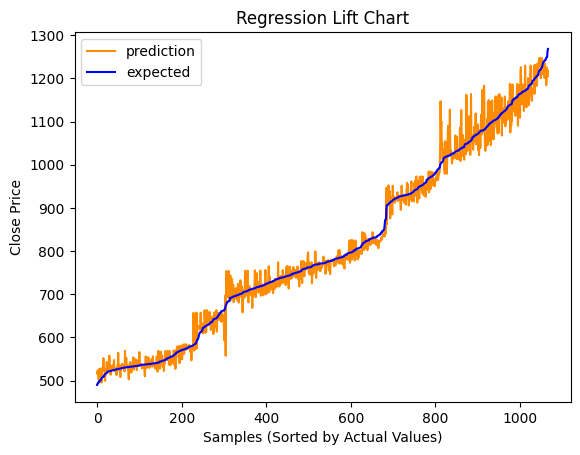

In [ ]:
# Evaluate your CNN models with RMSE, R², and MAPE
y_pred_no_vol_cnn, rmse_no_vol_cnn, r2_no_vol_cnn, mape_no_vol_cnn = evaluate_model(
    model_no_vol_cnn, X_test_no_vol, y_test_no_vol_seq
)

y_pred_with_vol_cnn, rmse_with_vol_cnn, r2_with_vol_cnn, mape_with_vol_cnn = evaluate_model(
    model_with_vol_cnn, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics for both CNN models
print(f"Model Without Volatility (CNN) - RMSE: {rmse_no_vol_cnn:.4f}, R²: {r2_no_vol_cnn:.4f}, MAPE: {mape_no_vol_cnn:.4%}")
print(f"Model With Volatility (CNN) - RMSE: {rmse_with_vol_cnn:.4f}, R²: {r2_with_vol_cnn:.4f}, MAPE: {mape_with_vol_cnn:.4%}")

# Plot lift charts for CNN models
print("Lift Chart - No Volatility (CNN):")
chart_regression(y_pred_no_vol_cnn, y_test_no_vol_seq)

print("Lift Chart - With Volatility (CNN):")
chart_regression(y_pred_with_vol_cnn, y_test_with_vol_seq)


#### Model 5: 1 Layer, ReLU avtivation, Adam Optimizer (1 Dense Layer)

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import EarlyStopping

# Define a function to build the CNN model
def build_cnn_model(input_shape):
    model = Sequential()
    model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=input_shape))  # Convolutional layer
    model.add(MaxPooling1D(pool_size=2))  # Max pooling to reduce dimensionality
    model.add(Flatten())  # Flatten for dense layer compatibility
    model.add(Dense(32, activation='relu'))  # Dense hidden layer
    model.add(Dense(1))  # Output layer (no activation for regression)
    model.compile(optimizer=SGD(learning_rate=0.001), loss='mean_squared_error')
    return model

# Build CNN models for both datasets
model_no_vol_cnn = build_cnn_model((7, 5))  # No-volatility CNN input: (7 days, 5 features)
model_with_vol_cnn = build_cnn_model((7, 6))  # With-volatility CNN input: (7 days, 6 features)

# Early stopping for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)

# Early stopping for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)

# Train the CNN model without volatility
history_no_vol_cnn = model_no_vol_cnn.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol],
    verbose=2
)

# Train the CNN model with volatility
history_with_vol_cnn = model_with_vol_cnn.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol],
    verbose=2
)

# Evaluate the CNN models
loss_no_vol_cnn = model_no_vol_cnn.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_cnn = model_with_vol_cnn.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (No Volatility - CNN): {loss_no_vol_cnn}")
print(f"Test Loss (With Volatility - CNN): {loss_with_vol_cnn}")

Epoch 1/500


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


79/79 - 1s - 8ms/step - loss: 123957.5938 - val_loss: 643614.9375
Epoch 2/500
79/79 - 0s - 6ms/step - loss: 62182.1211 - val_loss: 590675.9375
Epoch 3/500
79/79 - 0s - 4ms/step - loss: 48885.9258 - val_loss: 547641.3125
Epoch 4/500
79/79 - 0s - 4ms/step - loss: 39251.7891 - val_loss: 512584.4062
Epoch 5/500
79/79 - 0s - 4ms/step - loss: 32282.9668 - val_loss: 483821.7812
Epoch 6/500
79/79 - 0s - 4ms/step - loss: 27218.7129 - val_loss: 459717.9062
Epoch 7/500
79/79 - 0s - 6ms/step - loss: 23480.0957 - val_loss: 439727.7500
Epoch 8/500
79/79 - 1s - 7ms/step - loss: 20759.6113 - val_loss: 422884.9375
Epoch 9/500
79/79 - 1s - 8ms/step - loss: 18750.3281 - val_loss: 408585.5938
Epoch 10/500
79/79 - 0s - 4ms/step - loss: 17242.4004 - val_loss: 396748.1875
Epoch 11/500
79/79 - 1s - 9ms/step - loss: 15058.6064 - val_loss: 384841.6562
Epoch 12/500
79/79 - 1s - 7ms/step - loss: 13036.6611 - val_loss: 374005.2188
Epoch 13/500
79/79 - 1s - 7ms/step - loss: 11855.0410 - val_loss: 362544.9375
Epoch 

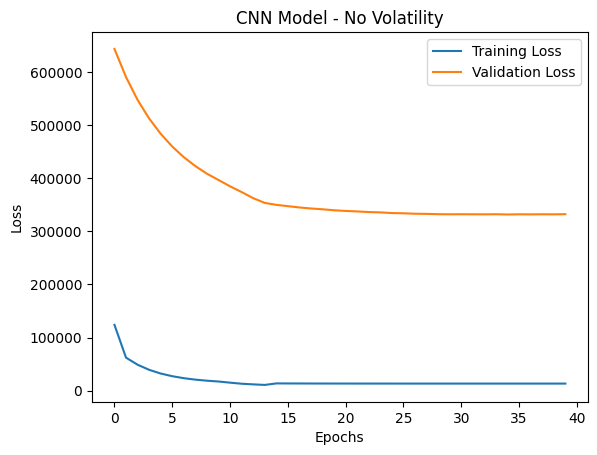

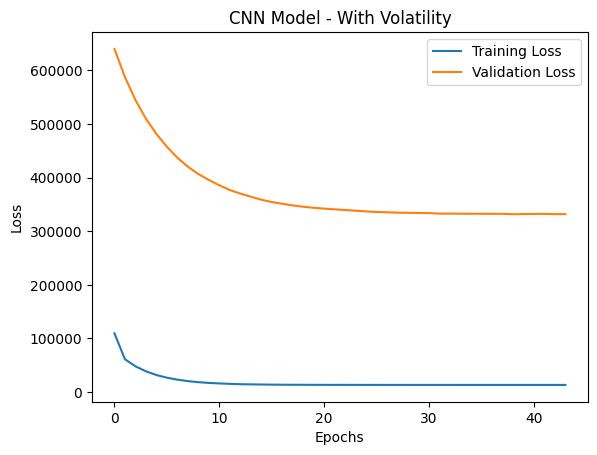

In [ ]:
# Plot the training and validation loss for both CNN models
def plot_loss(history, title):
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

# Plot loss for both CNN models
plot_loss(history_no_vol_cnn, "CNN Model - No Volatility")
plot_loss(history_with_vol_cnn, "CNN Model - With Volatility")

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Model Without Volatility (CNN) - RMSE: 576.0117, R²: -6.4538, MAPE: 63.8002%
Model With Volatility (CNN) - RMSE: 575.8646, R²: -6.4499, MAPE: 63.7793%
Lift Chart - No Volatility (CNN):


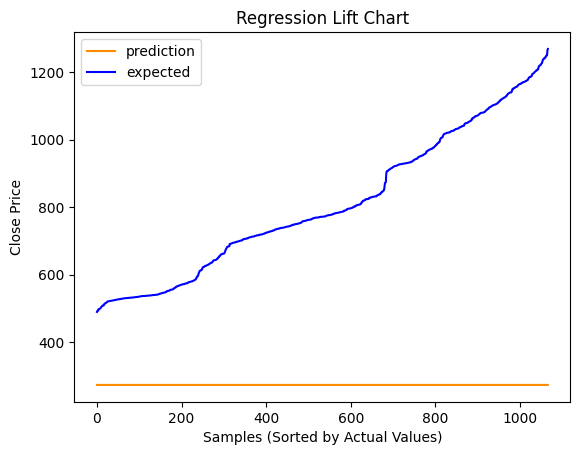

Lift Chart - With Volatility (CNN):


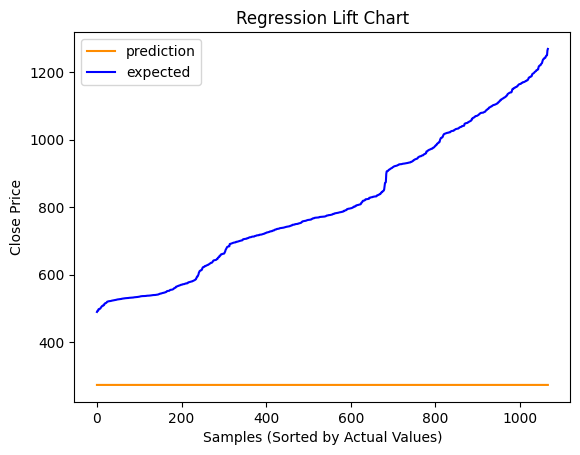

In [ ]:
# Evaluate your CNN models with RMSE, R², and MAPE
y_pred_no_vol_cnn, rmse_no_vol_cnn, r2_no_vol_cnn, mape_no_vol_cnn = evaluate_model(
    model_no_vol_cnn, X_test_no_vol, y_test_no_vol_seq
)

y_pred_with_vol_cnn, rmse_with_vol_cnn, r2_with_vol_cnn, mape_with_vol_cnn = evaluate_model(
    model_with_vol_cnn, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics for both CNN models
print(f"Model Without Volatility (CNN) - RMSE: {rmse_no_vol_cnn:.4f}, R²: {r2_no_vol_cnn:.4f}, MAPE: {mape_no_vol_cnn:.4%}")
print(f"Model With Volatility (CNN) - RMSE: {rmse_with_vol_cnn:.4f}, R²: {r2_with_vol_cnn:.4f}, MAPE: {mape_with_vol_cnn:.4%}")

# Plot lift charts for CNN models
print("Lift Chart - No Volatility (CNN):")
chart_regression(y_pred_no_vol_cnn, y_test_no_vol_seq)

print("Lift Chart - With Volatility (CNN):")
chart_regression(y_pred_with_vol_cnn, y_test_with_vol_seq)


### CNN Model Design and Testing (Austin Nolte)

#### Model 1: 1 Layer, Sigmoid Activation Function, Adam Optimizer


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Build model with no volatility (input = 7 days, 5 features)
model_no_vol = Sequential()
model_no_vol.add(Conv1D(filters=64, kernel_size=2, activation='sigmoid', input_shape=(7,5)))
model_no_vol.add(MaxPooling1D(pool_size=2))
model_no_vol.add(Flatten())
model_no_vol.add(Dense(32, activation='sigmoid'))
model_no_vol.add(Dense(1))
model_no_vol.compile(loss='mean_squared_error', optimizer='adam')

# Build model with volatility (input = 7 days, 6 features)
model_with_vol = Sequential()
model_with_vol.add(Conv1D(filters=64, kernel_size=2, activation='sigmoid', input_shape=(7,6)))
model_with_vol.add(MaxPooling1D(pool_size=2))
model_with_vol.add(Flatten())
model_with_vol.add(Dense(32, activation='sigmoid'))
model_with_vol.add(Dense(1))
model_with_vol.compile(loss='mean_squared_error', optimizer='adam')

# Early stopping and checkpointing for each model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Austin_cnn_model_1_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Austin_cnn_model_1_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
# Austin Nolte 11/4/24

In [ ]:
# Train model without volatility
history_no_vol = model_no_vol.fit(X_train_no_vol, y_train_no_vol_seq,validation_data=(X_test_no_vol, y_test_no_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_no_vol, checkpoint_no_vol],verbose=2)

# Evaluate the model without volatility
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")

# Austin Nolte 11/4/24

In [ ]:
# Train model with volatility
history_with_vol = model_with_vol.fit(X_train_with_vol, y_train_with_vol_seq,validation_data=(X_test_with_vol, y_test_with_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_with_vol, checkpoint_with_vol],verbose=2)

# Evaluate the model with volatility
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (With Volatility): {loss_with_vol}")
# Austin Nolte 11/4/24

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "CNN Model - No Volatility")
plot_loss(history_with_vol, "CNN Model - With Volatility")

# Austin Nolte 11/4/24

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility stats: \nRMSE: {rmse_no_vol:.4f}, \nR²: {r2_no_vol:.4f}, \nMAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility stats: \nRMSE: {rmse_with_vol:.4f}, \nR²: {r2_with_vol:.4f}, \nMAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Austin Nolte 11/4/24

#### Model 2: 3 Layers, Sigmoid Activation Function, Adam Optimizer


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Build model with no volatility (input = 7 days, 5 features)
model_no_vol = Sequential()
model_no_vol.add(Conv1D(filters=64, kernel_size=2, activation='sigmoid', input_shape=(7,5)))
model_no_vol.add(MaxPooling1D(pool_size=2))
model_no_vol.add(Conv1D(filters=32, kernel_size=2, activation='sigmoid'))
model_no_vol.add(MaxPooling1D(pool_size=2))
model_no_vol.add(Flatten())
model_no_vol.add(Dense(32, activation='sigmoid'))
model_no_vol.add(Dense(16, activation='sigmoid'))
model_no_vol.add(Dense(1))
model_no_vol.compile(loss='mean_squared_error', optimizer='adam')

# Build model with volatility (input = 7 days, 6 features)
model_with_vol = Sequential()
model_with_vol.add(Conv1D(filters=64, kernel_size=2, activation='sigmoid', input_shape=(7,6)))
model_with_vol.add(MaxPooling1D(pool_size=2))
model_with_vol.add(Conv1D(filters=32, kernel_size=2, activation='sigmoid'))
model_with_vol.add(MaxPooling1D(pool_size=2))
model_with_vol.add(Flatten())
model_with_vol.add(Dense(32, activation='sigmoid'))
model_with_vol.add(Dense(16, activation='sigmoid'))
model_with_vol.add(Dense(1))
model_with_vol.compile(loss='mean_squared_error', optimizer='adam')

# Early stopping and checkpointing for each model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Austin_cnn_model_2_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Austin_cnn_model_2_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
# Austin Nolte 11/4/24

In [ ]:
# Train model without volatility
history_no_vol = model_no_vol.fit(X_train_no_vol, y_train_no_vol_seq,validation_data=(X_test_no_vol, y_test_no_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_no_vol, checkpoint_no_vol],verbose=2)

# Evaluate the model without volatility
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")

# Austin Nolte 11/4/24

In [ ]:
# Train model with volatility
history_with_vol = model_with_vol.fit(X_train_with_vol, y_train_with_vol_seq,validation_data=(X_test_with_vol, y_test_with_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_with_vol, checkpoint_with_vol],verbose=2)

# Evaluate the model with volatility
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (With Volatility): {loss_with_vol}")
# Austin Nolte 11/4/24

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "CNN Model - No Volatility")
plot_loss(history_with_vol, "CNN Model - With Volatility")

# Austin Nolte 11/4/24

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility stats: \nRMSE: {rmse_no_vol:.4f}, \nR²: {r2_no_vol:.4f}, \nMAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility stats: \nRMSE: {rmse_with_vol:.4f}, \nR²: {r2_with_vol:.4f}, \nMAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Austin Nolte 11/4/24

#### Model 3: 1 Layer, Sigmoid Activation Function, SGD Optimizer


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Build model with no volatility (input = 7 days, 5 features)
model_no_vol = Sequential()
model_no_vol.add(Conv1D(filters=64, kernel_size=2, activation='sigmoid', input_shape=(7,5)))
model_no_vol.add(MaxPooling1D(pool_size=2))
model_no_vol.add(Flatten())
model_no_vol.add(Dense(32, activation='sigmoid'))
model_no_vol.add(Dense(1))
model_no_vol.compile(loss='mean_squared_error', optimizer='adam')

# Build model with volatility (input = 7 days, 6 features)
model_with_vol = Sequential()
model_with_vol.add(Conv1D(filters=64, kernel_size=2, activation='sigmoid', input_shape=(7,6)))
model_with_vol.add(MaxPooling1D(pool_size=2))
model_with_vol.add(Flatten())
model_with_vol.add(Dense(32, activation='sigmoid'))
model_with_vol.add(Dense(1))
model_with_vol.compile(loss='mean_squared_error', optimizer='sgd')

# Early stopping and checkpointing for each model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Austin_cnn_model_3_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Austin_cnn_model_3_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
# Austin Nolte 11/4/24

In [ ]:
# Train model without volatility
history_no_vol = model_no_vol.fit(X_train_no_vol, y_train_no_vol_seq,validation_data=(X_test_no_vol, y_test_no_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_no_vol, checkpoint_no_vol],verbose=2)

# Evaluate the model without volatility
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")

# Austin Nolte 11/4/24

In [ ]:
# Train model with volatility
history_with_vol = model_with_vol.fit(X_train_with_vol, y_train_with_vol_seq,validation_data=(X_test_with_vol, y_test_with_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_with_vol, checkpoint_with_vol],verbose=2)

# Evaluate the model with volatility
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (With Volatility): {loss_with_vol}")
# Austin Nolte 11/4/24

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "CNN Model - No Volatility")
plot_loss(history_with_vol, "CNN Model - With Volatility")

# Austin Nolte 11/4/24

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility stats: \nRMSE: {rmse_no_vol:.4f}, \nR²: {r2_no_vol:.4f}, \nMAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility stats: \nRMSE: {rmse_with_vol:.4f}, \nR²: {r2_with_vol:.4f}, \nMAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Austin Nolte 11/4/24

#### Model 4: 3 Layers, Sigmoid Activation Function, sgd Optimizer


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Build model with no volatility (input = 7 days, 5 features)
model_no_vol = Sequential()
model_no_vol.add(Conv1D(filters=64, kernel_size=2, activation='sigmoid', input_shape=(7,5)))
model_no_vol.add(MaxPooling1D(pool_size=2))
model_no_vol.add(Conv1D(filters=32, kernel_size=2, activation='sigmoid'))
model_no_vol.add(MaxPooling1D(pool_size=2))
model_no_vol.add(Flatten())
model_no_vol.add(Dense(32, activation='sigmoid'))
model_no_vol.add(Dense(16, activation='sigmoid'))
model_no_vol.add(Dense(1))
model_no_vol.compile(loss='mean_squared_error', optimizer='adam')

# Build model with volatility (input = 7 days, 6 features)
model_with_vol = Sequential()
model_with_vol.add(Conv1D(filters=64, kernel_size=2, activation='sigmoid', input_shape=(7,6)))
model_with_vol.add(MaxPooling1D(pool_size=2))
model_with_vol.add(Conv1D(filters=32, kernel_size=2, activation='sigmoid'))
model_with_vol.add(MaxPooling1D(pool_size=2))
model_with_vol.add(Flatten())
model_with_vol.add(Dense(32, activation='sigmoid'))
model_with_vol.add(Dense(16, activation='sigmoid'))
model_with_vol.add(Dense(1))
model_with_vol.compile(loss='mean_squared_error', optimizer='sgd')

# Early stopping and checkpointing for each model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Austin_cnn_model_4_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Austin_cnn_model_4_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
# Austin Nolte 11/4/24

In [ ]:
# Train model without volatility
history_no_vol = model_no_vol.fit(X_train_no_vol, y_train_no_vol_seq,validation_data=(X_test_no_vol, y_test_no_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_no_vol, checkpoint_no_vol],verbose=2)

# Evaluate the model without volatility
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")

# Austin Nolte 11/4/24

In [ ]:
# Train model with volatility
history_with_vol = model_with_vol.fit(X_train_with_vol, y_train_with_vol_seq,validation_data=(X_test_with_vol, y_test_with_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_with_vol, checkpoint_with_vol],verbose=2)

# Evaluate the model with volatility
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (With Volatility): {loss_with_vol}")
# Austin Nolte 11/4/24

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "CNN Model - No Volatility")
plot_loss(history_with_vol, "CNN Model - With Volatility")

# Austin Nolte 11/4/24

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility stats: \nRMSE: {rmse_no_vol:.4f}, \nR²: {r2_no_vol:.4f}, \nMAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility stats: \nRMSE: {rmse_with_vol:.4f}, \nR²: {r2_with_vol:.4f}, \nMAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Austin Nolte 11/4/24

### CNN Model Design and Testing (Alan Lei)

#### Model 1: tanh Activation, 3 layers, Optimizer Adam

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the CNN model
def build_cnn_model(input_shape):
    model = Sequential()
    model.add(Conv1D(filters=64, kernel_size=2, activation='tanh', input_shape=input_shape))  # Convolutional layer
    model.add(MaxPooling1D(pool_size=2))  # Max pooling to reduce dimensionality
    model.add(Flatten())  # Flatten for dense layer compatibility
    model.add(Dense(64, activation='tanh'))  # Dense hidden layer 1
    model.add(Dense(32, activation='tanh'))  # Dense hidden layer 2
    model.add(Dense(16, activation='tanh'))  # Dense hidden layer 3
    model.add(Dense(1))  # Output layer (no activation for regression)
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
    return model

# Build CNN models for both datasets
model_no_vol_cnn = build_cnn_model((7, 5))  # No-volatility CNN input: (7 days, 5 features)
model_with_vol_cnn = build_cnn_model((7, 6))  # With-volatility CNN input: (7 days, 6 features)

# Early stopping for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Alan_cnn_model_1_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Alan_cnn_model_1_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the CNN model without volatility
history_no_vol_cnn = model_no_vol_cnn.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol],
    verbose=2
)

# Train the CNN model with volatility
history_with_vol_cnn = model_with_vol_cnn.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol],
    verbose=2
)

# Evaluate the CNN models
loss_no_vol_cnn = model_no_vol_cnn.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_cnn = model_with_vol_cnn.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (No Volatility - CNN): {loss_no_vol_cnn}")
print(f"Test Loss (With Volatility - CNN): {loss_with_vol_cnn}")

Epoch 1/500


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


79/79 - 2s - 24ms/step - loss: 86252.6250 - val_loss: 691303.8750
Epoch 2/500
79/79 - 0s - 6ms/step - loss: 84998.2969 - val_loss: 688822.1875
Epoch 3/500
79/79 - 0s - 3ms/step - loss: 84206.0938 - val_loss: 686521.3750
Epoch 4/500
79/79 - 0s - 4ms/step - loss: 83458.2656 - val_loss: 684290.3125
Epoch 5/500
79/79 - 0s - 4ms/step - loss: 82728.6328 - val_loss: 682103.3750
Epoch 6/500
79/79 - 0s - 3ms/step - loss: 82011.9219 - val_loss: 679935.9375
Epoch 7/500
79/79 - 0s - 4ms/step - loss: 81297.1172 - val_loss: 677769.3750
Epoch 8/500
79/79 - 0s - 3ms/step - loss: 80603.2891 - val_loss: 675663.8750
Epoch 9/500
79/79 - 0s - 3ms/step - loss: 79918.1797 - val_loss: 673566.0625
Epoch 10/500
79/79 - 0s - 5ms/step - loss: 79236.3594 - val_loss: 671465.6875
Epoch 11/500
79/79 - 0s - 5ms/step - loss: 78557.2031 - val_loss: 669366.3750
Epoch 12/500
79/79 - 1s - 9ms/step - loss: 77888.8359 - val_loss: 667298.0000
Epoch 13/500
79/79 - 0s - 5ms/step - loss: 77219.6250 - val_loss: 665223.5000
Epoch 

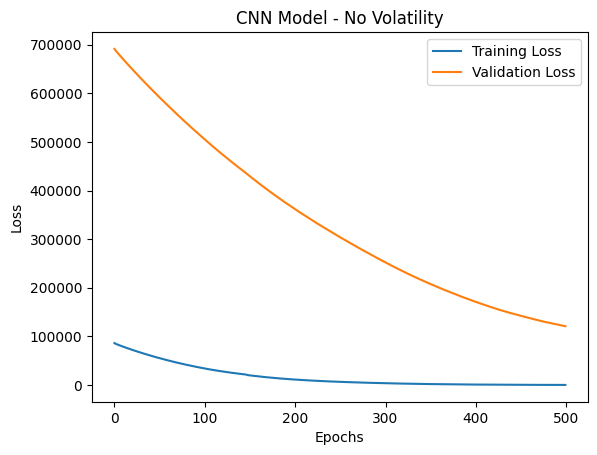

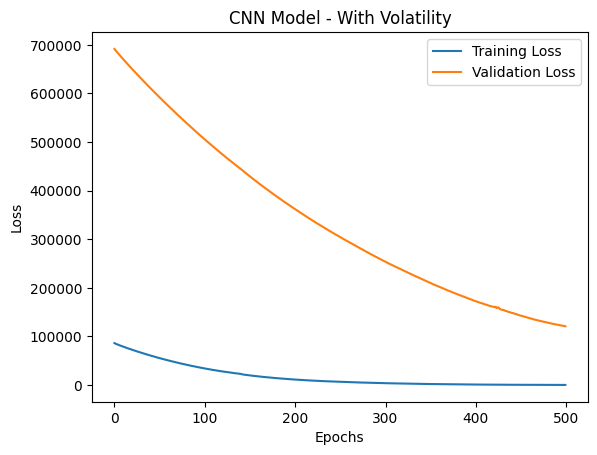

In [ ]:
# Plot the training and validation loss for both CNN models
def plot_loss(history, title):
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

# Plot loss for both CNN models
plot_loss(history_no_vol_cnn, "CNN Model - No Volatility")
plot_loss(history_with_vol_cnn, "CNN Model - With Volatility")

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Model Without Volatility (CNN) - RMSE: 347.6547, R²: -1.7152, MAPE: 29.7618%
Model With Volatility (CNN) - RMSE: 347.6443, R²: -1.7151, MAPE: 29.7554%
Lift Chart - No Volatility (CNN):


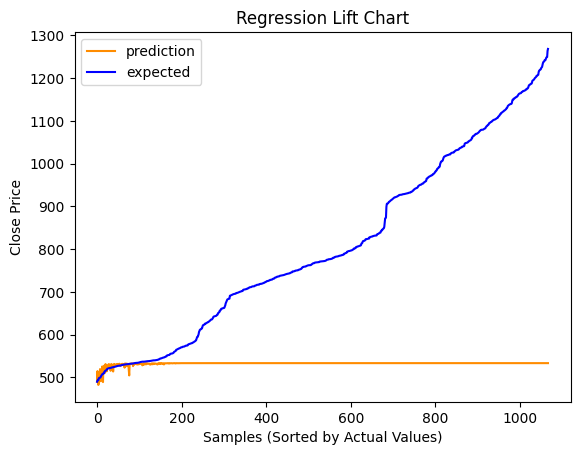

Lift Chart - With Volatility (CNN):


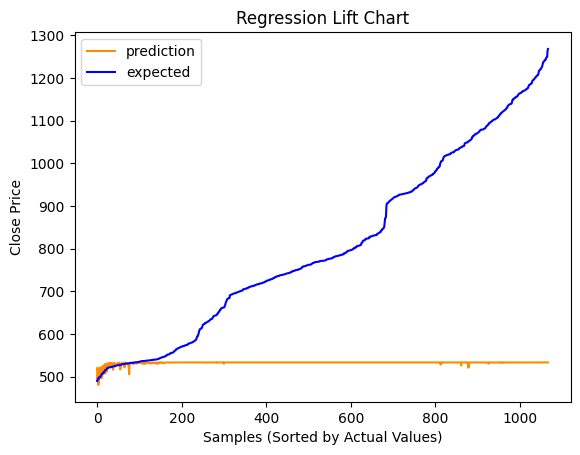

In [ ]:
# Evaluate your CNN models with RMSE, R², and MAPE
y_pred_no_vol_cnn, rmse_no_vol_cnn, r2_no_vol_cnn, mape_no_vol_cnn = evaluate_model(
    model_no_vol_cnn, X_test_no_vol, y_test_no_vol_seq
)

y_pred_with_vol_cnn, rmse_with_vol_cnn, r2_with_vol_cnn, mape_with_vol_cnn = evaluate_model(
    model_with_vol_cnn, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics for both CNN models
print(f"Model Without Volatility (CNN) - RMSE: {rmse_no_vol_cnn:.4f}, R²: {r2_no_vol_cnn:.4f}, MAPE: {mape_no_vol_cnn:.4%}")
print(f"Model With Volatility (CNN) - RMSE: {rmse_with_vol_cnn:.4f}, R²: {r2_with_vol_cnn:.4f}, MAPE: {mape_with_vol_cnn:.4%}")

# Plot lift charts for CNN models
print("Lift Chart - No Volatility (CNN):")
chart_regression(y_pred_no_vol_cnn, y_test_no_vol_seq)

print("Lift Chart - With Volatility (CNN):")
chart_regression(y_pred_with_vol_cnn, y_test_with_vol_seq)


#### Model 2: tanh Activation, 4 layers with dropout layer, Optimizer Adam

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# Define a function to build the CNN model
def build_cnn_model(input_shape):
    model = Sequential()
    model.add(Conv1D(filters=64, kernel_size=2, activation='tanh', input_shape=input_shape))  # Convolutional layer
    model.add(MaxPooling1D(pool_size=2))  # Max pooling to reduce dimensionality
    model.add(Flatten())  # Flatten for dense layer compatibility
    model.add(Dense(64, activation='tanh'))  # Dense hidden layer 1
    model.add(Dense(32, activation='tanh'))  # Dense hidden layer 2
    model.add(Dropout(0.01))                 # Dropout layer
    model.add(Dense(16, activation='tanh'))  # Dense hidden layer 3
    model.add(Dense(8, activation='tanh'))  # Dense hidden layer 4
    model.add(Dense(1))  # Output layer (no activation for regression)
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
    return model

# Build CNN models for both datasets
model_no_vol_cnn = build_cnn_model((7, 5))  # No-volatility CNN input: (7 days, 5 features)
model_with_vol_cnn = build_cnn_model((7, 6))  # With-volatility CNN input: (7 days, 6 features)

# Early stopping for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Alan_cnn_model_2_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Alan_cnn_model_2_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the CNN model without volatility
history_no_vol_cnn = model_no_vol_cnn.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol],
    verbose=2
)

# Train the CNN model with volatility
history_with_vol_cnn = model_with_vol_cnn.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol],
    verbose=2
)

# Evaluate the CNN models
loss_no_vol_cnn = model_no_vol_cnn.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_cnn = model_with_vol_cnn.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (No Volatility - CNN): {loss_no_vol_cnn}")
print(f"Test Loss (With Volatility - CNN): {loss_with_vol_cnn}")

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/500
79/79 - 3s - 42ms/step - loss: 86349.9688 - val_loss: 692522.1875
Epoch 2/500
79/79 - 1s - 6ms/step - loss: 85582.7031 - val_loss: 691149.1875
Epoch 3/500
79/79 - 0s - 3ms/step - loss: 85155.5703 - val_loss: 689922.7500
Epoch 4/500
79/79 - 0s - 3ms/step - loss: 84754.6562 - val_loss: 688735.8125
Epoch 5/500
79/79 - 0s - 4ms/step - loss: 84363.0312 - val_loss: 687566.7500
Epoch 6/500
79/79 - 0s - 4ms/step - loss: 83978.1719 - val_loss: 686414.4375
Epoch 7/500
79/79 - 0s - 4ms/step - loss: 83599.1953 - val_loss: 685274.6875
Epoch 8/500
79/79 - 0s - 4ms/step - loss: 83220.8125 - val_loss: 684136.0000
Epoch 9/500
79/79 - 0s - 3ms/step - loss: 82847.0000 - val_loss: 683001.6875
Epoch 10/500
79/79 - 0s - 4ms/step - loss: 82472.1641 - val_loss: 681865.8750
Epoch 11/500
79/79 - 0s - 3ms/step - loss: 82100.2734 - val_loss: 680738.6250
Epoch 12/500
79/79 - 0s - 4ms/step - loss: 81732.2578 - val_loss: 679619.3125
Epoch 13/500
79/79 - 0s - 4ms/step - loss: 81363.6641 - val_loss: 678496

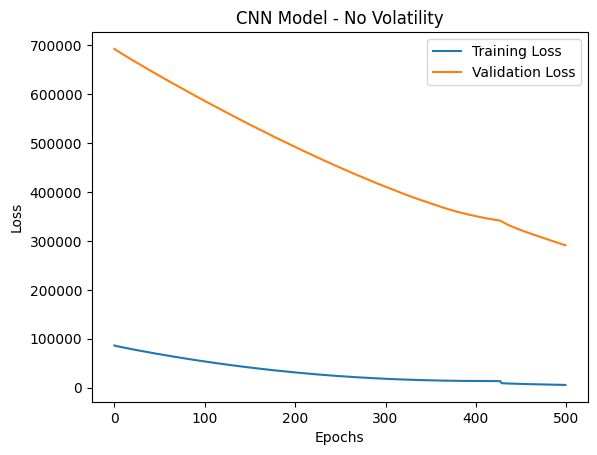

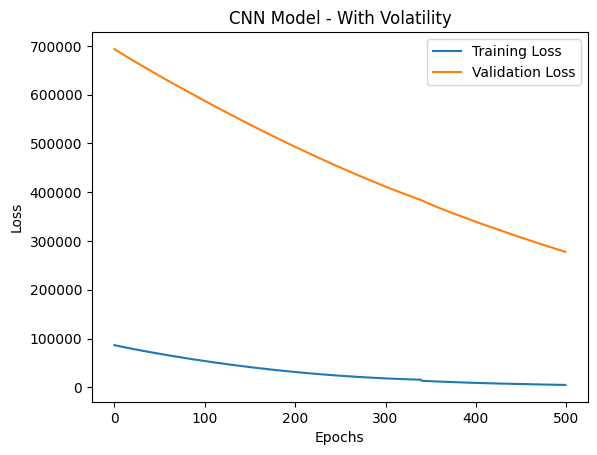

In [ ]:
# Plot the training and validation loss for both CNN models
def plot_loss(history, title):
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

# Plot loss for both CNN models
plot_loss(history_no_vol_cnn, "CNN Model - No Volatility")
plot_loss(history_with_vol_cnn, "CNN Model - With Volatility")

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Model Without Volatility (CNN) - RMSE: 539.5646, R²: -5.5403, MAPE: 58.5920%
Model With Volatility (CNN) - RMSE: 526.9060, R²: -5.2370, MAPE: 56.7688%
Lift Chart - No Volatility (CNN):


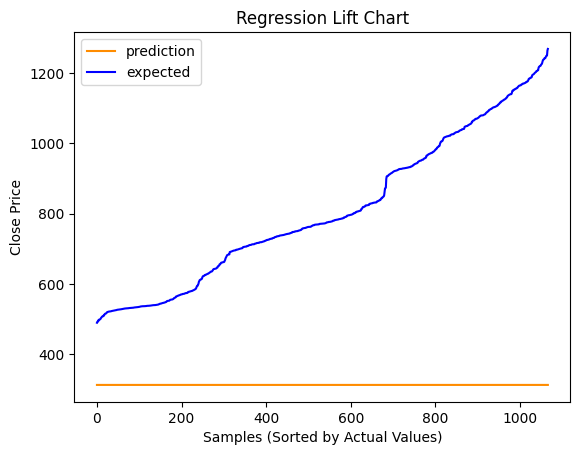

Lift Chart - With Volatility (CNN):


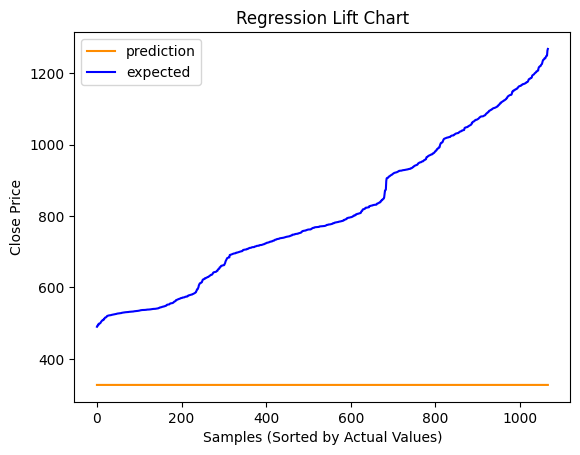

In [ ]:
# Evaluate your CNN models with RMSE, R², and MAPE
y_pred_no_vol_cnn, rmse_no_vol_cnn, r2_no_vol_cnn, mape_no_vol_cnn = evaluate_model(
    model_no_vol_cnn, X_test_no_vol, y_test_no_vol_seq
)

y_pred_with_vol_cnn, rmse_with_vol_cnn, r2_with_vol_cnn, mape_with_vol_cnn = evaluate_model(
    model_with_vol_cnn, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics for both CNN models
print(f"Model Without Volatility (CNN) - RMSE: {rmse_no_vol_cnn:.4f}, R²: {r2_no_vol_cnn:.4f}, MAPE: {mape_no_vol_cnn:.4%}")
print(f"Model With Volatility (CNN) - RMSE: {rmse_with_vol_cnn:.4f}, R²: {r2_with_vol_cnn:.4f}, MAPE: {mape_with_vol_cnn:.4%}")

# Plot lift charts for CNN models
print("Lift Chart - No Volatility (CNN):")
chart_regression(y_pred_no_vol_cnn, y_test_no_vol_seq)

print("Lift Chart - With Volatility (CNN):")
chart_regression(y_pred_with_vol_cnn, y_test_with_vol_seq)


#### Model 3: tanh Activation, 3 layers with 1 dropout layer, Optimizer  - learning rate 0.0001

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# Define a function to build the CNN model
def build_cnn_model(input_shape):
    model = Sequential()
    model.add(Conv1D(filters=64, kernel_size=2, activation='tanh', input_shape=input_shape))  # Convolutional layer
    model.add(MaxPooling1D(pool_size=2))  # Max pooling to reduce dimensionality
    model.add(Flatten())  # Flatten for dense layer compatibility
    model.add(Dense(100, activation='tanh'))  # Dense hidden layer 1
    model.add(Dense(90, activation='tanh'))  # Dense hidden layer 2
    model.add(Dense(80, activation='tanh'))  # Dense hidden layer 3
    model.add(Dense(70, activation='tanh'))  # Dense hidden layer 4
    model.add(Dense(60, activation='tanh'))  # Dense hidden layer 5
    model.add(Dropout(0.01))                 # Dropout layer
    model.add(Dense(50, activation='tanh'))  # Dense hidden layer 6
    model.add(Dense(40, activation='tanh'))  # Dense hidden layer 7
    model.add(Dense(30, activation='tanh'))  # Dense hidden layer 8
    model.add(Dense(20, activation='tanh'))  # Dense hidden layer 9
    model.add(Dense(10, activation='tanh'))  # Dense hidden layer 10
    model.add(Dense(1))  # Output layer (no activation for regression)
    model.compile(optimizer=Adam(learning_rate=0.0001), loss='mean_squared_error')
    return model

# Build CNN models for both datasets
model_no_vol_cnn = build_cnn_model((7, 5))  # No-volatility CNN input: (7 days, 5 features)
model_with_vol_cnn = build_cnn_model((7, 6))  # With-volatility CNN input: (7 days, 6 features)

# Early stopping for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Alan_cnn_model_3_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Alan_cnn_model_3_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the CNN model without volatility
history_no_vol_cnn = model_no_vol_cnn.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol],
    verbose=2
)

# Train the CNN model with volatility
history_with_vol_cnn = model_with_vol_cnn.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol],
    verbose=2
)

# Evaluate the CNN models
loss_no_vol_cnn = model_no_vol_cnn.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_cnn = model_with_vol_cnn.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (No Volatility - CNN): {loss_no_vol_cnn}")
print(f"Test Loss (With Volatility - CNN): {loss_with_vol_cnn}")

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/500
79/79 - 5s - 67ms/step - loss: 87827.3281 - val_loss: 697510.3125
Epoch 2/500
79/79 - 1s - 10ms/step - loss: 87401.8672 - val_loss: 696988.8125
Epoch 3/500
79/79 - 1s - 8ms/step - loss: 87264.0547 - val_loss: 696680.2500
Epoch 4/500
79/79 - 0s - 4ms/step - loss: 87167.2891 - val_loss: 696412.3750
Epoch 5/500
79/79 - 0s - 4ms/step - loss: 87078.3984 - val_loss: 696157.5625
Epoch 6/500
79/79 - 0s - 4ms/step - loss: 86995.4141 - val_loss: 695921.8750
Epoch 7/500
79/79 - 0s - 4ms/step - loss: 86918.6484 - val_loss: 695702.6250
Epoch 8/500
79/79 - 0s - 4ms/step - loss: 86847.6719 - val_loss: 695499.5625
Epoch 9/500
79/79 - 0s - 4ms/step - loss: 86781.4453 - val_loss: 695308.1875
Epoch 10/500
79/79 - 0s - 4ms/step - loss: 86718.6797 - val_loss: 695126.1875
Epoch 11/500
79/79 - 0s - 4ms/step - loss: 86659.0703 - val_loss: 694952.0625
Epoch 12/500
79/79 - 1s - 8ms/step - loss: 86600.8984 - val_loss: 694781.9375
Epoch 13/500
79/79 - 1s - 8ms/step - loss: 86544.9219 - val_loss: 69461

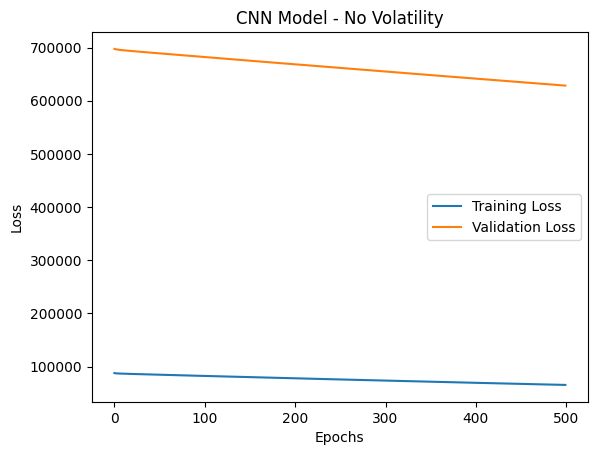

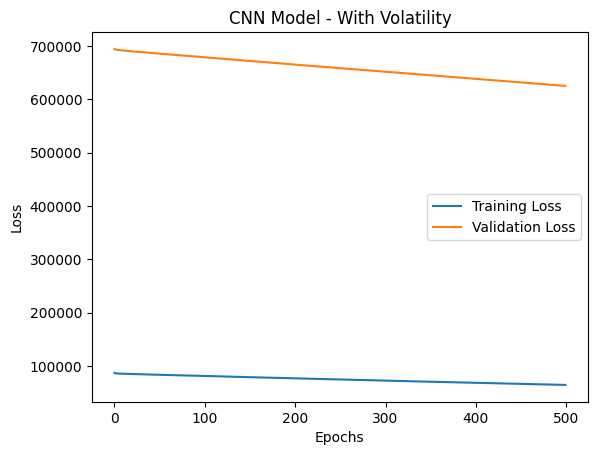

In [ ]:
# Plot the training and validation loss for both CNN models
def plot_loss(history, title):
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

# Plot loss for both CNN models
plot_loss(history_no_vol_cnn, "CNN Model - No Volatility")
plot_loss(history_with_vol_cnn, "CNN Model - With Volatility")

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Model Without Volatility (CNN) - RMSE: 792.7792, R²: -13.1194, MAPE: 93.9847%
Model With Volatility (CNN) - RMSE: 790.8361, R²: -13.0503, MAPE: 93.7180%
Lift Chart - No Volatility (CNN):


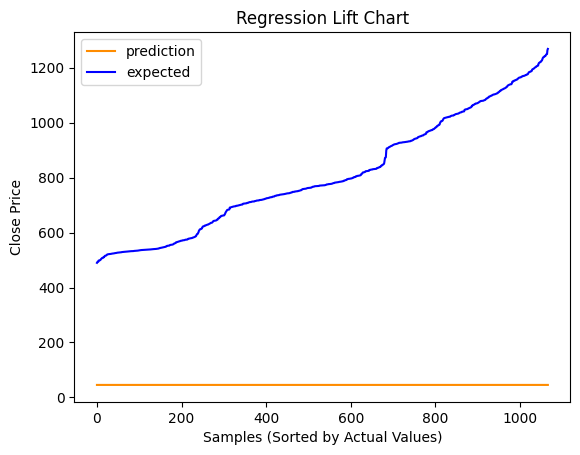

Lift Chart - With Volatility (CNN):


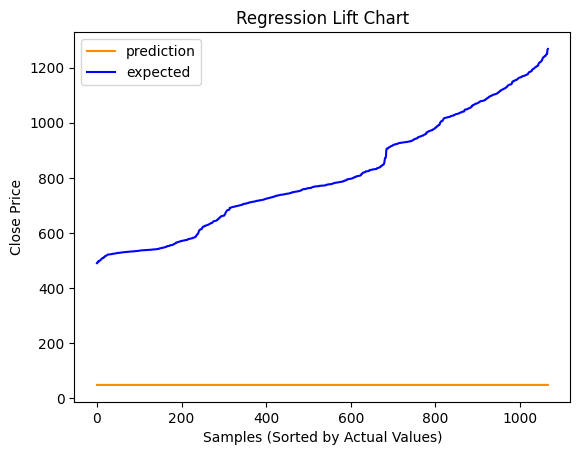

In [ ]:
# Evaluate your CNN models with RMSE, R², and MAPE
y_pred_no_vol_cnn, rmse_no_vol_cnn, r2_no_vol_cnn, mape_no_vol_cnn = evaluate_model(
    model_no_vol_cnn, X_test_no_vol, y_test_no_vol_seq
)

y_pred_with_vol_cnn, rmse_with_vol_cnn, r2_with_vol_cnn, mape_with_vol_cnn = evaluate_model(
    model_with_vol_cnn, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics for both CNN models
print(f"Model Without Volatility (CNN) - RMSE: {rmse_no_vol_cnn:.4f}, R²: {r2_no_vol_cnn:.4f}, MAPE: {mape_no_vol_cnn:.4%}")
print(f"Model With Volatility (CNN) - RMSE: {rmse_with_vol_cnn:.4f}, R²: {r2_with_vol_cnn:.4f}, MAPE: {mape_with_vol_cnn:.4%}")

# Plot lift charts for CNN models
print("Lift Chart - No Volatility (CNN):")
chart_regression(y_pred_no_vol_cnn, y_test_no_vol_seq)

print("Lift Chart - With Volatility (CNN):")
chart_regression(y_pred_with_vol_cnn, y_test_with_vol_seq)


#### Model 4: tanh Activation, 8 layers with dropout layers, Optimizer SGD - learning rate 0.0001

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import EarlyStopping

# Define a function to build the CNN model
def build_cnn_model(input_shape):
    model = Sequential()
    model.add(Conv1D(filters=64, kernel_size=2, activation='tanh', input_shape=input_shape))  # Convolutional layer
    model.add(MaxPooling1D(pool_size=2))  # Max pooling to reduce dimensionality
    model.add(Flatten())  # Flatten for dense layer compatibility
    model.add(Dense(512, activation='tanh'))  # Dense hidden layer 1
    model.add(Dense(256, activation='tanh'))  # Dense hidden layer 2
    model.add(Dropout(0.01))                 # Dropout layer
    model.add(Dense(128, activation='tanh'))  # Dense hidden layer 3
    model.add(Dense(64, activation='tanh'))  # Dense hidden layer 4
    model.add(Dropout(0.01))                 # Dropout layer
    model.add(Dense(32, activation='tanh'))  # Dense hidden layer 5
    model.add(Dense(16, activation='tanh'))  # Dense hidden layer 6
    model.add(Dropout(0.01))                 # Dropout layer
    model.add(Dense(8, activation='tanh'))  # Dense hidden layer 7
    model.add(Dense(4, activation='tanh'))  # Dense hidden layer 8
    model.add(Dropout(0.01))                 # Dropout layer
    model.add(Dense(1))  # Output layer (no activation for regression)
    model.compile(optimizer=SGD(learning_rate=0.0001), loss='mean_squared_error')
    return model

# Build CNN models for both datasets
model_no_vol_cnn = build_cnn_model((7, 5))  # No-volatility CNN input: (7 days, 5 features)
model_with_vol_cnn = build_cnn_model((7, 6))  # With-volatility CNN input: (7 days, 6 features)

# Early stopping for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Alan_cnn_model_4_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Alan_cnn_model_4_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the CNN model without volatility
history_no_vol_cnn = model_no_vol_cnn.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol],
    verbose=2
)

# Train the CNN model with volatility
history_with_vol_cnn = model_with_vol_cnn.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol],
    verbose=2
)

# Evaluate the CNN models
loss_no_vol_cnn = model_no_vol_cnn.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_cnn = model_with_vol_cnn.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (No Volatility - CNN): {loss_no_vol_cnn}")
print(f"Test Loss (With Volatility - CNN): {loss_with_vol_cnn}")

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/500
79/79 - 2s - 27ms/step - loss: 82207.2578 - val_loss: 665026.4375
Epoch 2/500
79/79 - 1s - 11ms/step - loss: 72163.9375 - val_loss: 635039.0000
Epoch 3/500
79/79 - 1s - 16ms/step - loss: 63557.5234 - val_loss: 607766.6875
Epoch 4/500
79/79 - 1s - 11ms/step - loss: 56075.1797 - val_loss: 583646.8750
Epoch 5/500
79/79 - 2s - 21ms/step - loss: 49940.6406 - val_loss: 561708.0625
Epoch 6/500
79/79 - 2s - 32ms/step - loss: 44552.3945 - val_loss: 542021.9375
Epoch 7/500
79/79 - 1s - 15ms/step - loss: 40072.0000 - val_loss: 524213.5625
Epoch 8/500
79/79 - 1s - 14ms/step - loss: 36174.6875 - val_loss: 508099.9688
Epoch 9/500
79/79 - 1s - 15ms/step - loss: 32857.7266 - val_loss: 493163.3750
Epoch 10/500
79/79 - 1s - 15ms/step - loss: 29982.4727 - val_loss: 479455.0000
Epoch 11/500
79/79 - 1s - 17ms/step - loss: 27668.8281 - val_loss: 467367.5938
Epoch 12/500
79/79 - 1s - 11ms/step - loss: 25507.7266 - val_loss: 456408.6562
Epoch 13/500
79/79 - 1s - 10ms/step - loss: 23756.0820 - val_

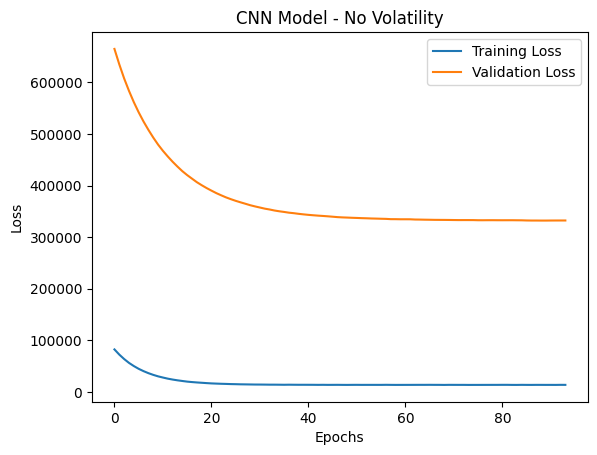

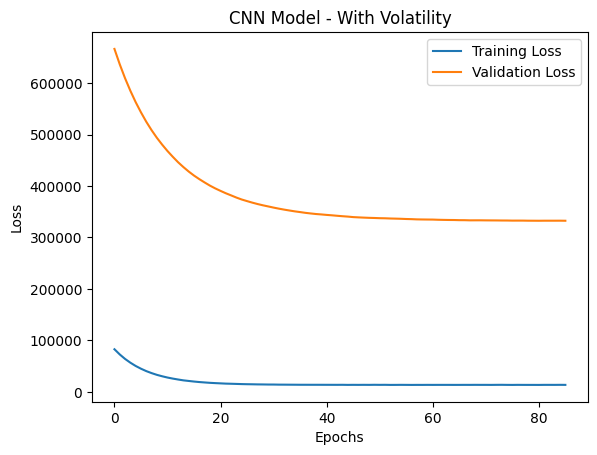

In [ ]:
# Plot the training and validation loss for both CNN models
def plot_loss(history, title):
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

# Plot loss for both CNN models
plot_loss(history_no_vol_cnn, "CNN Model - No Volatility")
plot_loss(history_with_vol_cnn, "CNN Model - With Volatility")

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Model Without Volatility (CNN) - RMSE: 576.2821, R²: -6.4608, MAPE: 63.8386%
Model With Volatility (CNN) - RMSE: 576.6171, R²: -6.4694, MAPE: 63.8862%
Lift Chart - No Volatility (CNN):


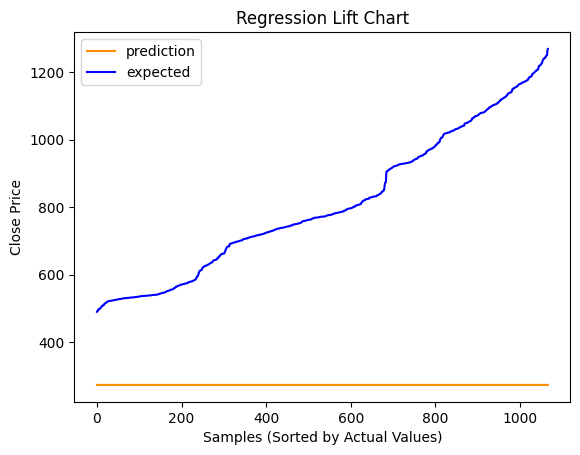

Lift Chart - With Volatility (CNN):


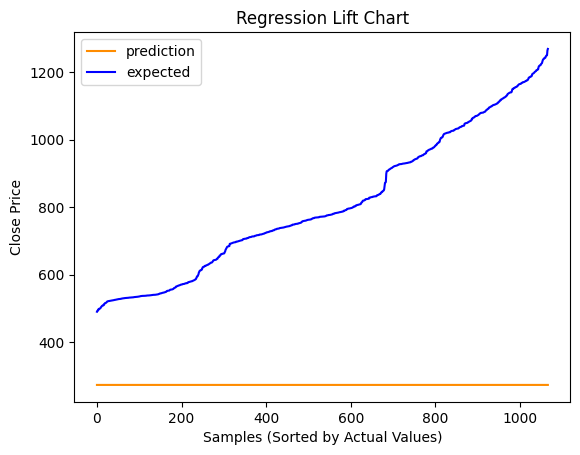

In [ ]:
# Evaluate your CNN models with RMSE, R², and MAPE
y_pred_no_vol_cnn, rmse_no_vol_cnn, r2_no_vol_cnn, mape_no_vol_cnn = evaluate_model(
    model_no_vol_cnn, X_test_no_vol, y_test_no_vol_seq
)

y_pred_with_vol_cnn, rmse_with_vol_cnn, r2_with_vol_cnn, mape_with_vol_cnn = evaluate_model(
    model_with_vol_cnn, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics for both CNN models
print(f"Model Without Volatility (CNN) - RMSE: {rmse_no_vol_cnn:.4f}, R²: {r2_no_vol_cnn:.4f}, MAPE: {mape_no_vol_cnn:.4%}")
print(f"Model With Volatility (CNN) - RMSE: {rmse_with_vol_cnn:.4f}, R²: {r2_with_vol_cnn:.4f}, MAPE: {mape_with_vol_cnn:.4%}")

# Plot lift charts for CNN models
print("Lift Chart - No Volatility (CNN):")
chart_regression(y_pred_no_vol_cnn, y_test_no_vol_seq)

print("Lift Chart - With Volatility (CNN):")
chart_regression(y_pred_with_vol_cnn, y_test_with_vol_seq)


#### Model 5: tanh Activation, 3 layers with 3 dropout layers, Optimizer SGD - default learning rate

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import EarlyStopping

# Define a function to build the CNN model
def build_cnn_model(input_shape):
    model = Sequential()
    model.add(Conv1D(filters=64, kernel_size=2, activation='tanh', input_shape=input_shape))  # Convolutional layer
    model.add(MaxPooling1D(pool_size=2))  # Max pooling to reduce dimensionality
    model.add(Flatten())  # Flatten for dense layer compatibility
    model.add(Dense(128, activation='tanh'))  # Dense hidden layer 1
    model.add(Dropout(0.01))                 # Dropout layer
    model.add(Dense(32, activation='tanh'))  # Dense hidden layer 2
    model.add(Dropout(0.01))                 # Dropout layer
    model.add(Dense(8, activation='tanh'))  # Dense hidden layer 3
    model.add(Dropout(0.01))                 # Dropout layer
    model.add(Dense(1))  # Output layer (no activation for regression)
    model.compile(optimizer=SGD(learning_rate=0.01), loss='mean_squared_error')
    return model

# Build CNN models for both datasets
model_no_vol_cnn = build_cnn_model((7, 5))  # No-volatility CNN input: (7 days, 5 features)
model_with_vol_cnn = build_cnn_model((7, 6))  # With-volatility CNN input: (7 days, 6 features)

# Early stopping for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Alan_cnn_model_5_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Alan_cnn_model_5_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the CNN model without volatility
history_no_vol_cnn = model_no_vol_cnn.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol],
    verbose=2
)

# Train the CNN model with volatility
history_with_vol_cnn = model_with_vol_cnn.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol],
    verbose=2
)

# Evaluate the CNN models
loss_no_vol_cnn = model_no_vol_cnn.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_cnn = model_with_vol_cnn.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (No Volatility - CNN): {loss_no_vol_cnn}")
print(f"Test Loss (With Volatility - CNN): {loss_with_vol_cnn}")

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/500
79/79 - 2s - 22ms/step - loss: 17863.5059 - val_loss: 347790.0312
Epoch 2/500
79/79 - 1s - 12ms/step - loss: 13427.0312 - val_loss: 337176.7500
Epoch 3/500
79/79 - 1s - 18ms/step - loss: 13525.6035 - val_loss: 285406.5938
Epoch 4/500
79/79 - 1s - 12ms/step - loss: 13521.9717 - val_loss: 321932.7188
Epoch 5/500
79/79 - 1s - 16ms/step - loss: 13474.6670 - val_loss: 372319.1875
Epoch 6/500
79/79 - 1s - 7ms/step - loss: 13568.6250 - val_loss: 339263.7812
Epoch 7/500
79/79 - 1s - 7ms/step - loss: 13497.9668 - val_loss: 334757.0625
Epoch 8/500
79/79 - 1s - 8ms/step - loss: 13413.6250 - val_loss: 328954.5000
Epoch 8: early stopping
Restoring model weights from the end of the best epoch: 3.
Epoch 1/500
79/79 - 1s - 18ms/step - loss: 17519.8359 - val_loss: 331072.7500
Epoch 2/500
79/79 - 1s - 12ms/step - loss: 13626.5938 - val_loss: 302471.3125
Epoch 3/500
79/79 - 1s - 8ms/step - loss: 13433.4209 - val_loss: 287675.7812
Epoch 4/500
79/79 - 1s - 7ms/step - loss: 13533.1758 - val_loss

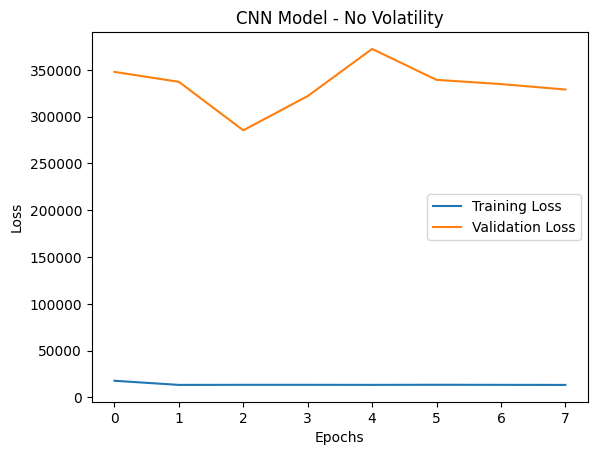

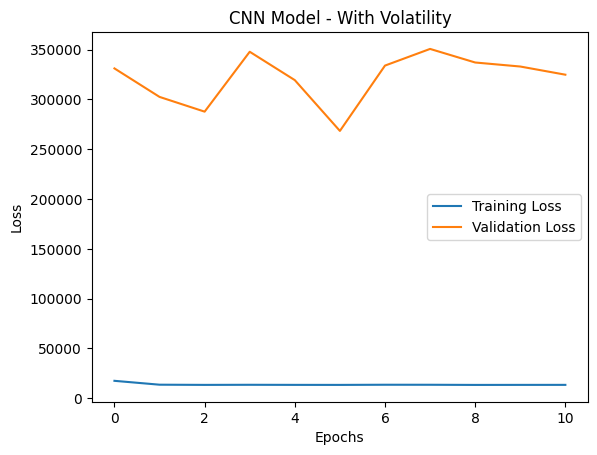

In [ ]:
# Plot the training and validation loss for both CNN models
def plot_loss(history, title):
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

# Plot loss for both CNN models
plot_loss(history_no_vol_cnn, "CNN Model - No Volatility")
plot_loss(history_with_vol_cnn, "CNN Model - With Volatility")

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step
Model Without Volatility (CNN) - RMSE: 534.2346, R²: -5.4117, MAPE: 57.8253%
Model With Volatility (CNN) - RMSE: 518.0078, R²: -5.0282, MAPE: 55.4823%
Lift Chart - No Volatility (CNN):


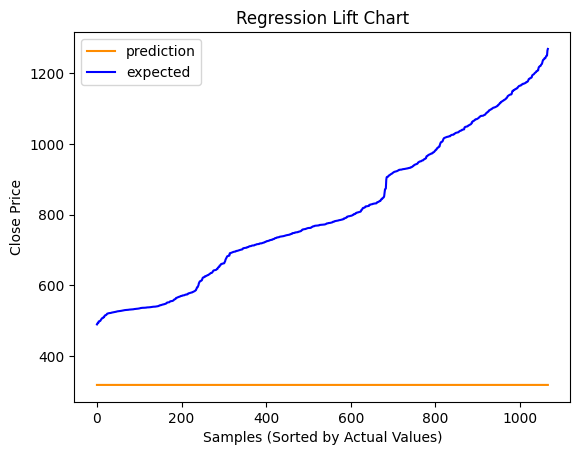

Lift Chart - With Volatility (CNN):


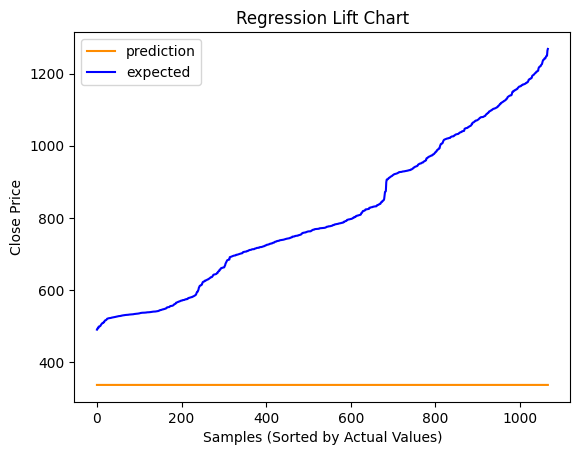

In [ ]:
# Evaluate your CNN models with RMSE, R², and MAPE
y_pred_no_vol_cnn, rmse_no_vol_cnn, r2_no_vol_cnn, mape_no_vol_cnn = evaluate_model(
    model_no_vol_cnn, X_test_no_vol, y_test_no_vol_seq
)

y_pred_with_vol_cnn, rmse_with_vol_cnn, r2_with_vol_cnn, mape_with_vol_cnn = evaluate_model(
    model_with_vol_cnn, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics for both CNN models
print(f"Model Without Volatility (CNN) - RMSE: {rmse_no_vol_cnn:.4f}, R²: {r2_no_vol_cnn:.4f}, MAPE: {mape_no_vol_cnn:.4%}")
print(f"Model With Volatility (CNN) - RMSE: {rmse_with_vol_cnn:.4f}, R²: {r2_with_vol_cnn:.4f}, MAPE: {mape_with_vol_cnn:.4%}")

# Plot lift charts for CNN models
print("Lift Chart - No Volatility (CNN):")
chart_regression(y_pred_no_vol_cnn, y_test_no_vol_seq)

print("Lift Chart - With Volatility (CNN):")
chart_regression(y_pred_with_vol_cnn, y_test_with_vol_seq)


### CNN Model Design and Testing (Nishan Majarjan)

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt

# Define a function to build an optimized CNN model
def build_optimized_cnn_model(input_shape):
    model = Sequential()
    model.add(Input(shape=input_shape))  # Explicit input layer
    model.add(Conv1D(filters=128, kernel_size=3, activation='relu'))  # 1st Conv layer
    model.add(MaxPooling1D(pool_size=2))  # Max pooling
    model.add(Dropout(0.3))  # Dropout for regularization

    model.add(Conv1D(filters=64, kernel_size=2, activation='relu'))  # 2nd Conv layer
    model.add(Dropout(0.3))

    model.add(Flatten())  # Flatten for dense layer compatibility
    model.add(Dense(64, activation='relu'))  # Dense hidden layer
    model.add(Dropout(0.4))  # Dropout for regularization
    model.add(Dense(1))  # Output layer (no activation for regression)

    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
    return model

# Build optimized CNN models for both datasets
model_no_vol_cnn_opt = build_optimized_cnn_model((7, 5))  # No-volatility CNN input: (7 days, 5 features)
model_with_vol_cnn_opt = build_optimized_cnn_model((7, 6))  # With-volatility CNN input: (7 days, 6 features)

# Early stopping callbacks for each model
early_stopping_no_vol_opt = EarlyStopping(monitor='val_loss', patience=10, mode='min', restore_best_weights=True, verbose=2)
early_stopping_with_vol_opt = EarlyStopping(monitor='val_loss', patience=10, mode='min', restore_best_weights=True, verbose=2)

# Train the optimized CNN model without volatility
history_no_vol_cnn_opt = model_no_vol_cnn_opt.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol_opt],
    verbose=2
)

# Train the optimized CNN model with volatility
history_with_vol_cnn_opt = model_with_vol_cnn_opt.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol_opt],
    verbose=2
)

# Evaluate the optimized CNN models
loss_no_vol_cnn_opt = model_no_vol_cnn_opt.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_cnn_opt = model_with_vol_cnn_opt.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (No Volatility - Optimized CNN): {loss_no_vol_cnn_opt}")
print(f"Test Loss (With Volatility - Optimized CNN): {loss_with_vol_cnn_opt}")
#Nishan Maharjan 11/04/2024

Epoch 1/500
79/79 - 3s - 32ms/step - loss: 72114.9062 - val_loss: 162553.1406
Epoch 2/500
79/79 - 0s - 4ms/step - loss: 6120.7920 - val_loss: 17882.6523
Epoch 3/500
79/79 - 0s - 4ms/step - loss: 3838.6047 - val_loss: 5289.1323
Epoch 4/500
79/79 - 0s - 4ms/step - loss: 3433.5210 - val_loss: 3008.9858
Epoch 5/500
79/79 - 0s - 4ms/step - loss: 3392.5342 - val_loss: 2356.5588
Epoch 6/500
79/79 - 0s - 4ms/step - loss: 3218.7070 - val_loss: 1486.4496
Epoch 7/500
79/79 - 0s - 4ms/step - loss: 3079.1445 - val_loss: 1030.8997
Epoch 8/500
79/79 - 1s - 7ms/step - loss: 3012.3235 - val_loss: 1530.0405
Epoch 9/500
79/79 - 0s - 4ms/step - loss: 2978.7588 - val_loss: 1500.5913
Epoch 10/500
79/79 - 0s - 4ms/step - loss: 2659.3677 - val_loss: 737.7975
Epoch 11/500
79/79 - 0s - 4ms/step - loss: 2957.1909 - val_loss: 3832.6274
Epoch 12/500
79/79 - 0s - 5ms/step - loss: 2944.8108 - val_loss: 2709.0396
Epoch 13/500
79/79 - 0s - 5ms/step - loss: 2669.4568 - val_loss: 1342.0591
Epoch 14/500
79/79 - 1s - 8ms/

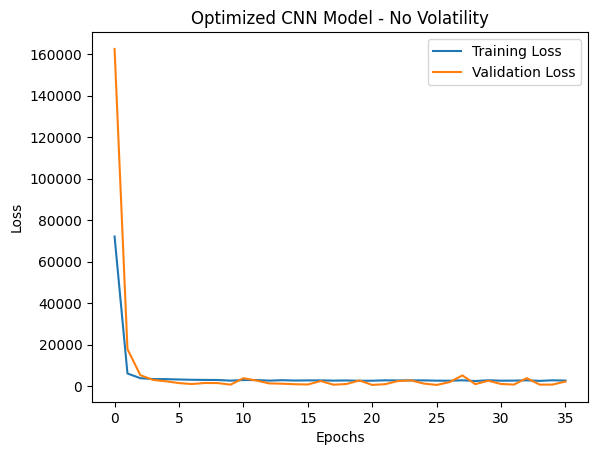

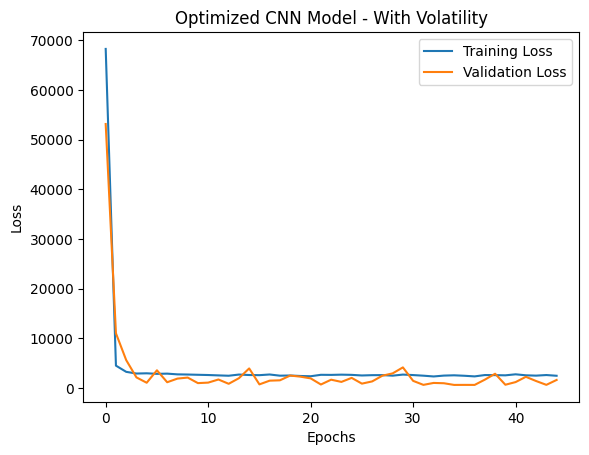

In [ ]:

# Plot the training and validation loss for both optimized CNN models
def plot_loss(history, title):
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

# Plot loss for both optimized CNN models
plot_loss(history_no_vol_cnn_opt, "Optimized CNN Model - No Volatility")
plot_loss(history_with_vol_cnn_opt, "Optimized CNN Model - With Volatility")
#Nishan Maharjan 11/04/2024

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# Function to calculate RMSE, R², and MAPE
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)

    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))

    # Calculate R² score
    r2 = r2_score(y_test, y_pred)

    # Calculate MAPE
    mape = mean_absolute_percentage_error(y_test, y_pred)

    return y_pred, rmse, r2, mape

# Function to plot the regression chart (lift chart)
def chart_regression(pred, y, sort=True):
    t = pd.DataFrame({'Predicted': pred.flatten(), 'Actual': y.flatten()})
    if sort:
        t.sort_values(by=['Actual'], inplace=True)
    plt.plot(t['Predicted'], label='Prediction', color='darkorange')
    plt.plot(t['Actual'], label='Actual', color='blue')
    plt.ylabel('Target Variable')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Chart')
    plt.legend()
    plt.show()


34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

Optimized CNN Model - No Volatility:
RMSE: 24.5375, R²: 0.9865, MAPE: 2.1466%
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

Optimized CNN Model - With Volatility:
RMSE: 24.4157, R²: 0.9866, MAPE: 2.1227%
Regression Chart - Optimized CNN Model (No Volatility):


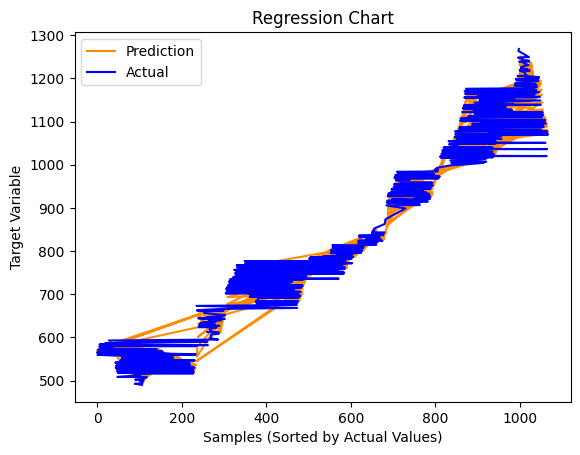

Regression Chart - Optimized CNN Model (With Volatility):


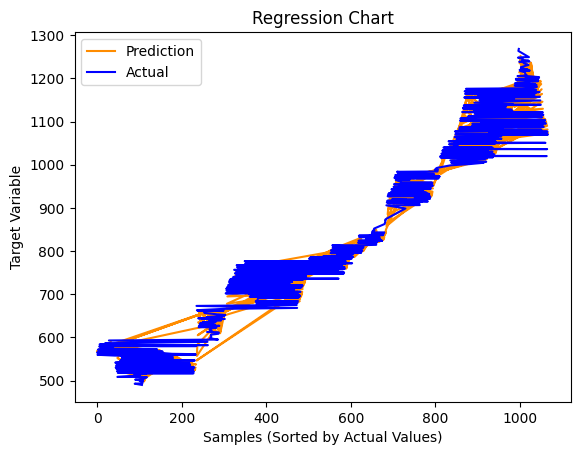

In [ ]:
# Evaluate the optimized CNN model without volatility
y_pred_no_vol_cnn_opt, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol_cnn_opt, X_test_no_vol, y_test_no_vol_seq)
print(f"\nOptimized CNN Model - No Volatility:")
print(f"RMSE: {rmse_no_vol:.4f}, R²: {r2_no_vol:.4f}, MAPE: {mape_no_vol:.4%}")

# Evaluate the optimized CNN model with volatility
y_pred_with_vol_cnn_opt, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol_cnn_opt, X_test_with_vol, y_test_with_vol_seq)
print(f"\nOptimized CNN Model - With Volatility:")
print(f"RMSE: {rmse_with_vol:.4f}, R²: {r2_with_vol:.4f}, MAPE: {mape_with_vol:.4%}")

# Plot regression charts for both models
print("Regression Chart - Optimized CNN Model (No Volatility):")
chart_regression(y_pred_no_vol_cnn_opt, y_test_no_vol_seq)

print("Regression Chart - Optimized CNN Model (With Volatility):")
chart_regression(y_pred_with_vol_cnn_opt, y_test_with_vol_seq)


## Building and Training the LSTM Models

Here's an outline of our general approach to building Long Short-Term Memory (LSTM) models for time-series prediction. We created two variations: one without volatility as a feature and one with it, using similar structures but adjusted input sizes.

### **Model Structure**
- **Input Layer**:
  - **Without Volatility**: Shape `(7 days, 4 features)`
  - **With Volatility**: Shape `(7 days, 5 features)`
  - Example: `Input(shape=(7, 5))` for the with-volatility version.

- **LSTM Layers**:
  - Any number of LSTM layers can be stacked, with the first layer configured to return sequences if followed by another LSTM layer.
  - Example:
    - **Layer 1**: `LSTM(128, activation='relu', return_sequences=True)`
    - **Layer 2**: `LSTM(64, activation='relu', return_sequences=True)`
    - **Layer 3**: `LSTM(32, activation='relu', return_sequences=False)`

- **Dense Layers**:
  - Include dense layers for additional learning after the LSTM layers.
  - Example:
    - **Dense Layer**: `Dense(32, activation='relu')`

- **Output Layer**:
  - For regression, the final layer has one neuron without an activation function.
  - Example: `Dense(1)`.

- **Optimizer**: Either Adam or SGD, with learning rate adjustments based on model tuning.
  - Example: `Adam(learning_rate=0.001)`

- **Loss Function**: Mean Squared Error (MSE), suited for regression tasks to capture the difference between predictions and actual values.

### Using Early Stopping and Model Checkpointing
We employ **early stopping** and **model checkpointing** for robust training:
- **Early Stopping**: Stops training if the validation loss doesn’t improve for a specified number of epochs, reverting to the best weights to prevent overfitting.
- **Model Checkpointing**: Saves the model whenever the validation loss reaches a new minimum, ensuring we keep the best version of our model.

### Training the Models
We train the models separately:
- **Model without Volatility**: Input shape is `(7, 4)`.
- **Model with Volatility**: Input shape is `(7, 5)`.

Both models are trained with:
- **Batch Size**: 32
- **Epochs**: 500 or more (subject to early stopping).
- **Validation Data**: Used for monitoring model progress and avoiding overfitting.


### LSTM Model Design and Testing (Tyler Burguillos)



#### Model 1: 3 Layers, ReLU Activation, Adam optimizer (1 Dense Layer)

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the LSTM model
def build_lstm_model(input_shape):
  model = Sequential()

  # LSTM Layers
  model.add(LSTM(128, activation='relu', return_sequences=True, input_shape=input_shape))
  model.add(LSTM(64, activation='relu', return_sequences=True))
  model.add(LSTM(32, activation='relu', return_sequences=False))

  # Dense Layers
  model.add(Dense(32))
  model.add(Dense(1))  # Output layer (no activation for regression)

  # Compile the model
  model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
  return model

# Build LSTM models for both datasets
model_no_vol_lstm = build_lstm_model((7, 5))  # No-volatility input: (7 days, 5 features)
model_with_vol_lstm = build_lstm_model((7, 6))  # With-volatility input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("tyler_lstm_model_1_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("tyler_lstm_model_1_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the LSTM model without volatility
history_no_vol_lstm = model_no_vol_lstm.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the LSTM model with volatility
history_with_vol_lstm = model_with_vol_lstm.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol_lstm = model_no_vol_lstm.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_lstm = model_with_vol_lstm.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

# Print the results
print(f"\nTest Loss (No Volatility - LSTM): {loss_no_vol_lstm}")
print(f"Test Loss (With Volatility - LSTM): {loss_with_vol_lstm}")

# Tyler Burguillos 10/30/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/1000

Epoch 1: val_loss improved from inf to 184627.28125, saving model to tyler_lstm_model_1_no_vol.keras
79/79 - 24s - 310ms/step - loss: 40264.9062 - val_loss: 184627.2812
Epoch 2/1000

Epoch 2: val_loss improved from 184627.28125 to 146198.34375, saving model to tyler_lstm_model_1_no_vol.keras
79/79 - 1s - 8ms/step - loss: 1435.6143 - val_loss: 146198.3438
Epoch 3/1000

Epoch 3: val_loss improved from 146198.34375 to 82805.39062, saving model to tyler_lstm_model_1_no_vol.keras
79/79 - 1s - 16ms/step - loss: 451.1920 - val_loss: 82805.3906
Epoch 4/1000

Epoch 4: val_loss improved from 82805.39062 to 47117.51953, saving model to tyler_lstm_model_1_no_vol.keras
79/79 - 1s - 17ms/step - loss: 208.2965 - val_loss: 47117.5195
Epoch 5/1000

Epoch 5: val_loss improved from 47117.51953 to 29169.81250, saving model to tyler_lstm_model_1_no_vol.keras
79/79 - 1s - 15ms/step - loss: 176.1676 - val_loss: 29169.8125
Epoch 6/1000

Epoch 6: val_loss improved from 29169.81250 to 13746.40430,

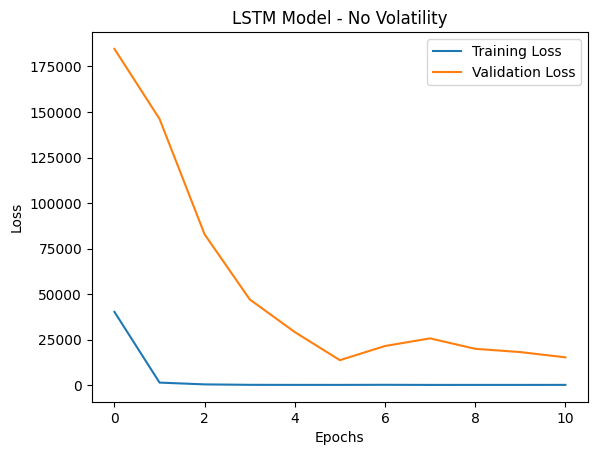

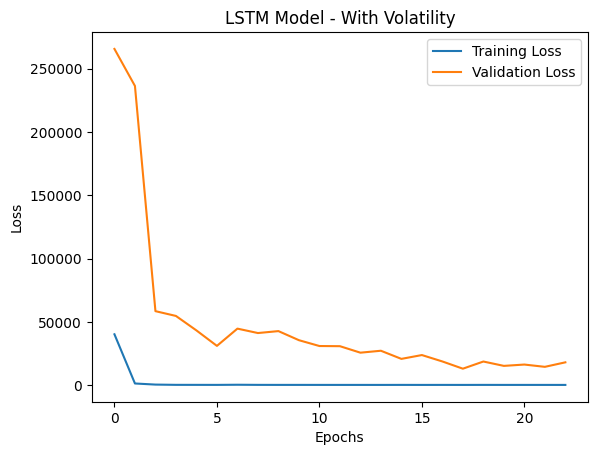

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# Plot training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both LSTM models
plot_loss(history_no_vol_lstm, "LSTM Model - No Volatility")
plot_loss(history_with_vol_lstm, "LSTM Model - With Volatility")

# Tyler Burguillos 10/30/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

LSTM Model Without Volatility - RMSE: 117.2451, R²: 0.6912, MAPE: 8.1941%
LSTM Model With Volatility - RMSE: 113.8892, R²: 0.7086, MAPE: 7.6617%

Lift Chart - LSTM Model No Volatility:


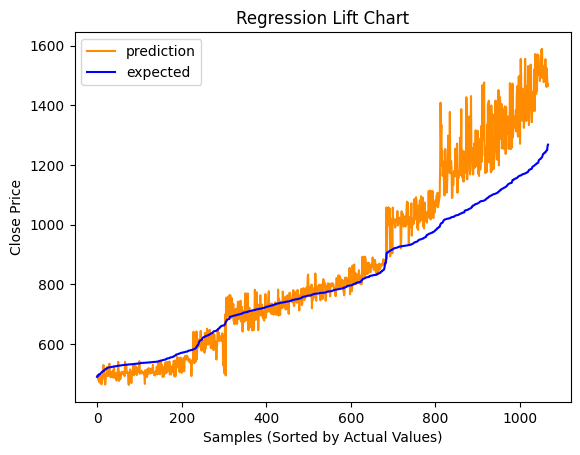

Lift Chart - LSTM Model With Volatility:


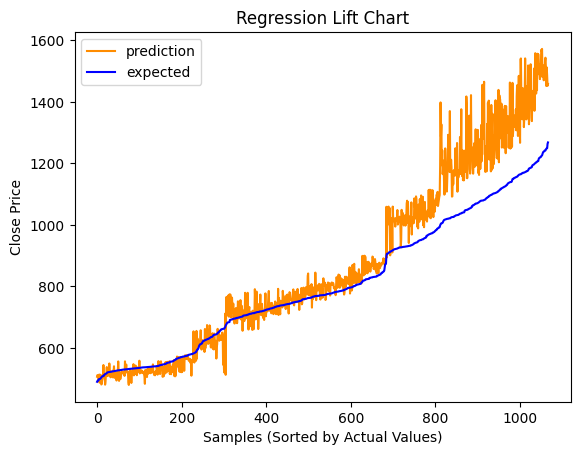

In [ ]:
# Function to calculate RMSE, R², and MAPE
def evaluate_model(model, X_test, y_test):
  y_pred = model.predict(X_test)

  rmse = np.sqrt(mean_squared_error(y_test, y_pred))
  r2 = r2_score(y_test, y_pred)
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Function to plot the regression lift chart
def chart_regression(pred, y, sort=True):
  t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
  if sort:
    t.sort_values(by=['y'], inplace=True)
  plt.plot(t['pred'].tolist(), label='prediction', color='darkorange')
  plt.plot(t['y'].tolist(), label='expected', color='blue')
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the LSTM models
y_pred_no_vol_lstm, rmse_no_vol_lstm, r2_no_vol_lstm, mape_no_vol_lstm = evaluate_model(
    model_no_vol_lstm, X_test_no_vol, y_test_no_vol_seq
)
y_pred_with_vol_lstm, rmse_with_vol_lstm, r2_with_vol_lstm, mape_with_vol_lstm = evaluate_model(
    model_with_vol_lstm, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics
print(f"\nLSTM Model Without Volatility - RMSE: {rmse_no_vol_lstm:.4f}, R²: {r2_no_vol_lstm:.4f}, MAPE: {mape_no_vol_lstm:.4%}")
print(f"LSTM Model With Volatility - RMSE: {rmse_with_vol_lstm:.4f}, R²: {r2_with_vol_lstm:.4f}, MAPE: {mape_with_vol_lstm:.4%}")

# Plot lift charts for both LSTM models
print("\nLift Chart - LSTM Model No Volatility:")
chart_regression(y_pred_no_vol_lstm, y_test_no_vol_seq)

print("Lift Chart - LSTM Model With Volatility:")
chart_regression(y_pred_with_vol_lstm, y_test_with_vol_seq)

# Tyler Burguillos 10/30/24

#### Model 2: 3 Layers, ReLU Activation, Adam optimizer (2 Dense Layers)

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the LSTM model
def build_lstm_model(input_shape):
  model = Sequential()

  # LSTM Layers
  model.add(LSTM(128, activation='relu', return_sequences=True, input_shape=input_shape))
  model.add(LSTM(64, activation='relu', return_sequences=True))
  model.add(LSTM(32, activation='relu', return_sequences=False))

  # Dense Layers
  model.add(Dense(64))
  model.add(Dense(32))
  model.add(Dense(1))  # Output layer (no activation for regression)

  # Compile the model
  model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
  return model

# Build LSTM models for both datasets
model_no_vol_lstm = build_lstm_model((7, 5))  # No-volatility input: (7 days, 5 features)
model_with_vol_lstm = build_lstm_model((7, 6))  # With-volatility input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("tyler_lstm_model_2_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("tyler_lstm_model_2_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the LSTM model without volatility
history_no_vol_lstm = model_no_vol_lstm.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the LSTM model with volatility
history_with_vol_lstm = model_with_vol_lstm.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol_lstm = model_no_vol_lstm.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_lstm = model_with_vol_lstm.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

# Print the results
print(f"\nTest Loss (No Volatility - LSTM): {loss_no_vol_lstm}")
print(f"Test Loss (With Volatility - LSTM): {loss_with_vol_lstm}")

# Tyler Burguillos 10/30/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/1000

Epoch 1: val_loss improved from inf to 269868.25000, saving model to tyler_lstm_model_2_no_vol.keras
79/79 - 14s - 177ms/step - loss: 36531.4844 - val_loss: 269868.2500
Epoch 2/1000

Epoch 2: val_loss improved from 269868.25000 to 109129.83594, saving model to tyler_lstm_model_2_no_vol.keras
79/79 - 11s - 134ms/step - loss: 906.2734 - val_loss: 109129.8359
Epoch 3/1000

Epoch 3: val_loss improved from 109129.83594 to 58408.10547, saving model to tyler_lstm_model_2_no_vol.keras
79/79 - 1s - 8ms/step - loss: 250.4754 - val_loss: 58408.1055
Epoch 4/1000

Epoch 4: val_loss improved from 58408.10547 to 53936.03516, saving model to tyler_lstm_model_2_no_vol.keras
79/79 - 1s - 7ms/step - loss: 174.6765 - val_loss: 53936.0352
Epoch 5/1000

Epoch 5: val_loss improved from 53936.03516 to 40371.44922, saving model to tyler_lstm_model_2_no_vol.keras
79/79 - 1s - 7ms/step - loss: 158.4230 - val_loss: 40371.4492
Epoch 6/1000

Epoch 6: val_loss did not improve from 40371.44922
79/79 - 1

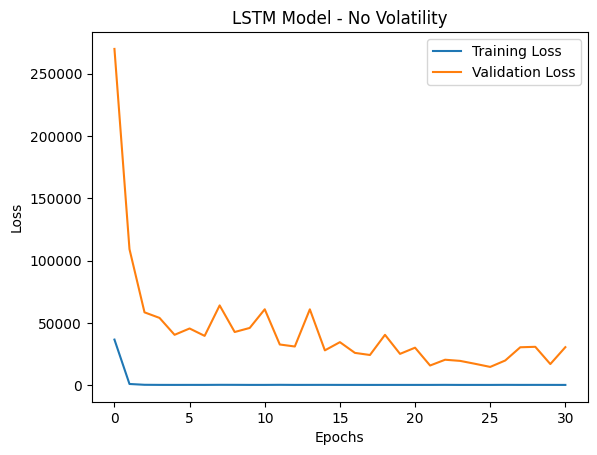

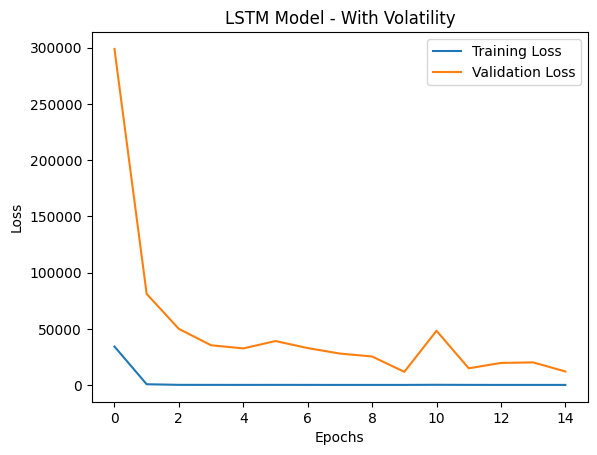

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# Plot training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both LSTM models
plot_loss(history_no_vol_lstm, "LSTM Model - No Volatility")
plot_loss(history_with_vol_lstm, "LSTM Model - With Volatility")

# Tyler Burguillos 10/30/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step

LSTM Model Without Volatility - RMSE: 120.8331, R²: 0.6720, MAPE: 7.9505%
LSTM Model With Volatility - RMSE: 108.4527, R²: 0.7358, MAPE: 8.1779%

Lift Chart - LSTM Model No Volatility:


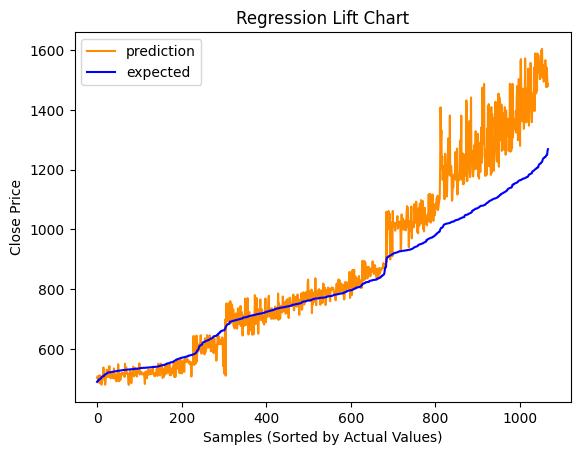

Lift Chart - LSTM Model With Volatility:


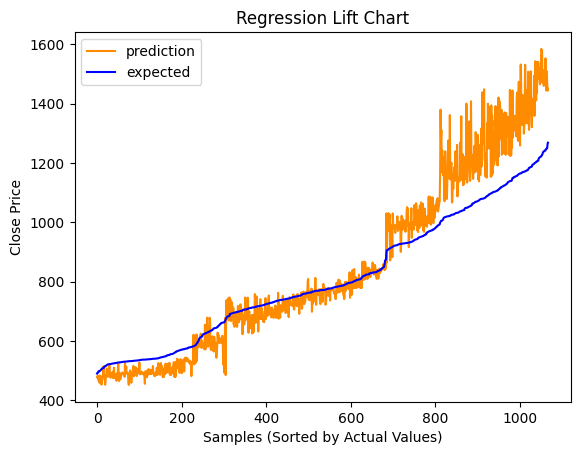

In [ ]:
# Function to calculate RMSE, R², and MAPE
def evaluate_model(model, X_test, y_test):
  y_pred = model.predict(X_test)

  rmse = np.sqrt(mean_squared_error(y_test, y_pred))
  r2 = r2_score(y_test, y_pred)
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Function to plot the regression lift chart
def chart_regression(pred, y, sort=True):
  t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
  if sort:
    t.sort_values(by=['y'], inplace=True)
  plt.plot(t['pred'].tolist(), label='prediction', color='darkorange')
  plt.plot(t['y'].tolist(), label='expected', color='blue')
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the LSTM models
y_pred_no_vol_lstm, rmse_no_vol_lstm, r2_no_vol_lstm, mape_no_vol_lstm = evaluate_model(
    model_no_vol_lstm, X_test_no_vol, y_test_no_vol_seq
)
y_pred_with_vol_lstm, rmse_with_vol_lstm, r2_with_vol_lstm, mape_with_vol_lstm = evaluate_model(
    model_with_vol_lstm, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics
print(f"\nLSTM Model Without Volatility - RMSE: {rmse_no_vol_lstm:.4f}, R²: {r2_no_vol_lstm:.4f}, MAPE: {mape_no_vol_lstm:.4%}")
print(f"LSTM Model With Volatility - RMSE: {rmse_with_vol_lstm:.4f}, R²: {r2_with_vol_lstm:.4f}, MAPE: {mape_with_vol_lstm:.4%}")

# Plot lift charts for both LSTM models
print("\nLift Chart - LSTM Model No Volatility:")
chart_regression(y_pred_no_vol_lstm, y_test_no_vol_seq)

print("Lift Chart - LSTM Model With Volatility:")
chart_regression(y_pred_with_vol_lstm, y_test_with_vol_seq)

# Tyler Burguillos 10/30/24

#### Model 3: 4 Layers, ReLU Activation, Adam optimizer (1 Dense Layer)

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the LSTM model
def build_lstm_model(input_shape):
  model = Sequential()

  # LSTM Layers
  model.add(LSTM(256, activation='relu', return_sequences=True, input_shape=input_shape))
  model.add(LSTM(128, activation='relu', return_sequences=True))
  model.add(LSTM(64, activation='relu', return_sequences=True))
  model.add(LSTM(32, activation='relu', return_sequences=False))

  # Dense Layers
  model.add(Dense(32))
  model.add(Dense(1))  # Output layer (no activation for regression)

  # Compile the model
  model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
  return model

# Build LSTM models for both datasets
model_no_vol_lstm = build_lstm_model((7, 5))  # No-volatility input: (7 days, 5 features)
model_with_vol_lstm = build_lstm_model((7, 6))  # With-volatility input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("tyler_lstm_model_3_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("tyler_lstm_model_3_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the LSTM model without volatility
history_no_vol_lstm = model_no_vol_lstm.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the LSTM model with volatility
history_with_vol_lstm = model_with_vol_lstm.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol_lstm = model_no_vol_lstm.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_lstm = model_with_vol_lstm.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

# Print the results
print(f"\nTest Loss (No Volatility - LSTM): {loss_no_vol_lstm}")
print(f"Test Loss (With Volatility - LSTM): {loss_with_vol_lstm}")

# Tyler Burguillos 10/30/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/1000

Epoch 1: val_loss improved from inf to 191806.75000, saving model to tyler_lstm_model_3_no_vol.keras
79/79 - 18s - 225ms/step - loss: 33116.7891 - val_loss: 191806.7500
Epoch 2/1000

Epoch 2: val_loss improved from 191806.75000 to 112647.76562, saving model to tyler_lstm_model_3_no_vol.keras
79/79 - 1s - 8ms/step - loss: 1105.2734 - val_loss: 112647.7656
Epoch 3/1000

Epoch 3: val_loss improved from 112647.76562 to 49012.61719, saving model to tyler_lstm_model_3_no_vol.keras
79/79 - 1s - 8ms/step - loss: 245.1826 - val_loss: 49012.6172
Epoch 4/1000

Epoch 4: val_loss improved from 49012.61719 to 28804.58984, saving model to tyler_lstm_model_3_no_vol.keras
79/79 - 1s - 7ms/step - loss: 195.0714 - val_loss: 28804.5898
Epoch 5/1000

Epoch 5: val_loss improved from 28804.58984 to 26265.54297, saving model to tyler_lstm_model_3_no_vol.keras
79/79 - 1s - 8ms/step - loss: 184.2173 - val_loss: 26265.5430
Epoch 6/1000

Epoch 6: val_loss improved from 26265.54297 to 17251.22461, sa

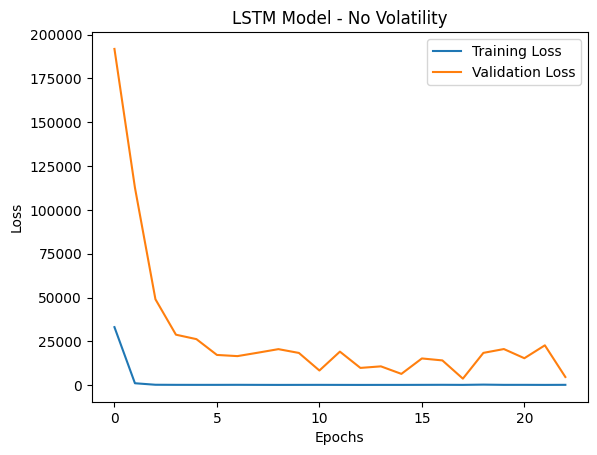

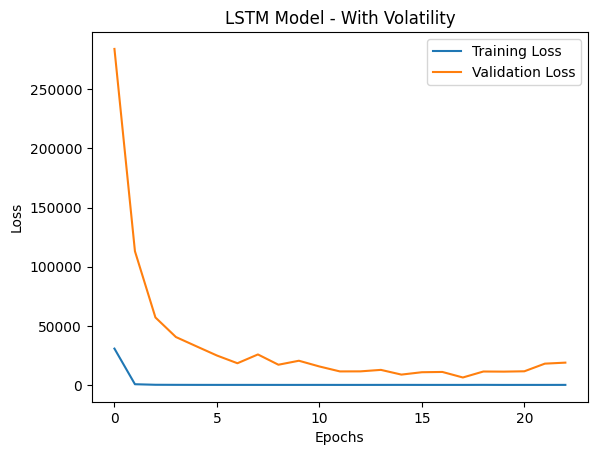

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# Plot training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both LSTM models
plot_loss(history_no_vol_lstm, "LSTM Model - No Volatility")
plot_loss(history_with_vol_lstm, "LSTM Model - With Volatility")

# Tyler Burguillos 10/30/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step

LSTM Model Without Volatility - RMSE: 61.0912, R²: 0.9162, MAPE: 6.2700%
LSTM Model With Volatility - RMSE: 80.1764, R²: 0.8556, MAPE: 5.8308%

Lift Chart - LSTM Model No Volatility:


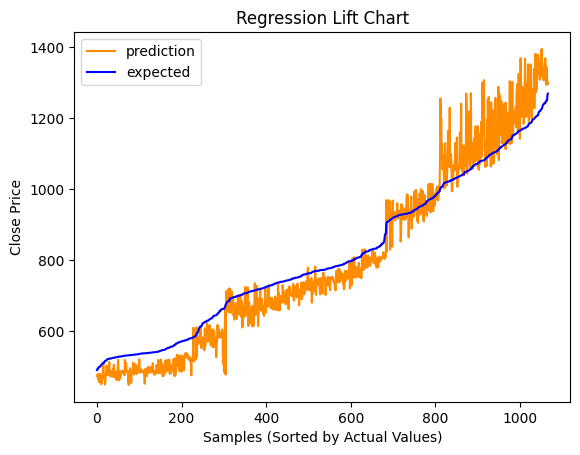

Lift Chart - LSTM Model With Volatility:


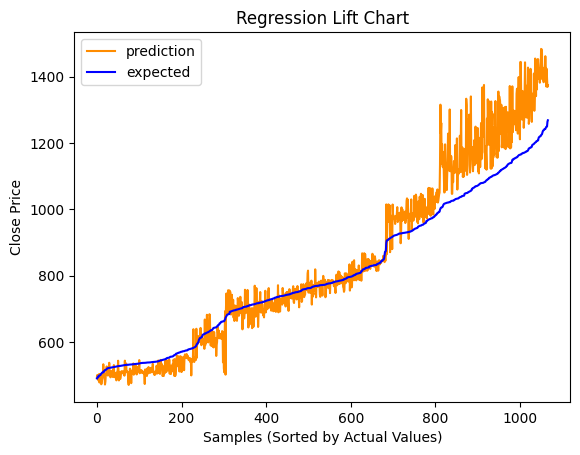

In [ ]:
# Function to calculate RMSE, R², and MAPE
def evaluate_model(model, X_test, y_test):
  y_pred = model.predict(X_test)

  rmse = np.sqrt(mean_squared_error(y_test, y_pred))
  r2 = r2_score(y_test, y_pred)
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Function to plot the regression lift chart
def chart_regression(pred, y, sort=True):
  t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
  if sort:
    t.sort_values(by=['y'], inplace=True)
  plt.plot(t['pred'].tolist(), label='prediction', color='darkorange')
  plt.plot(t['y'].tolist(), label='expected', color='blue')
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the LSTM models
y_pred_no_vol_lstm, rmse_no_vol_lstm, r2_no_vol_lstm, mape_no_vol_lstm = evaluate_model(
    model_no_vol_lstm, X_test_no_vol, y_test_no_vol_seq
)
y_pred_with_vol_lstm, rmse_with_vol_lstm, r2_with_vol_lstm, mape_with_vol_lstm = evaluate_model(
    model_with_vol_lstm, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics
print(f"\nLSTM Model Without Volatility - RMSE: {rmse_no_vol_lstm:.4f}, R²: {r2_no_vol_lstm:.4f}, MAPE: {mape_no_vol_lstm:.4%}")
print(f"LSTM Model With Volatility - RMSE: {rmse_with_vol_lstm:.4f}, R²: {r2_with_vol_lstm:.4f}, MAPE: {mape_with_vol_lstm:.4%}")

# Plot lift charts for both LSTM models
print("\nLift Chart - LSTM Model No Volatility:")
chart_regression(y_pred_no_vol_lstm, y_test_no_vol_seq)

print("Lift Chart - LSTM Model With Volatility:")
chart_regression(y_pred_with_vol_lstm, y_test_with_vol_seq)

# Tyler Burguillos 10/30/24

#### Model 4: 4 Layers, ReLU Activation, Adam optimizer (2 Dense Layers)

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the LSTM model
def build_lstm_model(input_shape):
  model = Sequential()

  # LSTM Layers
  model.add(LSTM(256, activation='relu', return_sequences=True, input_shape=input_shape))
  model.add(LSTM(128, activation='relu', return_sequences=True))
  model.add(LSTM(64, activation='relu', return_sequences=True))
  model.add(LSTM(32, activation='relu', return_sequences=False))

  # Dense Layers
  model.add(Dense(64))
  model.add(Dense(32))
  model.add(Dense(1))  # Output layer (no activation for regression)

  # Compile the model
  model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
  return model

# Build LSTM models for both datasets
model_no_vol_lstm = build_lstm_model((7, 5))  # No-volatility input: (7 days, 5 features)
model_with_vol_lstm = build_lstm_model((7, 6))  # With-volatility input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("tyler_lstm_model_4_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("tyler_lstm_model_4_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the LSTM model without volatility
history_no_vol_lstm = model_no_vol_lstm.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the LSTM model with volatility
history_with_vol_lstm = model_with_vol_lstm.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol_lstm = model_no_vol_lstm.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_lstm = model_with_vol_lstm.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

# Print the results
print(f"\nTest Loss (No Volatility - LSTM): {loss_no_vol_lstm}")
print(f"Test Loss (With Volatility - LSTM): {loss_with_vol_lstm}")

# Tyler Burguillos 10/30/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/1000

Epoch 1: val_loss improved from inf to 223382.59375, saving model to tyler_lstm_model_4_no_vol.keras
79/79 - 17s - 214ms/step - loss: 26762.7969 - val_loss: 223382.5938
Epoch 2/1000

Epoch 2: val_loss improved from 223382.59375 to 134096.62500, saving model to tyler_lstm_model_4_no_vol.keras
79/79 - 10s - 125ms/step - loss: 423.6260 - val_loss: 134096.6250
Epoch 3/1000

Epoch 3: val_loss improved from 134096.62500 to 94400.10938, saving model to tyler_lstm_model_4_no_vol.keras
79/79 - 1s - 14ms/step - loss: 196.8799 - val_loss: 94400.1094
Epoch 4/1000

Epoch 4: val_loss improved from 94400.10938 to 68963.35156, saving model to tyler_lstm_model_4_no_vol.keras
79/79 - 1s - 9ms/step - loss: 174.6004 - val_loss: 68963.3516
Epoch 5/1000

Epoch 5: val_loss improved from 68963.35156 to 47131.65625, saving model to tyler_lstm_model_4_no_vol.keras
79/79 - 1s - 10ms/step - loss: 172.9281 - val_loss: 47131.6562
Epoch 6/1000

Epoch 6: val_loss did not improve from 47131.65625
79/79 -

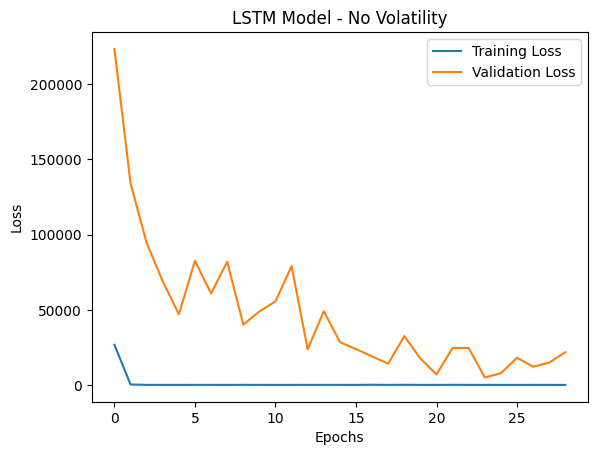

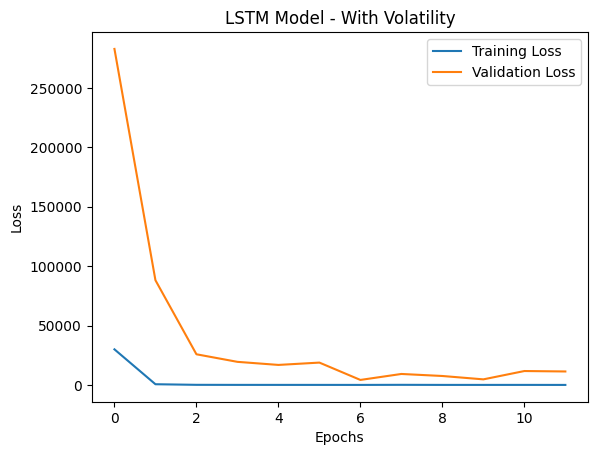

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# Plot training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both LSTM models
plot_loss(history_no_vol_lstm, "LSTM Model - No Volatility")
plot_loss(history_with_vol_lstm, "LSTM Model - With Volatility")

# Tyler Burguillos 10/30/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step

LSTM Model Without Volatility - RMSE: 71.0756, R²: 0.8865, MAPE: 5.6166%
LSTM Model With Volatility - RMSE: 65.9303, R²: 0.9023, MAPE: 5.8989%

Lift Chart - LSTM Model No Volatility:


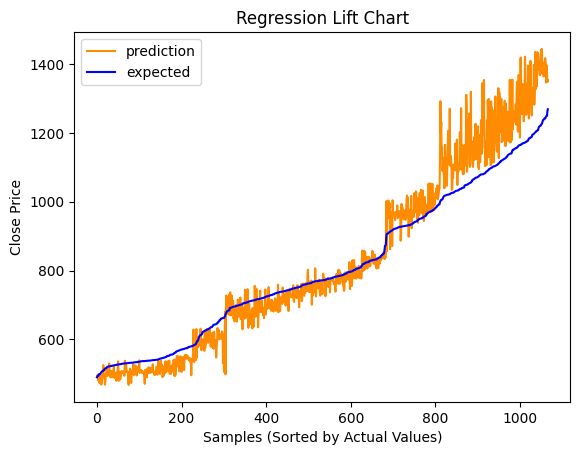

Lift Chart - LSTM Model With Volatility:


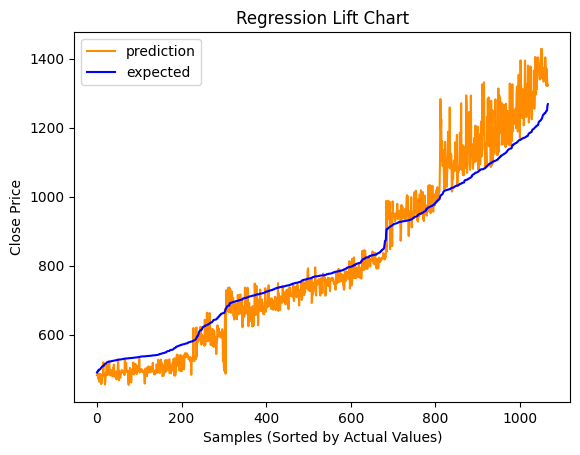

In [ ]:
# Function to calculate RMSE, R², and MAPE
def evaluate_model(model, X_test, y_test):
  y_pred = model.predict(X_test)

  rmse = np.sqrt(mean_squared_error(y_test, y_pred))
  r2 = r2_score(y_test, y_pred)
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Function to plot the regression lift chart
def chart_regression(pred, y, sort=True):
  t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
  if sort:
    t.sort_values(by=['y'], inplace=True)
  plt.plot(t['pred'].tolist(), label='prediction', color='darkorange')
  plt.plot(t['y'].tolist(), label='expected', color='blue')
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the LSTM models
y_pred_no_vol_lstm, rmse_no_vol_lstm, r2_no_vol_lstm, mape_no_vol_lstm = evaluate_model(
    model_no_vol_lstm, X_test_no_vol, y_test_no_vol_seq
)
y_pred_with_vol_lstm, rmse_with_vol_lstm, r2_with_vol_lstm, mape_with_vol_lstm = evaluate_model(
    model_with_vol_lstm, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics
print(f"\nLSTM Model Without Volatility - RMSE: {rmse_no_vol_lstm:.4f}, R²: {r2_no_vol_lstm:.4f}, MAPE: {mape_no_vol_lstm:.4%}")
print(f"LSTM Model With Volatility - RMSE: {rmse_with_vol_lstm:.4f}, R²: {r2_with_vol_lstm:.4f}, MAPE: {mape_with_vol_lstm:.4%}")

# Plot lift charts for both LSTM models
print("\nLift Chart - LSTM Model No Volatility:")
chart_regression(y_pred_no_vol_lstm, y_test_no_vol_seq)

print("Lift Chart - LSTM Model With Volatility:")
chart_regression(y_pred_with_vol_lstm, y_test_with_vol_seq)

# Tyler Burguillos 10/30/24

#### Model 5: 5 Layers, ReLU Activation, Adam optimizer (1 Dense Layer)

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the LSTM model
def build_lstm_model(input_shape):
  model = Sequential()

  # LSTM Layers
  model.add(LSTM(512, activation='relu', return_sequences=True, input_shape=input_shape))
  model.add(LSTM(256, activation='relu', return_sequences=True))
  model.add(LSTM(128, activation='relu', return_sequences=True))
  model.add(LSTM(64, activation='relu', return_sequences=True))
  model.add(LSTM(32, activation='relu', return_sequences=False))

  # Dense Layers
  model.add(Dense(32))
  model.add(Dense(1))  # Output layer (no activation for regression)
  # Compile the model
  model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
  return model

# Build LSTM models for both datasets
model_no_vol_lstm = build_lstm_model((7, 5))  # No-volatility input: (7 days, 5 features)
model_with_vol_lstm = build_lstm_model((7, 6))  # With-volatility input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("tyler_lstm_model_5_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("tyler_lstm_model_5_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the LSTM model without volatility
history_no_vol_lstm = model_no_vol_lstm.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the LSTM model with volatility
history_with_vol_lstm = model_with_vol_lstm.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol_lstm = model_no_vol_lstm.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_lstm = model_with_vol_lstm.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

# Print the results
print(f"\nTest Loss (No Volatility - LSTM): {loss_no_vol_lstm}")
print(f"Test Loss (With Volatility - LSTM): {loss_with_vol_lstm}")

# Tyler Burguillos 10/30/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/1000

Epoch 1: val_loss improved from inf to 80303.91406, saving model to tyler_lstm_model_5_no_vol.keras
79/79 - 20s - 256ms/step - loss: 21935.8008 - val_loss: 80303.9141
Epoch 2/1000

Epoch 2: val_loss improved from 80303.91406 to 33266.83594, saving model to tyler_lstm_model_5_no_vol.keras
79/79 - 1s - 16ms/step - loss: 417.6371 - val_loss: 33266.8359
Epoch 3/1000

Epoch 3: val_loss improved from 33266.83594 to 19443.88281, saving model to tyler_lstm_model_5_no_vol.keras
79/79 - 1s - 16ms/step - loss: 248.7626 - val_loss: 19443.8828
Epoch 4/1000

Epoch 4: val_loss improved from 19443.88281 to 11885.98730, saving model to tyler_lstm_model_5_no_vol.keras
79/79 - 1s - 14ms/step - loss: 204.6912 - val_loss: 11885.9873
Epoch 5/1000

Epoch 5: val_loss did not improve from 11885.98730
79/79 - 1s - 10ms/step - loss: 273.3070 - val_loss: 16636.0684
Epoch 6/1000

Epoch 6: val_loss improved from 11885.98730 to 4611.90283, saving model to tyler_lstm_model_5_no_vol.keras
79/79 - 1s - 13

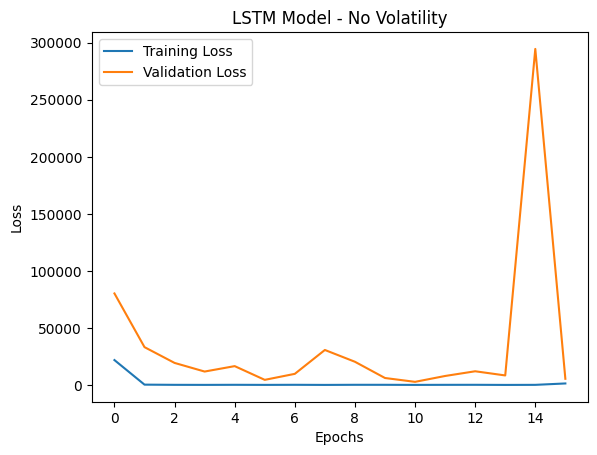

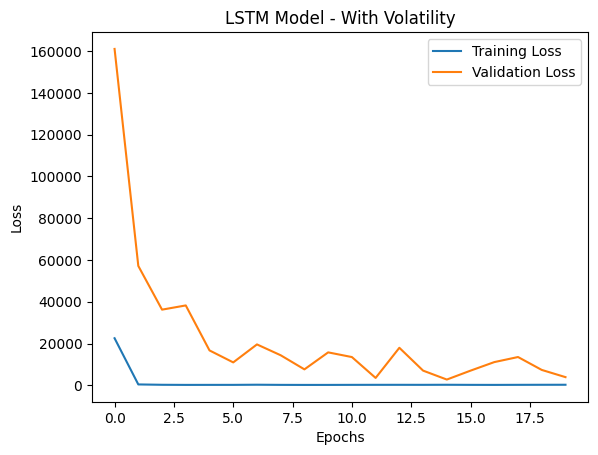

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# Plot training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both LSTM models
plot_loss(history_no_vol_lstm, "LSTM Model - No Volatility")
plot_loss(history_with_vol_lstm, "LSTM Model - With Volatility")

# Tyler Burguillos 10/30/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step

LSTM Model Without Volatility - RMSE: 53.5273, R²: 0.9356, MAPE: 5.9842%
LSTM Model With Volatility - RMSE: 52.3670, R²: 0.9384, MAPE: 5.3840%

Lift Chart - LSTM Model No Volatility:


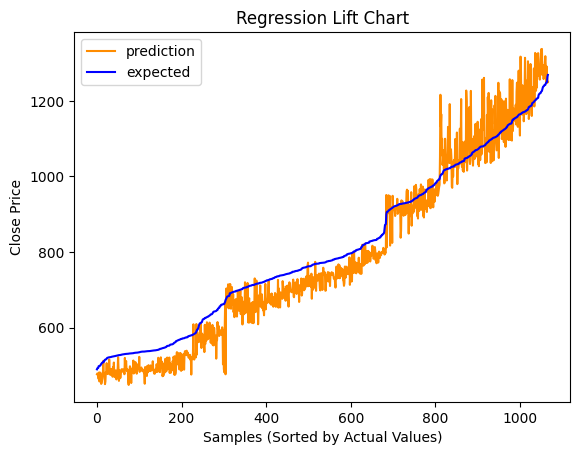

Lift Chart - LSTM Model With Volatility:


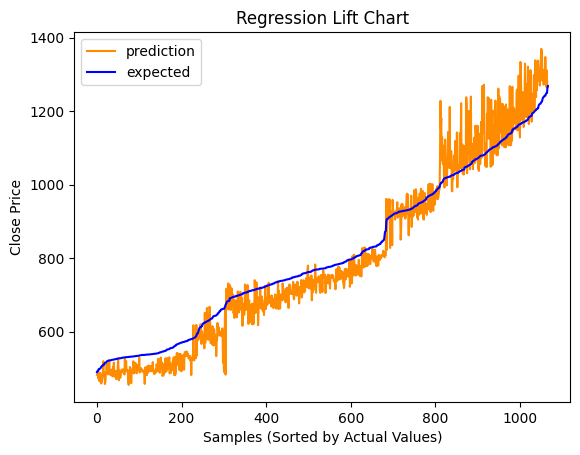

In [ ]:
# Function to calculate RMSE, R², and MAPE
def evaluate_model(model, X_test, y_test):
  y_pred = model.predict(X_test)

  rmse = np.sqrt(mean_squared_error(y_test, y_pred))
  r2 = r2_score(y_test, y_pred)
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Function to plot the regression lift chart
def chart_regression(pred, y, sort=True):
  t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
  if sort:
    t.sort_values(by=['y'], inplace=True)
  plt.plot(t['pred'].tolist(), label='prediction', color='darkorange')
  plt.plot(t['y'].tolist(), label='expected', color='blue')
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the LSTM models
y_pred_no_vol_lstm, rmse_no_vol_lstm, r2_no_vol_lstm, mape_no_vol_lstm = evaluate_model(
    model_no_vol_lstm, X_test_no_vol, y_test_no_vol_seq
)
y_pred_with_vol_lstm, rmse_with_vol_lstm, r2_with_vol_lstm, mape_with_vol_lstm = evaluate_model(
    model_with_vol_lstm, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics
print(f"\nLSTM Model Without Volatility - RMSE: {rmse_no_vol_lstm:.4f}, R²: {r2_no_vol_lstm:.4f}, MAPE: {mape_no_vol_lstm:.4%}")
print(f"LSTM Model With Volatility - RMSE: {rmse_with_vol_lstm:.4f}, R²: {r2_with_vol_lstm:.4f}, MAPE: {mape_with_vol_lstm:.4%}")

# Plot lift charts for both LSTM models
print("\nLift Chart - LSTM Model No Volatility:")
chart_regression(y_pred_no_vol_lstm, y_test_no_vol_seq)

print("Lift Chart - LSTM Model With Volatility:")
chart_regression(y_pred_with_vol_lstm, y_test_with_vol_seq)

# Tyler Burguillos 10/30/24

#### Model 6: 4 Layers, ReLU Activation, Adam optimizer (1 Dense Layer), dropout layer

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the LSTM model
def build_lstm_model(input_shape):
  model = Sequential()

  # LSTM Layers
  model.add(LSTM(256, activation='relu', return_sequences=True, input_shape=input_shape))
  model.add(Dropout(0.1))
  model.add(LSTM(128, activation='relu', return_sequences=True))
  model.add(LSTM(64, activation='relu', return_sequences=True))
  model.add(LSTM(32, activation='relu', return_sequences=False))

  # Dense Layers
  model.add(Dense(32))
  model.add(Dense(1))  # Output layer (no activation for regression)

  # Compile the model
  model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
  return model

# Build LSTM models for both datasets
model_no_vol_lstm = build_lstm_model((7, 5))  # No-volatility input: (7 days, 5 features)
model_with_vol_lstm = build_lstm_model((7, 6))  # With-volatility input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("tyler_lstm_model_6_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("tyler_lstm_model_6_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the LSTM model without volatility
history_no_vol_lstm = model_no_vol_lstm.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the LSTM model with volatility
history_with_vol_lstm = model_with_vol_lstm.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol_lstm = model_no_vol_lstm.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_lstm = model_with_vol_lstm.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

# Print the results
print(f"\nTest Loss (No Volatility - LSTM): {loss_no_vol_lstm}")
print(f"Test Loss (With Volatility - LSTM): {loss_with_vol_lstm}")

# Tyler Burguillos 10/30/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/1000

Epoch 1: val_loss improved from inf to 214133.98438, saving model to tyler_lstm_model_6_no_vol.keras
79/79 - 18s - 230ms/step - loss: 27743.6152 - val_loss: 214133.9844
Epoch 2/1000

Epoch 2: val_loss improved from 214133.98438 to 59453.57422, saving model to tyler_lstm_model_6_no_vol.keras
79/79 - 1s - 10ms/step - loss: 579.1348 - val_loss: 59453.5742
Epoch 3/1000

Epoch 3: val_loss improved from 59453.57422 to 47621.21094, saving model to tyler_lstm_model_6_no_vol.keras
79/79 - 1s - 16ms/step - loss: 299.6254 - val_loss: 47621.2109
Epoch 4/1000

Epoch 4: val_loss did not improve from 47621.21094
79/79 - 1s - 8ms/step - loss: 241.3529 - val_loss: 52804.6133
Epoch 5/1000

Epoch 5: val_loss improved from 47621.21094 to 28780.54102, saving model to tyler_lstm_model_6_no_vol.keras
79/79 - 1s - 18ms/step - loss: 238.6773 - val_loss: 28780.5410
Epoch 6/1000

Epoch 6: val_loss did not improve from 28780.54102
79/79 - 1s - 7ms/step - loss: 210.0071 - val_loss: 30340.9453
Epoch 7

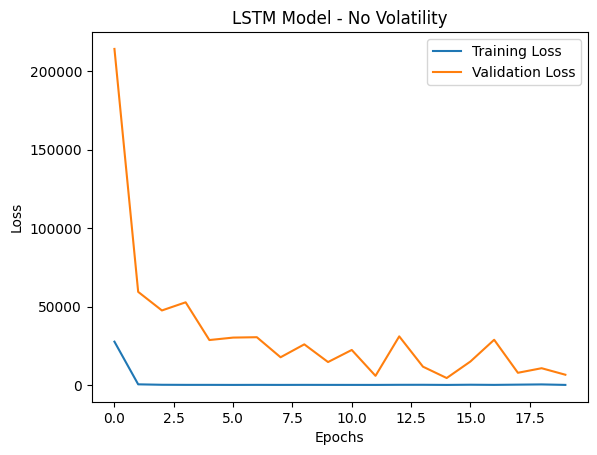

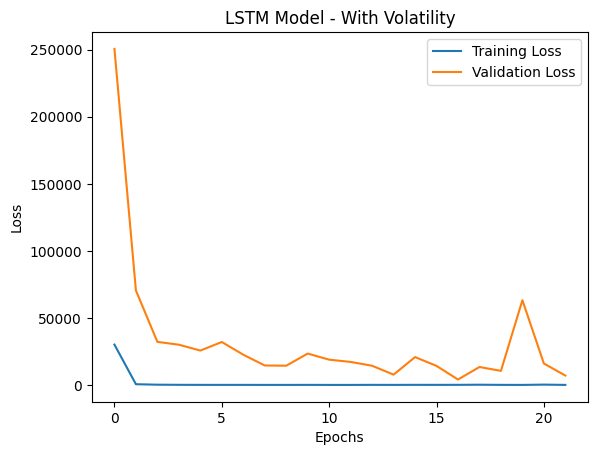

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# Plot training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both LSTM models
plot_loss(history_no_vol_lstm, "LSTM Model - No Volatility")
plot_loss(history_with_vol_lstm, "LSTM Model - With Volatility")

# Tyler Burguillos 10/30/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step

LSTM Model Without Volatility - RMSE: 67.7759, R²: 0.8968, MAPE: 5.9746%
LSTM Model With Volatility - RMSE: 64.9812, R²: 0.9051, MAPE: 6.2041%

Lift Chart - LSTM Model No Volatility:


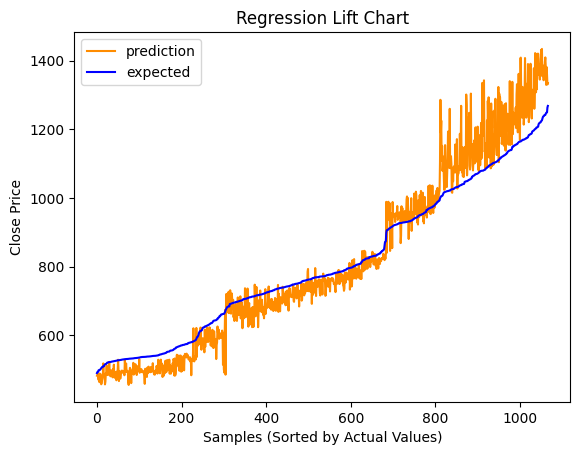

Lift Chart - LSTM Model With Volatility:


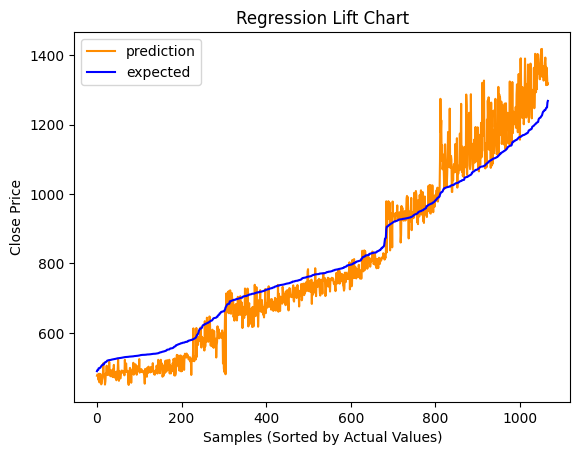

In [ ]:
# Function to calculate RMSE, R², and MAPE
def evaluate_model(model, X_test, y_test):
  y_pred = model.predict(X_test)

  rmse = np.sqrt(mean_squared_error(y_test, y_pred))
  r2 = r2_score(y_test, y_pred)
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Function to plot the regression lift chart
def chart_regression(pred, y, sort=True):
  t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
  if sort:
    t.sort_values(by=['y'], inplace=True)
  plt.plot(t['pred'].tolist(), label='prediction', color='darkorange')
  plt.plot(t['y'].tolist(), label='expected', color='blue')
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the LSTM models
y_pred_no_vol_lstm, rmse_no_vol_lstm, r2_no_vol_lstm, mape_no_vol_lstm = evaluate_model(
    model_no_vol_lstm, X_test_no_vol, y_test_no_vol_seq
)
y_pred_with_vol_lstm, rmse_with_vol_lstm, r2_with_vol_lstm, mape_with_vol_lstm = evaluate_model(
    model_with_vol_lstm, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics
print(f"\nLSTM Model Without Volatility - RMSE: {rmse_no_vol_lstm:.4f}, R²: {r2_no_vol_lstm:.4f}, MAPE: {mape_no_vol_lstm:.4%}")
print(f"LSTM Model With Volatility - RMSE: {rmse_with_vol_lstm:.4f}, R²: {r2_with_vol_lstm:.4f}, MAPE: {mape_with_vol_lstm:.4%}")

# Plot lift charts for both LSTM models
print("\nLift Chart - LSTM Model No Volatility:")
chart_regression(y_pred_no_vol_lstm, y_test_no_vol_seq)

print("Lift Chart - LSTM Model With Volatility:")
chart_regression(y_pred_with_vol_lstm, y_test_with_vol_seq)

# Tyler Burguillos 10/30/24

#### Model 7: 4 Layers, ReLU Activation, Adam optimizer (1 Dense Layer), dropout layer, 0.001 learning rate

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the LSTM model
def build_lstm_model(input_shape):
  model = Sequential()

  # LSTM Layers
  model.add(LSTM(256, activation='relu', return_sequences=True, input_shape=input_shape))
  model.add(Dropout(0.1))
  model.add(LSTM(128, activation='relu', return_sequences=True))
  model.add(LSTM(64, activation='relu', return_sequences=True))
  model.add(LSTM(32, activation='relu', return_sequences=False))

  # Dense Layers
  model.add(Dense(32))
  model.add(Dense(1))  # Output layer (no activation for regression)

  # Compile the model
  model.compile(optimizer=Adam(learning_rate=0.0001), loss='mean_squared_error')
  return model

# Build LSTM models for both datasets
model_no_vol_lstm = build_lstm_model((7, 5))  # No-volatility input: (7 days, 5 features)
model_with_vol_lstm = build_lstm_model((7, 6))  # With-volatility input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("tyler_lstm_model_7_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("tyler_lstm_model_7_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the LSTM model without volatility
history_no_vol_lstm = model_no_vol_lstm.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the LSTM model with volatility
history_with_vol_lstm = model_with_vol_lstm.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol_lstm = model_no_vol_lstm.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_lstm = model_with_vol_lstm.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

# Print the results
print(f"\nTest Loss (No Volatility - LSTM): {loss_no_vol_lstm}")
print(f"Test Loss (With Volatility - LSTM): {loss_with_vol_lstm}")

# Tyler Burguillos 10/30/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/1000

Epoch 1: val_loss improved from inf to 698556.12500, saving model to tyler_lstm_model_7_no_vol.keras
79/79 - 15s - 195ms/step - loss: 88299.2422 - val_loss: 698556.1250
Epoch 2/1000

Epoch 2: val_loss did not improve from 698556.12500
79/79 - 1s - 8ms/step - loss: 44236.8203 - val_loss: 841502.9375
Epoch 3/1000

Epoch 3: val_loss improved from 698556.12500 to 368447.62500, saving model to tyler_lstm_model_7_no_vol.keras
79/79 - 1s - 8ms/step - loss: 2393.9487 - val_loss: 368447.6250
Epoch 4/1000

Epoch 4: val_loss improved from 368447.62500 to 247362.89062, saving model to tyler_lstm_model_7_no_vol.keras
79/79 - 1s - 7ms/step - loss: 1262.8171 - val_loss: 247362.8906
Epoch 5/1000

Epoch 5: val_loss improved from 247362.89062 to 203805.60938, saving model to tyler_lstm_model_7_no_vol.keras
79/79 - 1s - 8ms/step - loss: 684.1443 - val_loss: 203805.6094
Epoch 6/1000

Epoch 6: val_loss improved from 203805.60938 to 164321.82812, saving model to tyler_lstm_model_7_no_vol.keras

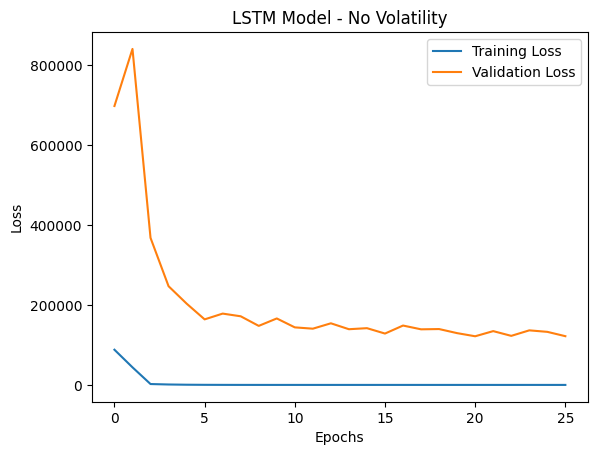

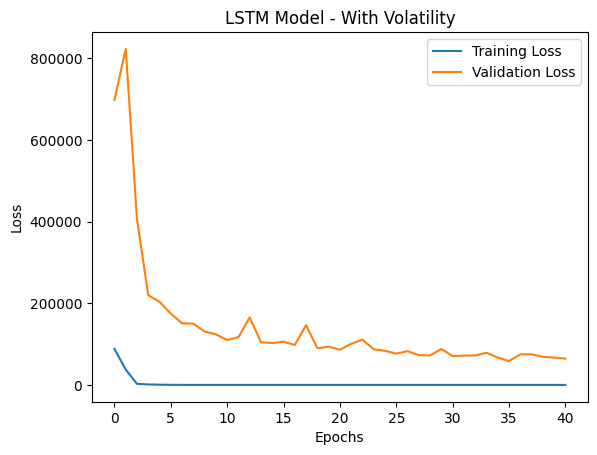

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# Plot training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both LSTM models
plot_loss(history_no_vol_lstm, "LSTM Model - No Volatility")
plot_loss(history_with_vol_lstm, "LSTM Model - With Volatility")

# Tyler Burguillos 10/30/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

LSTM Model Without Volatility - RMSE: 349.2999, R²: -1.7410, MAPE: 23.1558%
LSTM Model With Volatility - RMSE: 241.9026, R²: -0.3146, MAPE: 15.9459%

Lift Chart - LSTM Model No Volatility:


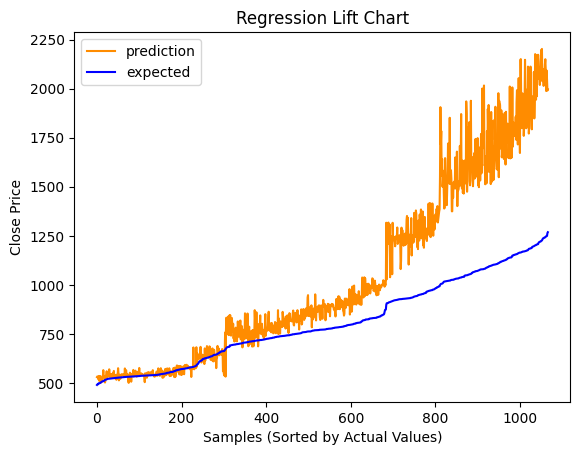

Lift Chart - LSTM Model With Volatility:


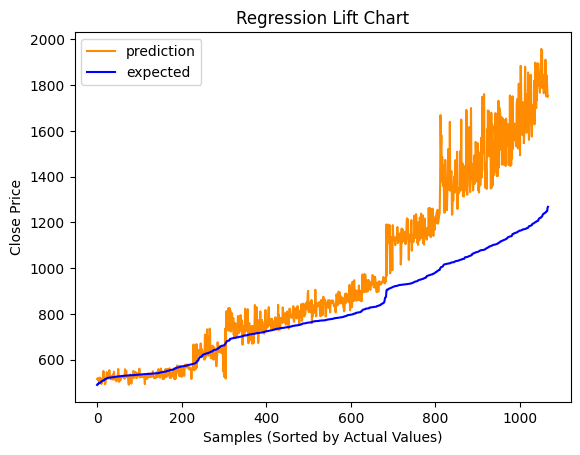

In [ ]:
# Function to calculate RMSE, R², and MAPE
def evaluate_model(model, X_test, y_test):
  y_pred = model.predict(X_test)

  rmse = np.sqrt(mean_squared_error(y_test, y_pred))
  r2 = r2_score(y_test, y_pred)
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Function to plot the regression lift chart
def chart_regression(pred, y, sort=True):
  t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
  if sort:
    t.sort_values(by=['y'], inplace=True)
  plt.plot(t['pred'].tolist(), label='prediction', color='darkorange')
  plt.plot(t['y'].tolist(), label='expected', color='blue')
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the LSTM models
y_pred_no_vol_lstm, rmse_no_vol_lstm, r2_no_vol_lstm, mape_no_vol_lstm = evaluate_model(
    model_no_vol_lstm, X_test_no_vol, y_test_no_vol_seq
)
y_pred_with_vol_lstm, rmse_with_vol_lstm, r2_with_vol_lstm, mape_with_vol_lstm = evaluate_model(
    model_with_vol_lstm, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics
print(f"\nLSTM Model Without Volatility - RMSE: {rmse_no_vol_lstm:.4f}, R²: {r2_no_vol_lstm:.4f}, MAPE: {mape_no_vol_lstm:.4%}")
print(f"LSTM Model With Volatility - RMSE: {rmse_with_vol_lstm:.4f}, R²: {r2_with_vol_lstm:.4f}, MAPE: {mape_with_vol_lstm:.4%}")

# Plot lift charts for both LSTM models
print("\nLift Chart - LSTM Model No Volatility:")
chart_regression(y_pred_no_vol_lstm, y_test_no_vol_seq)

print("Lift Chart - LSTM Model With Volatility:")
chart_regression(y_pred_with_vol_lstm, y_test_with_vol_seq)

# Tyler Burguillos 10/30/24

#### Model 8: 4 identical Layers, ReLU Activation, Adam optimizer (1 Dense Layer)

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the LSTM model
def build_lstm_model(input_shape):
  model = Sequential()

  # LSTM Layers
  model.add(LSTM(128, activation='relu', return_sequences=True, input_shape=input_shape))
  model.add(LSTM(128, activation='relu', return_sequences=True))
  model.add(LSTM(128, activation='relu', return_sequences=True))
  model.add(LSTM(128, activation='relu', return_sequences=False))

  # Dense Layers
  model.add(Dense(32))
  model.add(Dense(1))  # Output layer (no activation for regression)

  # Compile the model
  model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
  return model

# Build LSTM models for both datasets
model_no_vol_lstm = build_lstm_model((7, 5))  # No-volatility input: (7 days, 5 features)
model_with_vol_lstm = build_lstm_model((7, 6))  # With-volatility input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("tyler_lstm_model_8_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("tyler_lstm_model_8_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the LSTM model without volatility
history_no_vol_lstm = model_no_vol_lstm.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the LSTM model with volatility
history_with_vol_lstm = model_with_vol_lstm.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol_lstm = model_no_vol_lstm.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_lstm = model_with_vol_lstm.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

# Print the results
print(f"\nTest Loss (No Volatility - LSTM): {loss_no_vol_lstm}")
print(f"Test Loss (With Volatility - LSTM): {loss_with_vol_lstm}")

# Tyler Burguillos 10/30/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/1000

Epoch 1: val_loss improved from inf to 318742.21875, saving model to tyler_lstm_model_8_no_vol.keras
79/79 - 13s - 160ms/step - loss: 30919.0254 - val_loss: 318742.2188
Epoch 2/1000

Epoch 2: val_loss improved from 318742.21875 to 130729.59375, saving model to tyler_lstm_model_8_no_vol.keras
79/79 - 3s - 36ms/step - loss: 892.1379 - val_loss: 130729.5938
Epoch 3/1000

Epoch 3: val_loss improved from 130729.59375 to 68101.87500, saving model to tyler_lstm_model_8_no_vol.keras
79/79 - 1s - 8ms/step - loss: 267.6508 - val_loss: 68101.8750
Epoch 4/1000

Epoch 4: val_loss improved from 68101.87500 to 52140.91797, saving model to tyler_lstm_model_8_no_vol.keras
79/79 - 1s - 7ms/step - loss: 219.6423 - val_loss: 52140.9180
Epoch 5/1000

Epoch 5: val_loss improved from 52140.91797 to 50355.96484, saving model to tyler_lstm_model_8_no_vol.keras
79/79 - 1s - 7ms/step - loss: 179.1707 - val_loss: 50355.9648
Epoch 6/1000

Epoch 6: val_loss improved from 50355.96484 to 27388.16211, sa

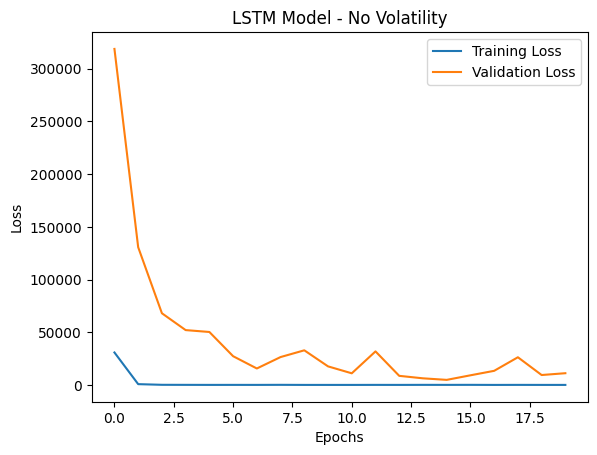

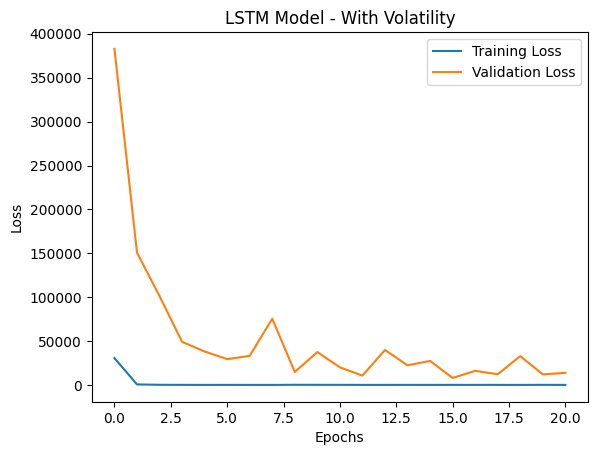

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# Plot training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both LSTM models
plot_loss(history_no_vol_lstm, "LSTM Model - No Volatility")
plot_loss(history_with_vol_lstm, "LSTM Model - With Volatility")

# Tyler Burguillos 10/30/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step

LSTM Model Without Volatility - RMSE: 70.3213, R²: 0.8889, MAPE: 7.1441%
LSTM Model With Volatility - RMSE: 89.7704, R²: 0.8190, MAPE: 6.3520%

Lift Chart - LSTM Model No Volatility:


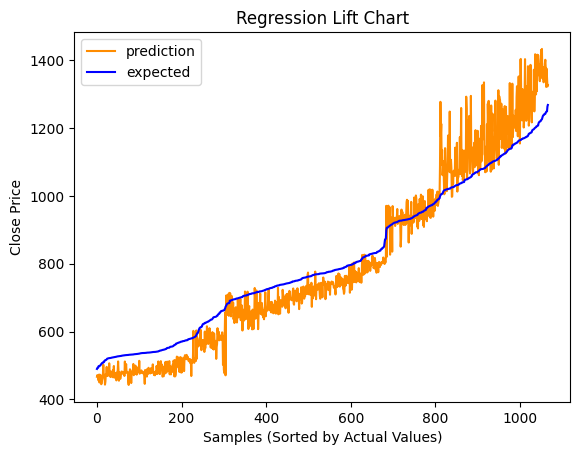

Lift Chart - LSTM Model With Volatility:


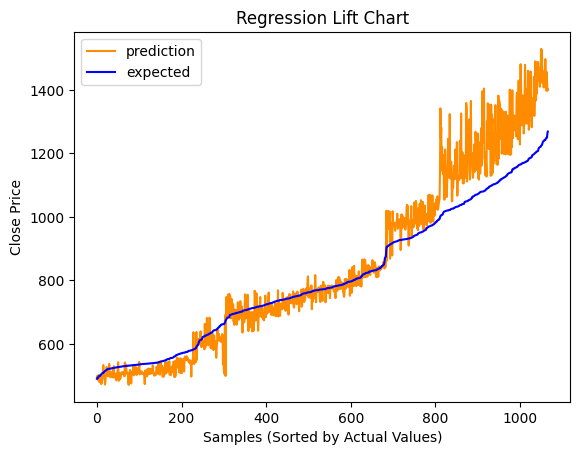

In [ ]:
# Function to calculate RMSE, R², and MAPE
def evaluate_model(model, X_test, y_test):
  y_pred = model.predict(X_test)

  rmse = np.sqrt(mean_squared_error(y_test, y_pred))
  r2 = r2_score(y_test, y_pred)
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Function to plot the regression lift chart
def chart_regression(pred, y, sort=True):
  t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
  if sort:
    t.sort_values(by=['y'], inplace=True)
  plt.plot(t['pred'].tolist(), label='prediction', color='darkorange')
  plt.plot(t['y'].tolist(), label='expected', color='blue')
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the LSTM models
y_pred_no_vol_lstm, rmse_no_vol_lstm, r2_no_vol_lstm, mape_no_vol_lstm = evaluate_model(
    model_no_vol_lstm, X_test_no_vol, y_test_no_vol_seq
)
y_pred_with_vol_lstm, rmse_with_vol_lstm, r2_with_vol_lstm, mape_with_vol_lstm = evaluate_model(
    model_with_vol_lstm, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics
print(f"\nLSTM Model Without Volatility - RMSE: {rmse_no_vol_lstm:.4f}, R²: {r2_no_vol_lstm:.4f}, MAPE: {mape_no_vol_lstm:.4%}")
print(f"LSTM Model With Volatility - RMSE: {rmse_with_vol_lstm:.4f}, R²: {r2_with_vol_lstm:.4f}, MAPE: {mape_with_vol_lstm:.4%}")

# Plot lift charts for both LSTM models
print("\nLift Chart - LSTM Model No Volatility:")
chart_regression(y_pred_no_vol_lstm, y_test_no_vol_seq)

print("Lift Chart - LSTM Model With Volatility:")
chart_regression(y_pred_with_vol_lstm, y_test_with_vol_seq)

# Tyler Burguillos 10/30/24

#### Model 9: 4 identical Layers, ReLU Activation, Adam optimizer (1 Dense Layer), dropout layers

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the LSTM model
def build_lstm_model(input_shape):
  model = Sequential()

  # LSTM Layers
  model.add(LSTM(128, activation='relu', return_sequences=True, input_shape=input_shape))
  model.add(Dropout(0.1))
  model.add(LSTM(128, activation='relu', return_sequences=True))
  model.add(Dropout(0.1))
  model.add(LSTM(128, activation='relu', return_sequences=True))
  model.add(Dropout(0.1))
  model.add(LSTM(128, activation='relu', return_sequences=False))

  # Dense Layers
  model.add(Dense(32))
  model.add(Dense(1))  # Output layer (no activation for regression)

  # Compile the model
  model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
  return model

# Build LSTM models for both datasets
model_no_vol_lstm = build_lstm_model((7, 5))  # No-volatility input: (7 days, 5 features)
model_with_vol_lstm = build_lstm_model((7, 6))  # With-volatility input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("tyler_lstm_model_9_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("tyler_lstm_model_9_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the LSTM model without volatility
history_no_vol_lstm = model_no_vol_lstm.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the LSTM model with volatility
history_with_vol_lstm = model_with_vol_lstm.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol_lstm = model_no_vol_lstm.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_lstm = model_with_vol_lstm.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

# Print the results
print(f"\nTest Loss (No Volatility - LSTM): {loss_no_vol_lstm}")
print(f"Test Loss (With Volatility - LSTM): {loss_with_vol_lstm}")

# Tyler Burguillos 10/30/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/1000

Epoch 1: val_loss improved from inf to 85735.04688, saving model to tyler_lstm_model_9_no_vol.keras
79/79 - 16s - 198ms/step - loss: 27036.7324 - val_loss: 85735.0469
Epoch 2/1000

Epoch 2: val_loss did not improve from 85735.04688
79/79 - 1s - 10ms/step - loss: 1937.4283 - val_loss: 177986.0469
Epoch 3/1000

Epoch 3: val_loss improved from 85735.04688 to 70601.95312, saving model to tyler_lstm_model_9_no_vol.keras
79/79 - 1s - 17ms/step - loss: 520.4229 - val_loss: 70601.9531
Epoch 4/1000

Epoch 4: val_loss improved from 70601.95312 to 40330.84375, saving model to tyler_lstm_model_9_no_vol.keras
79/79 - 1s - 13ms/step - loss: 330.1801 - val_loss: 40330.8438
Epoch 5/1000

Epoch 5: val_loss did not improve from 40330.84375
79/79 - 1s - 7ms/step - loss: 413.3560 - val_loss: 53348.4023
Epoch 6/1000

Epoch 6: val_loss improved from 40330.84375 to 29345.72070, saving model to tyler_lstm_model_9_no_vol.keras
79/79 - 1s - 7ms/step - loss: 373.8837 - val_loss: 29345.7207
Epoch 7/

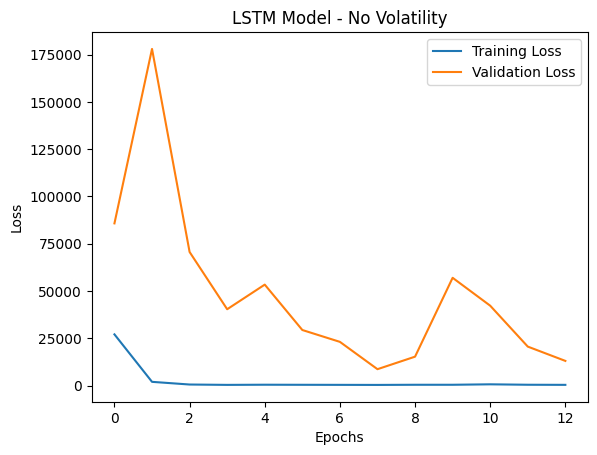

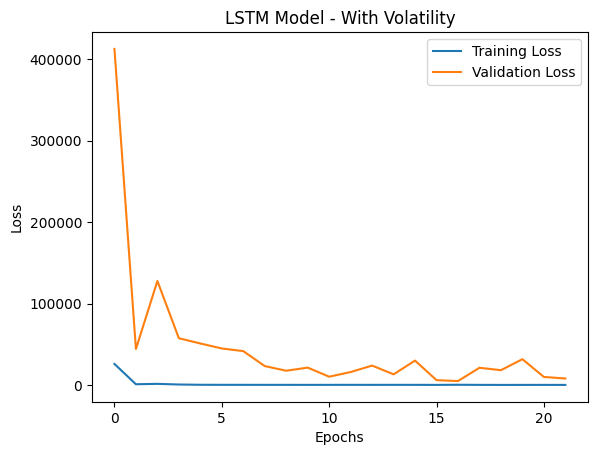

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# Plot training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both LSTM models
plot_loss(history_no_vol_lstm, "LSTM Model - No Volatility")
plot_loss(history_with_vol_lstm, "LSTM Model - With Volatility")

# Tyler Burguillos 10/30/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

LSTM Model Without Volatility - RMSE: 92.8892, R²: 0.8062, MAPE: 7.2692%
LSTM Model With Volatility - RMSE: 70.8202, R²: 0.8873, MAPE: 6.8947%

Lift Chart - LSTM Model No Volatility:


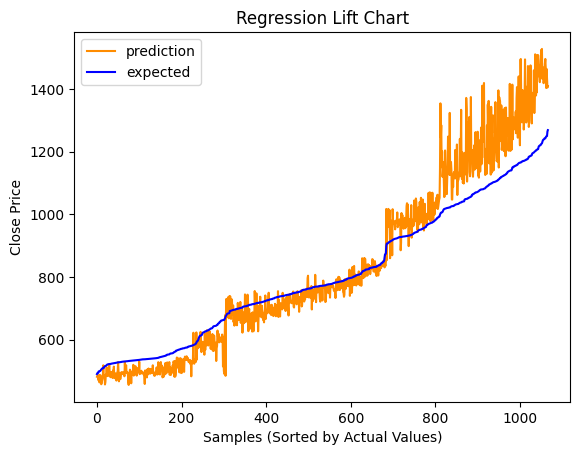

Lift Chart - LSTM Model With Volatility:


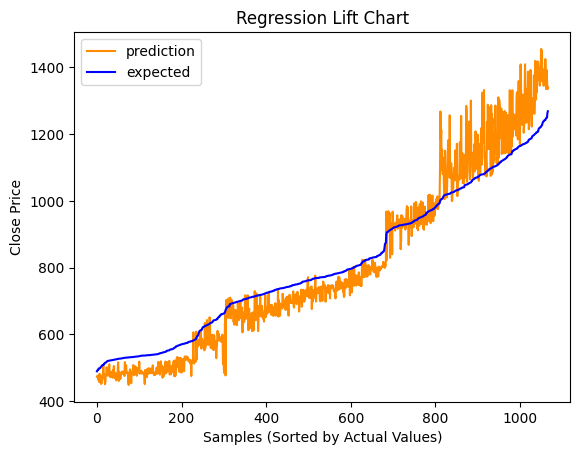

In [ ]:
# Function to calculate RMSE, R², and MAPE
def evaluate_model(model, X_test, y_test):
  y_pred = model.predict(X_test)

  rmse = np.sqrt(mean_squared_error(y_test, y_pred))
  r2 = r2_score(y_test, y_pred)
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Function to plot the regression lift chart
def chart_regression(pred, y, sort=True):
  t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
  if sort:
    t.sort_values(by=['y'], inplace=True)
  plt.plot(t['pred'].tolist(), label='prediction', color='darkorange')
  plt.plot(t['y'].tolist(), label='expected', color='blue')
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the LSTM models
y_pred_no_vol_lstm, rmse_no_vol_lstm, r2_no_vol_lstm, mape_no_vol_lstm = evaluate_model(
    model_no_vol_lstm, X_test_no_vol, y_test_no_vol_seq
)
y_pred_with_vol_lstm, rmse_with_vol_lstm, r2_with_vol_lstm, mape_with_vol_lstm = evaluate_model(
    model_with_vol_lstm, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics
print(f"\nLSTM Model Without Volatility - RMSE: {rmse_no_vol_lstm:.4f}, R²: {r2_no_vol_lstm:.4f}, MAPE: {mape_no_vol_lstm:.4%}")
print(f"LSTM Model With Volatility - RMSE: {rmse_with_vol_lstm:.4f}, R²: {r2_with_vol_lstm:.4f}, MAPE: {mape_with_vol_lstm:.4%}")

# Plot lift charts for both LSTM models
print("\nLift Chart - LSTM Model No Volatility:")
chart_regression(y_pred_no_vol_lstm, y_test_no_vol_seq)

print("Lift Chart - LSTM Model With Volatility:")
chart_regression(y_pred_with_vol_lstm, y_test_with_vol_seq)

# Tyler Burguillos 10/30/24

### LSTM Model Design and Testing (Austin Nolte)

#### Model 1: 3 Layer, Sigmoid Activation Function, Adam Optimizer


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Build model with no volatility (input = 7 days, 5 features)
model_no_vol = Sequential()

model_no_vol.add(LSTM(128, activation='sigmoid', return_sequences=True, input_shape=(7,5)))
model_no_vol.add(LSTM(64, activation='sigmoid', return_sequences=True))
model_no_vol.add(LSTM(32, activation='sigmoid', return_sequences=False))

model_no_vol.add(Dense(32, activation='sigmoid'))
model_no_vol.add(Dense(1))

model_no_vol.compile(loss='mean_squared_error', optimizer='adam')

# Build model with volatility (input = 7 days, 6 features)
model_with_vol = Sequential()
model_with_vol.add(LSTM(128, activation='sigmoid', return_sequences=True, input_shape=(7,6)))
model_with_vol.add(LSTM(64, activation='sigmoid', return_sequences=True))
model_with_vol.add(LSTM(32, activation='sigmoid', return_sequences=False))

model_with_vol.add(Dense(32, activation='sigmoid'))
model_with_vol.add(Dense(1))
model_with_vol.compile(loss='mean_squared_error', optimizer='adam')

# Early stopping and checkpointing for each model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Austin_LSTM_model_1_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Austin_LSTM_model_1_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
# Austin Nolte 11/4/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
# Train model without volatility
history_no_vol = model_no_vol.fit(X_train_no_vol, y_train_no_vol_seq,validation_data=(X_test_no_vol, y_test_no_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_no_vol, checkpoint_no_vol],verbose=2)

# Evaluate the model without volatility
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")

# Austin Nolte 11/4/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 695629.50000, saving model to Austin_LSTM_model_1_no_vol.keras
79/79 - 51s - 640ms/step - loss: 87799.2812 - val_loss: 695629.5000
Epoch 2/500

Epoch 2: val_loss improved from 695629.50000 to 691842.50000, saving model to Austin_LSTM_model_1_no_vol.keras
79/79 - 1s - 14ms/step - loss: 86194.1172 - val_loss: 691842.5000
Epoch 3/500

Epoch 3: val_loss improved from 691842.50000 to 688621.68750, saving model to Austin_LSTM_model_1_no_vol.keras
79/79 - 1s - 11ms/step - loss: 85073.4453 - val_loss: 688621.6875
Epoch 4/500

Epoch 4: val_loss improved from 688621.68750 to 685482.00000, saving model to Austin_LSTM_model_1_no_vol.keras
79/79 - 1s - 16ms/step - loss: 83997.3828 - val_loss: 685482.0000
Epoch 5/500

Epoch 5: val_loss improved from 685482.00000 to 682561.56250, saving model to Austin_LSTM_model_1_no_vol.keras
79/79 - 1s - 6ms/step - loss: 83000.1562 - val_loss: 682561.5625
Epoch 6/500

Epoch 6: val_loss improved from 682561.56250 

In [ ]:
# Train model with volatility
history_with_vol = model_with_vol.fit(X_train_with_vol, y_train_with_vol_seq,validation_data=(X_test_with_vol, y_test_with_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_with_vol, checkpoint_with_vol],verbose=2)

# Evaluate the model with volatility
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (With Volatility): {loss_with_vol}")
# Austin Nolte 11/4/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 692987.12500, saving model to Austin_LSTM_model_1_with_vol.keras
79/79 - 13s - 168ms/step - loss: 87039.2734 - val_loss: 692987.1250
Epoch 2/500

Epoch 2: val_loss improved from 692987.12500 to 689512.75000, saving model to Austin_LSTM_model_1_with_vol.keras
79/79 - 1s - 7ms/step - loss: 85366.2578 - val_loss: 689512.7500
Epoch 3/500

Epoch 3: val_loss improved from 689512.75000 to 686696.12500, saving model to Austin_LSTM_model_1_with_vol.keras
79/79 - 0s - 6ms/step - loss: 84344.9062 - val_loss: 686696.1250
Epoch 4/500

Epoch 4: val_loss improved from 686696.12500 to 683844.68750, saving model to Austin_LSTM_model_1_with_vol.keras
79/79 - 0s - 6ms/step - loss: 83413.2422 - val_loss: 683844.6875
Epoch 5/500

Epoch 5: val_loss improved from 683844.68750 to 681129.25000, saving model to Austin_LSTM_model_1_with_vol.keras
79/79 - 1s - 8ms/step - loss: 82493.7344 - val_loss: 681129.2500
Epoch 6/500

Epoch 6: val_loss improved from 681129

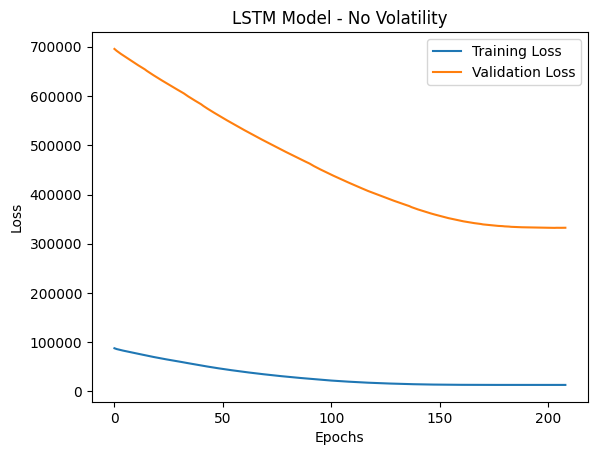

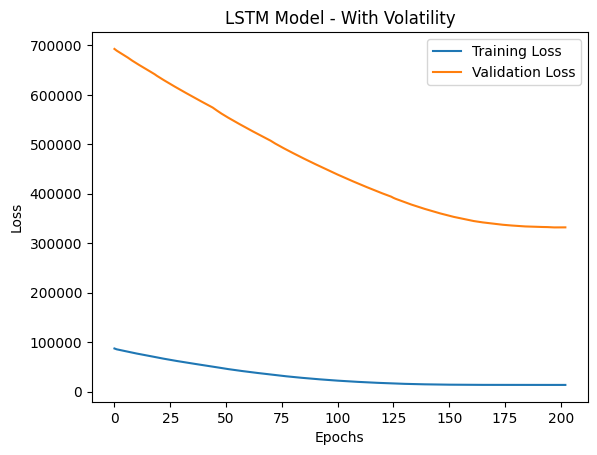

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "LSTM Model - No Volatility")
plot_loss(history_with_vol, "LSTM Model - With Volatility")

# Austin Nolte 11/4/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step
Model Without Volatility stats: 
RMSE: 576.4195, 
R²: -6.4643, 
MAPE: 63.8581%
Model With Volatility stats: 
RMSE: 576.1294, 
R²: -6.4568, 
MAPE: 63.8169%
Lift Chart - No Volatility:


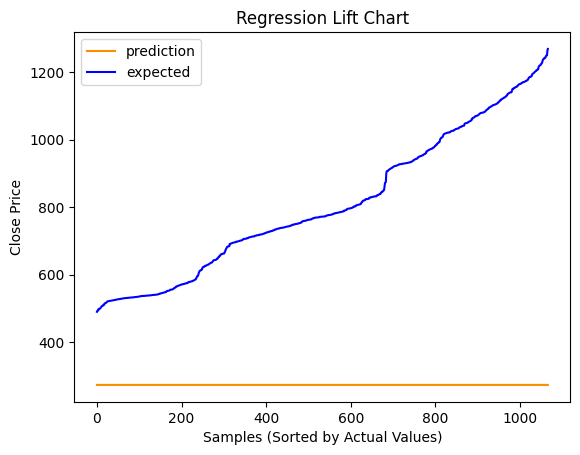

Lift Chart - With Volatility:


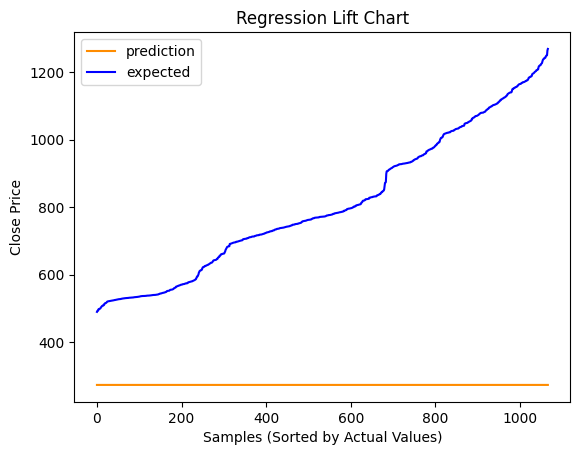

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility stats: \nRMSE: {rmse_no_vol:.4f}, \nR²: {r2_no_vol:.4f}, \nMAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility stats: \nRMSE: {rmse_with_vol:.4f}, \nR²: {r2_with_vol:.4f}, \nMAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Austin Nolte 11/4/24

#### Model 2: 3 Layers, Sigmoid Activation Function, Adam Optimizer


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Build model with no volatility (input = 7 days, 5 features)
model_no_vol = Sequential()

model_no_vol.add(LSTM(64, activation='sigmoid', return_sequences=True, input_shape=(7,5)))
model_no_vol.add(LSTM(32, activation='sigmoid', return_sequences=True))
model_no_vol.add(LSTM(16, activation='sigmoid', return_sequences=False))

model_no_vol.add(Dense(32, activation='sigmoid'))
model_no_vol.add(Dense(1))

model_no_vol.compile(loss='mean_squared_error', optimizer='adam')

# Build model with volatility (input = 7 days, 6 features)
model_with_vol = Sequential()
model_with_vol.add(LSTM(64, activation='sigmoid', return_sequences=True, input_shape=(7,6)))
model_with_vol.add(LSTM(32, activation='sigmoid', return_sequences=True))
model_with_vol.add(LSTM(16, activation='sigmoid', return_sequences=False))

model_with_vol.add(Dense(32, activation='sigmoid'))
model_with_vol.add(Dense(1))
model_with_vol.compile(loss='mean_squared_error', optimizer='adam')

# Early stopping and checkpointing for each model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Austin_LSTM_model_2_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Austin_LSTM_model_2_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
# Austin Nolte 11/4/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
# Train model without volatility
history_no_vol = model_no_vol.fit(X_train_no_vol, y_train_no_vol_seq,validation_data=(X_test_no_vol, y_test_no_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_no_vol, checkpoint_no_vol],verbose=2)

# Evaluate the model without volatility
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")

# Austin Nolte 11/4/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 693461.50000, saving model to Austin_LSTM_model_2_no_vol.keras
79/79 - 14s - 177ms/step - loss: 87126.0547 - val_loss: 693461.5000
Epoch 2/500

Epoch 2: val_loss improved from 693461.50000 to 688963.87500, saving model to Austin_LSTM_model_2_no_vol.keras
79/79 - 0s - 6ms/step - loss: 85358.4531 - val_loss: 688963.8750
Epoch 3/500

Epoch 3: val_loss improved from 688963.87500 to 685292.06250, saving model to Austin_LSTM_model_2_no_vol.keras
79/79 - 0s - 6ms/step - loss: 84017.3984 - val_loss: 685292.0625
Epoch 4/500

Epoch 4: val_loss improved from 685292.06250 to 682053.43750, saving model to Austin_LSTM_model_2_no_vol.keras
79/79 - 1s - 8ms/step - loss: 82881.4453 - val_loss: 682053.4375
Epoch 5/500

Epoch 5: val_loss improved from 682053.43750 to 678850.75000, saving model to Austin_LSTM_model_2_no_vol.keras
79/79 - 0s - 6ms/step - loss: 81832.6406 - val_loss: 678850.7500
Epoch 6/500

Epoch 6: val_loss improved from 678850.75000 to 

In [ ]:
# Train model with volatility
history_with_vol = model_with_vol.fit(X_train_with_vol, y_train_with_vol_seq,validation_data=(X_test_with_vol, y_test_with_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_with_vol, checkpoint_with_vol],verbose=2)

# Evaluate the model with volatility
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (With Volatility): {loss_with_vol}")
# Austin Nolte 11/4/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 693012.12500, saving model to Austin_LSTM_model_2_with_vol.keras
79/79 - 24s - 307ms/step - loss: 87030.7500 - val_loss: 693012.1250
Epoch 2/500

Epoch 2: val_loss improved from 693012.12500 to 687707.00000, saving model to Austin_LSTM_model_2_with_vol.keras
79/79 - 4s - 48ms/step - loss: 85073.1406 - val_loss: 687707.0000
Epoch 3/500

Epoch 3: val_loss improved from 687707.00000 to 683535.62500, saving model to Austin_LSTM_model_2_with_vol.keras
79/79 - 1s - 16ms/step - loss: 83515.6328 - val_loss: 683535.6250
Epoch 4/500

Epoch 4: val_loss improved from 683535.62500 to 679879.81250, saving model to Austin_LSTM_model_2_with_vol.keras
79/79 - 1s - 17ms/step - loss: 82231.8359 - val_loss: 679879.8125
Epoch 5/500

Epoch 5: val_loss improved from 679879.81250 to 676467.31250, saving model to Austin_LSTM_model_2_with_vol.keras
79/79 - 1s - 9ms/step - loss: 81075.7344 - val_loss: 676467.3125
Epoch 6/500

Epoch 6: val_loss improved from 676

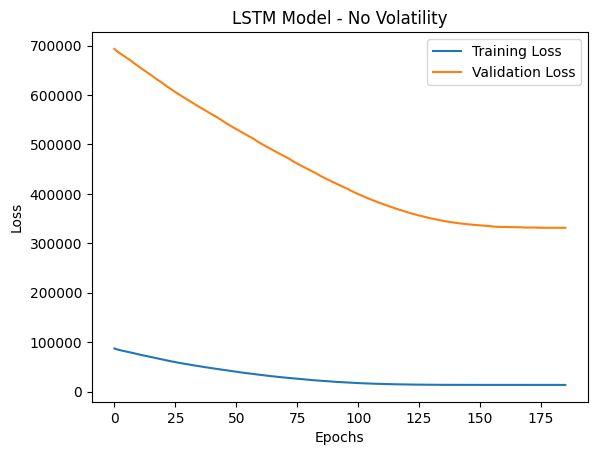

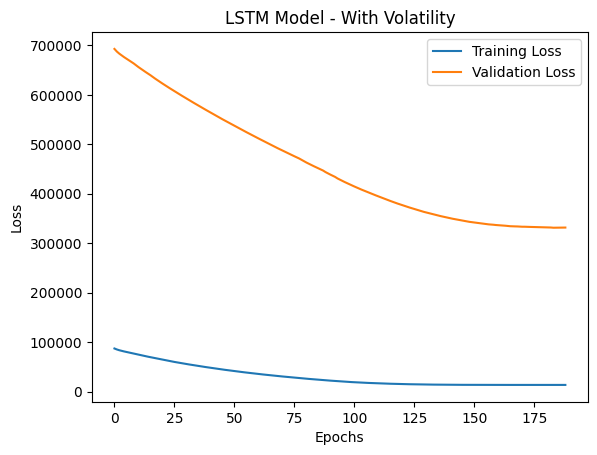

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "LSTM Model - No Volatility")
plot_loss(history_with_vol, "LSTM Model - With Volatility")

# Austin Nolte 11/4/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step
Model Without Volatility stats: 
RMSE: 575.5663, 
R²: -6.4422, 
MAPE: 63.7369%
Model With Volatility stats: 
RMSE: 575.6083, 
R²: -6.4433, 
MAPE: 63.7428%
Lift Chart - No Volatility:


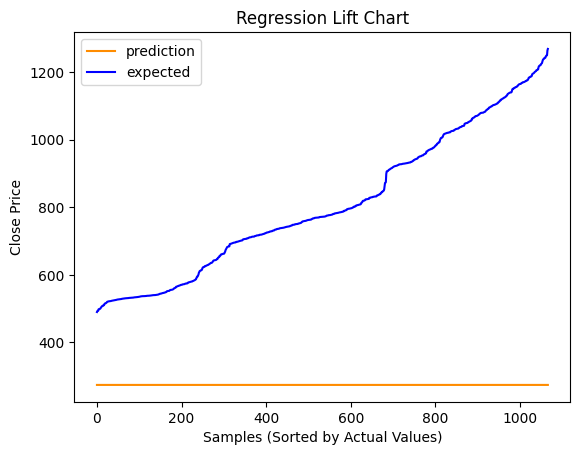

Lift Chart - With Volatility:


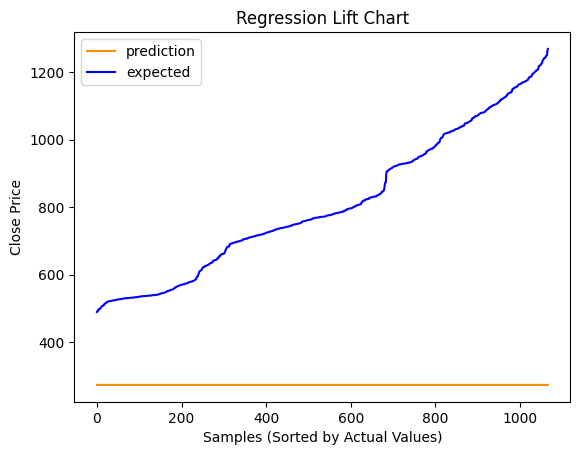

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility stats: \nRMSE: {rmse_no_vol:.4f}, \nR²: {r2_no_vol:.4f}, \nMAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility stats: \nRMSE: {rmse_with_vol:.4f}, \nR²: {r2_with_vol:.4f}, \nMAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Austin Nolte 11/4/24

#### Model 3: 4 Layers, Sigmoid Activation Function, Adam Optimizer


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Build model with no volatility (input = 7 days, 5 features)
model_no_vol = Sequential()

model_no_vol.add(LSTM(128, activation='sigmoid', return_sequences=True, input_shape=(7,5)))
model_no_vol.add(LSTM(64, activation='sigmoid', return_sequences=True))
model_no_vol.add(LSTM(32, activation='sigmoid', return_sequences=True))
model_no_vol.add(LSTM(16, activation='sigmoid', return_sequences=False))

model_no_vol.add(Dense(32, activation='sigmoid'))
model_no_vol.add(Dense(1))

model_no_vol.compile(loss='mean_squared_error', optimizer='adam')

# Build model with volatility (input = 7 days, 6 features)
model_with_vol = Sequential()
model_with_vol.add(LSTM(128, activation='sigmoid', return_sequences=True, input_shape=(7,6)))
model_with_vol.add(LSTM(64, activation='sigmoid', return_sequences=True))
model_with_vol.add(LSTM(32, activation='sigmoid', return_sequences=True))
model_with_vol.add(LSTM(16, activation='sigmoid', return_sequences=False))

model_with_vol.add(Dense(32, activation='sigmoid'))
model_with_vol.add(Dense(1))
model_with_vol.compile(loss='mean_squared_error', optimizer='adam')

# Early stopping and checkpointing for each model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Austin_LSTM_model_3_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Austin_LSTM_model_3_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
# Austin Nolte 11/4/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
# Train model without volatility
history_no_vol = model_no_vol.fit(X_train_no_vol, y_train_no_vol_seq,validation_data=(X_test_no_vol, y_test_no_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_no_vol, checkpoint_no_vol],verbose=2)

# Evaluate the model without volatility
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")

# Austin Nolte 11/4/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 694602.31250, saving model to Austin_LSTM_model_3_no_vol.keras
79/79 - 17s - 210ms/step - loss: 87433.7969 - val_loss: 694602.3125
Epoch 2/500

Epoch 2: val_loss improved from 694602.31250 to 690630.31250, saving model to Austin_LSTM_model_3_no_vol.keras
79/79 - 1s - 11ms/step - loss: 85818.1406 - val_loss: 690630.3125
Epoch 3/500

Epoch 3: val_loss improved from 690630.31250 to 687348.18750, saving model to Austin_LSTM_model_3_no_vol.keras
79/79 - 1s - 13ms/step - loss: 84642.2812 - val_loss: 687348.1875
Epoch 4/500

Epoch 4: val_loss improved from 687348.18750 to 684438.93750, saving model to Austin_LSTM_model_3_no_vol.keras
79/79 - 1s - 7ms/step - loss: 83615.5625 - val_loss: 684438.9375
Epoch 5/500

Epoch 5: val_loss improved from 684438.93750 to 681552.12500, saving model to Austin_LSTM_model_3_no_vol.keras
79/79 - 1s - 7ms/step - loss: 82660.8359 - val_loss: 681552.1250
Epoch 6/500

Epoch 6: val_loss improved from 681552.12500 t

In [ ]:
# Train model with volatility
history_with_vol = model_with_vol.fit(X_train_with_vol, y_train_with_vol_seq,validation_data=(X_test_with_vol, y_test_with_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_with_vol, checkpoint_with_vol],verbose=2)

# Evaluate the model with volatility
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (With Volatility): {loss_with_vol}")
# Austin Nolte 11/4/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 694958.31250, saving model to Austin_LSTM_model_3_with_vol.keras
79/79 - 31s - 396ms/step - loss: 87709.4766 - val_loss: 694958.3125
Epoch 2/500

Epoch 2: val_loss improved from 694958.31250 to 690180.56250, saving model to Austin_LSTM_model_3_with_vol.keras
79/79 - 1s - 15ms/step - loss: 85772.1016 - val_loss: 690180.5625
Epoch 3/500

Epoch 3: val_loss improved from 690180.56250 to 686765.50000, saving model to Austin_LSTM_model_3_with_vol.keras
79/79 - 1s - 15ms/step - loss: 84471.1094 - val_loss: 686765.5000
Epoch 4/500

Epoch 4: val_loss improved from 686765.50000 to 683693.81250, saving model to Austin_LSTM_model_3_with_vol.keras
79/79 - 1s - 13ms/step - loss: 83398.2266 - val_loss: 683693.8125
Epoch 5/500

Epoch 5: val_loss improved from 683693.81250 to 680854.68750, saving model to Austin_LSTM_model_3_with_vol.keras
79/79 - 1s - 15ms/step - loss: 82426.2031 - val_loss: 680854.6875
Epoch 6/500

Epoch 6: val_loss improved from 68

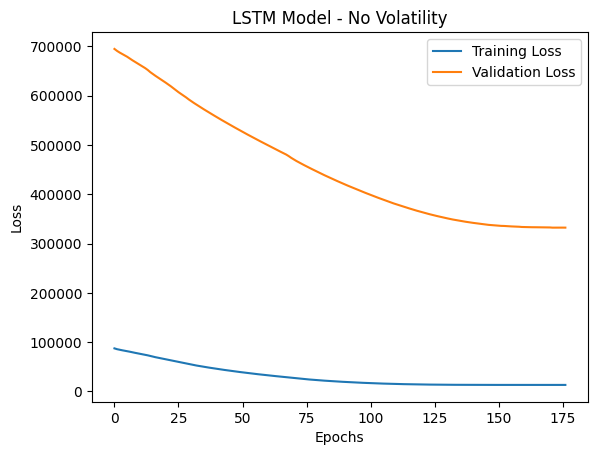

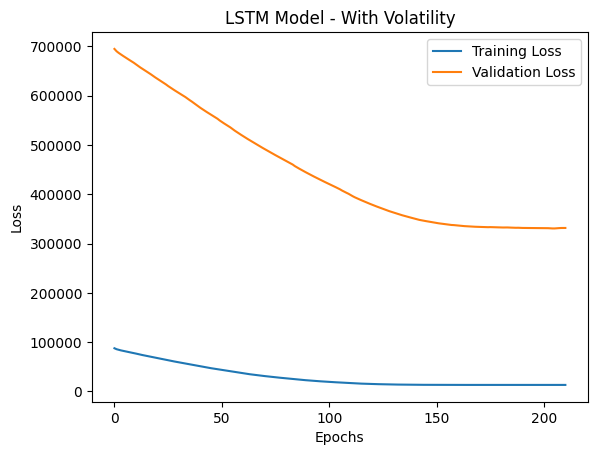

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "LSTM Model - No Volatility")
plot_loss(history_with_vol, "LSTM Model - With Volatility")

# Austin Nolte 11/4/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step
Model Without Volatility stats: 
RMSE: 576.3958, 
R²: -6.4637, 
MAPE: 63.8548%
Model With Volatility stats: 
RMSE: 575.1347, 
R²: -6.4311, 
MAPE: 63.6755%
Lift Chart - No Volatility:


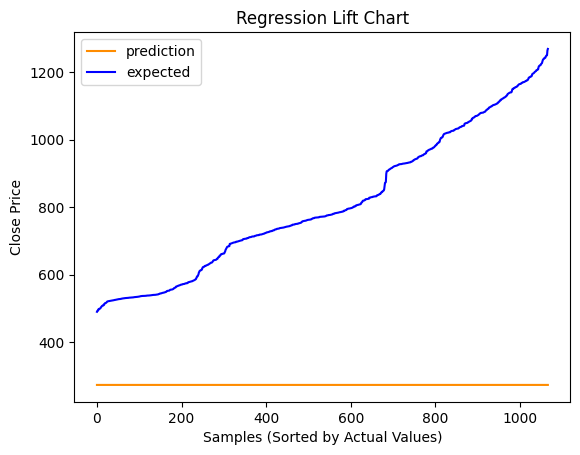

Lift Chart - With Volatility:


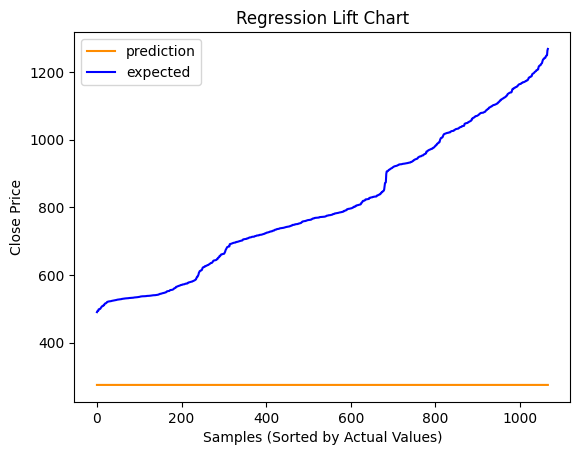

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility stats: \nRMSE: {rmse_no_vol:.4f}, \nR²: {r2_no_vol:.4f}, \nMAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility stats: \nRMSE: {rmse_with_vol:.4f}, \nR²: {r2_with_vol:.4f}, \nMAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Austin Nolte 11/4/24

#### Model 4: 3 Layers, Sigmoid Activation Function, sgd Optimizer


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Build model with no volatility (input = 7 days, 5 features)
model_no_vol = Sequential()

model_no_vol.add(LSTM(128, activation='sigmoid', return_sequences=True, input_shape=(7,5)))
model_no_vol.add(LSTM(64, activation='sigmoid', return_sequences=True))
model_no_vol.add(LSTM(32, activation='sigmoid', return_sequences=False))

model_no_vol.add(Dense(32, activation='sigmoid'))
model_no_vol.add(Dense(1))

model_no_vol.compile(loss='mean_squared_error', optimizer='sgd')

# Build model with volatility (input = 7 days, 5 features)
model_with_vol = Sequential()
model_with_vol.add(LSTM(128, activation='sigmoid', return_sequences=True, input_shape=(7,6)))
model_with_vol.add(LSTM(64, activation='sigmoid', return_sequences=True))
model_with_vol.add(LSTM(32, activation='sigmoid', return_sequences=False))

model_with_vol.add(Dense(32, activation='sigmoid'))
model_with_vol.add(Dense(1))
model_with_vol.compile(loss='mean_squared_error', optimizer='sgd')

# Early stopping and checkpointing for each model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Austin_LSTM_model_4_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Austin_LSTM_model_4_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
# Austin Nolte 11/4/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
# Train model without volatility
history_no_vol = model_no_vol.fit(X_train_no_vol, y_train_no_vol_seq,validation_data=(X_test_no_vol, y_test_no_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_no_vol, checkpoint_no_vol],verbose=2)

# Evaluate the model without volatility
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")

# Austin Nolte 11/4/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 374809.43750, saving model to Austin_LSTM_model_4_no_vol.keras
79/79 - 7s - 92ms/step - loss: 14927.3047 - val_loss: 374809.4375
Epoch 2/500

Epoch 2: val_loss did not improve from 374809.43750
79/79 - 5s - 60ms/step - loss: 13613.5059 - val_loss: 441100.4375
Epoch 3/500

Epoch 3: val_loss improved from 374809.43750 to 325887.68750, saving model to Austin_LSTM_model_4_no_vol.keras
79/79 - 0s - 6ms/step - loss: 13731.6367 - val_loss: 325887.6875
Epoch 4/500

Epoch 4: val_loss did not improve from 325887.68750
79/79 - 1s - 7ms/step - loss: 13566.5586 - val_loss: 358180.0625
Epoch 5/500

Epoch 5: val_loss did not improve from 325887.68750
79/79 - 0s - 5ms/step - loss: 13507.8643 - val_loss: 470143.6250
Epoch 6/500

Epoch 6: val_loss improved from 325887.68750 to 226830.25000, saving model to Austin_LSTM_model_4_no_vol.keras
79/79 - 1s - 6ms/step - loss: 13741.3730 - val_loss: 226830.2500
Epoch 7/500

Epoch 7: val_loss did not improve fro

In [ ]:
# Train model with volatility
history_with_vol = model_with_vol.fit(X_train_with_vol, y_train_with_vol_seq,validation_data=(X_test_with_vol, y_test_with_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_with_vol, checkpoint_with_vol],verbose=2)

# Evaluate the model with volatility
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (With Volatility): {loss_with_vol}")
# Austin Nolte 11/4/24

Epoch 1/500

Epoch 1: val_loss improved from inf to 473517.75000, saving model to Austin_LSTM_model_4_with_vol.keras
79/79 - 9s - 114ms/step - loss: 15580.6973 - val_loss: 473517.7500
Epoch 2/500

Epoch 2: val_loss improved from 473517.75000 to 354124.50000, saving model to Austin_LSTM_model_4_with_vol.keras
79/79 - 3s - 42ms/step - loss: 13709.1758 - val_loss: 354124.5000
Epoch 3/500

Epoch 3: val_loss improved from 354124.50000 to 303771.09375, saving model to Austin_LSTM_model_4_with_vol.keras
79/79 - 0s - 6ms/step - loss: 13638.8896 - val_loss: 303771.0938
Epoch 4/500

Epoch 4: val_loss did not improve from 303771.09375
79/79 - 1s - 8ms/step - loss: 13486.9365 - val_loss: 314091.2188
Epoch 5/500

Epoch 5: val_loss improved from 303771.09375 to 158283.20312, saving model to Austin_LSTM_model_4_with_vol.keras
79/79 - 1s - 7ms/step - loss: 13567.3525 - val_loss: 158283.2031
Epoch 6/500

Epoch 6: val_loss did not improve from 158283.20312
79/79 - 1s - 8ms/step - loss: 14221.6914 - val_

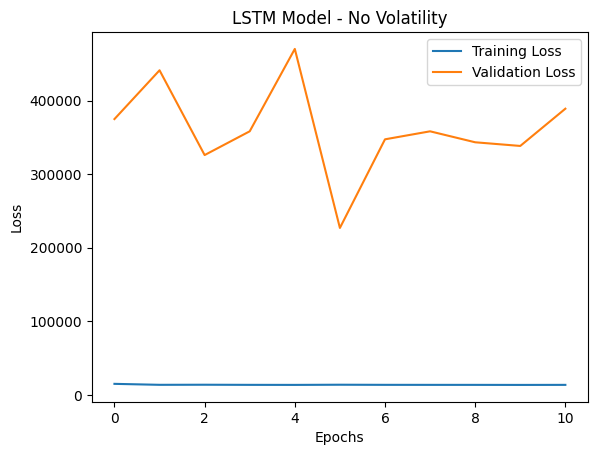

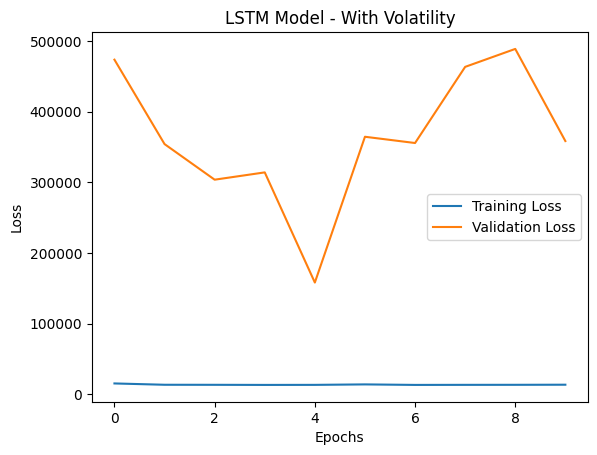

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "LSTM Model - No Volatility")
plot_loss(history_with_vol, "LSTM Model - With Volatility")

# Austin Nolte 11/4/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step
Model Without Volatility stats: 
RMSE: 476.2670, 
R²: -4.0958, 
MAPE: 49.3836%
Model With Volatility stats: 
RMSE: 397.8482, 
R²: -2.5559, 
MAPE: 37.5208%
Lift Chart - No Volatility:


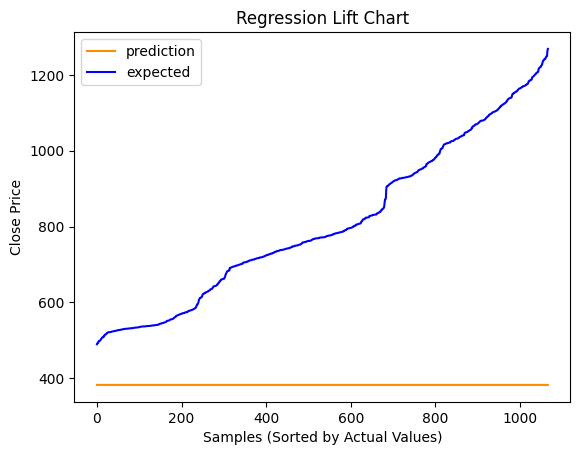

Lift Chart - With Volatility:


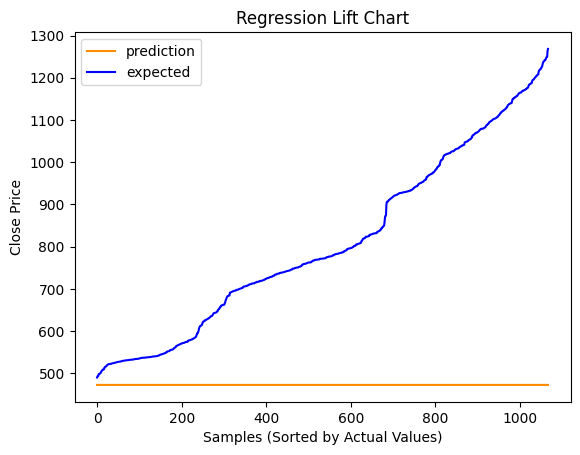

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility stats: \nRMSE: {rmse_no_vol:.4f}, \nR²: {r2_no_vol:.4f}, \nMAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility stats: \nRMSE: {rmse_with_vol:.4f}, \nR²: {r2_with_vol:.4f}, \nMAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Austin Nolte 11/4/24

#### Model 5: 5 Layers, Sigmoid Activation Function, sgd Optimizer


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Build model with no volatility (input = 7 days, 5 features)
model_no_vol = Sequential()

model_no_vol.add(LSTM(128, activation='sigmoid', return_sequences=True, input_shape=(7,5)))
model_no_vol.add(LSTM(64, return_sequences=True))
model_no_vol.add(LSTM(32, return_sequences=True))
model_no_vol.add(LSTM(16, return_sequences=True))
model_no_vol.add(LSTM(8, return_sequences=False))

model_no_vol.add(Dense(32))
model_no_vol.add(Dense(1))

model_no_vol.compile(loss='mean_squared_error', optimizer='sgd')

# Build model with volatility (input = 7 days, 6 features)
model_with_vol = Sequential()

model_with_vol.add(LSTM(128, activation='sigmoid', return_sequences=True, input_shape=(7,6)))
model_with_vol.add(LSTM(64, return_sequences=True))
model_with_vol.add(LSTM(32, return_sequences=True))
model_with_vol.add(LSTM(16, return_sequences=True))
model_with_vol.add(LSTM(8, return_sequences=False))

model_with_vol.add(Dense(32))
model_with_vol.add(Dense(1))

model_with_vol.compile(loss='mean_squared_error', optimizer='sgd')

# Early stopping and checkpointing for each model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Austin_LSTM_model_5_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Austin_LSTM_model_5_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
# Austin Nolte 11/4/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
# Train model without volatility
history_no_vol = model_no_vol.fit(X_train_no_vol, y_train_no_vol_seq,validation_data=(X_test_no_vol, y_test_no_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_no_vol, checkpoint_no_vol],verbose=2)

# Evaluate the model without volatility
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")

# Austin Nolte 11/4/24

Epoch 1/500

Epoch 1: val_loss did not improve from inf
79/79 - 3s - 42ms/step - loss: nan - val_loss: nan
Epoch 2/500

Epoch 2: val_loss did not improve from inf
79/79 - 1s - 16ms/step - loss: nan - val_loss: nan
Epoch 3/500

Epoch 3: val_loss did not improve from inf
79/79 - 1s - 19ms/step - loss: nan - val_loss: nan
Epoch 4/500

Epoch 4: val_loss did not improve from inf
79/79 - 3s - 40ms/step - loss: nan - val_loss: nan
Epoch 5/500

Epoch 5: val_loss did not improve from inf
79/79 - 2s - 30ms/step - loss: nan - val_loss: nan
Epoch 5: early stopping
Restoring model weights from the end of the best epoch: 1.
34/34 - 0s - 10ms/step - loss: nan

Test Loss (No Volatility): nan


In [ ]:
# Train model with volatility
history_with_vol = model_with_vol.fit(X_train_with_vol, y_train_with_vol_seq,validation_data=(X_test_with_vol, y_test_with_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_with_vol, checkpoint_with_vol],verbose=2)

# Evaluate the model with volatility
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (With Volatility): {loss_with_vol}")
# Austin Nolte 11/4/24

Epoch 1/500

Epoch 1: val_loss did not improve from inf
79/79 - 4s - 52ms/step - loss: nan - val_loss: nan
Epoch 2/500

Epoch 2: val_loss did not improve from inf
79/79 - 2s - 25ms/step - loss: nan - val_loss: nan
Epoch 3/500

Epoch 3: val_loss did not improve from inf
79/79 - 2s - 25ms/step - loss: nan - val_loss: nan
Epoch 4/500

Epoch 4: val_loss did not improve from inf
79/79 - 3s - 36ms/step - loss: nan - val_loss: nan
Epoch 5/500

Epoch 5: val_loss did not improve from inf
79/79 - 2s - 21ms/step - loss: nan - val_loss: nan
Epoch 5: early stopping
Restoring model weights from the end of the best epoch: 1.
34/34 - 0s - 6ms/step - loss: nan
Test Loss (With Volatility): nan


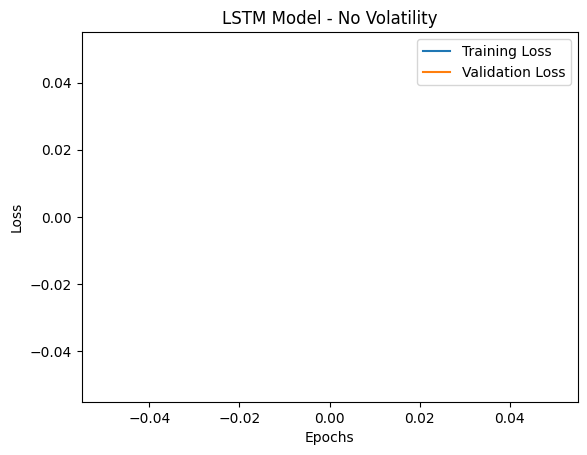

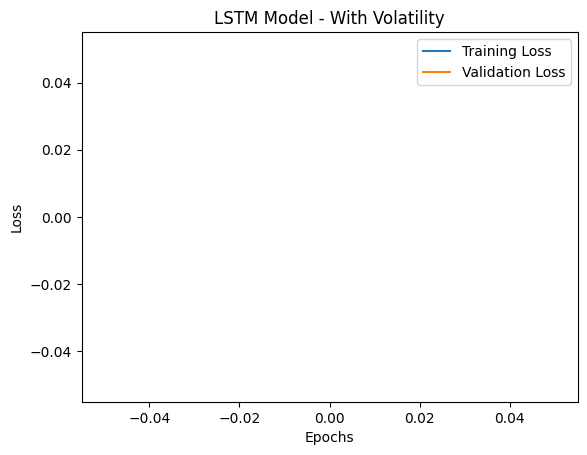

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "LSTM Model - No Volatility")
plot_loss(history_with_vol, "LSTM Model - With Volatility")

# Austin Nolte 11/4/24

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility stats: \nRMSE: {rmse_no_vol:.4f}, \nR²: {r2_no_vol:.4f}, \nMAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility stats: \nRMSE: {rmse_with_vol:.4f}, \nR²: {r2_with_vol:.4f}, \nMAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Austin Nolte 11/4/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 7s 205ms/step


ValueError: Input contains NaN.

#### Model 6: 7 Layers, Sigmoid Activation Function, sgd Optimizer


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Build model with no volatility (input = 7 days, 5 features)
model_no_vol = Sequential()

model_no_vol.add(LSTM(128, activation='sigmoid', return_sequences=True, input_shape=(7,5)))
model_no_vol.add(LSTM(64, return_sequences=True))
model_no_vol.add(LSTM(32, return_sequences=True))
model_no_vol.add(LSTM(16, return_sequences=True))
model_no_vol.add(LSTM(8, return_sequences=True))
model_no_vol.add(LSTM(4, return_sequences=True))
model_no_vol.add(LSTM(2, return_sequences=False))

model_no_vol.add(Dense(32))
model_no_vol.add(Dense(16))
model_no_vol.add(Dense(8))
model_no_vol.compile(loss='mean_squared_error', optimizer='sgd')

# Build model with volatility (input = 7 days, 6 features)
model_with_vol = Sequential()

model_with_vol.add(LSTM(128, activation='sigmoid', return_sequences=True, input_shape=(7,6)))
model_with_vol.add(LSTM(64, return_sequences=True))
model_with_vol.add(LSTM(32, return_sequences=True))
model_with_vol.add(LSTM(16, return_sequences=True))
model_with_vol.add(LSTM(8, return_sequences=True))
model_with_vol.add(LSTM(4, return_sequences=True))
model_with_vol.add(LSTM(2, return_sequences=False))

model_with_vol.add(Dense(32))
model_with_vol.add(Dense(16))
model_with_vol.add(Dense(8))
model_with_vol.compile(loss='mean_squared_error', optimizer='sgd')

# Early stopping and checkpointing for each model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Austin_LSTM_model_6_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Austin_LSTM_model_6_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)
# Austin Nolte 11/4/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
# Train model without volatility
history_no_vol = model_no_vol.fit(X_train_no_vol, y_train_no_vol_seq,validation_data=(X_test_no_vol, y_test_no_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_no_vol, checkpoint_no_vol],verbose=2)

# Evaluate the model without volatility
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")

# Austin Nolte 11/4/24

Epoch 1/500


InvalidArgumentError: Graph execution error:

Detected at node compile_loss/mean_squared_error/sub defined at (most recent call last):
  File "/usr/lib/python3.10/runpy.py", line 196, in _run_module_as_main

  File "/usr/lib/python3.10/runpy.py", line 86, in _run_code

  File "/usr/local/lib/python3.10/dist-packages/colab_kernel_launcher.py", line 37, in <module>

  File "/usr/local/lib/python3.10/dist-packages/traitlets/config/application.py", line 992, in launch_instance

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelapp.py", line 619, in start

  File "/usr/local/lib/python3.10/dist-packages/tornado/platform/asyncio.py", line 195, in start

  File "/usr/lib/python3.10/asyncio/base_events.py", line 603, in run_forever

  File "/usr/lib/python3.10/asyncio/base_events.py", line 1909, in _run_once

  File "/usr/lib/python3.10/asyncio/events.py", line 80, in _run

  File "/usr/local/lib/python3.10/dist-packages/tornado/ioloop.py", line 685, in <lambda>

  File "/usr/local/lib/python3.10/dist-packages/tornado/ioloop.py", line 738, in _run_callback

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 825, in inner

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 786, in run

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 361, in process_one

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 261, in dispatch_shell

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 539, in execute_request

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py", line 302, in do_execute

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/zmqshell.py", line 539, in run_cell

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 2975, in run_cell

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3030, in _run_cell

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/async_helpers.py", line 78, in _pseudo_sync_runner

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3257, in run_cell_async

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3473, in run_ast_nodes

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code

  File "<ipython-input-57-44d87e80e5e7>", line 2, in <cell line: 2>

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 318, in fit

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 121, in one_step_on_iterator

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 108, in one_step_on_data

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 54, in train_step

  File "/usr/local/lib/python3.10/dist-packages/keras/src/trainers/trainer.py", line 357, in _compute_loss

  File "/usr/local/lib/python3.10/dist-packages/keras/src/trainers/trainer.py", line 325, in compute_loss

  File "/usr/local/lib/python3.10/dist-packages/keras/src/trainers/compile_utils.py", line 609, in __call__

  File "/usr/local/lib/python3.10/dist-packages/keras/src/trainers/compile_utils.py", line 645, in call

  File "/usr/local/lib/python3.10/dist-packages/keras/src/losses/loss.py", line 43, in __call__

  File "/usr/local/lib/python3.10/dist-packages/keras/src/losses/losses.py", line 27, in call

  File "/usr/local/lib/python3.10/dist-packages/keras/src/losses/losses.py", line 1286, in mean_squared_error

required broadcastable shapes
	 [[{{node compile_loss/mean_squared_error/sub}}]] [Op:__inference_one_step_on_iterator_510997]

In [ ]:
# Train model with volatility
history_with_vol = model_with_vol.fit(X_train_with_vol, y_train_with_vol_seq,validation_data=(X_test_with_vol, y_test_with_vol_seq),epochs=500,batch_size=32,callbacks=[early_stopping_with_vol, checkpoint_with_vol],verbose=2)

# Evaluate the model with volatility
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (With Volatility): {loss_with_vol}")
# Austin Nolte 11/4/24

Epoch 1/500


InvalidArgumentError: Graph execution error:

Detected at node compile_loss/mean_squared_error/sub defined at (most recent call last):
  File "/usr/lib/python3.10/runpy.py", line 196, in _run_module_as_main

  File "/usr/lib/python3.10/runpy.py", line 86, in _run_code

  File "/usr/local/lib/python3.10/dist-packages/colab_kernel_launcher.py", line 37, in <module>

  File "/usr/local/lib/python3.10/dist-packages/traitlets/config/application.py", line 992, in launch_instance

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelapp.py", line 619, in start

  File "/usr/local/lib/python3.10/dist-packages/tornado/platform/asyncio.py", line 195, in start

  File "/usr/lib/python3.10/asyncio/base_events.py", line 603, in run_forever

  File "/usr/lib/python3.10/asyncio/base_events.py", line 1909, in _run_once

  File "/usr/lib/python3.10/asyncio/events.py", line 80, in _run

  File "/usr/local/lib/python3.10/dist-packages/tornado/ioloop.py", line 685, in <lambda>

  File "/usr/local/lib/python3.10/dist-packages/tornado/ioloop.py", line 738, in _run_callback

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 825, in inner

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 786, in run

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 361, in process_one

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 261, in dispatch_shell

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/kernelbase.py", line 539, in execute_request

  File "/usr/local/lib/python3.10/dist-packages/tornado/gen.py", line 234, in wrapper

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py", line 302, in do_execute

  File "/usr/local/lib/python3.10/dist-packages/ipykernel/zmqshell.py", line 539, in run_cell

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 2975, in run_cell

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3030, in _run_cell

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/async_helpers.py", line 78, in _pseudo_sync_runner

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3257, in run_cell_async

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3473, in run_ast_nodes

  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code

  File "<ipython-input-58-0e85640de41e>", line 2, in <cell line: 2>

  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 318, in fit

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 121, in one_step_on_iterator

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 108, in one_step_on_data

  File "/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py", line 54, in train_step

  File "/usr/local/lib/python3.10/dist-packages/keras/src/trainers/trainer.py", line 357, in _compute_loss

  File "/usr/local/lib/python3.10/dist-packages/keras/src/trainers/trainer.py", line 325, in compute_loss

  File "/usr/local/lib/python3.10/dist-packages/keras/src/trainers/compile_utils.py", line 609, in __call__

  File "/usr/local/lib/python3.10/dist-packages/keras/src/trainers/compile_utils.py", line 645, in call

  File "/usr/local/lib/python3.10/dist-packages/keras/src/losses/loss.py", line 43, in __call__

  File "/usr/local/lib/python3.10/dist-packages/keras/src/losses/losses.py", line 27, in call

  File "/usr/local/lib/python3.10/dist-packages/keras/src/losses/losses.py", line 1286, in mean_squared_error

required broadcastable shapes
	 [[{{node compile_loss/mean_squared_error/sub}}]] [Op:__inference_one_step_on_iterator_513260]

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "LSTM Model - No Volatility")
plot_loss(history_with_vol, "LSTM Model - With Volatility")

# Austin Nolte 11/4/24

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility stats: \nRMSE: {rmse_no_vol:.4f}, \nR²: {r2_no_vol:.4f}, \nMAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility stats: \nRMSE: {rmse_with_vol:.4f}, \nR²: {r2_with_vol:.4f}, \nMAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Austin Nolte 11/4/24

### LSTM Model Design and Testing (Alan Lei)

#### Model 1:

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the LSTM model
def build_lstm_model(input_shape):
  model = Sequential()

  # LSTM Layers
  model.add(LSTM(128, activation='tanh', return_sequences=True, input_shape=input_shape))
  model.add(Dropout(0.01))                 # Dropout layer
  model.add(LSTM(64, activation='tanh', return_sequences=True))
  model.add(LSTM(32, activation='tanh', return_sequences=True))
  model.add(LSTM(16, activation='tanh', return_sequences=False))

  # Dense Layers
  model.add(Dense(16))
  model.add(Dense(1))  # Output layer (no activation for regression)

  # Compile the model
  model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
  return model

# Build LSTM models for both datasets
model_no_vol_lstm = build_lstm_model((7, 5))  # No-volatility input: (7 days, 6 features)
model_with_vol_lstm = build_lstm_model((7, 6))  # With-volatility input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Alan_lstm_model_1_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Alan_lstm_model_1_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the LSTM model without volatility
history_no_vol_lstm = model_no_vol_lstm.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the LSTM model with volatility
history_with_vol_lstm = model_with_vol_lstm.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol_lstm = model_no_vol_lstm.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_lstm = model_with_vol_lstm.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

# Print the results
print(f"\nTest Loss (No Volatility - LSTM): {loss_no_vol_lstm}")
print(f"Test Loss (With Volatility - LSTM): {loss_with_vol_lstm}")

# Alan Lei 11-1-24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/1000

Epoch 1: val_loss improved from inf to 677058.50000, saving model to Alan_lstm_model_1_no_vol.keras
79/79 - 22s - 272ms/step - loss: 84857.5938 - val_loss: 677058.5000
Epoch 2/1000

Epoch 2: val_loss improved from 677058.50000 to 648470.81250, saving model to Alan_lstm_model_1_no_vol.keras
79/79 - 10s - 126ms/step - loss: 76462.7266 - val_loss: 648470.8125
Epoch 3/1000

Epoch 3: val_loss improved from 648470.81250 to 610890.87500, saving model to Alan_lstm_model_1_no_vol.keras
79/79 - 2s - 23ms/step - loss: 66221.2578 - val_loss: 610890.8750
Epoch 4/1000

Epoch 4: val_loss improved from 610890.87500 to 566838.93750, saving model to Alan_lstm_model_1_no_vol.keras
79/79 - 2s - 26ms/step - loss: 54451.8633 - val_loss: 566838.9375
Epoch 5/1000

Epoch 5: val_loss improved from 566838.93750 to 520313.53125, saving model to Alan_lstm_model_1_no_vol.keras
79/79 - 2s - 29ms/step - loss: 42696.7969 - val_loss: 520313.5312
Epoch 6/1000

Epoch 6: val_loss improved from 520313.53125 t

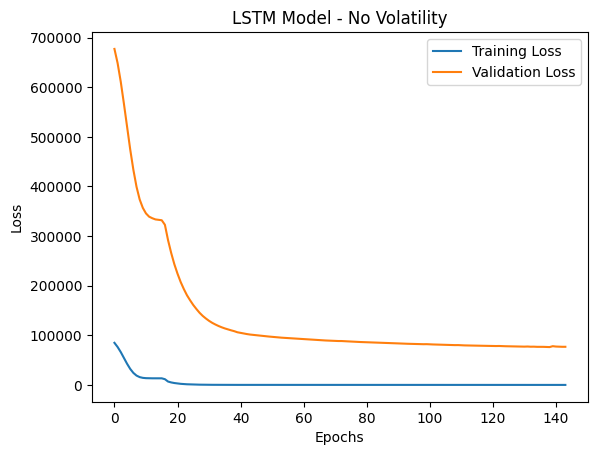

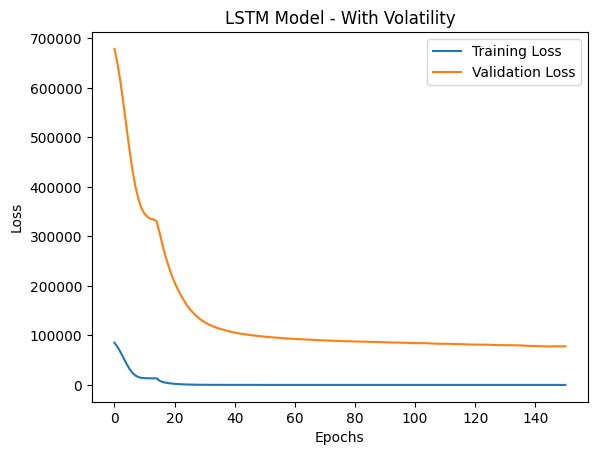

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# Plot training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both LSTM models
plot_loss(history_no_vol_lstm, "LSTM Model - No Volatility")
plot_loss(history_with_vol_lstm, "LSTM Model - With Volatility")


34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step

LSTM Model Without Volatility - RMSE: 276.1932, R²: -0.7137, MAPE: 22.2285%
LSTM Model With Volatility - RMSE: 278.6517, R²: -0.7444, MAPE: 21.6372%

Lift Chart - LSTM Model No Volatility:


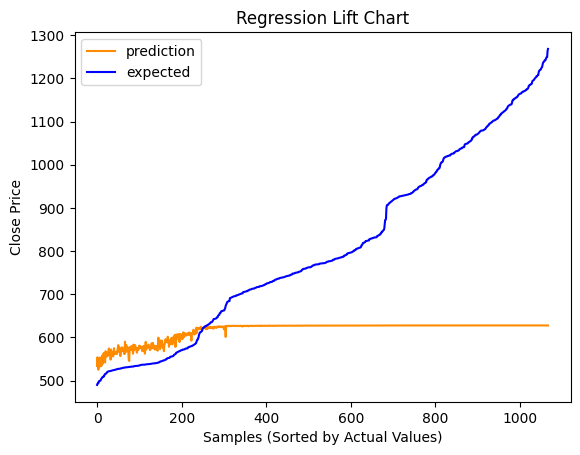

Lift Chart - LSTM Model With Volatility:


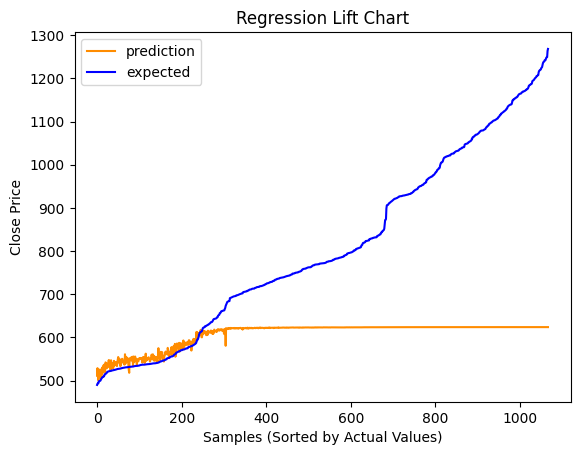

In [ ]:
# Function to calculate RMSE, R², and MAPE
def evaluate_model(model, X_test, y_test):
  y_pred = model.predict(X_test)

  rmse = np.sqrt(mean_squared_error(y_test, y_pred))
  r2 = r2_score(y_test, y_pred)
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Function to plot the regression lift chart
def chart_regression(pred, y, sort=True):
  t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
  if sort:
    t.sort_values(by=['y'], inplace=True)
  plt.plot(t['pred'].tolist(), label='prediction', color='darkorange')
  plt.plot(t['y'].tolist(), label='expected', color='blue')
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the LSTM models
y_pred_no_vol_lstm, rmse_no_vol_lstm, r2_no_vol_lstm, mape_no_vol_lstm = evaluate_model(
    model_no_vol_lstm, X_test_no_vol, y_test_no_vol_seq
)
y_pred_with_vol_lstm, rmse_with_vol_lstm, r2_with_vol_lstm, mape_with_vol_lstm = evaluate_model(
    model_with_vol_lstm, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics
print(f"\nLSTM Model Without Volatility - RMSE: {rmse_no_vol_lstm:.4f}, R²: {r2_no_vol_lstm:.4f}, MAPE: {mape_no_vol_lstm:.4%}")
print(f"LSTM Model With Volatility - RMSE: {rmse_with_vol_lstm:.4f}, R²: {r2_with_vol_lstm:.4f}, MAPE: {mape_with_vol_lstm:.4%}")

# Plot lift charts for both LSTM models
print("\nLift Chart - LSTM Model No Volatility:")
chart_regression(y_pred_no_vol_lstm, y_test_no_vol_seq)

print("Lift Chart - LSTM Model With Volatility:")
chart_regression(y_pred_with_vol_lstm, y_test_with_vol_seq)


#### Model 2:

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the LSTM model
def build_lstm_model(input_shape):
  model = Sequential()

  # LSTM Layers
  model.add(LSTM(512, activation='tanh', return_sequences=True, input_shape=input_shape))
  model.add(Dropout(0.01))                 # Dropout layer
  model.add(LSTM(256, activation='tanh', return_sequences=True))
  model.add(LSTM(128, activation='tanh', return_sequences=True))
  model.add(LSTM(64, activation='tanh', return_sequences=True))
  model.add(LSTM(32, activation='tanh', return_sequences=True))
  model.add(LSTM(16, activation='tanh', return_sequences=True))
  model.add(LSTM(8, activation='tanh', return_sequences=False))


  # Dense Layers
  model.add(Dense(32))
  model.add(Dense(16))
  model.add(Dense(8))
  model.add(Dense(1))  # Output layer (no activation for regression)

  # Compile the model
  model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
  return model

# Build LSTM models for both datasets
model_no_vol_lstm = build_lstm_model((7, 5))  # No-volatility input: (7 days, 5 features)
model_with_vol_lstm = build_lstm_model((7, 6))  # With-volatility input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Alan_lstm_model_2_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Alan_lstm_model_2_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the LSTM model without volatility
history_no_vol_lstm = model_no_vol_lstm.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the LSTM model with volatility
history_with_vol_lstm = model_with_vol_lstm.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol_lstm = model_no_vol_lstm.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_lstm = model_with_vol_lstm.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

# Print the results
print(f"\nTest Loss (No Volatility - LSTM): {loss_no_vol_lstm}")
print(f"Test Loss (With Volatility - LSTM): {loss_with_vol_lstm}")

# Alan Lei 11-1-24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/1000

Epoch 1: val_loss improved from inf to 616490.81250, saving model to Alan_lstm_model_2_no_vol.keras
79/79 - 7s - 91ms/step - loss: 81487.1641 - val_loss: 616490.8125
Epoch 2/1000

Epoch 2: val_loss improved from 616490.81250 to 321775.34375, saving model to Alan_lstm_model_2_no_vol.keras
79/79 - 2s - 24ms/step - loss: 27738.8457 - val_loss: 321775.3438
Epoch 3/1000

Epoch 3: val_loss did not improve from 321775.34375
79/79 - 1s - 16ms/step - loss: 13369.0488 - val_loss: 330284.5938
Epoch 4/1000

Epoch 4: val_loss did not improve from 321775.34375
79/79 - 3s - 34ms/step - loss: 13341.4258 - val_loss: 335707.7188
Epoch 5/1000

Epoch 5: val_loss did not improve from 321775.34375
79/79 - 1s - 13ms/step - loss: 13351.2666 - val_loss: 322674.9688
Epoch 6/1000

Epoch 6: val_loss did not improve from 321775.34375
79/79 - 1s - 16ms/step - loss: 13377.7021 - val_loss: 332125.1875
Epoch 7/1000

Epoch 7: val_loss improved from 321775.34375 to 181981.95312, saving model to Alan_lstm_m

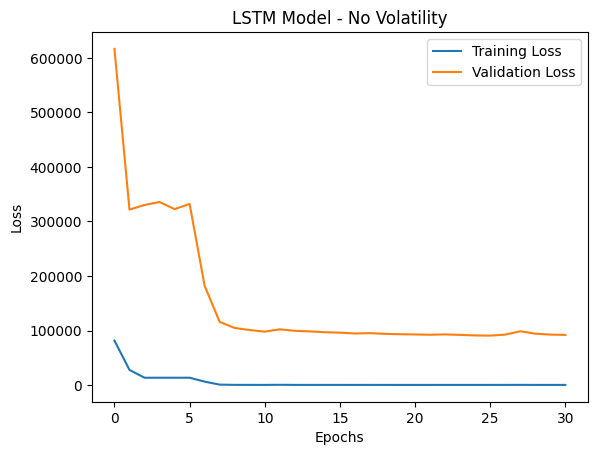

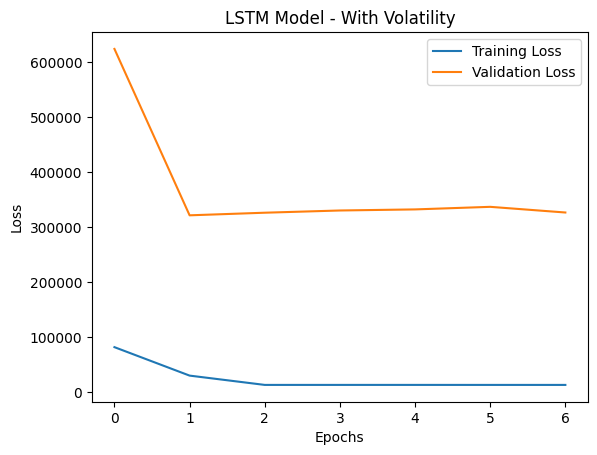

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# Plot training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both LSTM models
plot_loss(history_no_vol_lstm, "LSTM Model - No Volatility")
plot_loss(history_with_vol_lstm, "LSTM Model - With Volatility")


34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

LSTM Model Without Volatility - RMSE: 301.0399, R²: -1.0359, MAPE: 25.0592%
LSTM Model With Volatility - RMSE: 567.2416, R²: -6.2285, MAPE: 62.5520%

Lift Chart - LSTM Model No Volatility:


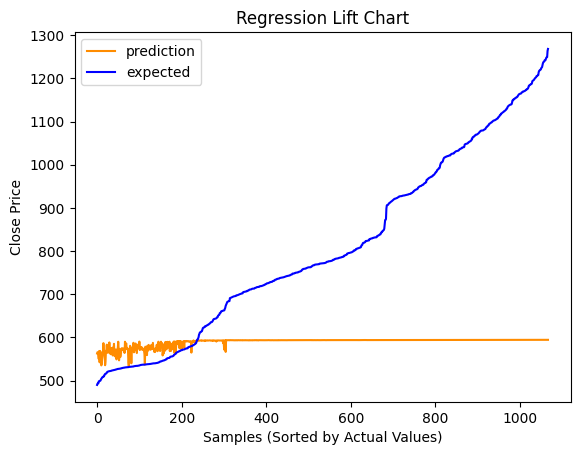

Lift Chart - LSTM Model With Volatility:


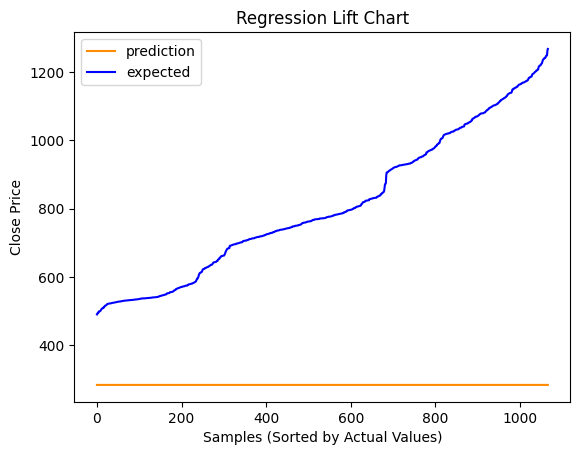

In [ ]:
# Function to calculate RMSE, R², and MAPE
def evaluate_model(model, X_test, y_test):
  y_pred = model.predict(X_test)

  rmse = np.sqrt(mean_squared_error(y_test, y_pred))
  r2 = r2_score(y_test, y_pred)
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Function to plot the regression lift chart
def chart_regression(pred, y, sort=True):
  t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
  if sort:
    t.sort_values(by=['y'], inplace=True)
  plt.plot(t['pred'].tolist(), label='prediction', color='darkorange')
  plt.plot(t['y'].tolist(), label='expected', color='blue')
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the LSTM models
y_pred_no_vol_lstm, rmse_no_vol_lstm, r2_no_vol_lstm, mape_no_vol_lstm = evaluate_model(
    model_no_vol_lstm, X_test_no_vol, y_test_no_vol_seq
)
y_pred_with_vol_lstm, rmse_with_vol_lstm, r2_with_vol_lstm, mape_with_vol_lstm = evaluate_model(
    model_with_vol_lstm, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics
print(f"\nLSTM Model Without Volatility - RMSE: {rmse_no_vol_lstm:.4f}, R²: {r2_no_vol_lstm:.4f}, MAPE: {mape_no_vol_lstm:.4%}")
print(f"LSTM Model With Volatility - RMSE: {rmse_with_vol_lstm:.4f}, R²: {r2_with_vol_lstm:.4f}, MAPE: {mape_with_vol_lstm:.4%}")

# Plot lift charts for both LSTM models
print("\nLift Chart - LSTM Model No Volatility:")
chart_regression(y_pred_no_vol_lstm, y_test_no_vol_seq)

print("Lift Chart - LSTM Model With Volatility:")
chart_regression(y_pred_with_vol_lstm, y_test_with_vol_seq)


#### Model 3:

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input, Dropout
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the LSTM model
def build_lstm_model(input_shape):
  model = Sequential()

  # LSTM Layers
  model.add(LSTM(256, activation='tanh', return_sequences=True, input_shape=input_shape))
  model.add(Dropout(0.01))                 # Dropout layer
  model.add(LSTM(64, activation='tanh', return_sequences=True))
  model.add(Dropout(0.01))                 # Dropout layer
  model.add(LSTM(32, activation='tanh', return_sequences=True))
  model.add(LSTM(16, activation='tanh', return_sequences=False))

  # Dense Layers
  model.add(Dense(16))
  model.add(Dense(1))  # Output layer (no activation for regression)

  # Compile the model
  model.compile(optimizer=SGD(learning_rate=0.01), loss='mean_squared_error')
  return model

# Build LSTM models for both datasets
model_no_vol_lstm = build_lstm_model((7, 5))  # No-volatility input: (7 days, 5 features)
model_with_vol_lstm = build_lstm_model((7, 6))  # With-volatility input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Alan_lstm_model_3_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Alan_lstm_model_3_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the LSTM model without volatility
history_no_vol_lstm = model_no_vol_lstm.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the LSTM model with volatility
history_with_vol_lstm = model_with_vol_lstm.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol_lstm = model_no_vol_lstm.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_lstm = model_with_vol_lstm.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

# Print the results
print(f"\nTest Loss (No Volatility - LSTM): {loss_no_vol_lstm}")
print(f"Test Loss (With Volatility - LSTM): {loss_with_vol_lstm}")

# Alan Lei 11-1-24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/1000

Epoch 1: val_loss did not improve from inf
79/79 - 3s - 39ms/step - loss: nan - val_loss: nan
Epoch 2/1000

Epoch 2: val_loss did not improve from inf
79/79 - 1s - 11ms/step - loss: nan - val_loss: nan
Epoch 3/1000

Epoch 3: val_loss did not improve from inf
79/79 - 1s - 10ms/step - loss: nan - val_loss: nan
Epoch 4/1000

Epoch 4: val_loss did not improve from inf
79/79 - 1s - 7ms/step - loss: nan - val_loss: nan
Epoch 5/1000

Epoch 5: val_loss did not improve from inf
79/79 - 1s - 7ms/step - loss: nan - val_loss: nan
Epoch 5: early stopping
Restoring model weights from the end of the best epoch: 1.
Epoch 1/1000

Epoch 1: val_loss did not improve from inf
79/79 - 2s - 24ms/step - loss: nan - val_loss: nan
Epoch 2/1000

Epoch 2: val_loss did not improve from inf
79/79 - 1s - 7ms/step - loss: nan - val_loss: nan
Epoch 3/1000

Epoch 3: val_loss did not improve from inf
79/79 - 1s - 7ms/step - loss: nan - val_loss: nan
Epoch 4/1000

Epoch 4: val_loss did not improve from inf


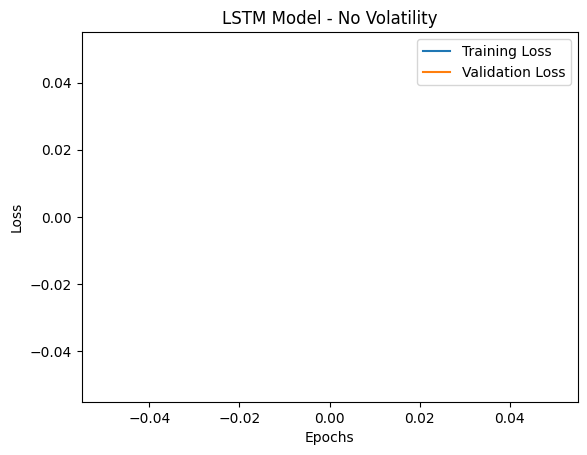

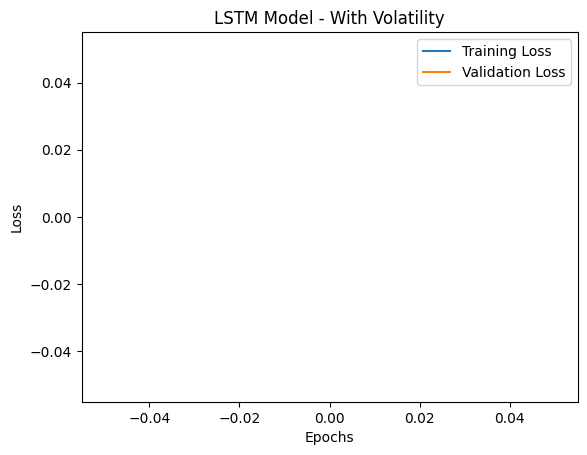

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# Plot training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both LSTM models
plot_loss(history_no_vol_lstm, "LSTM Model - No Volatility")
plot_loss(history_with_vol_lstm, "LSTM Model - With Volatility")


In [ ]:
# Function to calculate RMSE, R², and MAPE
def evaluate_model(model, X_test, y_test):
  y_pred = model.predict(X_test)

  rmse = np.sqrt(mean_squared_error(y_test, y_pred))
  r2 = r2_score(y_test, y_pred)
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Function to plot the regression lift chart
def chart_regression(pred, y, sort=True):
  t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
  if sort:
    t.sort_values(by=['y'], inplace=True)
  plt.plot(t['pred'].tolist(), label='prediction', color='darkorange')
  plt.plot(t['y'].tolist(), label='expected', color='blue')
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the LSTM models
y_pred_no_vol_lstm, rmse_no_vol_lstm, r2_no_vol_lstm, mape_no_vol_lstm = evaluate_model(
    model_no_vol_lstm, X_test_no_vol, y_test_no_vol_seq
)
y_pred_with_vol_lstm, rmse_with_vol_lstm, r2_with_vol_lstm, mape_with_vol_lstm = evaluate_model(
    model_with_vol_lstm, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics
print(f"\nLSTM Model Without Volatility - RMSE: {rmse_no_vol_lstm:.4f}, R²: {r2_no_vol_lstm:.4f}, MAPE: {mape_no_vol_lstm:.4%}")
print(f"LSTM Model With Volatility - RMSE: {rmse_with_vol_lstm:.4f}, R²: {r2_with_vol_lstm:.4f}, MAPE: {mape_with_vol_lstm:.4%}")

# Plot lift charts for both LSTM models
print("\nLift Chart - LSTM Model No Volatility:")
chart_regression(y_pred_no_vol_lstm, y_test_no_vol_seq)

print("Lift Chart - LSTM Model With Volatility:")
chart_regression(y_pred_with_vol_lstm, y_test_with_vol_seq)


34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step


ValueError: Input contains NaN.

#### Model 4:

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input, Dropout
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the LSTM model
def build_lstm_model(input_shape):
  model = Sequential()

  # LSTM Layers
  model.add(LSTM(512, activation='tanh', return_sequences=True, input_shape=input_shape))
  model.add(Dropout(0.01))                 # Dropout layer
  model.add(LSTM(128, activation='tanh', return_sequences=True))
  model.add(LSTM(32, activation='tanh', return_sequences=True))
  model.add(Dropout(0.01))
  model.add(LSTM(8, activation='tanh', return_sequences=False))

  # Dense Layers
  model.add(Dense(64))
  model.add(Dense(16))
  model.add(Dense(4))
  model.add(Dense(1))  # Output layer (no activation for regression)

  # Compile the model
  model.compile(optimizer=Adam(learning_rate=0.0001), loss='mean_squared_error')
  return model

# Build LSTM models for both datasets
model_no_vol_lstm = build_lstm_model((7, 5))  # No-volatility input: (7 days, 5 features)
model_with_vol_lstm = build_lstm_model((7, 6))  # With-volatility input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Alan_lstm_model_4_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Alan_lstm_model_4_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the LSTM model without volatility
history_no_vol_lstm = model_no_vol_lstm.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the LSTM model with volatility
history_with_vol_lstm = model_with_vol_lstm.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol_lstm = model_no_vol_lstm.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_lstm = model_with_vol_lstm.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

# Print the results
print(f"\nTest Loss (No Volatility - LSTM): {loss_no_vol_lstm}")
print(f"Test Loss (With Volatility - LSTM): {loss_with_vol_lstm}")

# Alan Lei 11-1-24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/1000

Epoch 1: val_loss improved from inf to 694969.56250, saving model to Alan_lstm_model_4_no_vol.keras
79/79 - 5s - 59ms/step - loss: 87846.1797 - val_loss: 694969.5625
Epoch 2/1000

Epoch 2: val_loss improved from 694969.56250 to 686161.68750, saving model to Alan_lstm_model_4_no_vol.keras
79/79 - 1s - 12ms/step - loss: 85358.5547 - val_loss: 686161.6875
Epoch 3/1000

Epoch 3: val_loss improved from 686161.68750 to 673503.06250, saving model to Alan_lstm_model_4_no_vol.keras
79/79 - 1s - 14ms/step - loss: 81839.6250 - val_loss: 673503.0625
Epoch 4/1000

Epoch 4: val_loss improved from 673503.06250 to 656123.50000, saving model to Alan_lstm_model_4_no_vol.keras
79/79 - 1s - 19ms/step - loss: 76992.0391 - val_loss: 656123.5000
Epoch 5/1000

Epoch 5: val_loss improved from 656123.50000 to 633367.43750, saving model to Alan_lstm_model_4_no_vol.keras
79/79 - 2s - 27ms/step - loss: 70723.9141 - val_loss: 633367.4375
Epoch 6/1000

Epoch 6: val_loss improved from 633367.43750 to 60

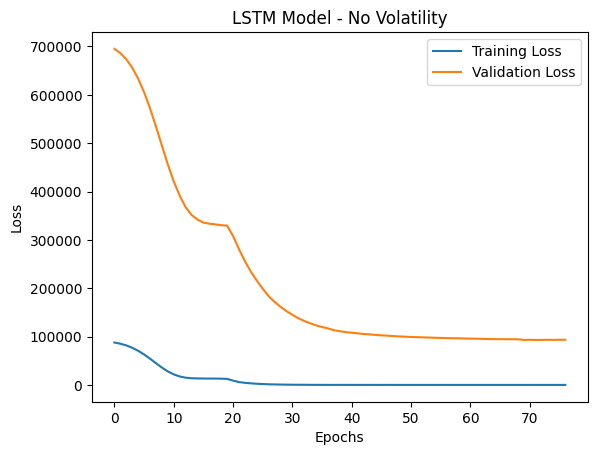

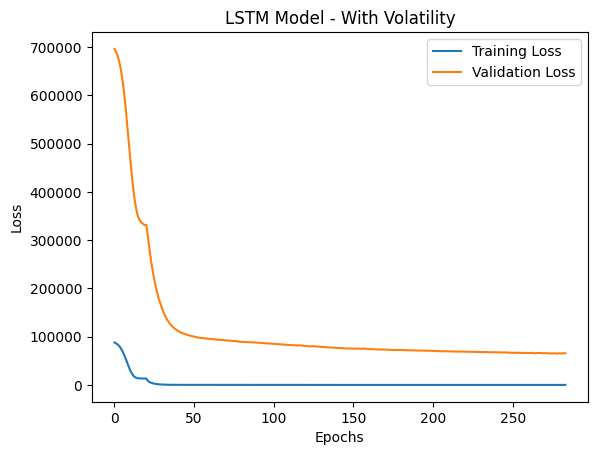

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# Plot training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both LSTM models
plot_loss(history_no_vol_lstm, "LSTM Model - No Volatility")
plot_loss(history_with_vol_lstm, "LSTM Model - With Volatility")


34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step

LSTM Model Without Volatility - RMSE: 305.0626, R²: -1.0907, MAPE: 24.8206%
LSTM Model With Volatility - RMSE: 254.9712, R²: -0.4605, MAPE: 19.0981%

Lift Chart - LSTM Model No Volatility:


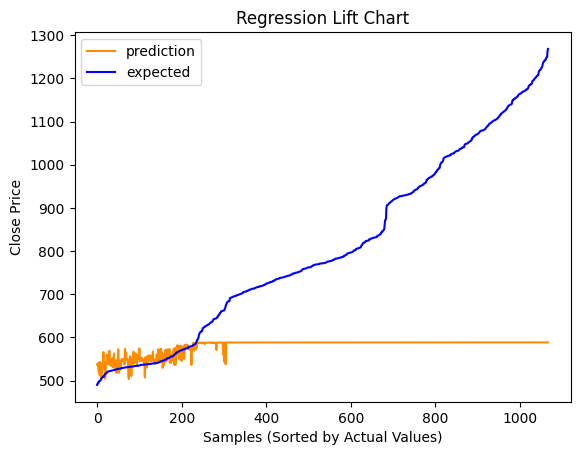

Lift Chart - LSTM Model With Volatility:


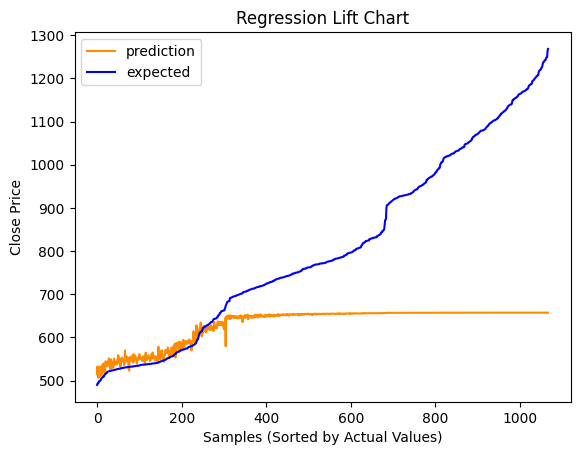

In [ ]:
# Function to calculate RMSE, R², and MAPE
def evaluate_model(model, X_test, y_test):
  y_pred = model.predict(X_test)

  rmse = np.sqrt(mean_squared_error(y_test, y_pred))
  r2 = r2_score(y_test, y_pred)
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Function to plot the regression lift chart
def chart_regression(pred, y, sort=True):
  t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
  if sort:
    t.sort_values(by=['y'], inplace=True)
  plt.plot(t['pred'].tolist(), label='prediction', color='darkorange')
  plt.plot(t['y'].tolist(), label='expected', color='blue')
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the LSTM models
y_pred_no_vol_lstm, rmse_no_vol_lstm, r2_no_vol_lstm, mape_no_vol_lstm = evaluate_model(
    model_no_vol_lstm, X_test_no_vol, y_test_no_vol_seq
)
y_pred_with_vol_lstm, rmse_with_vol_lstm, r2_with_vol_lstm, mape_with_vol_lstm = evaluate_model(
    model_with_vol_lstm, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics
print(f"\nLSTM Model Without Volatility - RMSE: {rmse_no_vol_lstm:.4f}, R²: {r2_no_vol_lstm:.4f}, MAPE: {mape_no_vol_lstm:.4%}")
print(f"LSTM Model With Volatility - RMSE: {rmse_with_vol_lstm:.4f}, R²: {r2_with_vol_lstm:.4f}, MAPE: {mape_with_vol_lstm:.4%}")

# Plot lift charts for both LSTM models
print("\nLift Chart - LSTM Model No Volatility:")
chart_regression(y_pred_no_vol_lstm, y_test_no_vol_seq)

print("Lift Chart - LSTM Model With Volatility:")
chart_regression(y_pred_with_vol_lstm, y_test_with_vol_seq)


#### Model 5:

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input, Dropout
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the LSTM model
def build_lstm_model(input_shape):
  model = Sequential()

  # LSTM Layers
  model.add(LSTM(100, activation='tanh', return_sequences=True, input_shape=input_shape))
  model.add(Dropout(0.01))                 # Dropout layer
  model.add(LSTM(90, activation='tanh', return_sequences=True))
  model.add(LSTM(80, activation='tanh', return_sequences=True))
  model.add(LSTM(70, activation='tanh', return_sequences=True))
  model.add(LSTM(60, activation='tanh', return_sequences=True))
  model.add(LSTM(50, activation='tanh', return_sequences=True))
  model.add(LSTM(40, activation='tanh', return_sequences=True))
  model.add(LSTM(30, activation='tanh', return_sequences=True))
  model.add(LSTM(20, activation='tanh', return_sequences=True))
  model.add(LSTM(10, activation='tanh', return_sequences=False))

  # Dense Layers
  model.add(Dense(128))
  model.add(Dense(32))
  model.add(Dense(1))  # Output layer (no activation for regression)

  # Compile the model
  model.compile(optimizer=Adam(learning_rate=0.0011), loss='mean_squared_error')
  return model

# Build LSTM models for both datasets
model_no_vol_lstm = build_lstm_model((7, 5))  # No-volatility input: (7 days, 5 features)
model_with_vol_lstm = build_lstm_model((7, 6))  # With-volatility input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Alan_lstm_model_5_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Alan_lstm_model_5_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the LSTM model without volatility
history_no_vol_lstm = model_no_vol_lstm.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the LSTM model with volatility
history_with_vol_lstm = model_with_vol_lstm.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol_lstm = model_no_vol_lstm.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_lstm = model_with_vol_lstm.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

# Print the results
print(f"\nTest Loss (No Volatility - LSTM): {loss_no_vol_lstm}")
print(f"Test Loss (With Volatility - LSTM): {loss_with_vol_lstm}")

# Alan Lei 11-1-24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/1000

Epoch 1: val_loss improved from inf to 420565.78125, saving model to Alan_lstm_model_5_no_vol.keras
79/79 - 10s - 124ms/step - loss: 67566.8672 - val_loss: 420565.7812
Epoch 2/1000

Epoch 2: val_loss improved from 420565.78125 to 328037.25000, saving model to Alan_lstm_model_5_no_vol.keras
79/79 - 1s - 18ms/step - loss: 13602.5322 - val_loss: 328037.2500
Epoch 3/1000

Epoch 3: val_loss did not improve from 328037.25000
79/79 - 1s - 16ms/step - loss: 13398.7764 - val_loss: 332285.7812
Epoch 4/1000

Epoch 4: val_loss did not improve from 328037.25000
79/79 - 1s - 16ms/step - loss: 13363.2969 - val_loss: 333464.0625
Epoch 5/1000

Epoch 5: val_loss improved from 328037.25000 to 326929.31250, saving model to Alan_lstm_model_5_no_vol.keras
79/79 - 1s - 17ms/step - loss: 13391.3516 - val_loss: 326929.3125
Epoch 6/1000

Epoch 6: val_loss did not improve from 326929.31250
79/79 - 1s - 16ms/step - loss: 13349.0693 - val_loss: 336342.0000
Epoch 7/1000

Epoch 7: val_loss did not impr

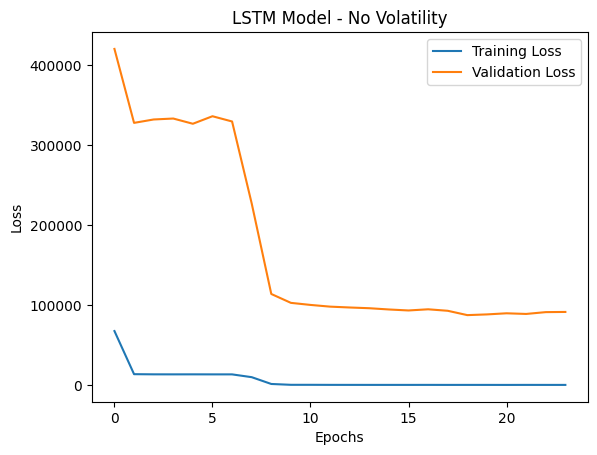

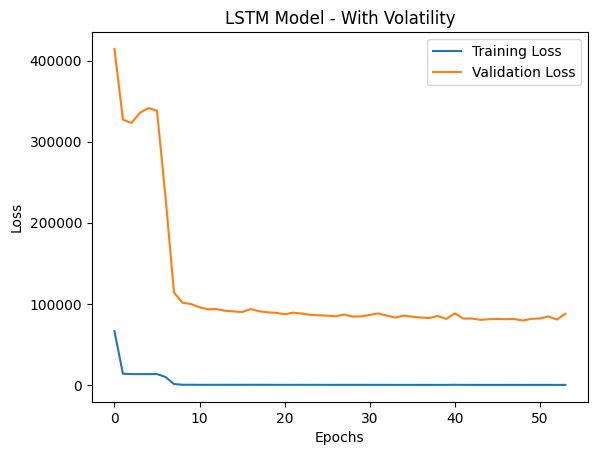

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# Plot training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both LSTM models
plot_loss(history_no_vol_lstm, "LSTM Model - No Volatility")
plot_loss(history_with_vol_lstm, "LSTM Model - With Volatility")


34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

LSTM Model Without Volatility - RMSE: 295.7802, R²: -0.9654, MAPE: 24.0015%
LSTM Model With Volatility - RMSE: 281.8066, R²: -0.7841, MAPE: 22.5914%

Lift Chart - LSTM Model No Volatility:


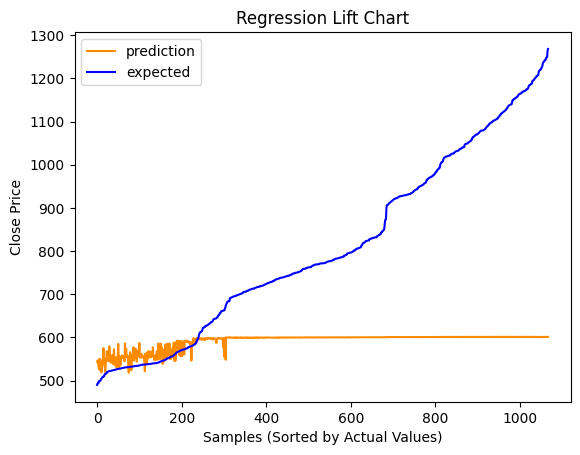

Lift Chart - LSTM Model With Volatility:


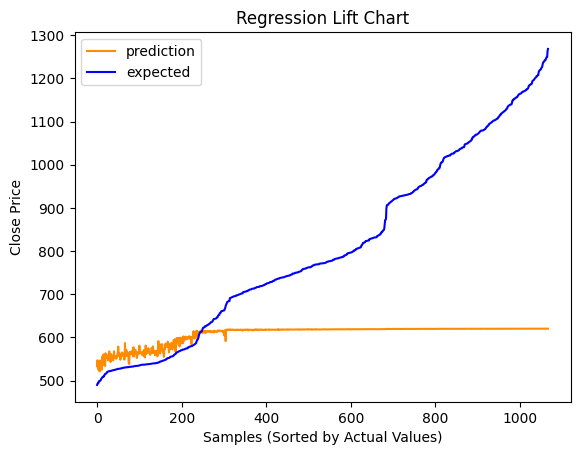

In [ ]:
# Function to calculate RMSE, R², and MAPE
def evaluate_model(model, X_test, y_test):
  y_pred = model.predict(X_test)

  rmse = np.sqrt(mean_squared_error(y_test, y_pred))
  r2 = r2_score(y_test, y_pred)
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Function to plot the regression lift chart
def chart_regression(pred, y, sort=True):
  t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
  if sort:
    t.sort_values(by=['y'], inplace=True)
  plt.plot(t['pred'].tolist(), label='prediction', color='darkorange')
  plt.plot(t['y'].tolist(), label='expected', color='blue')
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the LSTM models
y_pred_no_vol_lstm, rmse_no_vol_lstm, r2_no_vol_lstm, mape_no_vol_lstm = evaluate_model(
    model_no_vol_lstm, X_test_no_vol, y_test_no_vol_seq
)
y_pred_with_vol_lstm, rmse_with_vol_lstm, r2_with_vol_lstm, mape_with_vol_lstm = evaluate_model(
    model_with_vol_lstm, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics
print(f"\nLSTM Model Without Volatility - RMSE: {rmse_no_vol_lstm:.4f}, R²: {r2_no_vol_lstm:.4f}, MAPE: {mape_no_vol_lstm:.4%}")
print(f"LSTM Model With Volatility - RMSE: {rmse_with_vol_lstm:.4f}, R²: {r2_with_vol_lstm:.4f}, MAPE: {mape_with_vol_lstm:.4%}")

# Plot lift charts for both LSTM models
print("\nLift Chart - LSTM Model No Volatility:")
chart_regression(y_pred_no_vol_lstm, y_test_no_vol_seq)

print("Lift Chart - LSTM Model With Volatility:")
chart_regression(y_pred_with_vol_lstm, y_test_with_vol_seq)


### LSTM Model Design and Testing (Nishan Majarjan)

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the enhanced LSTM model
def build_enhanced_lstm_model(input_shape):
    model = Sequential()

    # First LSTM Layer with Dropout
    model.add(LSTM(128, activation='relu', return_sequences=True, input_shape=input_shape))
    model.add(Dropout(0.3))  # Dropout for regularization

    # Second LSTM Layer with Dropout
    model.add(LSTM(64, activation='relu', return_sequences=True))
    model.add(Dropout(0.3))

    # Third LSTM Layer
    model.add(LSTM(32, activation='relu', return_sequences=False))
    model.add(Dropout(0.3))

    # Dense Layers
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(1))  # Output layer (no activation for regression)

    # Compile the model
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
    return model

# Build enhanced LSTM models for both datasets
model_no_vol_lstm_enhanced = build_enhanced_lstm_model((7, 5))  # No-volatility input: (7 days, 5 features)
model_with_vol_lstm_enhanced = build_enhanced_lstm_model((7, 6))  # With-volatility input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("enhanced_lstm_model_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("enhanced_lstm_model_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the enhanced LSTM model without volatility
history_no_vol_lstm_enhanced = model_no_vol_lstm_enhanced.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the enhanced LSTM model with volatility
history_with_vol_lstm_enhanced = model_with_vol_lstm_enhanced.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol_lstm_enhanced = model_no_vol_lstm_enhanced.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_lstm_enhanced = model_with_vol_lstm_enhanced.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

# Print the results
print(f"\nTest Loss (No Volatility - Enhanced LSTM): {loss_no_vol_lstm_enhanced}")
print(f"Test Loss (With Volatility - Enhanced LSTM): {loss_with_vol_lstm_enhanced}")
#Nishan Maharjan 11/04/2024

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/1000

Epoch 1: val_loss improved from inf to 185737.31250, saving model to enhanced_lstm_model_no_vol.keras
79/79 - 17s - 218ms/step - loss: 43985.2188 - val_loss: 185737.3125
Epoch 2/1000

Epoch 2: val_loss improved from 185737.31250 to 71828.17969, saving model to enhanced_lstm_model_no_vol.keras
79/79 - 0s - 6ms/step - loss: 5583.0684 - val_loss: 71828.1797
Epoch 3/1000

Epoch 3: val_loss improved from 71828.17969 to 33734.71875, saving model to enhanced_lstm_model_no_vol.keras
79/79 - 1s - 7ms/step - loss: 4667.9639 - val_loss: 33734.7188
Epoch 4/1000

Epoch 4: val_loss did not improve from 33734.71875
79/79 - 0s - 5ms/step - loss: 4275.4434 - val_loss: 35314.7148
Epoch 5/1000

Epoch 5: val_loss did not improve from 33734.71875
79/79 - 0s - 5ms/step - loss: 3803.1663 - val_loss: 37419.2383
Epoch 6/1000

Epoch 6: val_loss improved from 33734.71875 to 17300.77930, saving model to enhanced_lstm_model_no_vol.keras
79/79 - 0s - 6ms/step - loss: 3896.4246 - val_loss: 17300.7793
E

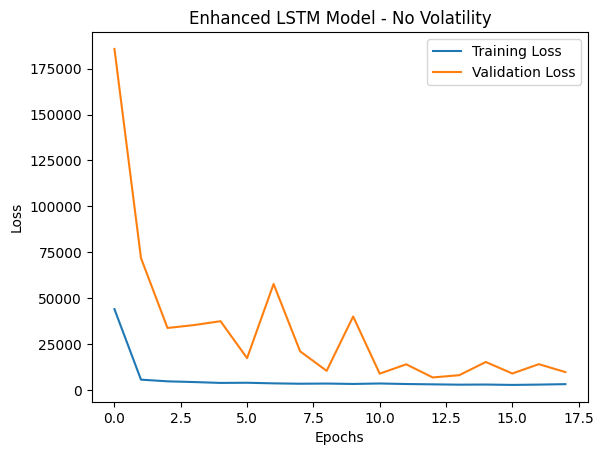

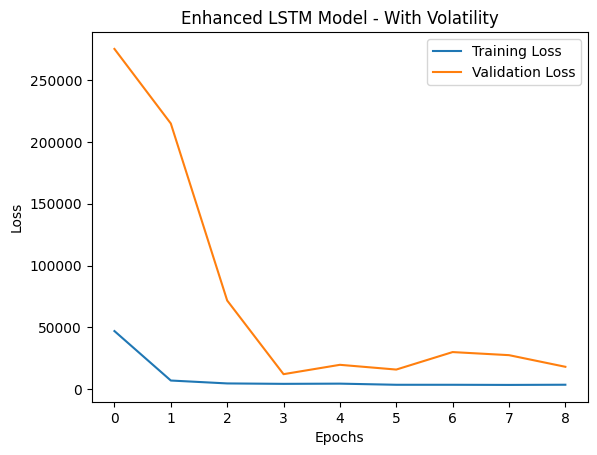

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# Plot training and validation loss for both models
def plot_loss(history, title):
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

# Plot loss for both LSTM models
plot_loss(history_no_vol_lstm_enhanced, "Enhanced LSTM Model - No Volatility")
plot_loss(history_with_vol_lstm_enhanced, "Enhanced LSTM Model - With Volatility")
#Nishan Maharjan 11/04/2024

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step
Model Without Volatility stats: 
RMSE: 82.3535, 
R²: 0.8476, 
MAPE: 8.7700%
Model With Volatility stats: 
RMSE: 110.3401, 
R²: 0.7265, 
MAPE: 14.3239%
Lift Chart - No Volatility:


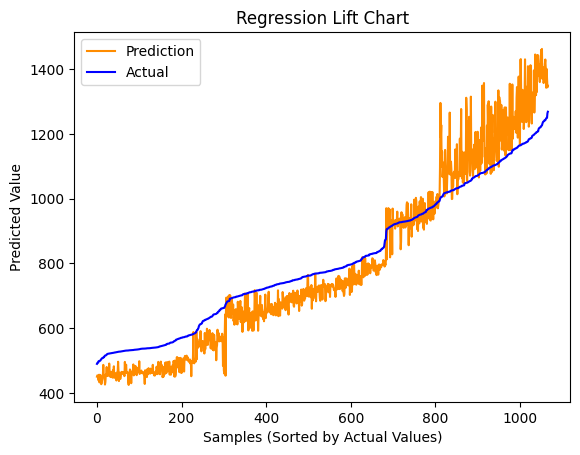

Lift Chart - With Volatility:


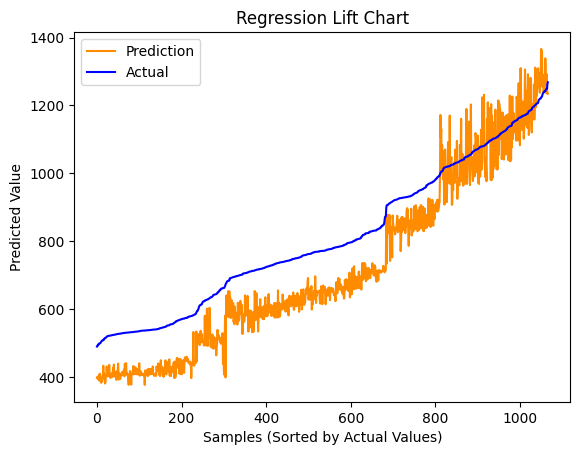

In [ ]:
# Function to calculate RMSE, R², and MAPE
def evaluate_model_lstm(model, X_test, y_test):
    # Predict using the trained model
    y_pred = model.predict(X_test)

    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))

    # Calculate R² score
    r2 = r2_score(y_test, y_pred)

    # Calculate MAPE
    mape = mean_absolute_percentage_error(y_test, y_pred)

    return y_pred, rmse, r2, mape

# Regression chart function
def chart_regression_lstm(pred, y, sort=True):
    t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
    if sort:
        t.sort_values(by=['y'], inplace=True)
    plt.plot(t['pred'].tolist(), label='Prediction', color='darkorange')
    plt.plot(t['y'].tolist(), label='Actual', color='blue')
    # Add labels, title, and legend
    plt.ylabel('Predicted Value')
    plt.xlabel('Samples (Sorted by Actual Values)')
    plt.title('Regression Lift Chart')
    plt.legend()
    plt.show()

# Evaluate the no-volatility LSTM model
y_pred_no_vol_lstm, rmse_no_vol_lstm, r2_no_vol_lstm, mape_no_vol_lstm = evaluate_model_lstm(model_no_vol_lstm_enhanced, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility LSTM model
y_pred_with_vol_lstm, rmse_with_vol_lstm, r2_with_vol_lstm, mape_with_vol_lstm = evaluate_model_lstm(model_with_vol_lstm_enhanced, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility stats: \nRMSE: {rmse_no_vol_lstm:.4f}, \nR²: {r2_no_vol_lstm:.4f}, \nMAPE: {mape_no_vol_lstm:.4%}")
print(f"Model With Volatility stats: \nRMSE: {rmse_with_vol_lstm:.4f}, \nR²: {r2_with_vol_lstm:.4f}, \nMAPE: {mape_with_vol_lstm:.4%}")

# Plot regression charts for both models
print("Lift Chart - No Volatility:")
chart_regression_lstm(y_pred_no_vol_lstm, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression_lstm(y_pred_with_vol_lstm, y_test_with_vol_seq)
#Nishan Maharjan 11/04/2024

## Our Best Models

### FNN

#### Model 5: 7 Layers, ReLU Activation Function, Adam Optimizer

This Feedforward Neural Network (FNN) model includes a flattened input layer, seven dense hidden layers with ReLU activation, and a final dense output layer for regression. The ReLU activation function helps capture non-linear relationships between features. We used the Adam optimizer with a learning rate of 0.001 to efficiently minimize the mean squared error, making this model suitable for continuous output prediction tasks.


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the FNN model
def build_fnn_model(input_shape):
  model = Sequential()
  model.add(Flatten(input_shape=input_shape))  # Flatten the input
  model.add(Dense(1024, activation='relu'))      # Hidden layer 1
  model.add(Dense(512, activation='relu'))      # Hidden layer 1
  model.add(Dense(256, activation='relu'))      # Hidden layer 1
  model.add(Dense(128, activation='relu'))      # Hidden layer 1
  model.add(Dense(64, activation='relu'))      # Hidden layer 1
  model.add(Dense(32, activation='relu'))      # Hidden layer 1
  model.add(Dense(16, activation='relu'))      # Hidden layer 2
  model.add(Dense(1))                          # Output layer (no activation for regression)
  model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
  return model

# Build FNN models for both datasets
model_no_vol = build_fnn_model((7, 5))  # No-volatility model input: (7 days, 5 features)
model_with_vol = build_fnn_model((7, 6))  # With-volatility model input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("tyler_fnn_model_5_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("tyler_fnn_model_5_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the FNN model without volatility
history_no_vol = model_no_vol.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the FNN model with volatility
history_with_vol = model_with_vol.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol = model_no_vol.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol = model_with_vol.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"\nTest Loss (No Volatility): {loss_no_vol}")
print(f"Test Loss (With Volatility): {loss_with_vol}")

## Tyler Burguillos 10/29/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/500

Epoch 1: val_loss improved from inf to 1142.83020, saving model to tyler_fnn_model_5_no_vol.keras
79/79 - 4s - 48ms/step - loss: 21538.3613 - val_loss: 1142.8302
Epoch 2/500

Epoch 2: val_loss did not improve from 1142.83020
79/79 - 3s - 39ms/step - loss: 107.8353 - val_loss: 1862.5012
Epoch 3/500

Epoch 3: val_loss improved from 1142.83020 to 467.05197, saving model to tyler_fnn_model_5_no_vol.keras
79/79 - 2s - 26ms/step - loss: 112.2964 - val_loss: 467.0520
Epoch 4/500

Epoch 4: val_loss did not improve from 467.05197
79/79 - 1s - 17ms/step - loss: 83.9040 - val_loss: 523.6337
Epoch 5/500

Epoch 5: val_loss improved from 467.05197 to 442.15298, saving model to tyler_fnn_model_5_no_vol.keras
79/79 - 3s - 32ms/step - loss: 77.9325 - val_loss: 442.1530
Epoch 6/500

Epoch 6: val_loss improved from 442.15298 to 426.54276, saving model to tyler_fnn_model_5_no_vol.keras
79/79 - 2s - 31ms/step - loss: 79.6742 - val_loss: 426.5428
Epoch 7/500

Epoch 7: val_loss improved from 426

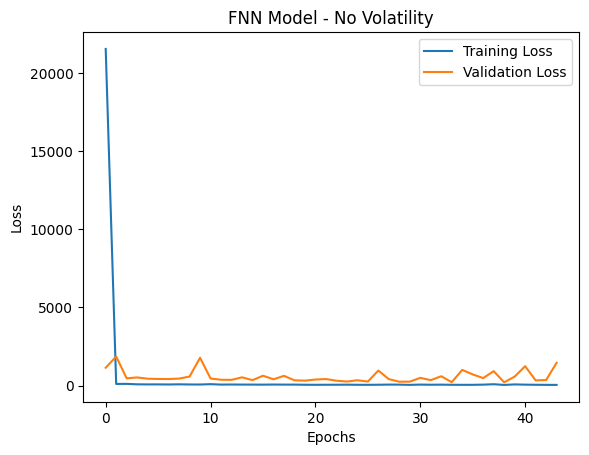

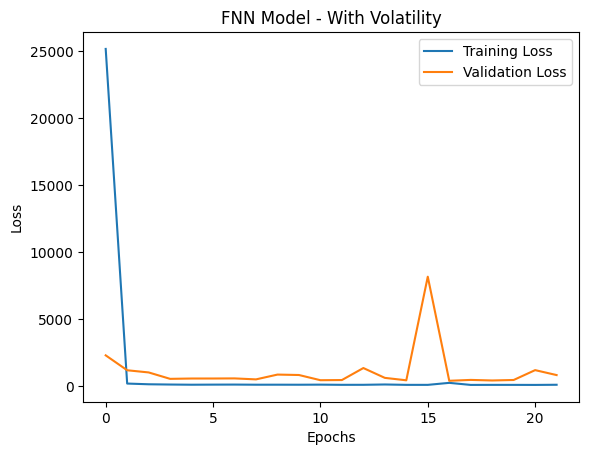

In [ ]:
import matplotlib.pyplot as plt

# Plot the training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both models
plot_loss(history_no_vol, "FNN Model - No Volatility")
plot_loss(history_with_vol, "FNN Model - With Volatility")

# Tyler Burguillos 10/29/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Model Without Volatility - RMSE: 14.5074, R²: 0.9953, MAPE: 1.2428%
Model With Volatility - RMSE: 19.3465, R²: 0.9916, MAPE: 1.6830%
Lift Chart - No Volatility:


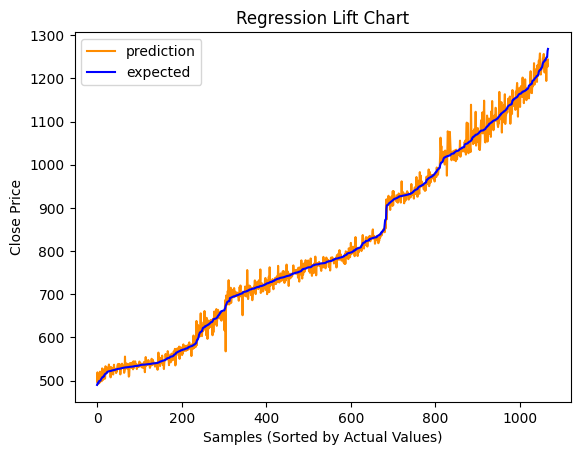

Lift Chart - With Volatility:


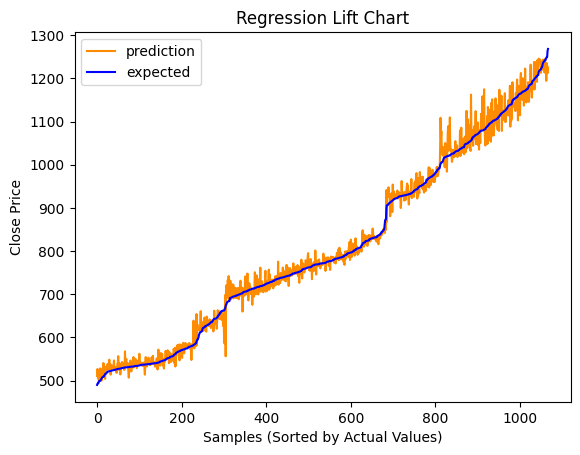

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Function to calculate RMSE and R²
def evaluate_model(model, X_test, y_test):
  # Predict using the trained model
  y_pred = model.predict(X_test)

  # Calculate RMSE
  rmse = np.sqrt(mean_squared_error(y_test, y_pred))

  # Calculate R² score
  r2 = r2_score(y_test, y_pred)

  # Calculate MAPE
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Regression chart.
def chart_regression(pred,y,sort=True):
  t = pd.DataFrame({'pred' : pred.flatten(), 'y' : y.flatten()})
  if sort:
    t.sort_values(by=['y'],inplace=True)
  a = plt.plot(t['pred'].tolist(),label='prediction', color='darkorange')
  b = plt.plot(t['y'].tolist(),label='expected', color='blue')
  # Add labels, title, and legend
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the no-volatility model
y_pred_no_vol, rmse_no_vol, r2_no_vol, mape_no_vol = evaluate_model(model_no_vol, X_test_no_vol, y_test_no_vol_seq)

# Evaluate the with-volatility model
y_pred_with_vol, rmse_with_vol, r2_with_vol, mape_with_vol = evaluate_model(model_with_vol, X_test_with_vol, y_test_with_vol_seq)

# Print the evaluation metrics
print(f"Model Without Volatility - RMSE: {rmse_no_vol:.4f}, R²: {r2_no_vol:.4f}, MAPE: {mape_no_vol:.4%}")
print(f"Model With Volatility - RMSE: {rmse_with_vol:.4f}, R²: {r2_with_vol:.4f}, MAPE: {mape_with_vol:.4%}")

# Plot lift charts for both models
print("Lift Chart - No Volatility:")
chart_regression(y_pred_no_vol, y_test_no_vol_seq)

print("Lift Chart - With Volatility:")
chart_regression(y_pred_with_vol, y_test_with_vol_seq)

# Tyler Burguillos 10/29/24

### CNN

#### Model 2: 1 Layer, ReLU avtivation, Adam Optimizer (2 Dense Layers)

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# Define a function to build the CNN model
def build_cnn_model(input_shape):
    model = Sequential()
    model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=input_shape))  # Convolutional layer
    model.add(MaxPooling1D(pool_size=2))  # Max pooling to reduce dimensionality
    model.add(Flatten())  # Flatten for dense layer compatibility
    model.add(Dense(64, activation='relu'))  # Dense hidden layer
    model.add(Dense(32, activation='relu'))  # Dense hidden layer
    model.add(Dense(1))  # Output layer (no activation for regression)
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
    return model

# Build CNN models for both datasets
model_no_vol_cnn = build_cnn_model((7, 5))  # No-volatility CNN input: (7 days, 5 features)
model_with_vol_cnn = build_cnn_model((7, 6))  # With-volatility CNN input: (7 days, 6 features)

# Early stopping for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)

# Early stopping for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)

# Train the CNN model without volatility
history_no_vol_cnn = model_no_vol_cnn.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_no_vol],
    verbose=2
)

# Train the CNN model with volatility
history_with_vol_cnn = model_with_vol_cnn.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=500,
    batch_size=32,
    callbacks=[early_stopping_with_vol],
    verbose=2
)

# Evaluate the CNN models
loss_no_vol_cnn = model_no_vol_cnn.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_cnn = model_with_vol_cnn.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

print(f"Test Loss (No Volatility - CNN): {loss_no_vol_cnn}")
print(f"Test Loss (With Volatility - CNN): {loss_with_vol_cnn}")

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/500
79/79 - 3s - 32ms/step - loss: 77099.0859 - val_loss: 362483.9375
Epoch 2/500
79/79 - 1s - 10ms/step - loss: 6728.8745 - val_loss: 23944.2188
Epoch 3/500
79/79 - 0s - 3ms/step - loss: 1257.5178 - val_loss: 10502.0039
Epoch 4/500
79/79 - 0s - 3ms/step - loss: 452.4513 - val_loss: 2928.7671
Epoch 5/500
79/79 - 0s - 3ms/step - loss: 177.1467 - val_loss: 1415.5632
Epoch 6/500
79/79 - 0s - 4ms/step - loss: 104.2117 - val_loss: 869.5922
Epoch 7/500
79/79 - 0s - 4ms/step - loss: 90.1447 - val_loss: 623.3351
Epoch 8/500
79/79 - 0s - 3ms/step - loss: 87.5050 - val_loss: 577.9432
Epoch 9/500
79/79 - 0s - 4ms/step - loss: 86.1349 - val_loss: 559.2996
Epoch 10/500
79/79 - 0s - 4ms/step - loss: 85.8754 - val_loss: 552.7324
Epoch 11/500
79/79 - 0s - 3ms/step - loss: 84.7780 - val_loss: 552.8579
Epoch 12/500
79/79 - 0s - 4ms/step - loss: 84.8960 - val_loss: 560.2475
Epoch 13/500
79/79 - 0s - 3ms/step - loss: 84.4774 - val_loss: 503.6351
Epoch 14/500
79/79 - 0s - 4ms/step - loss: 83.8966 -

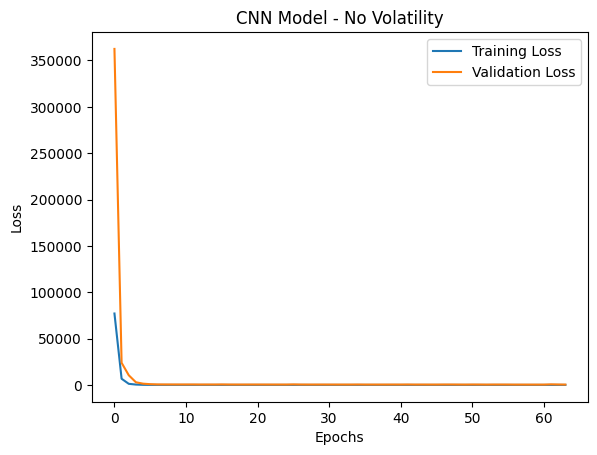

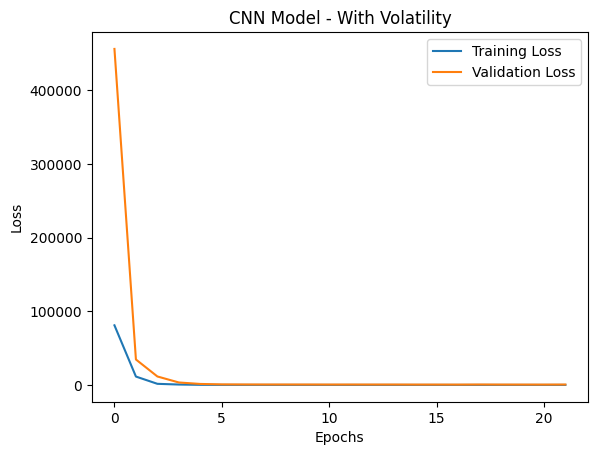

In [ ]:
# Plot the training and validation loss for both CNN models
def plot_loss(history, title):
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

# Plot loss for both CNN models
plot_loss(history_no_vol_cnn, "CNN Model - No Volatility")
plot_loss(history_with_vol_cnn, "CNN Model - With Volatility")

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Model Without Volatility (CNN) - RMSE: 20.3077, R²: 0.9907, MAPE: 1.7512%
Model With Volatility (CNN) - RMSE: 22.9167, R²: 0.9882, MAPE: 2.0228%
Lift Chart - No Volatility (CNN):


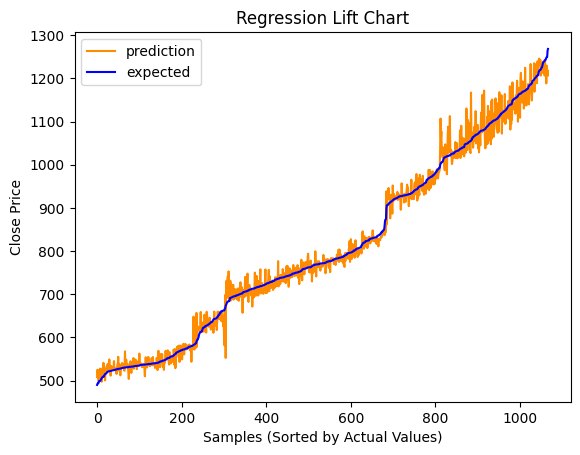

Lift Chart - With Volatility (CNN):


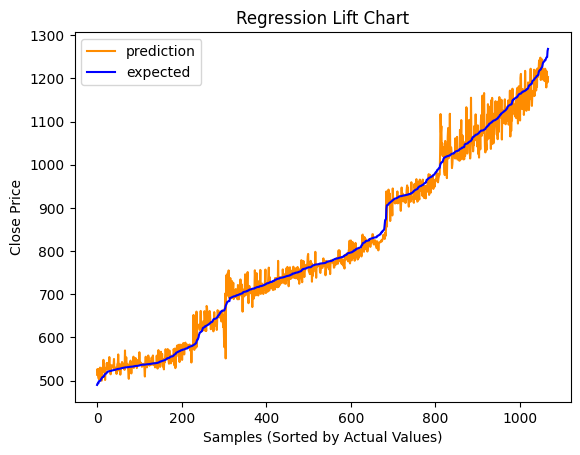

In [ ]:
# Evaluate your CNN models with RMSE, R², and MAPE
y_pred_no_vol_cnn, rmse_no_vol_cnn, r2_no_vol_cnn, mape_no_vol_cnn = evaluate_model(
    model_no_vol_cnn, X_test_no_vol, y_test_no_vol_seq
)

y_pred_with_vol_cnn, rmse_with_vol_cnn, r2_with_vol_cnn, mape_with_vol_cnn = evaluate_model(
    model_with_vol_cnn, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics for both CNN models
print(f"Model Without Volatility (CNN) - RMSE: {rmse_no_vol_cnn:.4f}, R²: {r2_no_vol_cnn:.4f}, MAPE: {mape_no_vol_cnn:.4%}")
print(f"Model With Volatility (CNN) - RMSE: {rmse_with_vol_cnn:.4f}, R²: {r2_with_vol_cnn:.4f}, MAPE: {mape_with_vol_cnn:.4%}")

# Plot lift charts for CNN models
print("Lift Chart - No Volatility (CNN):")
chart_regression(y_pred_no_vol_cnn, y_test_no_vol_seq)

print("Lift Chart - With Volatility (CNN):")
chart_regression(y_pred_with_vol_cnn, y_test_with_vol_seq)


### LSTM

#### Model 4: 4 Layers, ReLU Activation, Adam optimizer (2 Dense Layers)

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the LSTM model
def build_lstm_model(input_shape):
  model = Sequential()

  # LSTM Layers
  model.add(LSTM(256, activation='relu', return_sequences=True, input_shape=input_shape))
  model.add(LSTM(128, activation='relu', return_sequences=True))
  model.add(LSTM(64, activation='relu', return_sequences=True))
  model.add(LSTM(32, activation='relu', return_sequences=False))

  # Dense Layers
  model.add(Dense(64))
  model.add(Dense(32))
  model.add(Dense(1))  # Output layer (no activation for regression)

  # Compile the model
  model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
  return model

# Build LSTM models for both datasets
model_no_vol_lstm = build_lstm_model((7, 5))  # No-volatility input: (7 days, 5 features)
model_with_vol_lstm = build_lstm_model((7, 6))  # With-volatility input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("tyler_lstm_model_4_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("tyler_lstm_model_4_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the LSTM model without volatility
history_no_vol_lstm = model_no_vol_lstm.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the LSTM model with volatility
history_with_vol_lstm = model_with_vol_lstm.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol_lstm = model_no_vol_lstm.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_lstm = model_with_vol_lstm.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

# Print the results
print(f"\nTest Loss (No Volatility - LSTM): {loss_no_vol_lstm}")
print(f"Test Loss (With Volatility - LSTM): {loss_with_vol_lstm}")

# Tyler Burguillos 10/30/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/1000

Epoch 1: val_loss improved from inf to 223382.59375, saving model to tyler_lstm_model_4_no_vol.keras
79/79 - 17s - 214ms/step - loss: 26762.7969 - val_loss: 223382.5938
Epoch 2/1000

Epoch 2: val_loss improved from 223382.59375 to 134096.62500, saving model to tyler_lstm_model_4_no_vol.keras
79/79 - 10s - 125ms/step - loss: 423.6260 - val_loss: 134096.6250
Epoch 3/1000

Epoch 3: val_loss improved from 134096.62500 to 94400.10938, saving model to tyler_lstm_model_4_no_vol.keras
79/79 - 1s - 14ms/step - loss: 196.8799 - val_loss: 94400.1094
Epoch 4/1000

Epoch 4: val_loss improved from 94400.10938 to 68963.35156, saving model to tyler_lstm_model_4_no_vol.keras
79/79 - 1s - 9ms/step - loss: 174.6004 - val_loss: 68963.3516
Epoch 5/1000

Epoch 5: val_loss improved from 68963.35156 to 47131.65625, saving model to tyler_lstm_model_4_no_vol.keras
79/79 - 1s - 10ms/step - loss: 172.9281 - val_loss: 47131.6562
Epoch 6/1000

Epoch 6: val_loss did not improve from 47131.65625
79/79 -

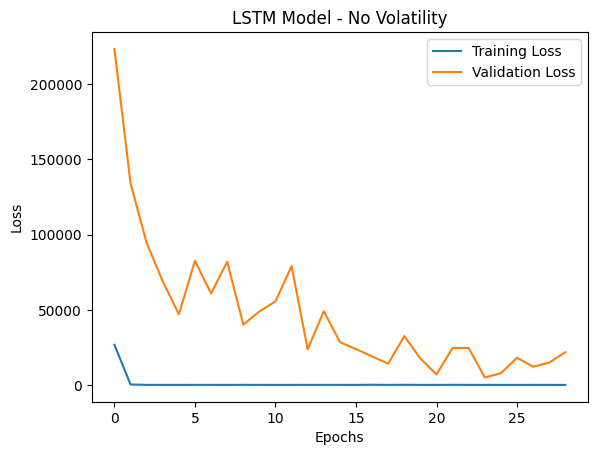

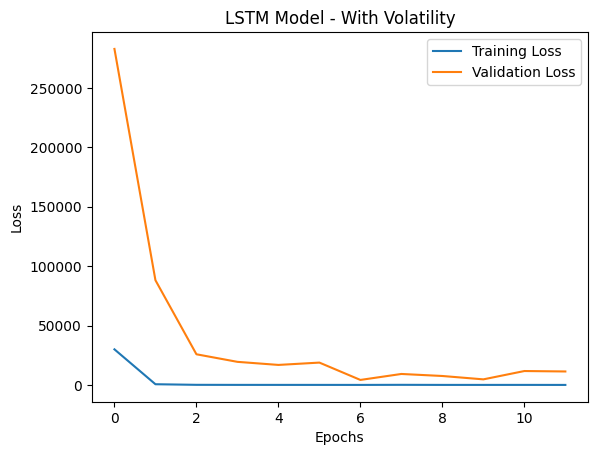

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# Plot training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both LSTM models
plot_loss(history_no_vol_lstm, "LSTM Model - No Volatility")
plot_loss(history_with_vol_lstm, "LSTM Model - With Volatility")

# Tyler Burguillos 10/30/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step

LSTM Model Without Volatility - RMSE: 71.0756, R²: 0.8865, MAPE: 5.6166%
LSTM Model With Volatility - RMSE: 65.9303, R²: 0.9023, MAPE: 5.8989%

Lift Chart - LSTM Model No Volatility:


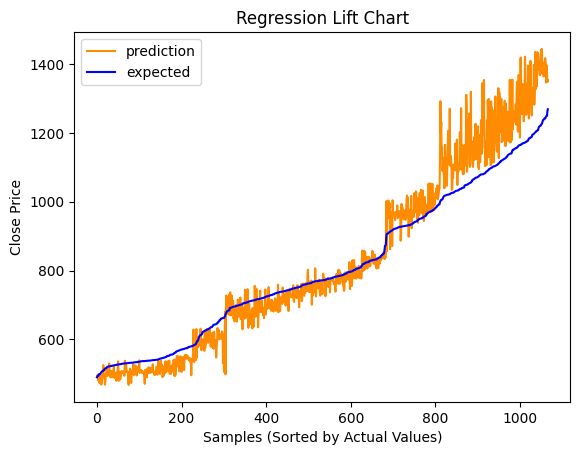

Lift Chart - LSTM Model With Volatility:


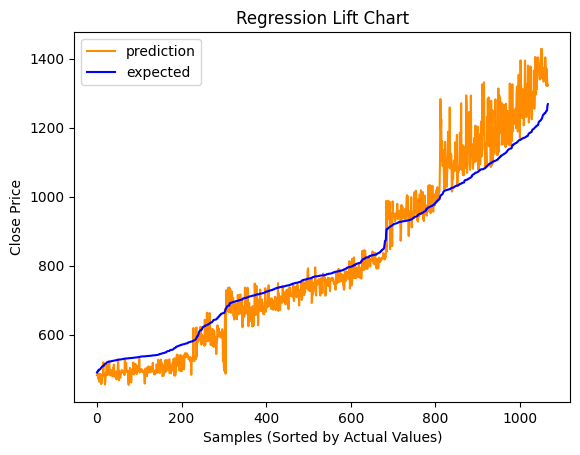

In [ ]:
# Function to calculate RMSE, R², and MAPE
def evaluate_model(model, X_test, y_test):
  y_pred = model.predict(X_test)

  rmse = np.sqrt(mean_squared_error(y_test, y_pred))
  r2 = r2_score(y_test, y_pred)
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Function to plot the regression lift chart
def chart_regression(pred, y, sort=True):
  t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
  if sort:
    t.sort_values(by=['y'], inplace=True)
  plt.plot(t['pred'].tolist(), label='prediction', color='darkorange')
  plt.plot(t['y'].tolist(), label='expected', color='blue')
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the LSTM models
y_pred_no_vol_lstm, rmse_no_vol_lstm, r2_no_vol_lstm, mape_no_vol_lstm = evaluate_model(
    model_no_vol_lstm, X_test_no_vol, y_test_no_vol_seq
)
y_pred_with_vol_lstm, rmse_with_vol_lstm, r2_with_vol_lstm, mape_with_vol_lstm = evaluate_model(
    model_with_vol_lstm, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics
print(f"\nLSTM Model Without Volatility - RMSE: {rmse_no_vol_lstm:.4f}, R²: {r2_no_vol_lstm:.4f}, MAPE: {mape_no_vol_lstm:.4%}")
print(f"LSTM Model With Volatility - RMSE: {rmse_with_vol_lstm:.4f}, R²: {r2_with_vol_lstm:.4f}, MAPE: {mape_with_vol_lstm:.4%}")

# Plot lift charts for both LSTM models
print("\nLift Chart - LSTM Model No Volatility:")
chart_regression(y_pred_no_vol_lstm, y_test_no_vol_seq)

print("Lift Chart - LSTM Model With Volatility:")
chart_regression(y_pred_with_vol_lstm, y_test_with_vol_seq)

# Tyler Burguillos 10/30/24

### Overall Best LSTM (Dropping Close from input and just using Rolling Std. "Volatility")

#### Model 3 (10 Days):

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the LSTM model
def build_lstm_model(input_shape):
  model = Sequential()

  # LSTM Layers
  model.add(LSTM(256, activation='relu', return_sequences=True, input_shape=input_shape))
  model.add(LSTM(128, activation='relu', return_sequences=True))
  model.add(LSTM(64, activation='relu', return_sequences=True))
  model.add(LSTM(32, activation='relu', return_sequences=False))

  # Dense Layers
  model.add(Dense(32))
  model.add(Dense(1))  # Output layer (no activation for regression)

  # Compile the model
  model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
  return model

# Build LSTM models for both datasets
model_no_vol_lstm = build_lstm_model((7, 4))  # No-volatility input: (7 days, 4 features)
model_with_vol_lstm = build_lstm_model((7, 5))  # With-volatility input: (7 days, 5 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("tyler_lstm_model_3_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("tyler_lstm_model_3_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the LSTM model without volatility
history_no_vol_lstm = model_no_vol_lstm.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the LSTM model with volatility
history_with_vol_lstm = model_with_vol_lstm.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol_lstm = model_no_vol_lstm.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_lstm = model_with_vol_lstm.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

# Print the results
print(f"\nTest Loss (No Volatility - LSTM): {loss_no_vol_lstm}")
print(f"Test Loss (With Volatility - LSTM): {loss_with_vol_lstm}")

# Tyler Burguillos 11/05/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/1000

Epoch 1: val_loss improved from inf to 207427.73438, saving model to tyler_lstm_model_3_no_vol.keras
78/78 - 27s - 349ms/step - loss: 28051.7500 - val_loss: 207427.7344
Epoch 2/1000

Epoch 2: val_loss improved from 207427.73438 to 69802.17188, saving model to tyler_lstm_model_3_no_vol.keras
78/78 - 22s - 282ms/step - loss: 565.8321 - val_loss: 69802.1719
Epoch 3/1000

Epoch 3: val_loss did not improve from 69802.17188
78/78 - 3s - 37ms/step - loss: 276.2310 - val_loss: 70647.8984
Epoch 4/1000

Epoch 4: val_loss improved from 69802.17188 to 53213.48828, saving model to tyler_lstm_model_3_no_vol.keras
78/78 - 2s - 29ms/step - loss: 242.6669 - val_loss: 53213.4883
Epoch 5/1000

Epoch 5: val_loss improved from 53213.48828 to 42712.57422, saving model to tyler_lstm_model_3_no_vol.keras
78/78 - 1s - 17ms/step - loss: 238.2961 - val_loss: 42712.5742
Epoch 6/1000

Epoch 6: val_loss did not improve from 42712.57422
78/78 - 2s - 29ms/step - loss: 246.1896 - val_loss: 54413.1367
Epo

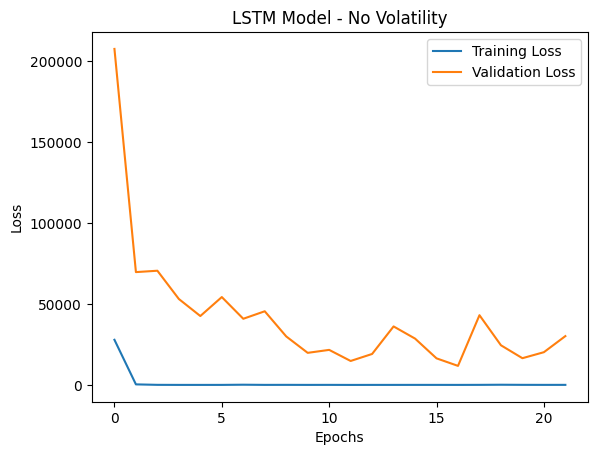

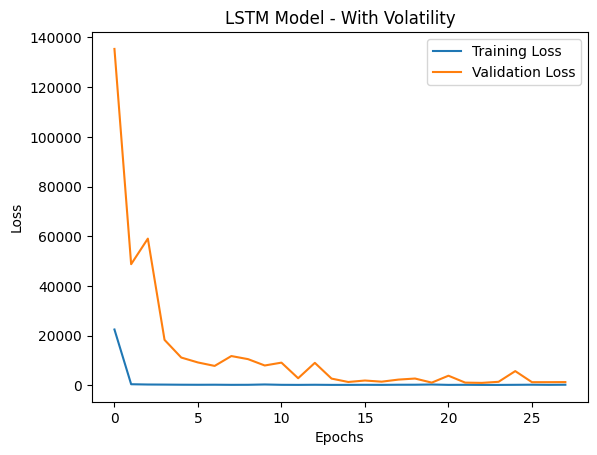

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# Plot training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both LSTM models
plot_loss(history_no_vol_lstm, "LSTM Model - No Volatility")
plot_loss(history_with_vol_lstm, "LSTM Model - With Volatility")

# Tyler Burguillos 11/05/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step

LSTM Model Without Volatility - RMSE: 109.4190, R²: 0.7308, MAPE: 7.3892%
LSTM Model With Volatility - RMSE: 32.0178, R²: 0.9769, MAPE: 2.8379%

Lift Chart - LSTM Model No Volatility:


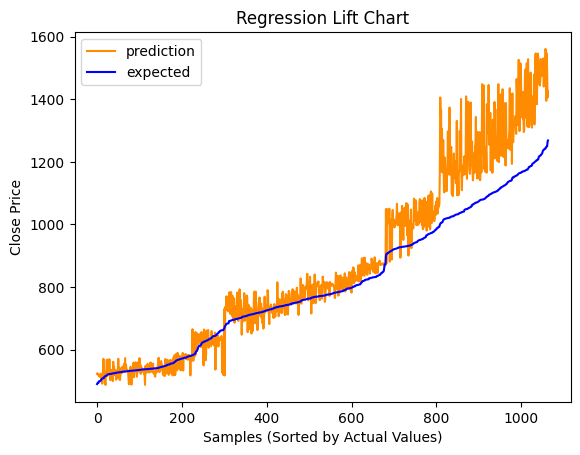

Lift Chart - LSTM Model With Volatility:


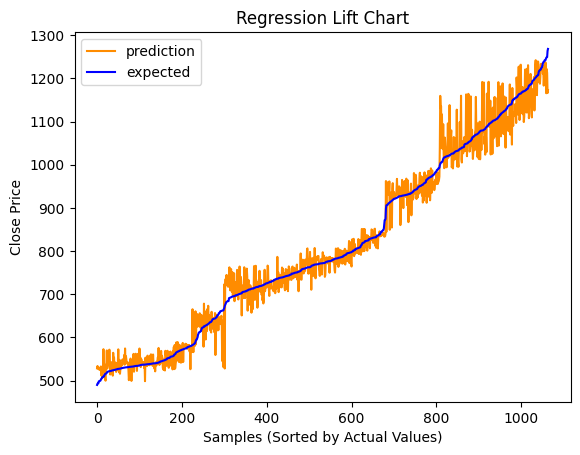

In [ ]:
# Function to calculate RMSE, R², and MAPE
def evaluate_model(model, X_test, y_test):
  y_pred = model.predict(X_test)

  rmse = np.sqrt(mean_squared_error(y_test, y_pred))
  r2 = r2_score(y_test, y_pred)
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Function to plot the regression lift chart
def chart_regression(pred, y, sort=True):
  t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
  if sort:
    t.sort_values(by=['y'], inplace=True)
  plt.plot(t['pred'].tolist(), label='prediction', color='darkorange')
  plt.plot(t['y'].tolist(), label='expected', color='blue')
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the LSTM models
y_pred_no_vol_lstm, rmse_no_vol_lstm, r2_no_vol_lstm, mape_no_vol_lstm = evaluate_model(
    model_no_vol_lstm, X_test_no_vol, y_test_no_vol_seq
)
y_pred_with_vol_lstm, rmse_with_vol_lstm, r2_with_vol_lstm, mape_with_vol_lstm = evaluate_model(
    model_with_vol_lstm, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics
print(f"\nLSTM Model Without Volatility - RMSE: {rmse_no_vol_lstm:.4f}, R²: {r2_no_vol_lstm:.4f}, MAPE: {mape_no_vol_lstm:.4%}")
print(f"LSTM Model With Volatility - RMSE: {rmse_with_vol_lstm:.4f}, R²: {r2_with_vol_lstm:.4f}, MAPE: {mape_with_vol_lstm:.4%}")

# Plot lift charts for both LSTM models
print("\nLift Chart - LSTM Model No Volatility:")
chart_regression(y_pred_no_vol_lstm, y_test_no_vol_seq)

print("Lift Chart - LSTM Model With Volatility:")
chart_regression(y_pred_with_vol_lstm, y_test_with_vol_seq)

# Tyler Burguillos 11/05/24

## Additional Features (Bidirectional)

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input, Bidirectional
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the LSTM model
def build_lstm_model(input_shape):
  model = Sequential()

  # LSTM Layers
  model.add(Bidirectional(LSTM(128, activation='relu', return_sequences=True, input_shape=input_shape)))
  model.add(Bidirectional(LSTM(32, activation='relu', return_sequences=True)))
  model.add(Bidirectional(LSTM(16, activation='relu', return_sequences=False)))

  # Dense Layers
  model.add(Dense(16))
  model.add(Dense(1))  # Output layer (no activation for regression)

  # Compile the model
  model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
  return model

# Build LSTM models for both datasets
model_no_vol_lstm = build_lstm_model((7, 5))  # No-volatility input: (7 days, 5 features)
model_with_vol_lstm = build_lstm_model((7, 6))  # With-volatility input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Austin_Nolte_lstm_model_Bidrectional_2_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Austin_Nolte_lstm_model_Bidirectional_2_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the LSTM model without volatility
history_no_vol_lstm = model_no_vol_lstm.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the LSTM model with volatility
history_with_vol_lstm = model_with_vol_lstm.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol_lstm = model_no_vol_lstm.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_lstm = model_with_vol_lstm.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

# Print the results
print(f"\nTest Loss (No Volatility - LSTM): {loss_no_vol_lstm}")
print(f"Test Loss (With Volatility - LSTM): {loss_with_vol_lstm}")

# Austin Nolte 11/05/24

Epoch 1/1000

Epoch 1: val_loss improved from inf to 694670.68750, saving model to Austin_Nolte_lstm_model_Bidrectional_2_no_vol.keras
79/79 - 26s - 323ms/step - loss: 35370.6836 - val_loss: 694670.6875
Epoch 2/1000

Epoch 2: val_loss improved from 694670.68750 to 660860.62500, saving model to Austin_Nolte_lstm_model_Bidrectional_2_no_vol.keras
79/79 - 2s - 23ms/step - loss: 521.5161 - val_loss: 660860.6250
Epoch 3/1000

Epoch 3: val_loss improved from 660860.62500 to 437742.25000, saving model to Austin_Nolte_lstm_model_Bidrectional_2_no_vol.keras
79/79 - 2s - 30ms/step - loss: 248.1028 - val_loss: 437742.2500
Epoch 4/1000

Epoch 4: val_loss improved from 437742.25000 to 397401.40625, saving model to Austin_Nolte_lstm_model_Bidrectional_2_no_vol.keras
79/79 - 2s - 27ms/step - loss: 113.1780 - val_loss: 397401.4062
Epoch 5/1000

Epoch 5: val_loss did not improve from 397401.40625
79/79 - 1s - 12ms/step - loss: 108.8128 - val_loss: 439204.4062
Epoch 6/1000

Epoch 6: val_loss improved fr

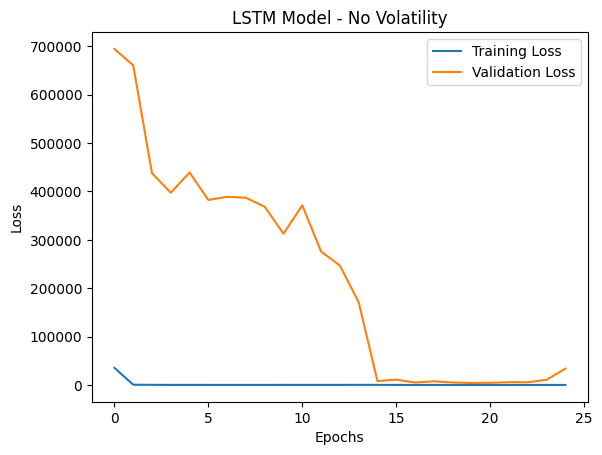

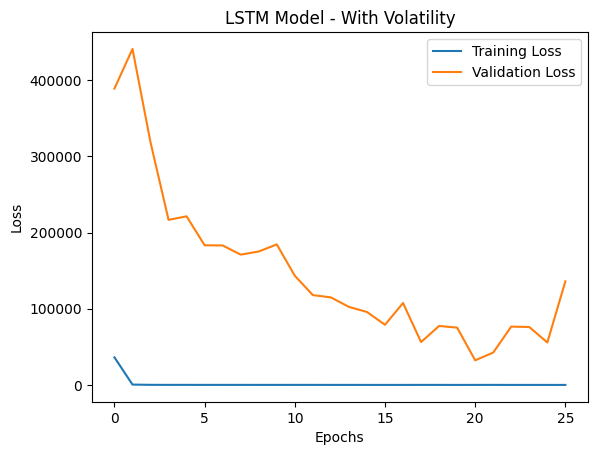

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# Plot training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both LSTM models
plot_loss(history_no_vol_lstm, "LSTM Model - No Volatility")
plot_loss(history_with_vol_lstm, "LSTM Model - With Volatility")
# Austin Nolte 11/05/2024

34/34 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

LSTM Model Without Volatility - RMSE: 63.8152, R²: 0.9085, MAPE: 4.7322%
LSTM Model With Volatility - RMSE: 179.8210, R²: 0.2736, MAPE: 12.3304%

Lift Chart - LSTM Model No Volatility:


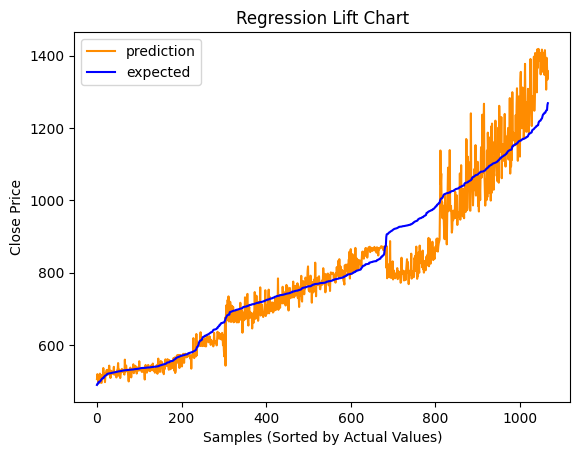

Lift Chart - LSTM Model With Volatility:


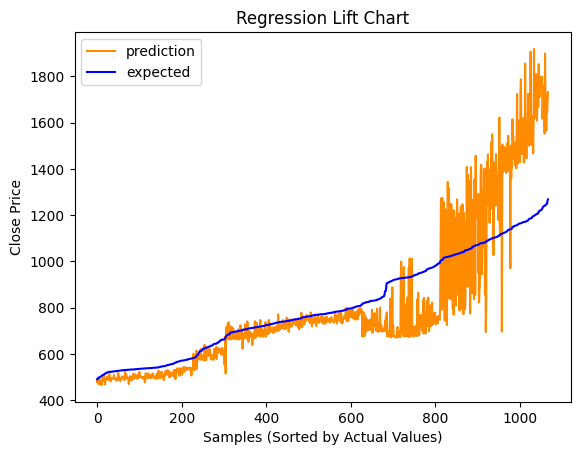

In [ ]:
# Function to calculate RMSE, R², and MAPE
def evaluate_model(model, X_test, y_test):
  y_pred = model.predict(X_test)

  rmse = np.sqrt(mean_squared_error(y_test, y_pred))
  r2 = r2_score(y_test, y_pred)
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Function to plot the regression lift chart
def chart_regression(pred, y, sort=True):
  t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
  if sort:
    t.sort_values(by=['y'], inplace=True)
  plt.plot(t['pred'].tolist(), label='prediction', color='darkorange')
  plt.plot(t['y'].tolist(), label='expected', color='blue')
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the LSTM models
y_pred_no_vol_lstm, rmse_no_vol_lstm, r2_no_vol_lstm, mape_no_vol_lstm = evaluate_model(
    model_no_vol_lstm, X_test_no_vol, y_test_no_vol_seq
)
y_pred_with_vol_lstm, rmse_with_vol_lstm, r2_with_vol_lstm, mape_with_vol_lstm = evaluate_model(
    model_with_vol_lstm, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics
print(f"\nLSTM Model Without Volatility - RMSE: {rmse_no_vol_lstm:.4f}, R²: {r2_no_vol_lstm:.4f}, MAPE: {mape_no_vol_lstm:.4%}")
print(f"LSTM Model With Volatility - RMSE: {rmse_with_vol_lstm:.4f}, R²: {r2_with_vol_lstm:.4f}, MAPE: {mape_with_vol_lstm:.4%}")

# Plot lift charts for both LSTM models
print("\nLift Chart - LSTM Model No Volatility:")
chart_regression(y_pred_no_vol_lstm, y_test_no_vol_seq)

print("Lift Chart - LSTM Model With Volatility:")
chart_regression(y_pred_with_vol_lstm, y_test_with_vol_seq)
# Austin Nolte 11/05/2024

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input, Bidirectional
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the LSTM model
def build_lstm_model(input_shape):
  model = Sequential()

  # LSTM Layers
  model.add(Bidirectional(LSTM(256, activation='relu', return_sequences=True, input_shape=input_shape)))
  model.add(Bidirectional(LSTM(128, activation='relu', return_sequences=True)))
  model.add(Bidirectional(LSTM(64, activation='relu', return_sequences=True)))
  model.add(Bidirectional(LSTM(32, activation='relu', return_sequences=False)))

  # Dense Layers
  model.add(Dense(32))
  model.add(Dense(1))  # Output layer (no activation for regression)

  # Compile the model
  model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
  return model

# Build LSTM models for both datasets
model_no_vol_lstm = build_lstm_model((7, 5))  # No-volatility input: (7 days, 5 features)
model_with_vol_lstm = build_lstm_model((7, 6))  # With-volatility input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Austin_Nolte_lstm_model_Bidrectional_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Austin_Nolte_lstm_model_Bidirectional_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the LSTM model without volatility
history_no_vol_lstm = model_no_vol_lstm.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the LSTM model with volatility
history_with_vol_lstm = model_with_vol_lstm.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol_lstm = model_no_vol_lstm.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_lstm = model_with_vol_lstm.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

# Print the results
print(f"\nTest Loss (No Volatility - LSTM): {loss_no_vol_lstm}")
print(f"Test Loss (With Volatility - LSTM): {loss_with_vol_lstm}")

# Austin Nolte 11/05/24

Epoch 1/1000


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



Epoch 1: val_loss improved from inf to 285542.09375, saving model to Austin_Nolte_lstm_model_Bidrectional_no_vol.keras
79/79 - 27s - 347ms/step - loss: 21914.5547 - val_loss: 285542.0938
Epoch 2/1000

Epoch 2: val_loss improved from 285542.09375 to 179868.12500, saving model to Austin_Nolte_lstm_model_Bidrectional_no_vol.keras
79/79 - 4s - 53ms/step - loss: 134.0475 - val_loss: 179868.1250
Epoch 3/1000

Epoch 3: val_loss improved from 179868.12500 to 146634.12500, saving model to Austin_Nolte_lstm_model_Bidrectional_no_vol.keras
79/79 - 1s - 17ms/step - loss: 93.7949 - val_loss: 146634.1250
Epoch 4/1000

Epoch 4: val_loss did not improve from 146634.12500
79/79 - 1s - 14ms/step - loss: 114.5769 - val_loss: 196837.9219
Epoch 5/1000

Epoch 5: val_loss did not improve from 146634.12500
79/79 - 1s - 18ms/step - loss: 101.5062 - val_loss: 150618.7031
Epoch 6/1000

Epoch 6: val_loss improved from 146634.12500 to 135629.07812, saving model to Austin_Nolte_lstm_model_Bidrectional_no_vol.keras

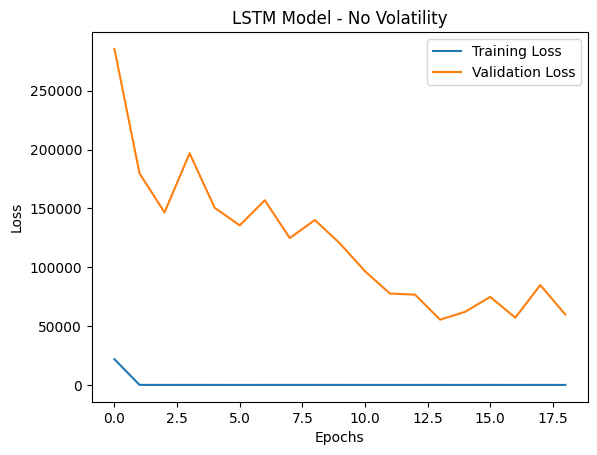

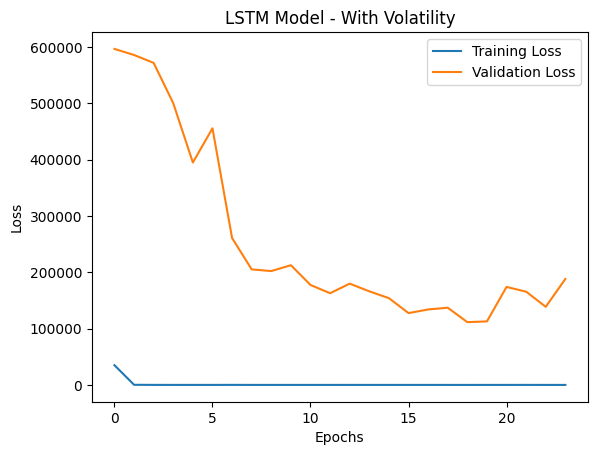

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# Plot training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both LSTM models
plot_loss(history_no_vol_lstm, "LSTM Model - No Volatility")
plot_loss(history_with_vol_lstm, "LSTM Model - With Volatility")
# Austin Nolte 11/05/2024

34/34 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step

LSTM Model Without Volatility - RMSE: 235.6458, R²: -0.2475, MAPE: 14.5791%
LSTM Model With Volatility - RMSE: 333.9632, R²: -1.5056, MAPE: 20.9289%

Lift Chart - LSTM Model No Volatility:


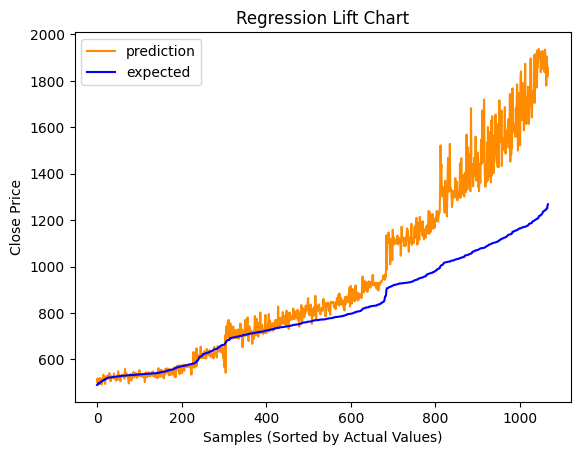

Lift Chart - LSTM Model With Volatility:


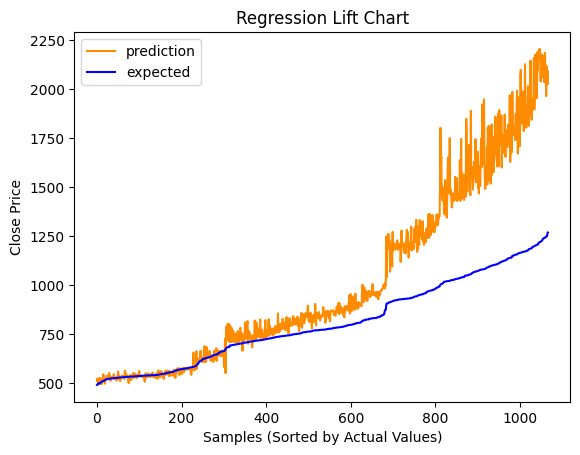

In [ ]:
# Function to calculate RMSE, R², and MAPE
def evaluate_model(model, X_test, y_test):
  y_pred = model.predict(X_test)

  rmse = np.sqrt(mean_squared_error(y_test, y_pred))
  r2 = r2_score(y_test, y_pred)
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Function to plot the regression lift chart
def chart_regression(pred, y, sort=True):
  t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
  if sort:
    t.sort_values(by=['y'], inplace=True)
  plt.plot(t['pred'].tolist(), label='prediction', color='darkorange')
  plt.plot(t['y'].tolist(), label='expected', color='blue')
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the LSTM models
y_pred_no_vol_lstm, rmse_no_vol_lstm, r2_no_vol_lstm, mape_no_vol_lstm = evaluate_model(
    model_no_vol_lstm, X_test_no_vol, y_test_no_vol_seq
)
y_pred_with_vol_lstm, rmse_with_vol_lstm, r2_with_vol_lstm, mape_with_vol_lstm = evaluate_model(
    model_with_vol_lstm, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics
print(f"\nLSTM Model Without Volatility - RMSE: {rmse_no_vol_lstm:.4f}, R²: {r2_no_vol_lstm:.4f}, MAPE: {mape_no_vol_lstm:.4%}")
print(f"LSTM Model With Volatility - RMSE: {rmse_with_vol_lstm:.4f}, R²: {r2_with_vol_lstm:.4f}, MAPE: {mape_with_vol_lstm:.4%}")

# Plot lift charts for both LSTM models
print("\nLift Chart - LSTM Model No Volatility:")
chart_regression(y_pred_no_vol_lstm, y_test_no_vol_seq)

print("Lift Chart - LSTM Model With Volatility:")
chart_regression(y_pred_with_vol_lstm, y_test_with_vol_seq)
# Austin Nolte 11/05/2024

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input, Bidirectional
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the LSTM model
def build_lstm_model(input_shape):
  model = Sequential()

  # LSTM Layers
  model.add(Bidirectional(LSTM(128, activation='relu', return_sequences=True, input_shape=input_shape)))
  forward_layer = LSTM(32,return_sequences=True, activation = 'relu')
  backward_layer = LSTM(32,return_sequences=True, activation ='relu', go_backwards=True)
  model.add(Bidirectional(forward_layer,backward_layer=backward_layer))
  model.add(Bidirectional(LSTM(16, activation='relu', return_sequences=False)))

  # Dense Layers
  model.add(Dense(32))
  model.add(Dense(1))  # Output layer (no activation for regression)

  # Compile the model
  model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
  return model

# Build LSTM models for both datasets
model_no_vol_lstm = build_lstm_model((7, 5))  # No-volatility input: (7 days, 5 features)
model_with_vol_lstm = build_lstm_model((7, 6))  # With-volatility input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("Austin_Nolte_lstm_model_Bidrectional_3_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("Austin_Nolte_lstm_model_Bidirectional_3_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the LSTM model without volatility
history_no_vol_lstm = model_no_vol_lstm.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the LSTM model with volatility
history_with_vol_lstm = model_with_vol_lstm.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol_lstm = model_no_vol_lstm.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_lstm = model_with_vol_lstm.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

# Print the results
print(f"\nTest Loss (No Volatility - LSTM): {loss_no_vol_lstm}")
print(f"Test Loss (With Volatility - LSTM): {loss_with_vol_lstm}")

# Austin Nolte 11/05/24

Epoch 1/1000


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



Epoch 1: val_loss improved from inf to 208353.81250, saving model to Austin_Nolte_lstm_model_Bidrectional_3_no_vol.keras
79/79 - 21s - 269ms/step - loss: 38093.6523 - val_loss: 208353.8125
Epoch 2/1000

Epoch 2: val_loss did not improve from 208353.81250
79/79 - 8s - 105ms/step - loss: 371.1508 - val_loss: 301714.1562
Epoch 3/1000

Epoch 3: val_loss did not improve from 208353.81250
79/79 - 1s - 14ms/step - loss: 141.4342 - val_loss: 241686.7188
Epoch 4/1000

Epoch 4: val_loss did not improve from 208353.81250
79/79 - 1s - 16ms/step - loss: 89.1162 - val_loss: 249234.5938
Epoch 5/1000

Epoch 5: val_loss did not improve from 208353.81250
79/79 - 1s - 11ms/step - loss: 83.1338 - val_loss: 208724.9062
Epoch 6/1000

Epoch 6: val_loss did not improve from 208353.81250
79/79 - 1s - 13ms/step - loss: 83.4920 - val_loss: 231197.3281
Epoch 6: early stopping
Restoring model weights from the end of the best epoch: 1.
Epoch 1/1000

Epoch 1: val_loss improved from inf to 1030612.31250, saving mode

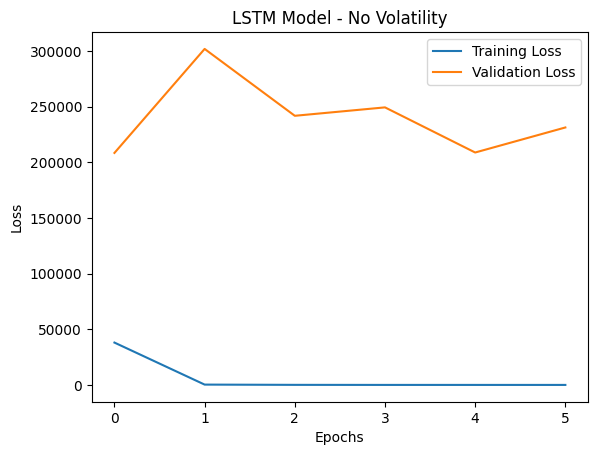

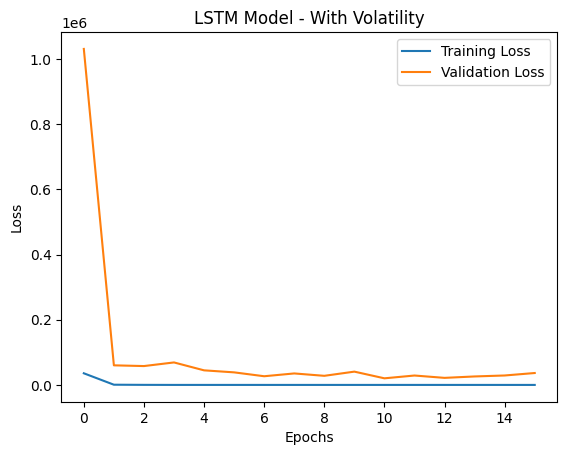

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# Plot training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both LSTM models
plot_loss(history_no_vol_lstm, "LSTM Model - No Volatility")
plot_loss(history_with_vol_lstm, "LSTM Model - With Volatility")
# Austin Nolte 11/05/2024

34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

LSTM Model Without Volatility - RMSE: 456.4579, R²: -3.6807, MAPE: 27.4969%
LSTM Model With Volatility - RMSE: 142.5738, R²: 0.5433, MAPE: 8.6856%

Lift Chart - LSTM Model No Volatility:


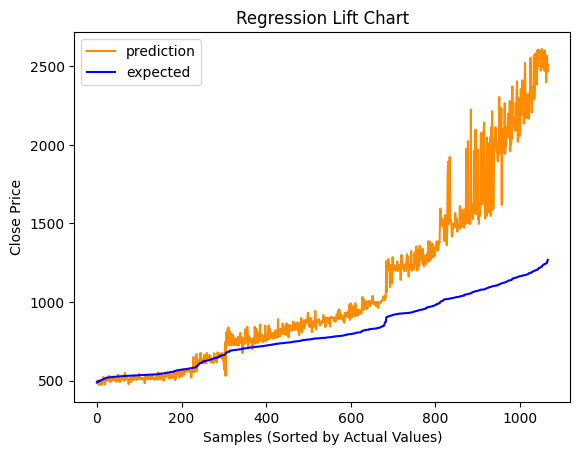

Lift Chart - LSTM Model With Volatility:


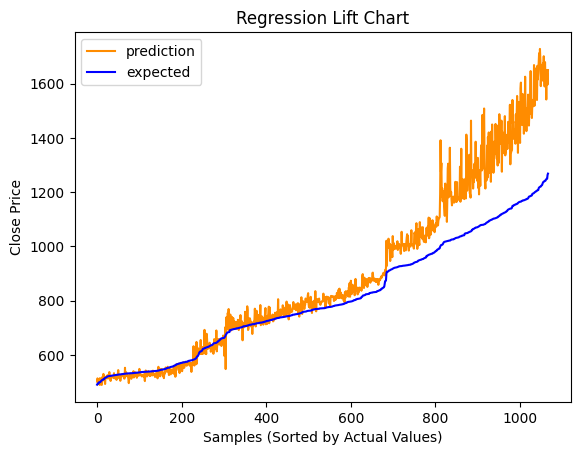

In [ ]:
# Function to calculate RMSE, R², and MAPE
def evaluate_model(model, X_test, y_test):
  y_pred = model.predict(X_test)

  rmse = np.sqrt(mean_squared_error(y_test, y_pred))
  r2 = r2_score(y_test, y_pred)
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Function to plot the regression lift chart
def chart_regression(pred, y, sort=True):
  t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
  if sort:
    t.sort_values(by=['y'], inplace=True)
  plt.plot(t['pred'].tolist(), label='prediction', color='darkorange')
  plt.plot(t['y'].tolist(), label='expected', color='blue')
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the LSTM models
y_pred_no_vol_lstm, rmse_no_vol_lstm, r2_no_vol_lstm, mape_no_vol_lstm = evaluate_model(
    model_no_vol_lstm, X_test_no_vol, y_test_no_vol_seq
)
y_pred_with_vol_lstm, rmse_with_vol_lstm, r2_with_vol_lstm, mape_with_vol_lstm = evaluate_model(
    model_with_vol_lstm, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics
print(f"\nLSTM Model Without Volatility - RMSE: {rmse_no_vol_lstm:.4f}, R²: {r2_no_vol_lstm:.4f}, MAPE: {mape_no_vol_lstm:.4%}")
print(f"LSTM Model With Volatility - RMSE: {rmse_with_vol_lstm:.4f}, R²: {r2_with_vol_lstm:.4f}, MAPE: {mape_with_vol_lstm:.4%}")

# Plot lift charts for both LSTM models
print("\nLift Chart - LSTM Model No Volatility:")
chart_regression(y_pred_no_vol_lstm, y_test_no_vol_seq)

print("Lift Chart - LSTM Model With Volatility:")
chart_regression(y_pred_with_vol_lstm, y_test_with_vol_seq)
# Austin Nolte 11/05/2024

## Additional Features (N- Days)

#### Model 3 (10 Days): 4 Layers, ReLU Activation, Adam optimizer (1 Dense Layer)

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the LSTM model
def build_lstm_model(input_shape):
  model = Sequential()

  # LSTM Layers
  model.add(LSTM(256, activation='relu', return_sequences=True, input_shape=input_shape))
  model.add(LSTM(128, activation='relu', return_sequences=True))
  model.add(LSTM(64, activation='relu', return_sequences=True))
  model.add(LSTM(32, activation='relu', return_sequences=False))

  # Dense Layers
  model.add(Dense(32))
  model.add(Dense(1))  # Output layer (no activation for regression)

  # Compile the model
  model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
  return model

# Build LSTM models for both datasets
model_no_vol_lstm = build_lstm_model((7, 5))  # No-volatility input: (7 days, 5 features)
model_with_vol_lstm = build_lstm_model((7, 6))  # With-volatility input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("tyler_lstm_model_3_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("tyler_lstm_model_3_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the LSTM model without volatility
history_no_vol_lstm = model_no_vol_lstm.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the LSTM model with volatility
history_with_vol_lstm = model_with_vol_lstm.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol_lstm = model_no_vol_lstm.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_lstm = model_with_vol_lstm.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

# Print the results
print(f"\nTest Loss (No Volatility - LSTM): {loss_no_vol_lstm}")
print(f"Test Loss (With Volatility - LSTM): {loss_with_vol_lstm}")

# Tyler Burguillos 11/05/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/1000

Epoch 1: val_loss improved from inf to 174476.06250, saving model to tyler_lstm_model_3_no_vol.keras
78/78 - 19s - 245ms/step - loss: 23591.9180 - val_loss: 174476.0625
Epoch 2/1000

Epoch 2: val_loss improved from 174476.06250 to 56791.32031, saving model to tyler_lstm_model_3_no_vol.keras
78/78 - 8s - 102ms/step - loss: 529.9457 - val_loss: 56791.3203
Epoch 3/1000

Epoch 3: val_loss improved from 56791.32031 to 55427.91406, saving model to tyler_lstm_model_3_no_vol.keras
78/78 - 1s - 16ms/step - loss: 278.5956 - val_loss: 55427.9141
Epoch 4/1000

Epoch 4: val_loss improved from 55427.91406 to 49842.05078, saving model to tyler_lstm_model_3_no_vol.keras
78/78 - 1s - 16ms/step - loss: 249.5095 - val_loss: 49842.0508
Epoch 5/1000

Epoch 5: val_loss improved from 49842.05078 to 36643.14844, saving model to tyler_lstm_model_3_no_vol.keras
78/78 - 1s - 14ms/step - loss: 254.8551 - val_loss: 36643.1484
Epoch 6/1000

Epoch 6: val_loss did not improve from 36643.14844
78/78 - 1s

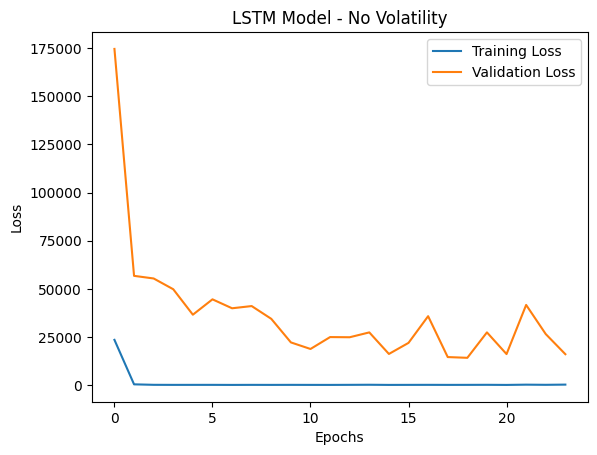

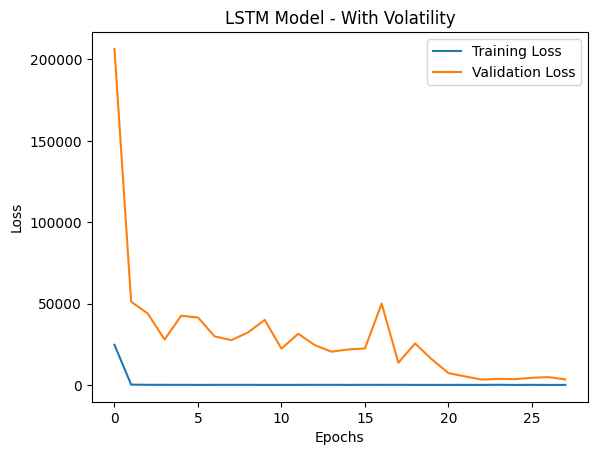

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# Plot training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both LSTM models
plot_loss(history_no_vol_lstm, "LSTM Model - No Volatility")
plot_loss(history_with_vol_lstm, "LSTM Model - With Volatility")

# Tyler Burguillos 11/05/24

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step
34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step

LSTM Model Without Volatility - RMSE: 119.5175, R²: 0.6788, MAPE: 8.5375%
LSTM Model With Volatility - RMSE: 58.8979, R²: 0.9220, MAPE: 4.8367%

Lift Chart - LSTM Model No Volatility:


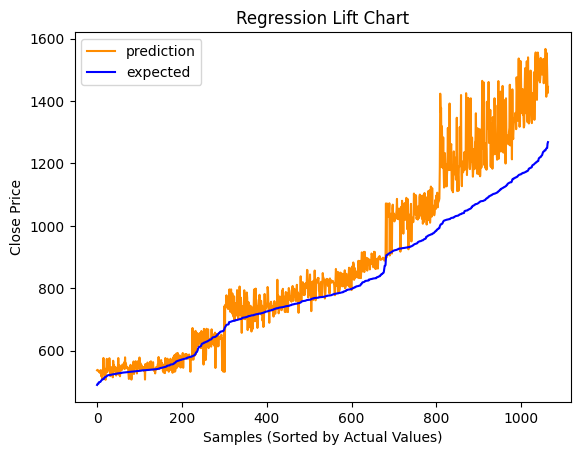

Lift Chart - LSTM Model With Volatility:


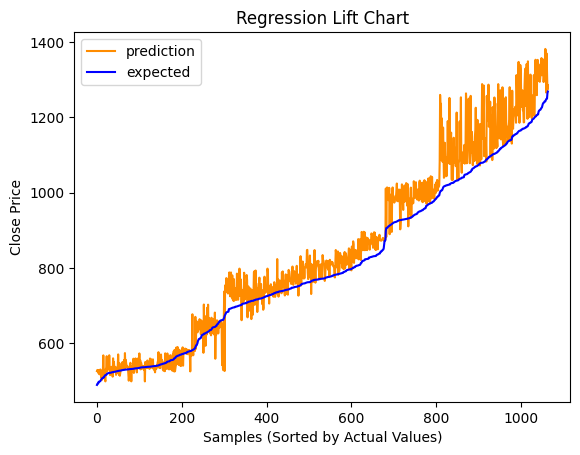

In [ ]:
# Function to calculate RMSE, R², and MAPE
def evaluate_model(model, X_test, y_test):
  y_pred = model.predict(X_test)

  rmse = np.sqrt(mean_squared_error(y_test, y_pred))
  r2 = r2_score(y_test, y_pred)
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Function to plot the regression lift chart
def chart_regression(pred, y, sort=True):
  t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
  if sort:
    t.sort_values(by=['y'], inplace=True)
  plt.plot(t['pred'].tolist(), label='prediction', color='darkorange')
  plt.plot(t['y'].tolist(), label='expected', color='blue')
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the LSTM models
y_pred_no_vol_lstm, rmse_no_vol_lstm, r2_no_vol_lstm, mape_no_vol_lstm = evaluate_model(
    model_no_vol_lstm, X_test_no_vol, y_test_no_vol_seq
)
y_pred_with_vol_lstm, rmse_with_vol_lstm, r2_with_vol_lstm, mape_with_vol_lstm = evaluate_model(
    model_with_vol_lstm, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics
print(f"\nLSTM Model Without Volatility - RMSE: {rmse_no_vol_lstm:.4f}, R²: {r2_no_vol_lstm:.4f}, MAPE: {mape_no_vol_lstm:.4%}")
print(f"LSTM Model With Volatility - RMSE: {rmse_with_vol_lstm:.4f}, R²: {r2_with_vol_lstm:.4f}, MAPE: {mape_with_vol_lstm:.4%}")

# Plot lift charts for both LSTM models
print("\nLift Chart - LSTM Model No Volatility:")
chart_regression(y_pred_no_vol_lstm, y_test_no_vol_seq)

print("Lift Chart - LSTM Model With Volatility:")
chart_regression(y_pred_with_vol_lstm, y_test_with_vol_seq)

# Tyler Burguillos 11/05/24

#### Model 3 (30 Days): 4 Layers, ReLU Activation, Adam optimizer (1 Dense Layer)

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the LSTM model
def build_lstm_model(input_shape):
  model = Sequential()

  # LSTM Layers
  model.add(LSTM(256, activation='relu', return_sequences=True, input_shape=input_shape))
  model.add(LSTM(128, activation='relu', return_sequences=True))
  model.add(LSTM(64, activation='relu', return_sequences=True))
  model.add(LSTM(32, activation='relu', return_sequences=False))

  # Dense Layers
  model.add(Dense(32))
  model.add(Dense(1))  # Output layer (no activation for regression)

  # Compile the model
  model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
  return model

# Build LSTM models for both datasets
model_no_vol_lstm = build_lstm_model((7, 5))  # No-volatility input: (7 days, 4 features)
model_with_vol_lstm = build_lstm_model((7, 6))  # With-volatility input: (7 days, 5 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("tyler_lstm_model_3_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("tyler_lstm_model_3_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the LSTM model without volatility
history_no_vol_lstm = model_no_vol_lstm.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the LSTM model with volatility
history_with_vol_lstm = model_with_vol_lstm.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol_lstm = model_no_vol_lstm.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_lstm = model_with_vol_lstm.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

# Print the results
print(f"\nTest Loss (No Volatility - LSTM): {loss_no_vol_lstm}")
print(f"Test Loss (With Volatility - LSTM): {loss_with_vol_lstm}")

# Tyler Burguillos 11/05/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/1000

Epoch 1: val_loss improved from inf to 2544849.50000, saving model to tyler_lstm_model_3_no_vol.keras
78/78 - 14s - 183ms/step - loss: 187806.5469 - val_loss: 2544849.5000
Epoch 2/1000

Epoch 2: val_loss improved from 2544849.50000 to 3664.50562, saving model to tyler_lstm_model_3_no_vol.keras
78/78 - 2s - 21ms/step - loss: 1724.2673 - val_loss: 3664.5056
Epoch 3/1000

Epoch 3: val_loss did not improve from 3664.50562
78/78 - 1s - 19ms/step - loss: 757.7201 - val_loss: 9168.3711
Epoch 4/1000

Epoch 4: val_loss did not improve from 3664.50562
78/78 - 1s - 19ms/step - loss: 675.7532 - val_loss: 67496.9453
Epoch 5/1000

Epoch 5: val_loss did not improve from 3664.50562
78/78 - 2s - 21ms/step - loss: 638.7450 - val_loss: 116767.0391
Epoch 6/1000

Epoch 6: val_loss did not improve from 3664.50562
78/78 - 3s - 34ms/step - loss: 622.9441 - val_loss: 147955.1406
Epoch 7/1000

Epoch 7: val_loss did not improve from 3664.50562
78/78 - 2s - 20ms/step - loss: 640.2759 - val_loss: 159

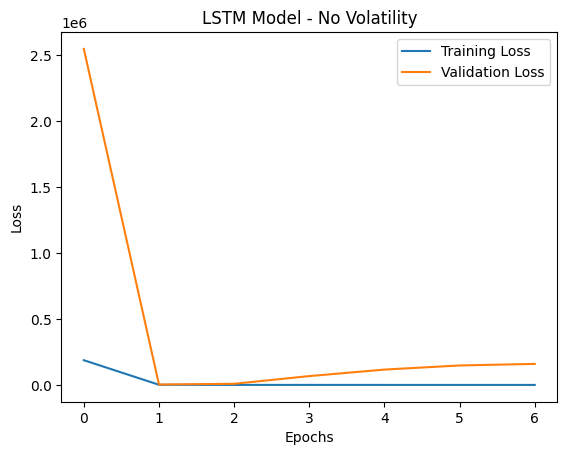

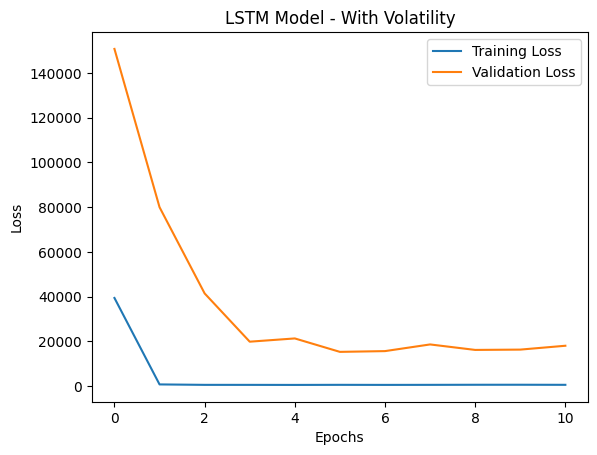

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# Plot training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both LSTM models
plot_loss(history_no_vol_lstm, "LSTM Model - No Volatility")
plot_loss(history_with_vol_lstm, "LSTM Model - With Volatility")

# Tyler Burguillos 11/05/24

33/33 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step
33/33 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step

LSTM Model Without Volatility - RMSE: 60.5352, R²: 0.9172, MAPE: 5.4130%
LSTM Model With Volatility - RMSE: 123.7426, R²: 0.6540, MAPE: 11.3336%

Lift Chart - LSTM Model No Volatility:


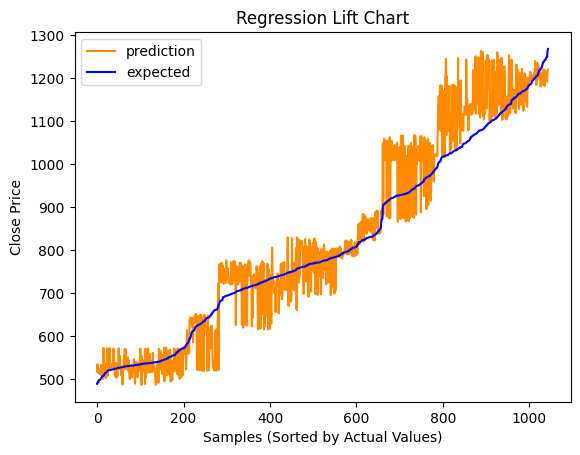

Lift Chart - LSTM Model With Volatility:


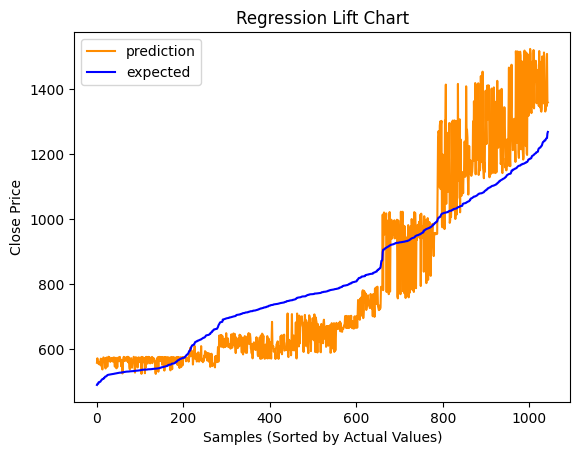

In [ ]:
# Function to calculate RMSE, R², and MAPE
def evaluate_model(model, X_test, y_test):
  y_pred = model.predict(X_test)

  rmse = np.sqrt(mean_squared_error(y_test, y_pred))
  r2 = r2_score(y_test, y_pred)
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Function to plot the regression lift chart
def chart_regression(pred, y, sort=True):
  t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
  if sort:
    t.sort_values(by=['y'], inplace=True)
  plt.plot(t['pred'].tolist(), label='prediction', color='darkorange')
  plt.plot(t['y'].tolist(), label='expected', color='blue')
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the LSTM models
y_pred_no_vol_lstm, rmse_no_vol_lstm, r2_no_vol_lstm, mape_no_vol_lstm = evaluate_model(
    model_no_vol_lstm, X_test_no_vol, y_test_no_vol_seq
)
y_pred_with_vol_lstm, rmse_with_vol_lstm, r2_with_vol_lstm, mape_with_vol_lstm = evaluate_model(
    model_with_vol_lstm, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics
print(f"\nLSTM Model Without Volatility - RMSE: {rmse_no_vol_lstm:.4f}, R²: {r2_no_vol_lstm:.4f}, MAPE: {mape_no_vol_lstm:.4%}")
print(f"LSTM Model With Volatility - RMSE: {rmse_with_vol_lstm:.4f}, R²: {r2_with_vol_lstm:.4f}, MAPE: {mape_with_vol_lstm:.4%}")

# Plot lift charts for both LSTM models
print("\nLift Chart - LSTM Model No Volatility:")
chart_regression(y_pred_no_vol_lstm, y_test_no_vol_seq)

print("Lift Chart - LSTM Model With Volatility:")
chart_regression(y_pred_with_vol_lstm, y_test_with_vol_seq)

# Tyler Burguillos 11/05/24

#### Model 3 (50 Days): 4 Layers, ReLU Activation, Adam optimizer (1 Dense Layer)

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the LSTM model
def build_lstm_model(input_shape):
  model = Sequential()

  # LSTM Layers
  model.add(LSTM(256, activation='relu', return_sequences=True, input_shape=input_shape))
  model.add(LSTM(128, activation='relu', return_sequences=True))
  model.add(LSTM(64, activation='relu', return_sequences=True))
  model.add(LSTM(32, activation='relu', return_sequences=False))

  # Dense Layers
  model.add(Dense(32))
  model.add(Dense(1))  # Output layer (no activation for regression)

  # Compile the model
  model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
  return model

# Build LSTM models for both datasets
model_no_vol_lstm = build_lstm_model((7, 5))  # No-volatility input: (7 days, 4 features)
model_with_vol_lstm = build_lstm_model((7, 6))  # With-volatility input: (7 days, 5 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("tyler_lstm_model_3_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("tyler_lstm_model_3_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the LSTM model without volatility
history_no_vol_lstm = model_no_vol_lstm.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the LSTM model with volatility
history_with_vol_lstm = model_with_vol_lstm.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol_lstm = model_no_vol_lstm.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_lstm = model_with_vol_lstm.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

# Print the results
print(f"\nTest Loss (No Volatility - LSTM): {loss_no_vol_lstm}")
print(f"Test Loss (With Volatility - LSTM): {loss_with_vol_lstm}")

# Tyler Burguillos 11/05/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/1000

Epoch 1: val_loss improved from inf to 1297768064.00000, saving model to tyler_lstm_model_3_no_vol.keras
77/77 - 28s - 368ms/step - loss: 111272.3828 - val_loss: 1297768064.0000
Epoch 2/1000

Epoch 2: val_loss improved from 1297768064.00000 to 631908.50000, saving model to tyler_lstm_model_3_no_vol.keras
77/77 - 22s - 283ms/step - loss: 53094.1250 - val_loss: 631908.5000
Epoch 3/1000

Epoch 3: val_loss improved from 631908.50000 to 567350.87500, saving model to tyler_lstm_model_3_no_vol.keras
77/77 - 7s - 89ms/step - loss: 17783.2969 - val_loss: 567350.8750
Epoch 4/1000

Epoch 4: val_loss improved from 567350.87500 to 78568.28125, saving model to tyler_lstm_model_3_no_vol.keras
77/77 - 3s - 38ms/step - loss: 1498.7267 - val_loss: 78568.2812
Epoch 5/1000

Epoch 5: val_loss did not improve from 78568.28125
77/77 - 3s - 34ms/step - loss: 907.1862 - val_loss: 89301.1562
Epoch 6/1000

Epoch 6: val_loss did not improve from 78568.28125
77/77 - 7s - 90ms/step - loss: 852.7317 - 

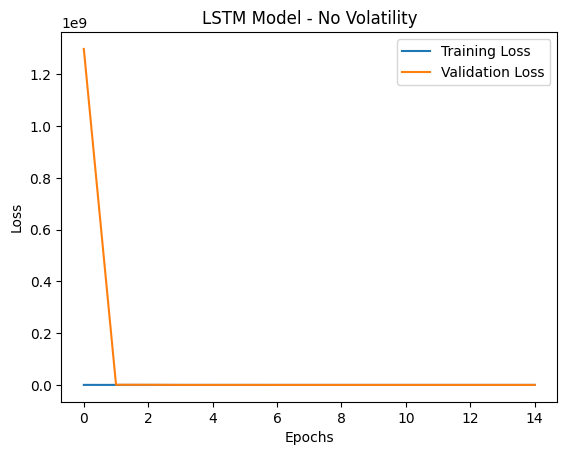

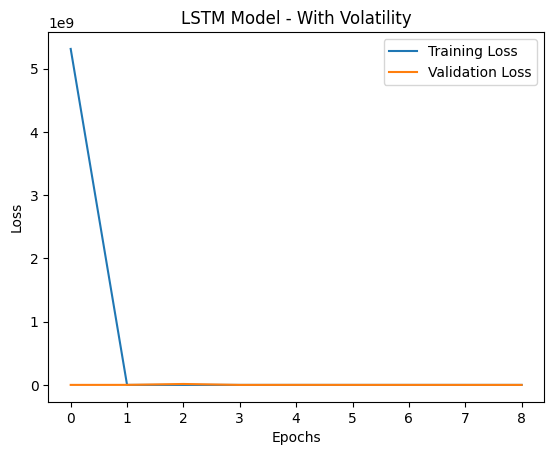

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# Plot training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both LSTM models
plot_loss(history_no_vol_lstm, "LSTM Model - No Volatility")
plot_loss(history_with_vol_lstm, "LSTM Model - With Volatility")

# Tyler Burguillos 11/05/24

32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step

LSTM Model Without Volatility - RMSE: 79.4767, R²: 0.8563, MAPE: 7.6745%
LSTM Model With Volatility - RMSE: 425.1716, R²: -3.1117, MAPE: 54.2344%

Lift Chart - LSTM Model No Volatility:


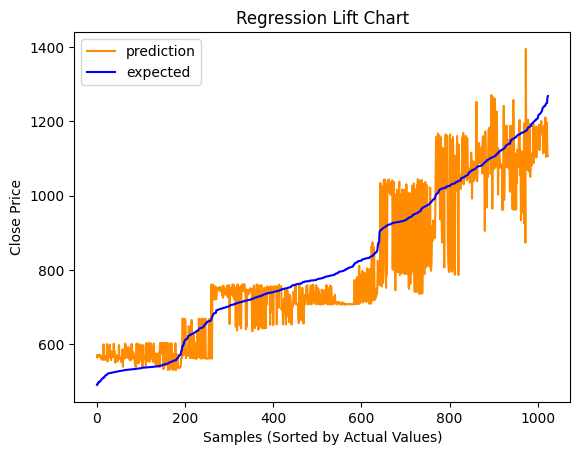

Lift Chart - LSTM Model With Volatility:


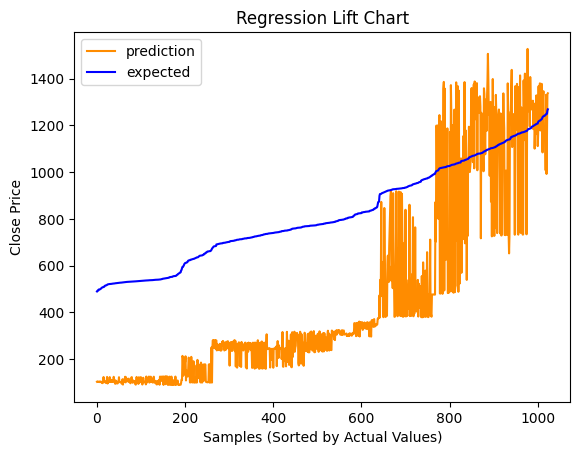

In [ ]:
# Function to calculate RMSE, R², and MAPE
def evaluate_model(model, X_test, y_test):
  y_pred = model.predict(X_test)

  rmse = np.sqrt(mean_squared_error(y_test, y_pred))
  r2 = r2_score(y_test, y_pred)
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Function to plot the regression lift chart
def chart_regression(pred, y, sort=True):
  t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
  if sort:
    t.sort_values(by=['y'], inplace=True)
  plt.plot(t['pred'].tolist(), label='prediction', color='darkorange')
  plt.plot(t['y'].tolist(), label='expected', color='blue')
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the LSTM models
y_pred_no_vol_lstm, rmse_no_vol_lstm, r2_no_vol_lstm, mape_no_vol_lstm = evaluate_model(
    model_no_vol_lstm, X_test_no_vol, y_test_no_vol_seq
)
y_pred_with_vol_lstm, rmse_with_vol_lstm, r2_with_vol_lstm, mape_with_vol_lstm = evaluate_model(
    model_with_vol_lstm, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics
print(f"\nLSTM Model Without Volatility - RMSE: {rmse_no_vol_lstm:.4f}, R²: {r2_no_vol_lstm:.4f}, MAPE: {mape_no_vol_lstm:.4%}")
print(f"LSTM Model With Volatility - RMSE: {rmse_with_vol_lstm:.4f}, R²: {r2_with_vol_lstm:.4f}, MAPE: {mape_with_vol_lstm:.4%}")

# Plot lift charts for both LSTM models
print("\nLift Chart - LSTM Model No Volatility:")
chart_regression(y_pred_no_vol_lstm, y_test_no_vol_seq)

print("Lift Chart - LSTM Model With Volatility:")
chart_regression(y_pred_with_vol_lstm, y_test_with_vol_seq)

# Tyler Burguillos 11/05/24

#### Model 3 (100 Days): 4 Layers, ReLU Activation, Adam optimizer (1 Dense Layer)

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define a function to build the LSTM model
def build_lstm_model(input_shape):
  model = Sequential()

  # LSTM Layers
  model.add(LSTM(256, activation='relu', return_sequences=True, input_shape=input_shape))
  model.add(LSTM(128, activation='relu', return_sequences=True))
  model.add(LSTM(64, activation='relu', return_sequences=True))
  model.add(LSTM(32, activation='relu', return_sequences=False))

  # Dense Layers
  model.add(Dense(32))
  model.add(Dense(1))  # Output layer (no activation for regression)

  # Compile the model
  model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
  return model

# Build LSTM models for both datasets
model_no_vol_lstm = build_lstm_model((7, 5))  # No-volatility input: (7 days, 5 features)
model_with_vol_lstm = build_lstm_model((7, 6))  # With-volatility input: (7 days, 6 features)

# Early stopping and model checkpointing for No Volatility Model
early_stopping_no_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_no_vol = ModelCheckpoint("tyler_lstm_model_3_no_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Early stopping and model checkpointing for With Volatility Model
early_stopping_with_vol = EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True, verbose=2)
checkpoint_with_vol = ModelCheckpoint("tyler_lstm_model_3_with_vol.keras", monitor='val_loss', save_best_only=True, mode='min', verbose=2)

# Train the LSTM model without volatility
history_no_vol_lstm = model_no_vol_lstm.fit(
    X_train_no_vol, y_train_no_vol_seq,
    validation_data=(X_test_no_vol, y_test_no_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_no_vol, checkpoint_no_vol],
    verbose=2
)

# Train the LSTM model with volatility
history_with_vol_lstm = model_with_vol_lstm.fit(
    X_train_with_vol, y_train_with_vol_seq,
    validation_data=(X_test_with_vol, y_test_with_vol_seq),
    epochs=1000, batch_size=32,
    callbacks=[early_stopping_with_vol, checkpoint_with_vol],
    verbose=2
)

# Evaluate the models
loss_no_vol_lstm = model_no_vol_lstm.evaluate(X_test_no_vol, y_test_no_vol_seq, verbose=2)
loss_with_vol_lstm = model_with_vol_lstm.evaluate(X_test_with_vol, y_test_with_vol_seq, verbose=2)

# Print the results
print(f"\nTest Loss (No Volatility - LSTM): {loss_no_vol_lstm}")
print(f"Test Loss (With Volatility - LSTM): {loss_with_vol_lstm}")

# Tyler Burguillos 11/05/24

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/1000

Epoch 1: val_loss improved from inf to 669195.81250, saving model to tyler_lstm_model_3_no_vol.keras
76/76 - 31s - 410ms/step - loss: 11969082368.0000 - val_loss: 669195.8125
Epoch 2/1000

Epoch 2: val_loss did not improve from 669195.81250
76/76 - 25s - 324ms/step - loss: 687431232.0000 - val_loss: 856168.1875
Epoch 3/1000

Epoch 3: val_loss did not improve from 669195.81250
76/76 - 11s - 150ms/step - loss: 91289.6250 - val_loss: 1108112869745580048384.0000
Epoch 4/1000

Epoch 4: val_loss did not improve from 669195.81250
76/76 - 5s - 70ms/step - loss: 88870.4844 - val_loss: 133527234697756672.0000
Epoch 5/1000

Epoch 5: val_loss did not improve from 669195.81250
76/76 - 5s - 68ms/step - loss: 91247.8594 - val_loss: 173468368966254592.0000
Epoch 6/1000

Epoch 6: val_loss improved from 669195.81250 to 591284.43750, saving model to tyler_lstm_model_3_no_vol.keras
76/76 - 7s - 88ms/step - loss: 100336.7500 - val_loss: 591284.4375
Epoch 7/1000

Epoch 7: val_loss did not impr

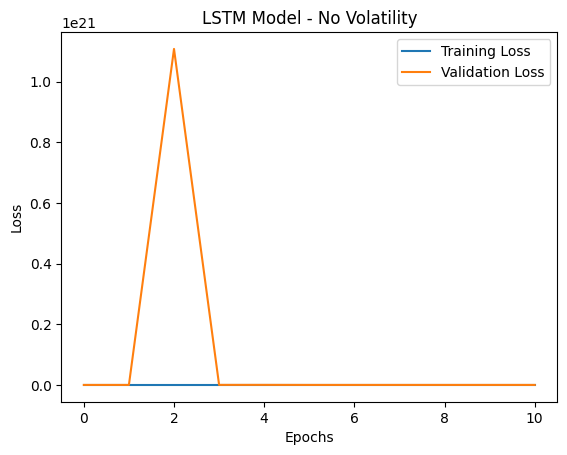

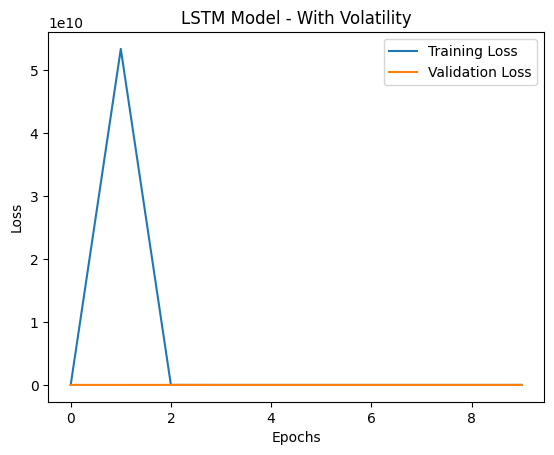

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# Plot training and validation loss for both models
def plot_loss(history, title):
  plt.plot(history.history['loss'], label='Training Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title(title)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

# Plot loss for both LSTM models
plot_loss(history_no_vol_lstm, "LSTM Model - No Volatility")
plot_loss(history_with_vol_lstm, "LSTM Model - With Volatility")

# Tyler Burguillos 11/05/24

31/31 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step
31/31 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step

LSTM Model Without Volatility - RMSE: 768.9502, R²: -13.1619, MAPE: 91.5901%
LSTM Model With Volatility - RMSE: 382.1351, R²: -2.4975, MAPE: 47.1970%

Lift Chart - LSTM Model No Volatility:


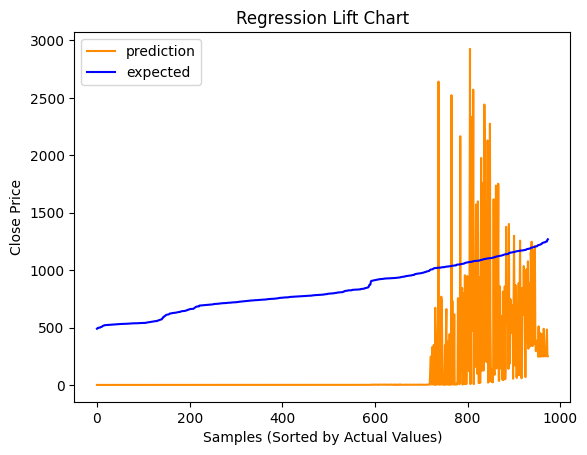

Lift Chart - LSTM Model With Volatility:


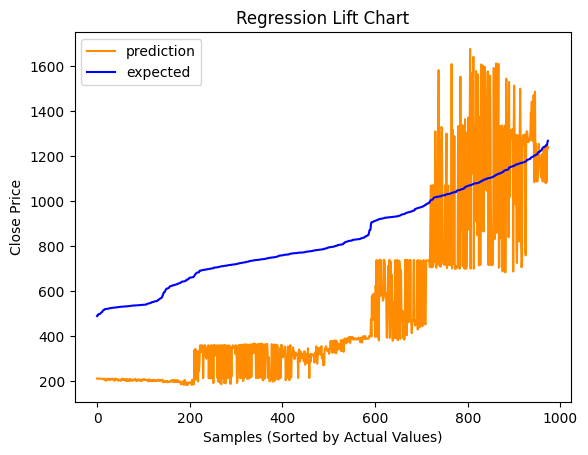

In [ ]:
# Function to calculate RMSE, R², and MAPE
def evaluate_model(model, X_test, y_test):
  y_pred = model.predict(X_test)

  rmse = np.sqrt(mean_squared_error(y_test, y_pred))
  r2 = r2_score(y_test, y_pred)
  mape = mean_absolute_percentage_error(y_test, y_pred)

  return y_pred, rmse, r2, mape

# Function to plot the regression lift chart
def chart_regression(pred, y, sort=True):
  t = pd.DataFrame({'pred': pred.flatten(), 'y': y.flatten()})
  if sort:
    t.sort_values(by=['y'], inplace=True)
  plt.plot(t['pred'].tolist(), label='prediction', color='darkorange')
  plt.plot(t['y'].tolist(), label='expected', color='blue')
  plt.ylabel('Close Price')
  plt.xlabel('Samples (Sorted by Actual Values)')
  plt.title('Regression Lift Chart')
  plt.legend()
  plt.show()

# Evaluate the LSTM models
y_pred_no_vol_lstm, rmse_no_vol_lstm, r2_no_vol_lstm, mape_no_vol_lstm = evaluate_model(
    model_no_vol_lstm, X_test_no_vol, y_test_no_vol_seq
)
y_pred_with_vol_lstm, rmse_with_vol_lstm, r2_with_vol_lstm, mape_with_vol_lstm = evaluate_model(
    model_with_vol_lstm, X_test_with_vol, y_test_with_vol_seq
)

# Print evaluation metrics
print(f"\nLSTM Model Without Volatility - RMSE: {rmse_no_vol_lstm:.4f}, R²: {r2_no_vol_lstm:.4f}, MAPE: {mape_no_vol_lstm:.4%}")
print(f"LSTM Model With Volatility - RMSE: {rmse_with_vol_lstm:.4f}, R²: {r2_with_vol_lstm:.4f}, MAPE: {mape_with_vol_lstm:.4%}")

# Plot lift charts for both LSTM models
print("\nLift Chart - LSTM Model No Volatility:")
chart_regression(y_pred_no_vol_lstm, y_test_no_vol_seq)

print("Lift Chart - LSTM Model With Volatility:")
chart_regression(y_pred_with_vol_lstm, y_test_with_vol_seq)

# Tyler Burguillos 11/05/24